## 演習問題１

一つ目のGANのデータを修正し、分布の一つの山に含まれるサンプルを他の山の約四倍にしてみましょう。この新たな数データで訓練を行った場合、学習結果にどのような影響があるかを調べて見ましょう。また、なんらかの問題が起こった時、これはGANに関するなんと言う問題の一種であるのかについても説明してください。

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## 分布とデータの準備

In [ ]:
def toy_distribution(n_batch, n=8):
    """
    n個だけ同心円上にガウス分布の山を持つ2D確率分布から
    n_batch個だけデータ点をサンプリングする関数
    返り値は2Dデータなので(n_batch,2)
    """
    # 0度、360/n度、360*2/n度、...、360*(n-1)/n度というn種の角度からランダムに選んだ角度のバッチ
    thetas = 2 * np.pi * np.random.randint(0, n, n_batch) / n

    # 修正点：分布の一つの山に含まれるサンプルを他の山の約四倍に
    thetas_append = 2 * np.pi * np.random.randint(6, 7, 1500) / 7

    thetas = np.append(thetas, thetas_append)
    
    # この角度方向に、原点から距離1だけ離れた位置座標のミニバッチ
    xs = (np.cos(thetas))[:,np.newaxis]
    ys = (np.sin(thetas))[:,np.newaxis]
    centers = np.concatenate([xs,ys], axis=-1)

    # 各位置を、次の二次元ガウス分布でランダムに散らす。
    # multivariate_normalという分布を調べて理解して見ましょう
    two_dim_gaussian = np.random.multivariate_normal(np.array([0,0]), np.array([[0.02,0], [0,0.02]]), n_batch+1500) / 2.

    return centers+two_dim_gaussian

shape of x_train (5500, 2)


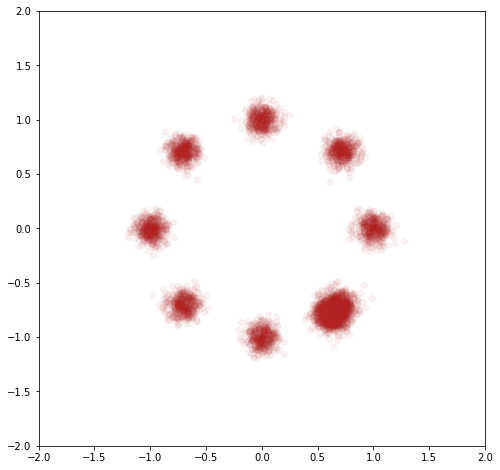

In [ ]:
# 4000個点をランダムサンプリング
x_train = toy_distribution(4000, n=8)
print('shape of x_train', x_train.shape)

# 散布図をプロット
plt.figure(figsize=(8,8))
plt.scatter(x_train[:,0], x_train[:,1], c='firebrick', alpha=0.05)
plt.xlim(-2,2)
plt.ylim(-2,2)
plt.show()

## モデルの準備

In [ ]:
latent_dim = 5

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape
from tensorflow.keras.layers import Dropout, Activation, LeakyReLU

# 識別器の作成
discriminator = Sequential()
discriminator.add(Dense(16, input_dim=2))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dense(16))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dense(16))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.2)) # 識別器には、Dropoutを入れておくと良い
discriminator.add(Dense(1, activation='sigmoid'))
 
# 生成器の作成
generator = Sequential()
generator.add(Dense(16, input_dim=latent_dim))
generator.add(Activation('relu'))
generator.add(Dense(16))
generator.add(Activation('relu'))
generator.add(Dense(16))
generator.add(Activation('relu'))
generator.add(Dense(2))

/Users/xujian/miniforge3/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
print('discriminator')
discriminator.summary()
print('generator')
generator.summary()

discriminator
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                48        
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 16)                272       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16)                0         
                                                                 
 dropout (Dropout)           (None, 16)   

In [ ]:
from tensorflow.keras.optimizers import Adam

# 今回はAdamを使用。ケースバイケース。
opt = Adam(learning_rate=0.0002, beta_1=0.5)

# 識別器Dをまずコンパイル
discriminator.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])

# 生成器Gの訓練のために、Gを凍結されたDに繋いだモデル(gan)を作る
discriminator.trainable = False

# Gの訓練のため、GとDを連結したモデルを作成
gan = Sequential()
gan.add(generator) # Kerasでは、モデルも層のように扱ってaddできたことを思い出す
gan.add(discriminator)

# ganのコンパイル。NSGANなのでbinary crossentropyであることに注意
gan.compile(loss='binary_crossentropy', optimizer=opt)

## 訓練の実装と実行

In [ ]:
# 訓練中に500個の検証用ノイズで、どの程度よくデータ点が生成されているかモニターする
z_val =  np.random.randn(500*latent_dim)
z_val = z_val.reshape((500, latent_dim))

# 各ステップでのDとGの誤差の値を記録するためのリスト。train関数の返り値にでもした方がいいが、途中で訓練を止められるようにするためここにおいた。
d_history = []
g_history = []

# 訓練のための関数
def train(x_train, n_epochs=200, n_batch=128):
    # 1エポックあたりの勾配法のステップ数
    bat_per_epoch = int(x_train.shape[0] / n_batch)
    # Dにとっての正解ラベルのミニバッチ
    y_real = np.ones((n_batch,))
    y_fake = np.zeros((n_batch,))

    # 指定のエポック数だけ学習を繰り返す
    for i in range(n_epochs):
        # １エポックあたりの反復数bat_per_epochだけ勾配降下を繰り返す
        for j in range(bat_per_epoch):
            # Dの訓練の1ステップ
            # データから、j番目のミニバッチを切り出す。データの並びに相関がないと仮定
            x_batch = x_train[j*n_batch:(j+1)*n_batch]

            # Gに入力するためのノイズのミニバッチ
            z =  np.random.randn(n_batch*latent_dim)
            z = z.reshape((n_batch, latent_dim))
            # そのノイズから生成されたフェイクデータ
            x_fake = generator.predict(z)

            # 実データとフェイクデータを連結したミニバッチ
            x_batch = np.concatenate([x_batch, x_fake], axis=0)
            # 対応する正解ラベルのミニバッチ
            y_batch = np.concatenate([y_real, y_fake], axis=0)

            # Dを訓練（１エポックではなく1ミニバッチでの学習）
            d_loss, _ = discriminator.train_on_batch(x_batch, y_batch)
            # リストに誤差関数の値を記録
            d_history.append(d_loss)

            # Gの訓練の1ステップ
            # Gに入力するためのノイズのミニバッチ
            z =  np.random.randn(n_batch*latent_dim)
            z = z.reshape((n_batch, latent_dim))
            # そのノイズをganモデルの前半を構成するGに入力して訓練。これに本物ラベルを教えることに注意
            g_loss = gan.train_on_batch(z, y_real)
            # リストに誤差関数の値を記録
            g_history.append(g_loss)

            # 各エポックの最初に、確認のために検証用ノイズでフェイクデータを生成・プロット
            if j  == 0:
                print('epoch', i)
                # lossもプロット
                print(d_loss, g_loss)
                # フェイクデータ
                x_val = generator.predict(z_val)
                # 散布図
                plt.figure(figsize=(6,6))
                plt.scatter(x_val[:,0],x_val[:,1], c='firebrick', alpha=0.2)
                plt.xlim(-3,3)
                plt.ylim(-3,3)
                plt.show()

2023-02-02 18:53:17.440487: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


epoch 0
0.7185888886451721 0.6693839430809021


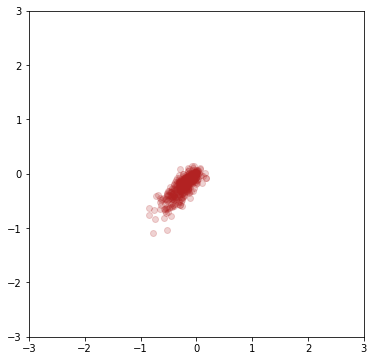

epoch 1
0.7111262679100037 0.6695431470870972


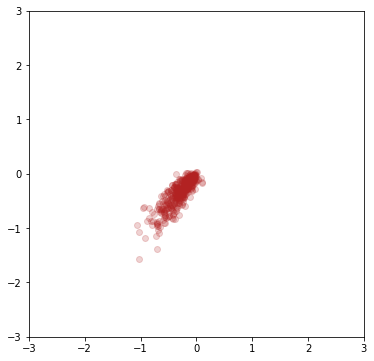

epoch 2
0.7007907629013062 0.6760851144790649


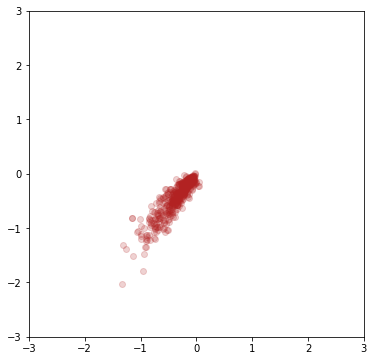

epoch 3
0.694121778011322 0.6931045055389404


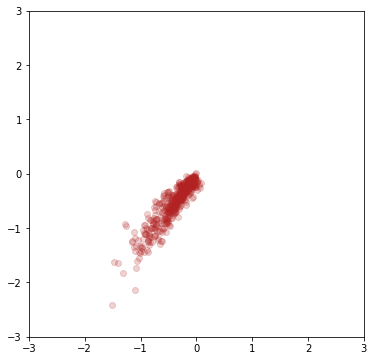

epoch 4
0.6830186247825623 0.7165151834487915


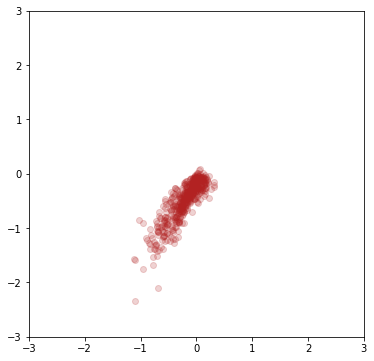

epoch 5
0.686472475528717 0.698133111000061


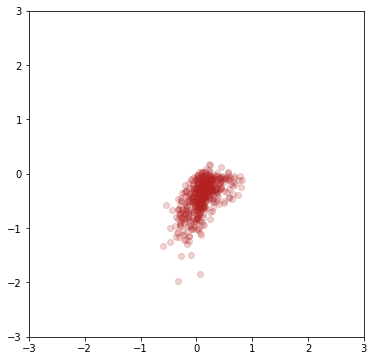

epoch 6
0.7018847465515137 0.6661841869354248


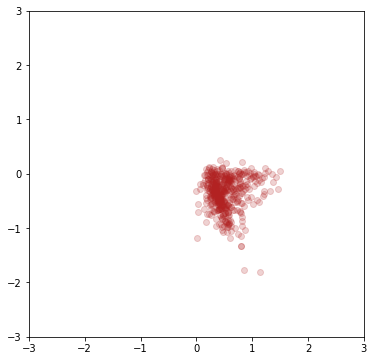

epoch 7
0.7008148431777954 0.6682279706001282


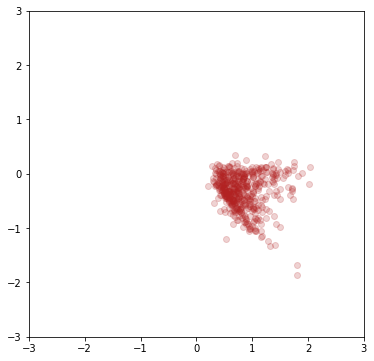

epoch 8
0.6830493211746216 0.710056483745575


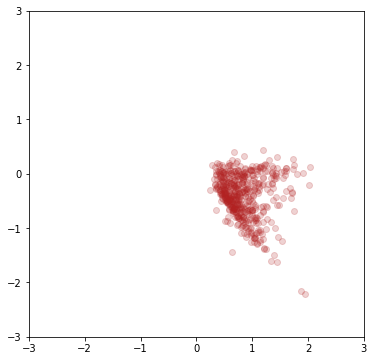

epoch 9
0.6705259680747986 0.7238748073577881


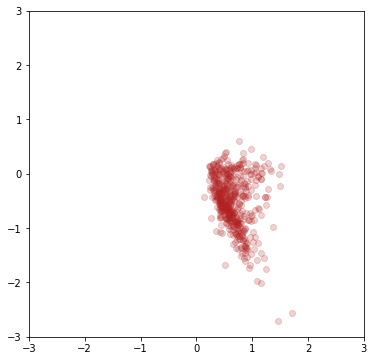

epoch 10
0.6625257134437561 0.7212977409362793


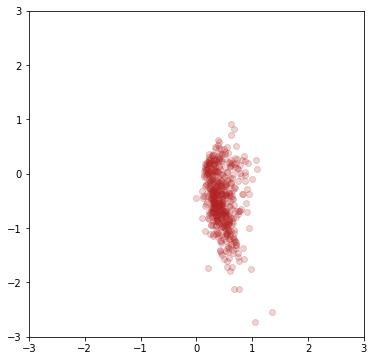

epoch 11
0.6765086650848389 0.6920733451843262


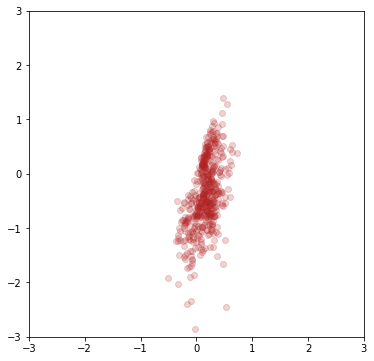

epoch 12
0.6854211688041687 0.6804553270339966


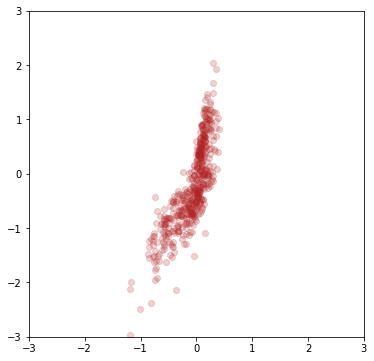

epoch 13
0.6905413866043091 0.6820358037948608


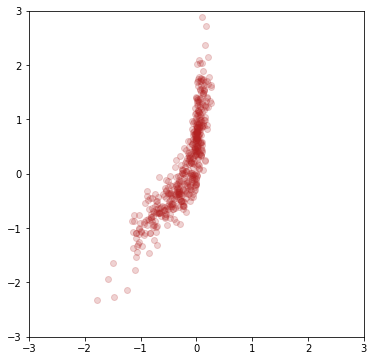

epoch 14
0.6957449316978455 0.6914787292480469


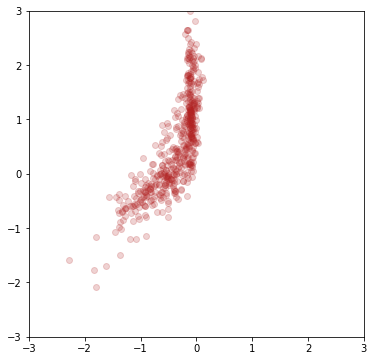

epoch 15
0.6795461177825928 0.7286137938499451


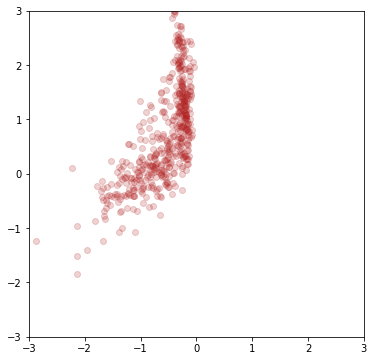

epoch 16
0.6697837710380554 0.7525479793548584


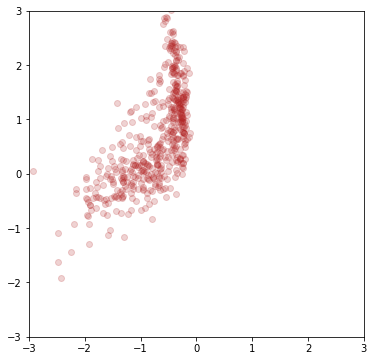

epoch 17
0.657650887966156 0.7793486714363098


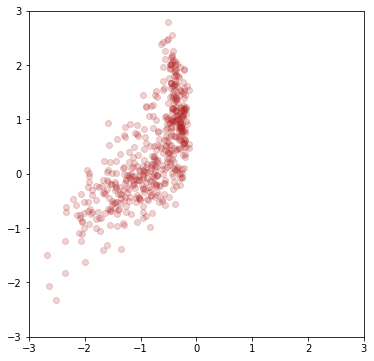

epoch 18
0.6442906856536865 0.7957812547683716


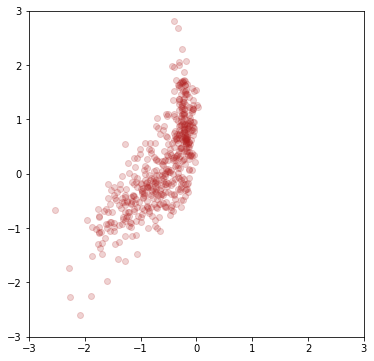

epoch 19
0.6554812788963318 0.7814112305641174


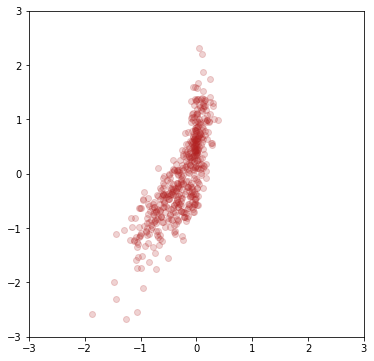

epoch 20
0.7314128279685974 0.6425861120223999


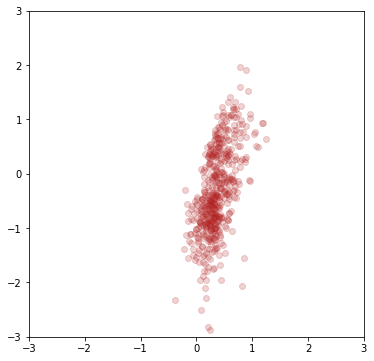

epoch 21
0.800764799118042 0.5878442525863647


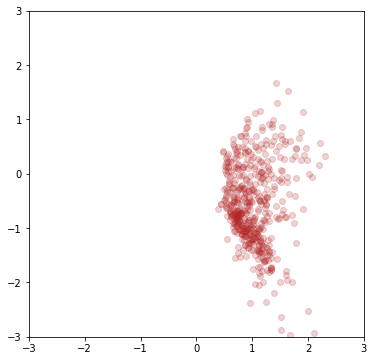

epoch 22
0.7531808614730835 0.6712144613265991


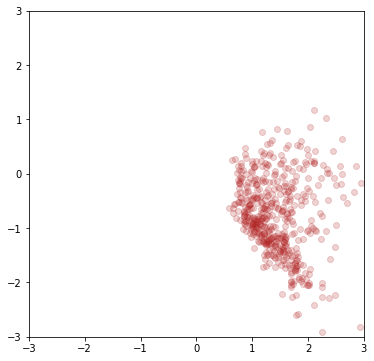

epoch 23
0.6918914318084717 0.8364960551261902


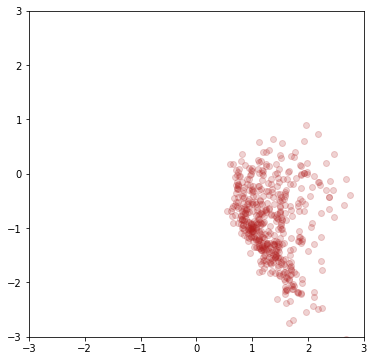

epoch 24
0.6649230718612671 0.8712626695632935


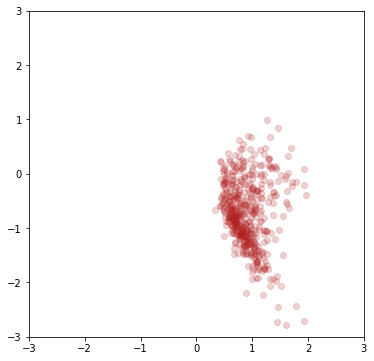

epoch 25
0.6725232005119324 0.8111567497253418


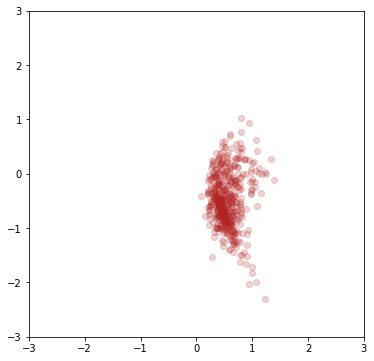

epoch 26
0.6826193928718567 0.7540048360824585


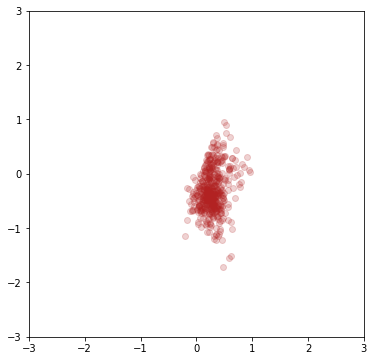

epoch 27
0.6881981492042542 0.6932751536369324


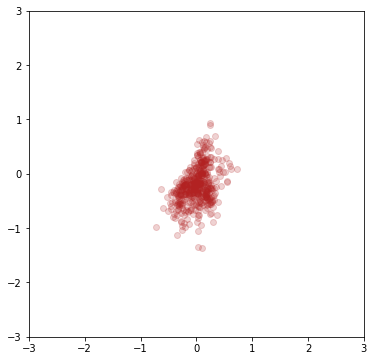

epoch 28
0.6911059617996216 0.6763408184051514


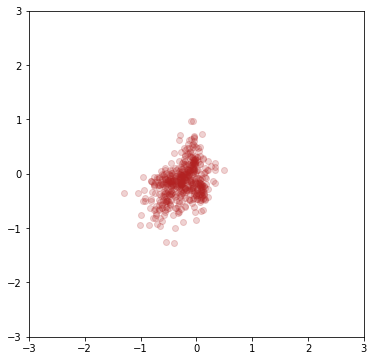

epoch 29
0.6888891458511353 0.6775188446044922


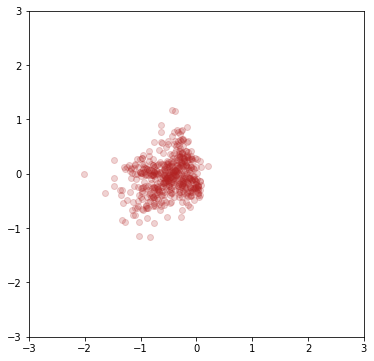

epoch 30
0.6754533648490906 0.6949591040611267


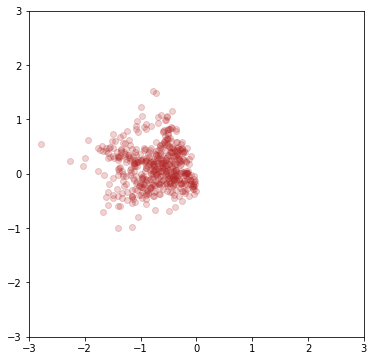

epoch 31
0.6657101511955261 0.7046135663986206


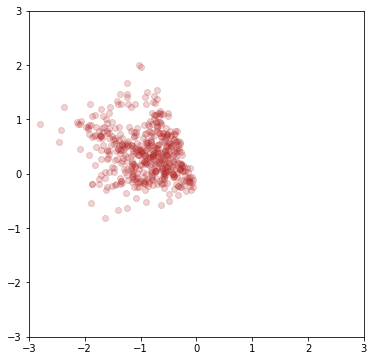

epoch 32
0.6462454199790955 0.7313976883888245


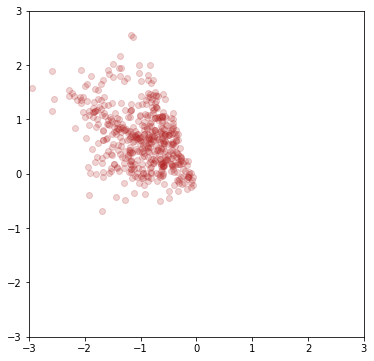

epoch 33
0.6333062648773193 0.7549476027488708


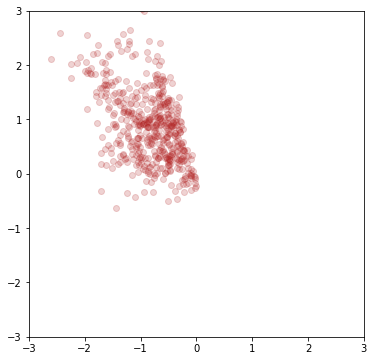

epoch 34
0.6162510514259338 0.7715820074081421


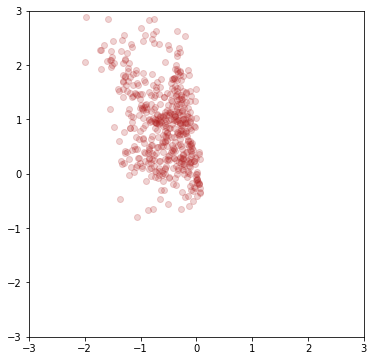

epoch 35
0.6388659477233887 0.7454652190208435


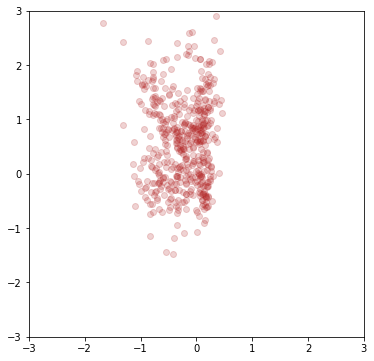

epoch 36
0.7111570835113525 0.6476281881332397


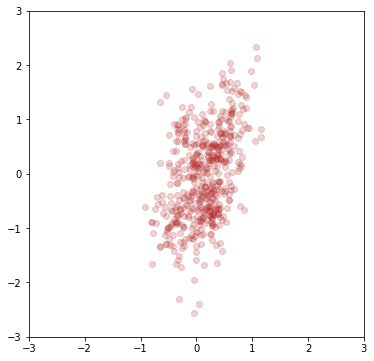

epoch 37
0.7935714721679688 0.5507507920265198


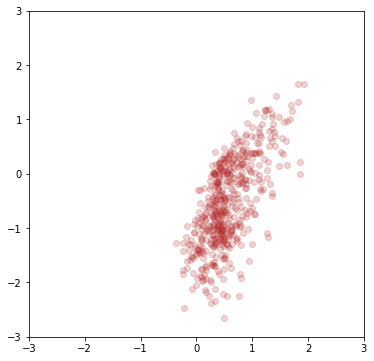

epoch 38
0.7937570810317993 0.5700017809867859


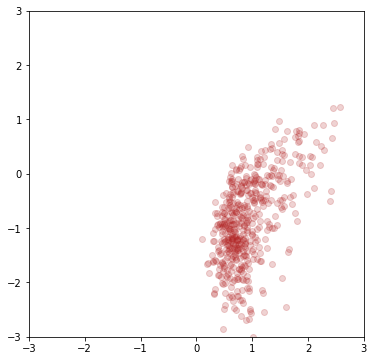

epoch 39
0.7502179145812988 0.6584374904632568


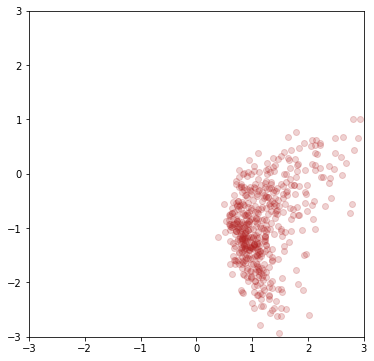

epoch 40
0.7032674551010132 0.7944715619087219


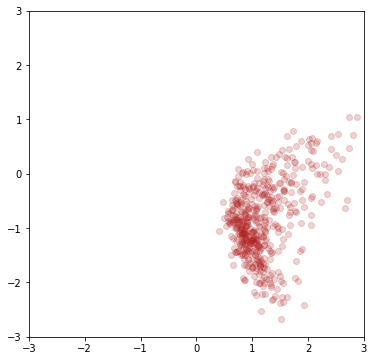

epoch 41
0.6850411891937256 0.8348019123077393


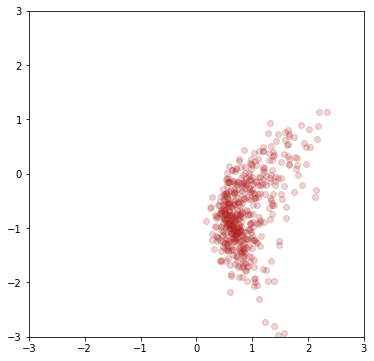

epoch 42
0.6926367282867432 0.7843811511993408


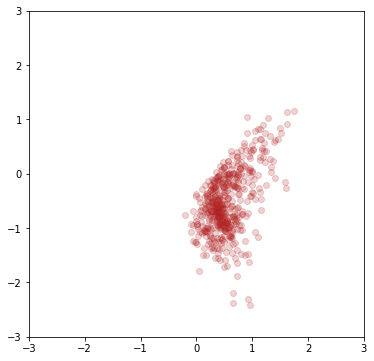

epoch 43
0.7059999108314514 0.75286465883255


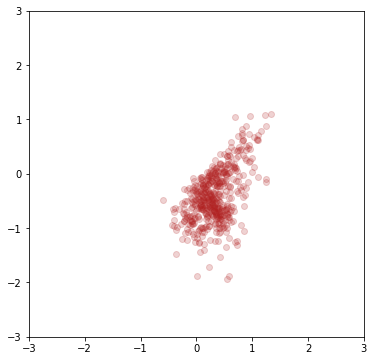

epoch 44
0.706382155418396 0.7214441895484924


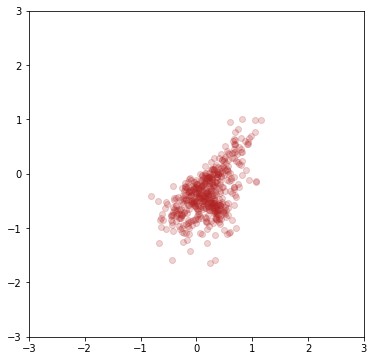

epoch 45
0.7049517631530762 0.7083579897880554


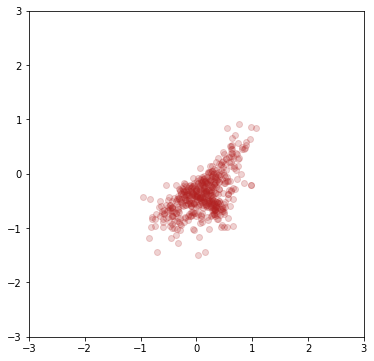

epoch 46
0.7059420943260193 0.7016275525093079


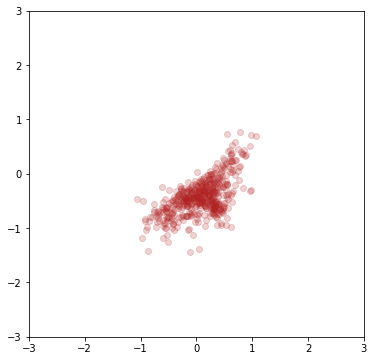

epoch 47
0.6997397541999817 0.7019399404525757


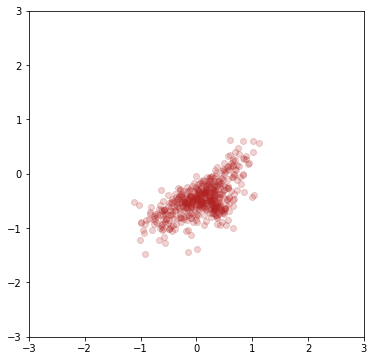

epoch 48
0.695787787437439 0.702238917350769


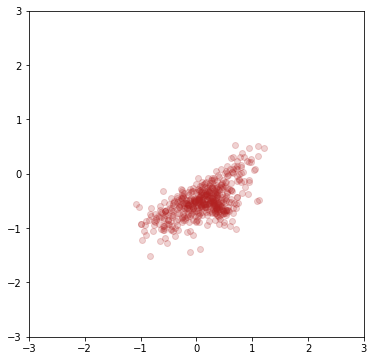

epoch 49
0.6947445869445801 0.7034536600112915


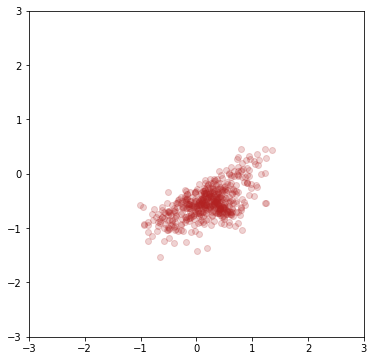

epoch 50
0.694284200668335 0.7045843601226807


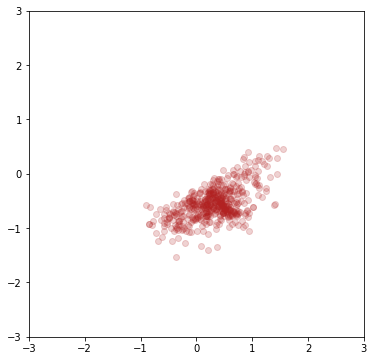

epoch 51
0.6972236633300781 0.7063354253768921


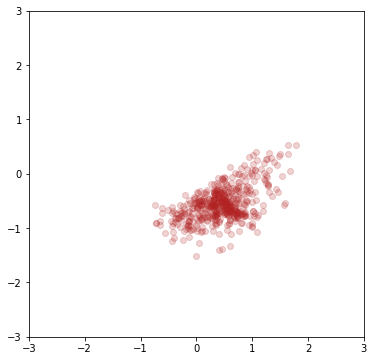

epoch 52
0.691912055015564 0.7119145393371582


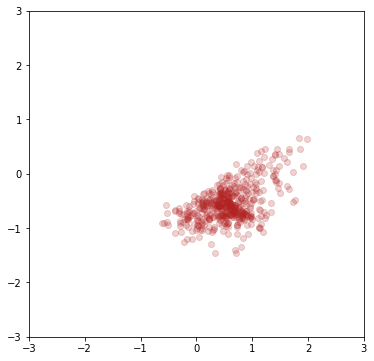

epoch 53
0.6914176940917969 0.7173796892166138


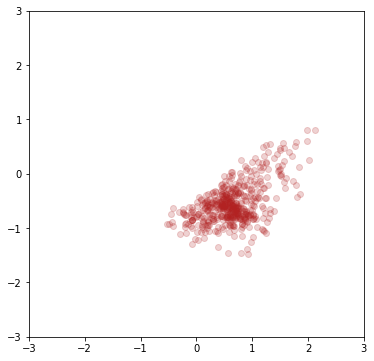

epoch 54
0.6808924674987793 0.7284091114997864


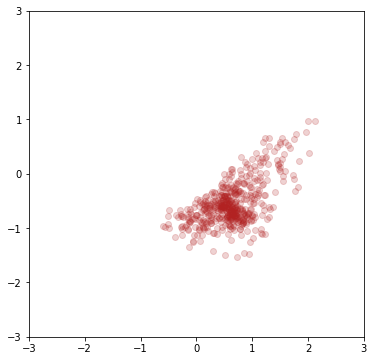

epoch 55
0.6793686747550964 0.7450538873672485


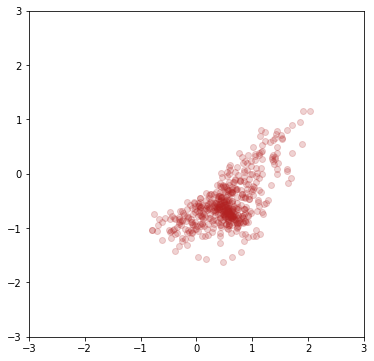

epoch 56
0.6785047054290771 0.7429496049880981


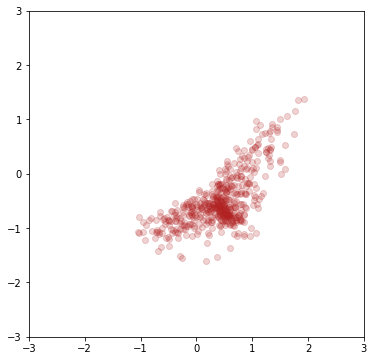

epoch 57
0.6805722117424011 0.7329272627830505


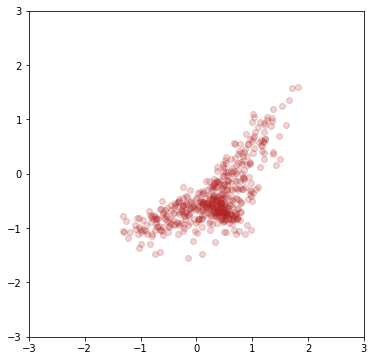

epoch 58
0.6821916699409485 0.7254230976104736


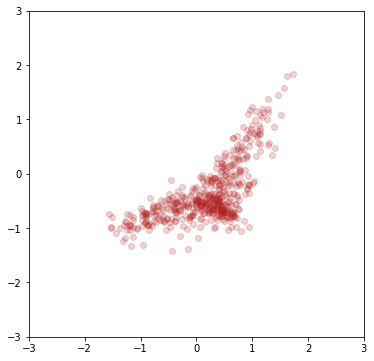

epoch 59
0.6855738759040833 0.7267584204673767


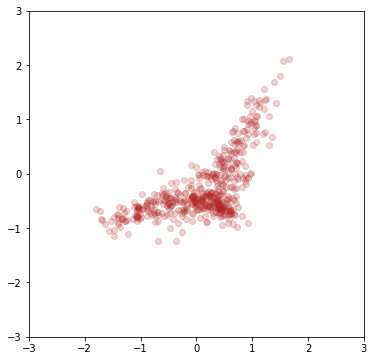

epoch 60
0.6847172379493713 0.7146526575088501


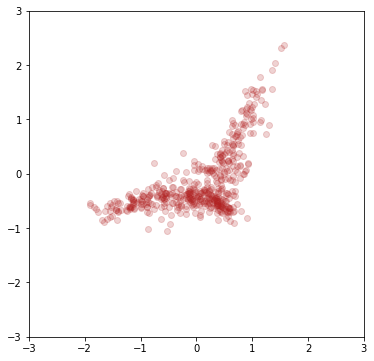

epoch 61
0.6880043745040894 0.7126560807228088


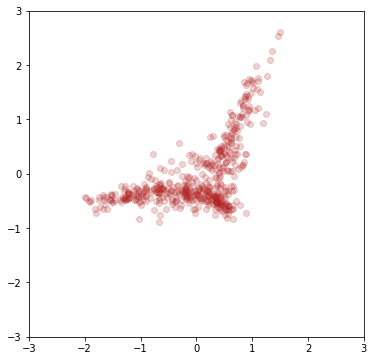

epoch 62
0.6882795691490173 0.7102037072181702


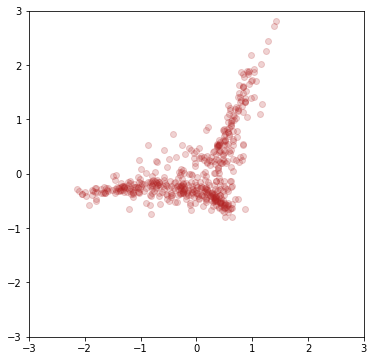

epoch 63
0.6864691376686096 0.7068088054656982


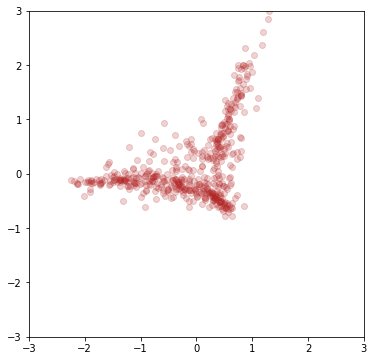

epoch 64
0.6849006414413452 0.7084454298019409


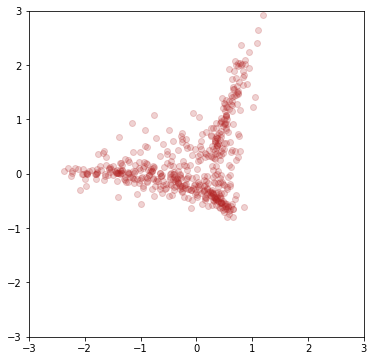

epoch 65
0.685514509677887 0.7076985836029053


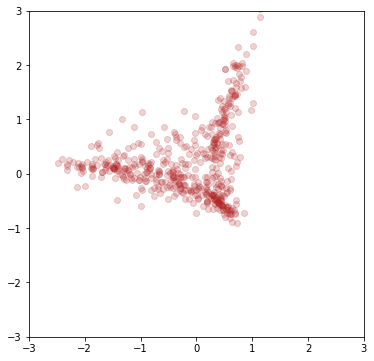

epoch 66
0.6799135804176331 0.7117746472358704


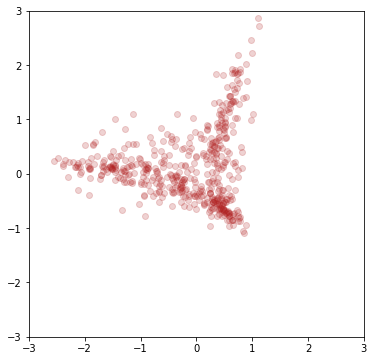

epoch 67
0.6882641315460205 0.7052560448646545


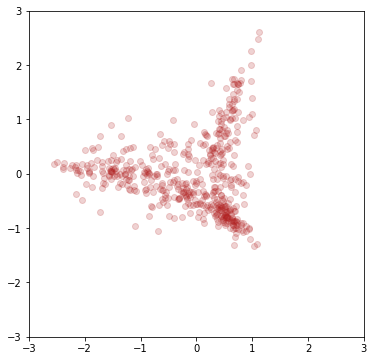

epoch 68
0.6987962126731873 0.7011942863464355


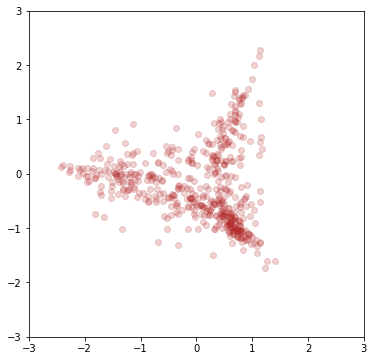

epoch 69
0.7109800577163696 0.6733580827713013


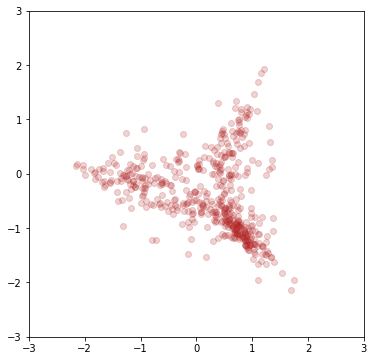

epoch 70
0.718066394329071 0.6818023920059204


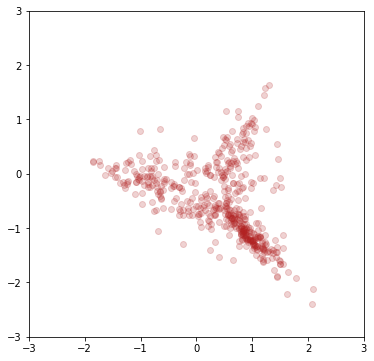

epoch 71
0.7046862840652466 0.6969360113143921


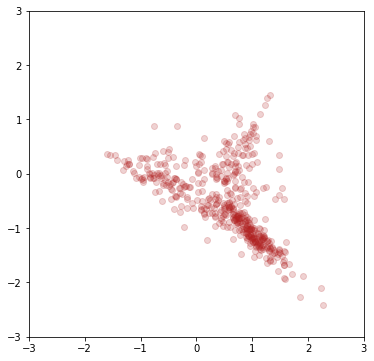

epoch 72
0.7007696628570557 0.7136799097061157


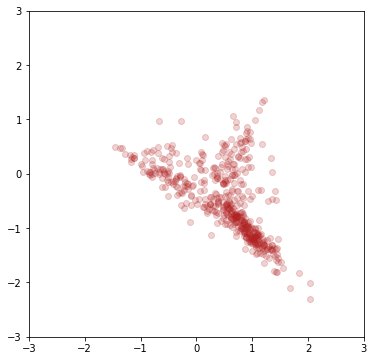

epoch 73
0.6926893591880798 0.7223918437957764


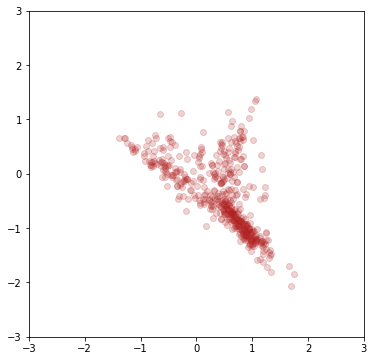

epoch 74
0.6869695782661438 0.7081353664398193


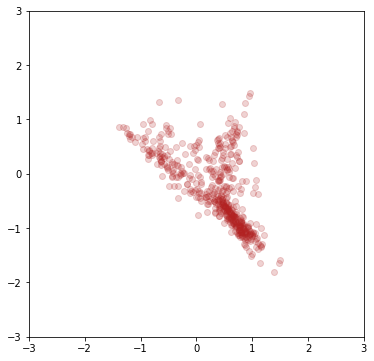

epoch 75
0.6880291700363159 0.6967861652374268


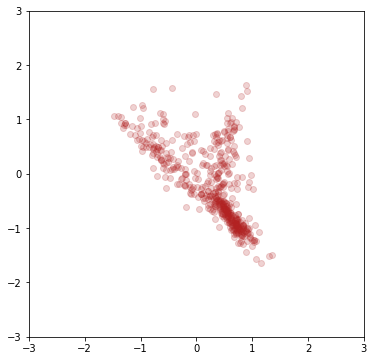

epoch 76
0.6849226355552673 0.6927098035812378


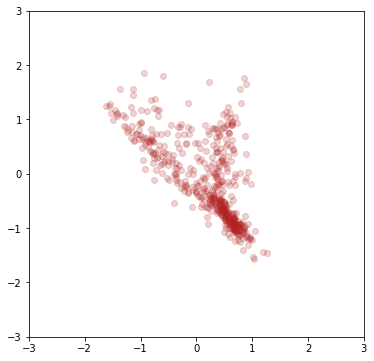

epoch 77
0.6822139620780945 0.6886247992515564


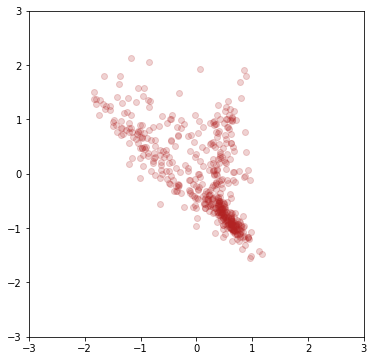

epoch 78
0.6860841512680054 0.6916171312332153


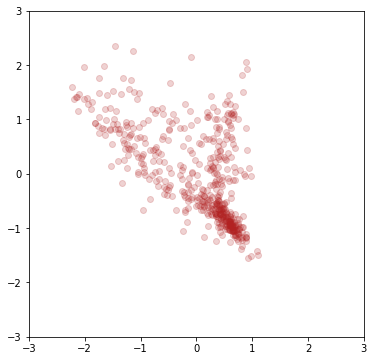

epoch 79
0.6875030398368835 0.6852236986160278


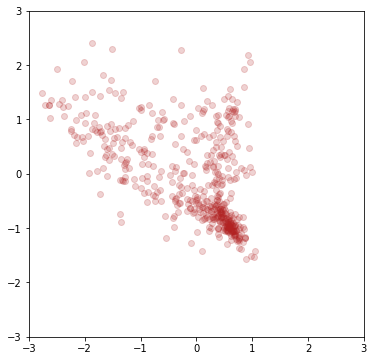

epoch 80
0.68605637550354 0.6861482262611389


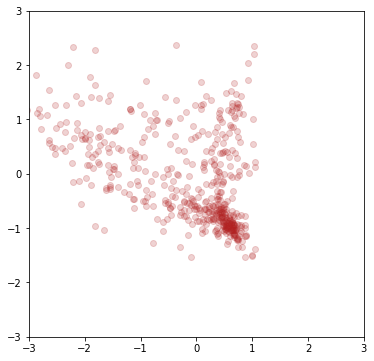

epoch 81
0.6911651492118835 0.6957781910896301


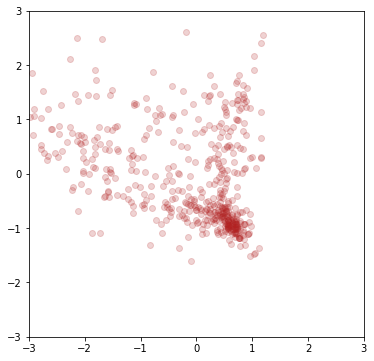

epoch 82
0.6885592937469482 0.7010613083839417


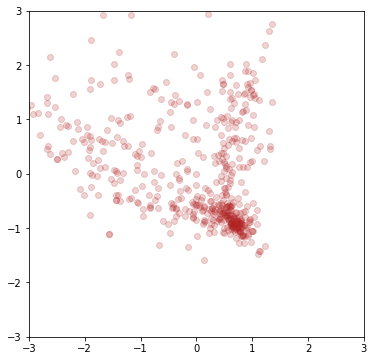

epoch 83
0.6914070248603821 0.7030942440032959


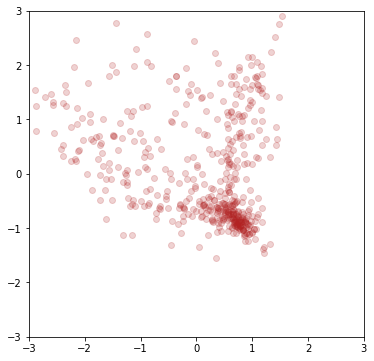

epoch 84
0.6914604306221008 0.704477846622467


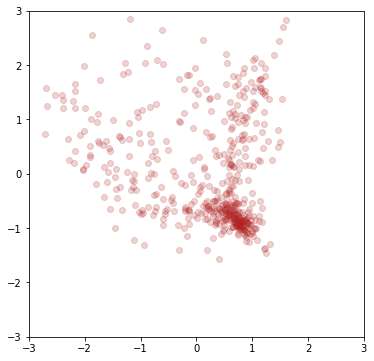

epoch 85
0.6857010722160339 0.7060323357582092


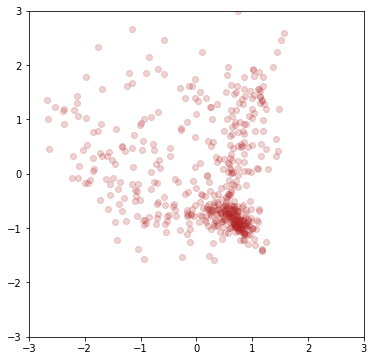

epoch 86
0.6931698322296143 0.708371639251709


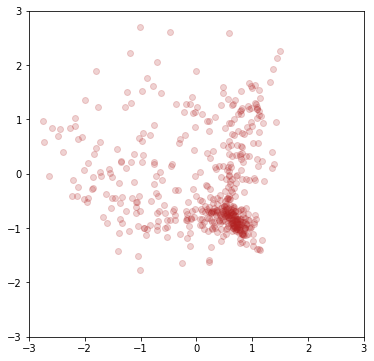

epoch 87
0.6923776268959045 0.7120901346206665


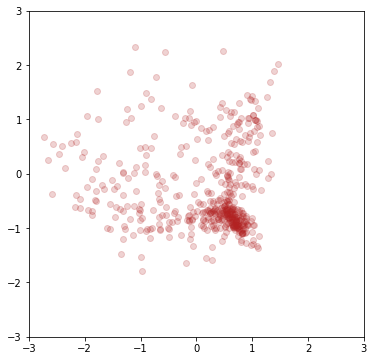

epoch 88
0.6891212463378906 0.7125248908996582


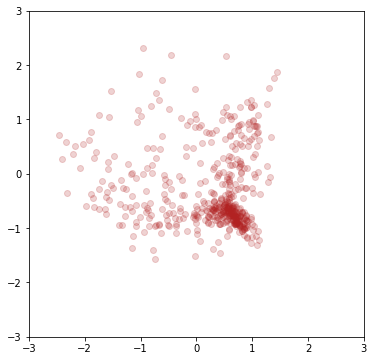

epoch 89
0.6899531483650208 0.7119236588478088


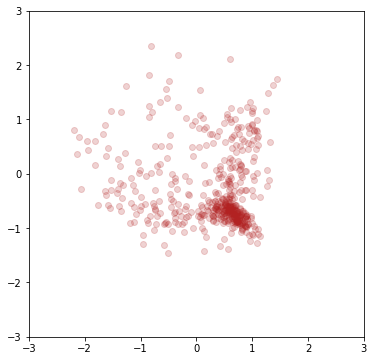

epoch 90
0.6889989972114563 0.7084957957267761


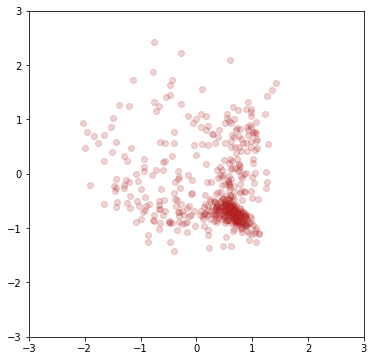

epoch 91
0.6875857710838318 0.7083919644355774


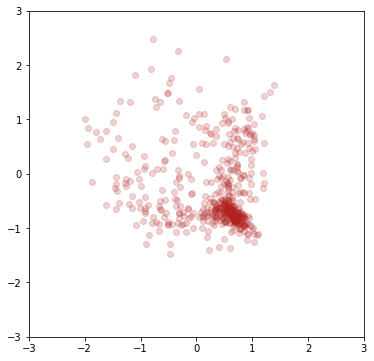

epoch 92
0.6824186444282532 0.7070724368095398


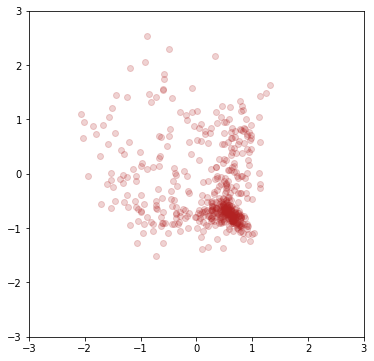

epoch 93
0.6869232058525085 0.703662633895874


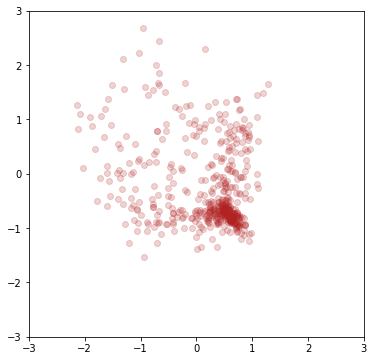

epoch 94
0.6858890056610107 0.7024279832839966


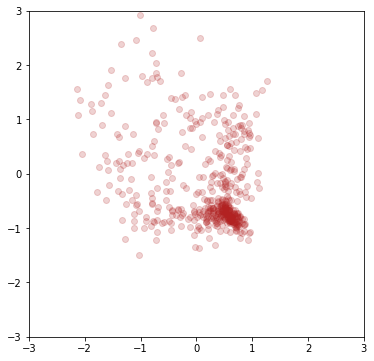

epoch 95
0.6831827759742737 0.6949838399887085


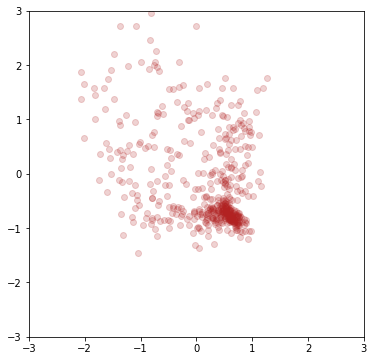

epoch 96
0.6861114501953125 0.6944326162338257


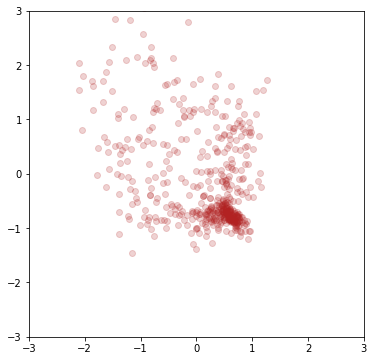

epoch 97
0.6839288473129272 0.6904035806655884


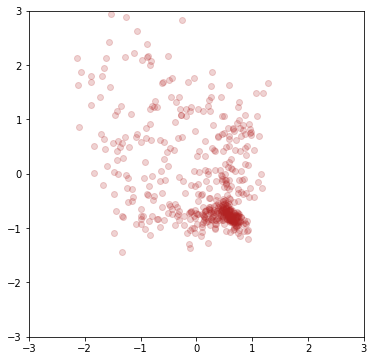

epoch 98
0.68576979637146 0.6961511373519897


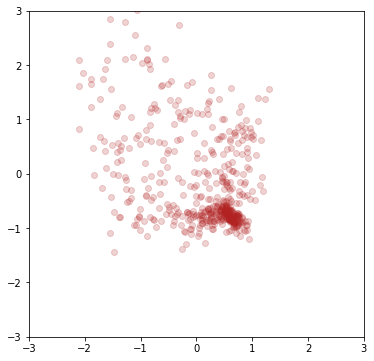

epoch 99
0.6849300861358643 0.6976704597473145


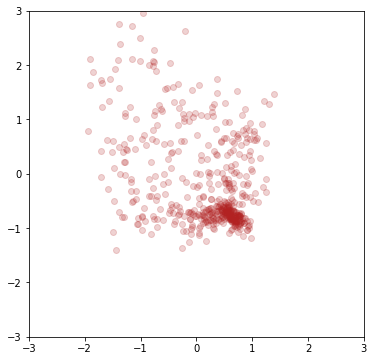

epoch 100
0.684471845626831 0.695749819278717


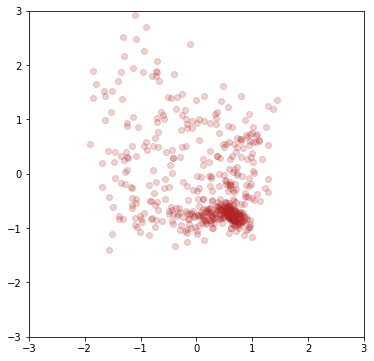

epoch 101
0.6834919452667236 0.7014813423156738


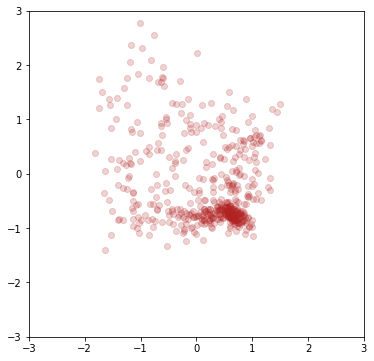

epoch 102
0.68115234375 0.6975185871124268


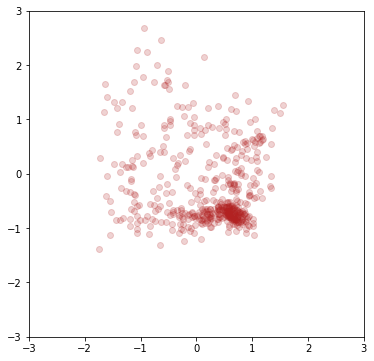

epoch 103
0.6843721270561218 0.7002078294754028


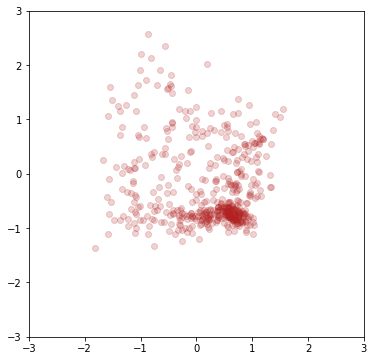

epoch 104
0.6832340955734253 0.7013043165206909


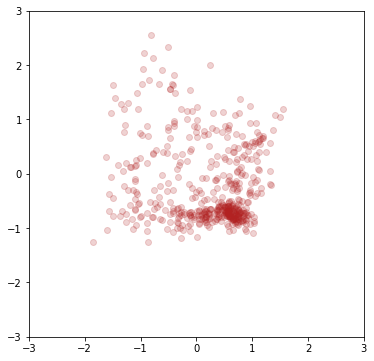

epoch 105
0.6863821148872375 0.7035043239593506


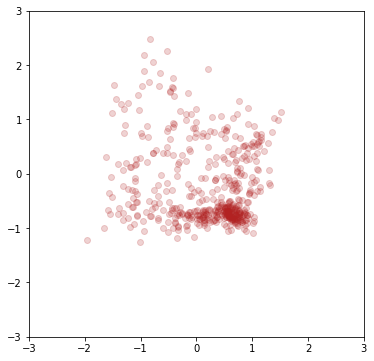

epoch 106
0.6827833652496338 0.6990370750427246


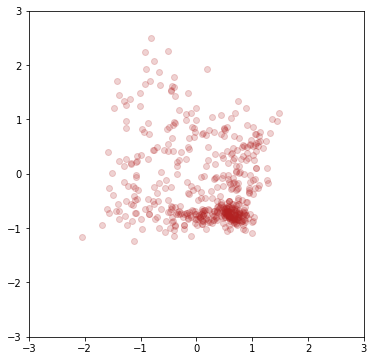

epoch 107
0.6839008927345276 0.7010217905044556


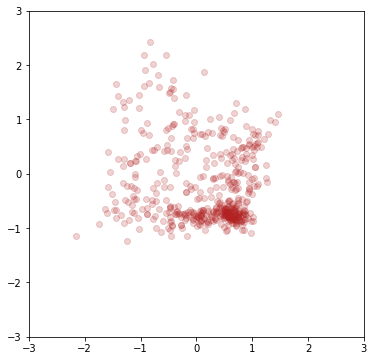

epoch 108
0.6826867461204529 0.7012118697166443


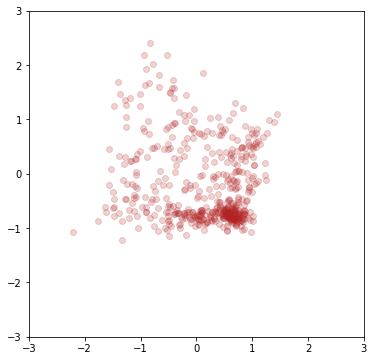

epoch 109
0.6833177208900452 0.6999991536140442


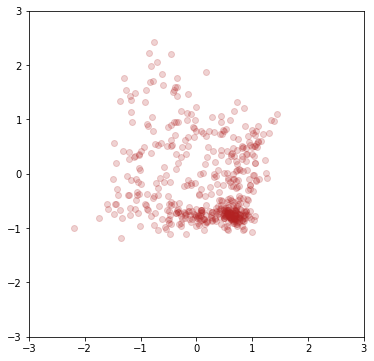

epoch 110
0.6835583448410034 0.6971901655197144


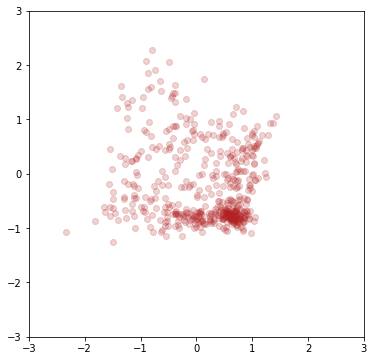

epoch 111
0.683438241481781 0.696637749671936


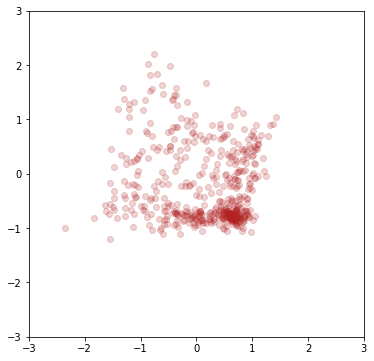

epoch 112
0.6839343905448914 0.6998288035392761


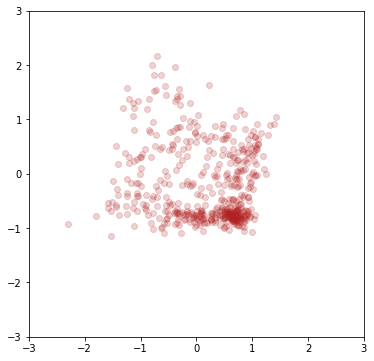

epoch 113
0.683574378490448 0.697829008102417


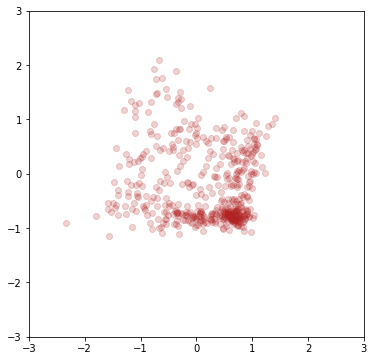

epoch 114
0.6839266419410706 0.6964694857597351


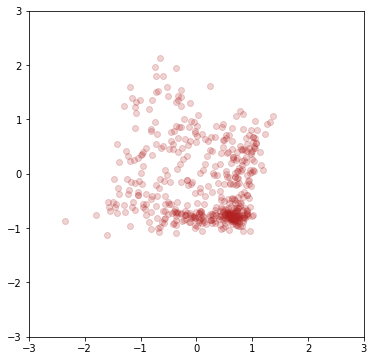

epoch 115
0.683750331401825 0.69926917552948


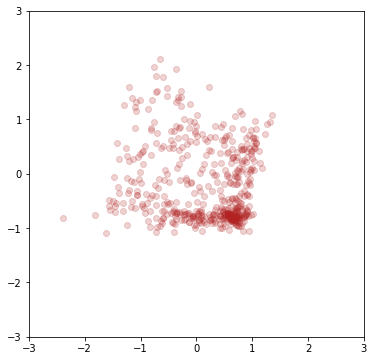

epoch 116
0.6851551532745361 0.6981803178787231


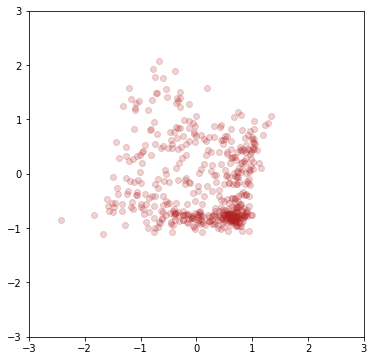

epoch 117
0.6844289898872375 0.7017767429351807


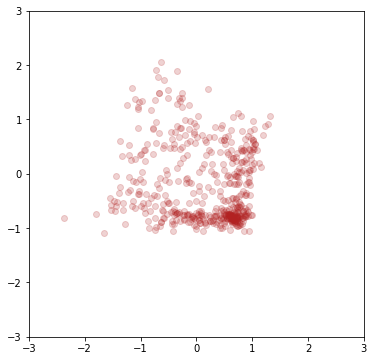

epoch 118
0.6844241619110107 0.6941134929656982


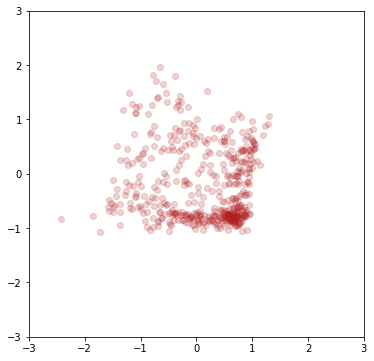

epoch 119
0.683347761631012 0.6962608098983765


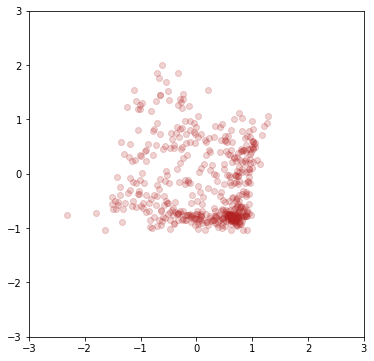

epoch 120
0.6830664277076721 0.6991129517555237


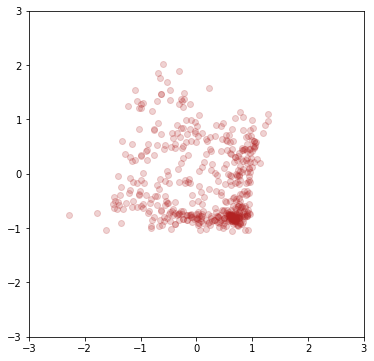

epoch 121
0.6837897300720215 0.6952823400497437


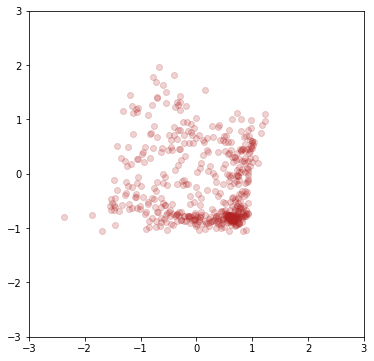

epoch 122
0.681769847869873 0.7011808753013611


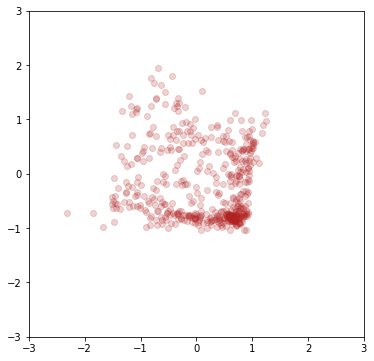

epoch 123
0.6843671202659607 0.7022407650947571


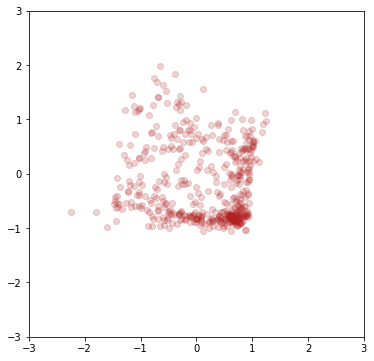

epoch 124
0.6847333312034607 0.7042165994644165


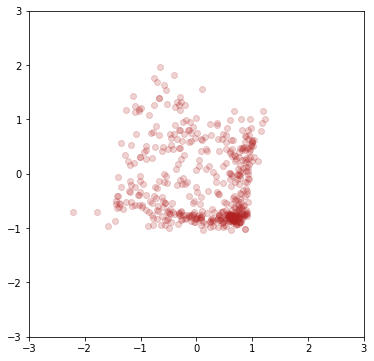

epoch 125
0.6817569136619568 0.7059884667396545


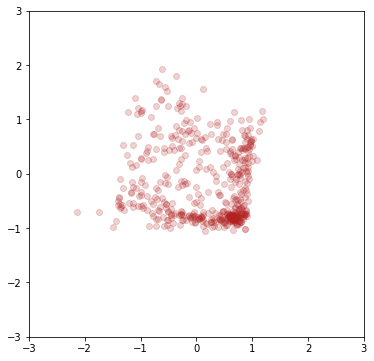

epoch 126
0.6818633079528809 0.702392578125


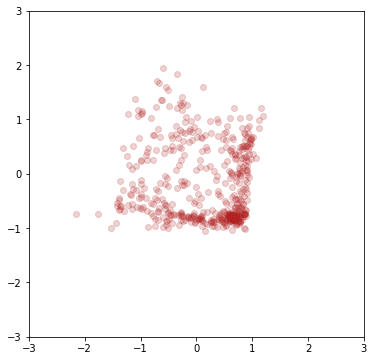

epoch 127
0.6830402612686157 0.7033031582832336


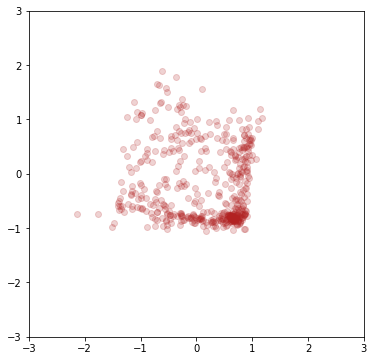

epoch 128
0.6830645799636841 0.702782154083252


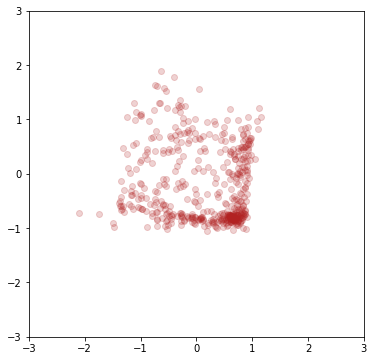

epoch 129
0.6831724643707275 0.7023801207542419


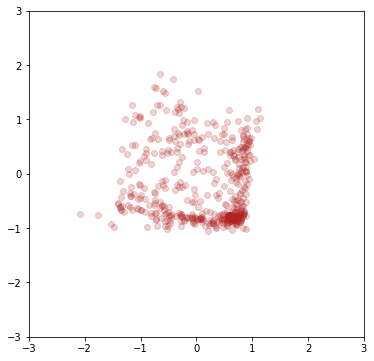

epoch 130
0.6851746439933777 0.7069247961044312


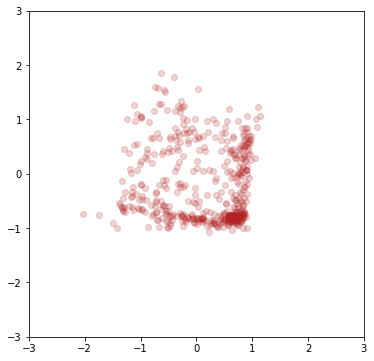

epoch 131
0.6869354248046875 0.7015525698661804


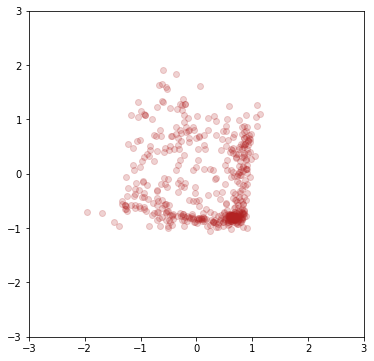

epoch 132
0.6816189289093018 0.703395664691925


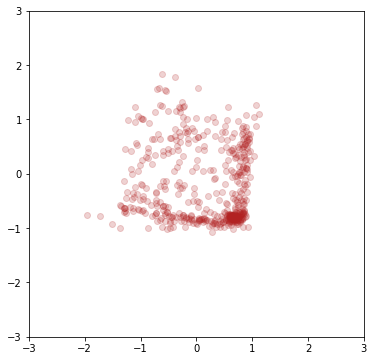

epoch 133
0.686445415019989 0.7097625136375427


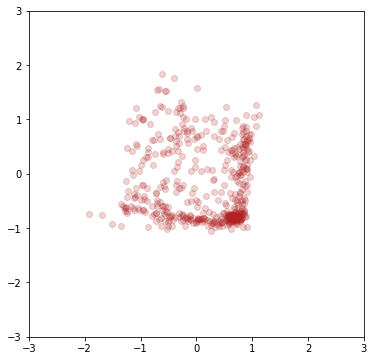

epoch 134
0.6841258406639099 0.7001320123672485


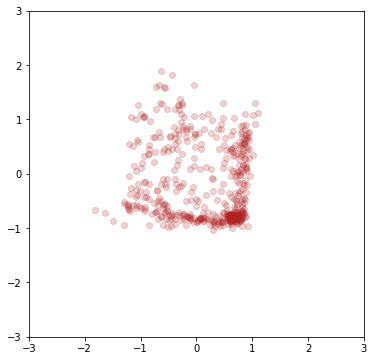

epoch 135
0.6857765316963196 0.7019851207733154


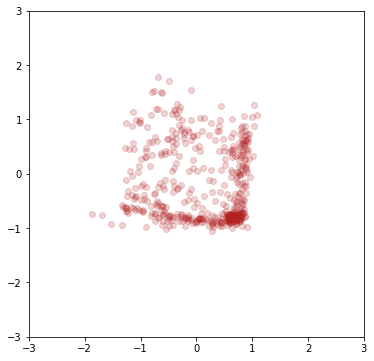

epoch 136
0.6768839955329895 0.7034156918525696


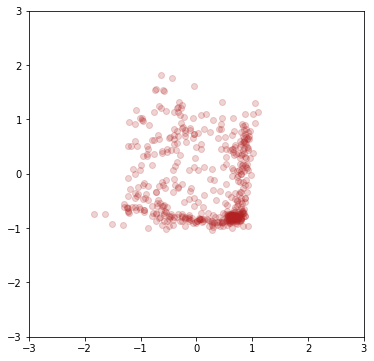

epoch 137
0.682630717754364 0.7045671939849854


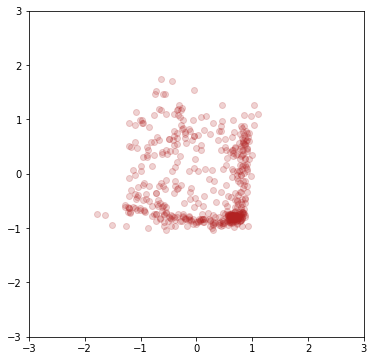

epoch 138
0.6807185411453247 0.7046208381652832


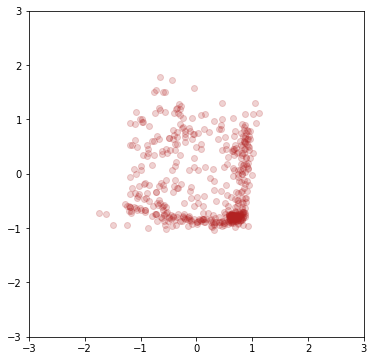

epoch 139
0.6818785071372986 0.7037582397460938


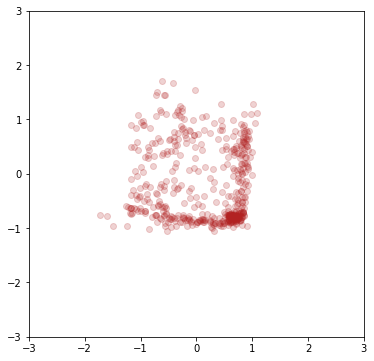

epoch 140
0.6811006665229797 0.7061266303062439


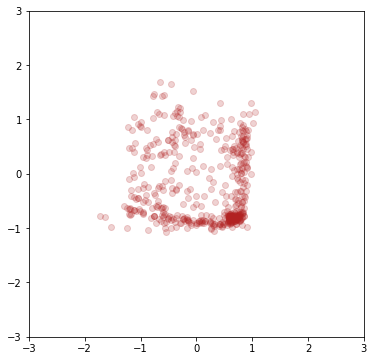

epoch 141
0.6834123134613037 0.7022059559822083


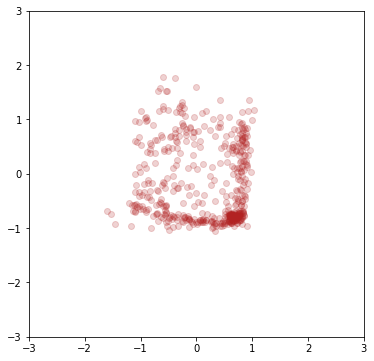

epoch 142
0.6823498606681824 0.7092281579971313


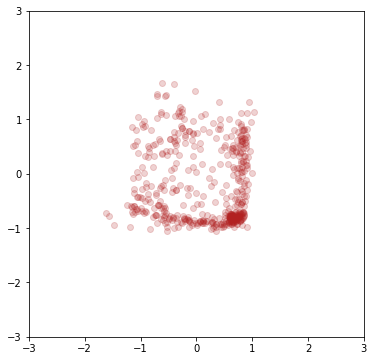

epoch 143
0.6792751550674438 0.7085220217704773


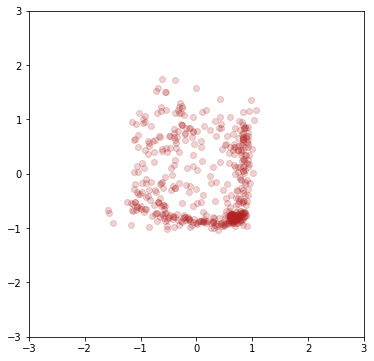

epoch 144
0.6801872253417969 0.7016549706459045


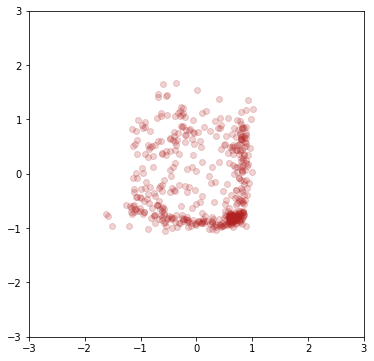

epoch 145
0.6801877021789551 0.7020508050918579


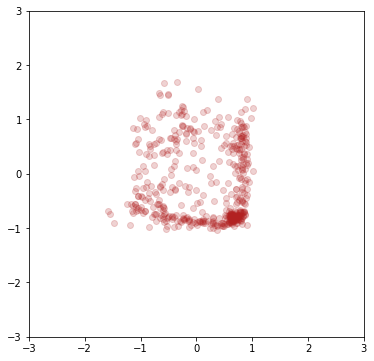

epoch 146
0.6805962920188904 0.7081747651100159


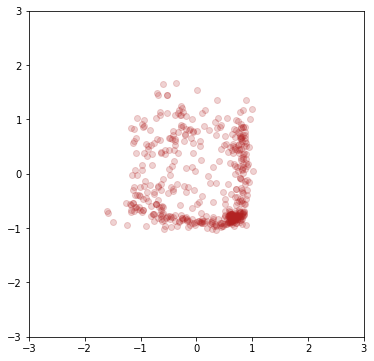

epoch 147
0.6827081441879272 0.7041084170341492


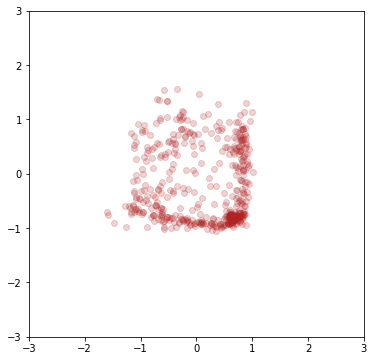

epoch 148
0.6840783953666687 0.7068291306495667


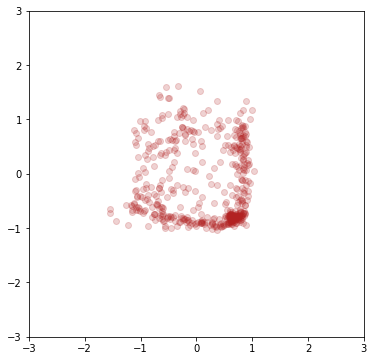

epoch 149
0.6823827624320984 0.705424427986145


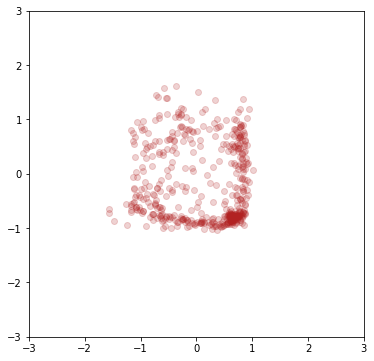

epoch 150
0.682178795337677 0.7097020149230957


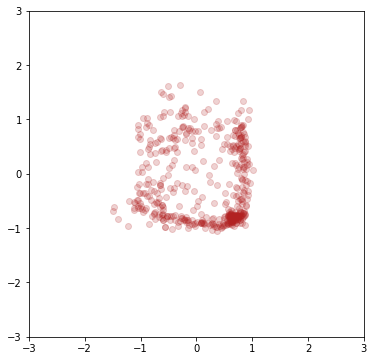

epoch 151
0.6826319098472595 0.7101391553878784


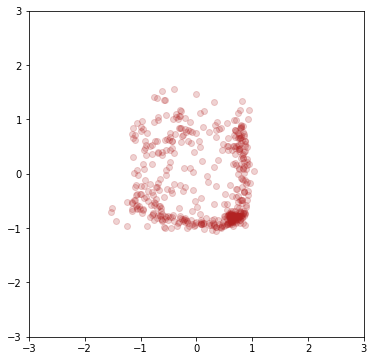

epoch 152
0.6819767951965332 0.7092394232749939


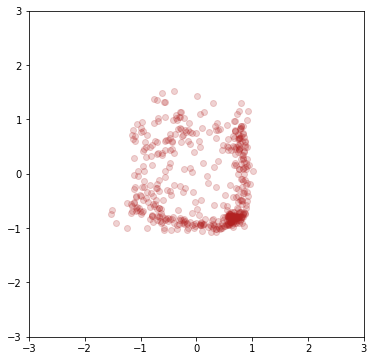

epoch 153
0.6804945468902588 0.7102749347686768


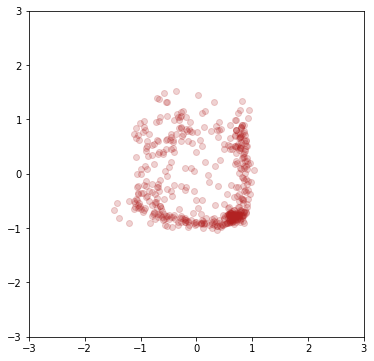

epoch 154
0.6820856332778931 0.7106037735939026


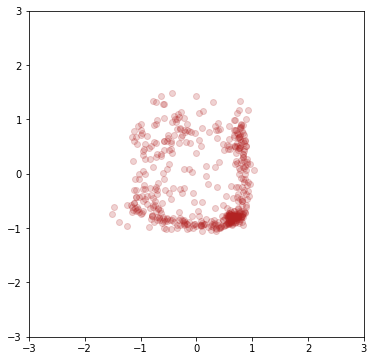

epoch 155
0.6856763362884521 0.7099633812904358


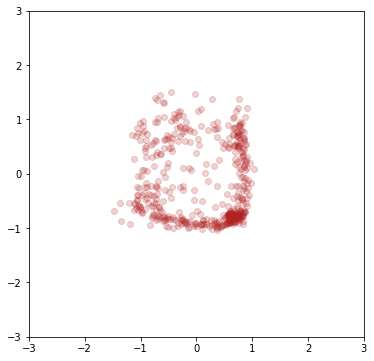

epoch 156
0.6827338337898254 0.706188440322876


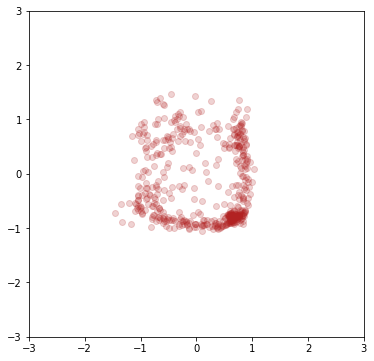

epoch 157
0.6866869926452637 0.7082350254058838


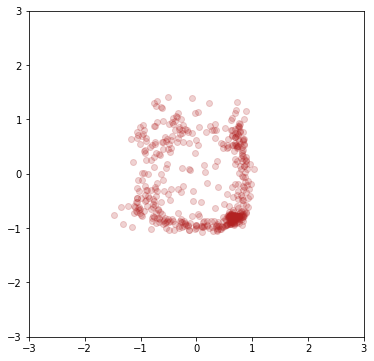

epoch 158
0.6815251111984253 0.7077052593231201


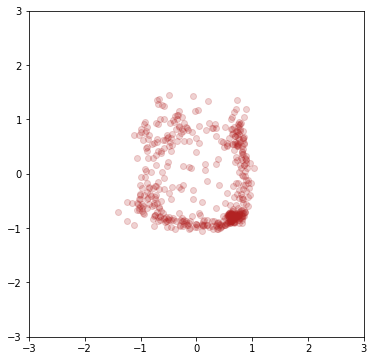

epoch 159
0.685624361038208 0.7053135633468628


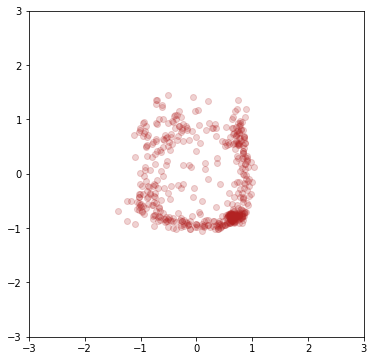

epoch 160
0.6860889196395874 0.7079421281814575


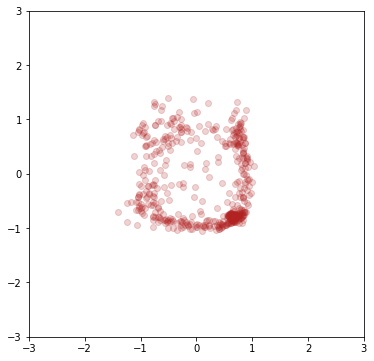

epoch 161
0.6863796710968018 0.7064194679260254


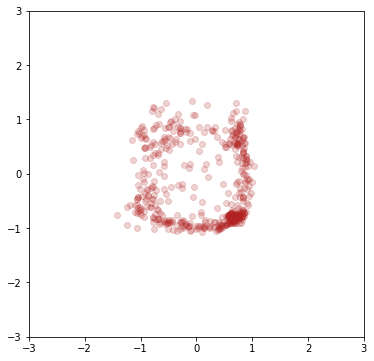

epoch 162
0.6891227960586548 0.7001075744628906


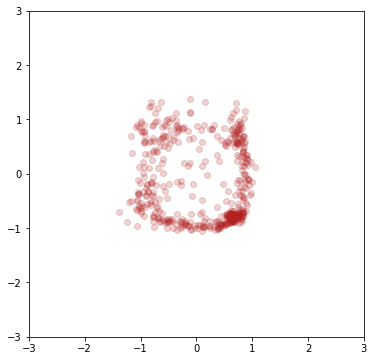

epoch 163
0.6859890818595886 0.7119593024253845


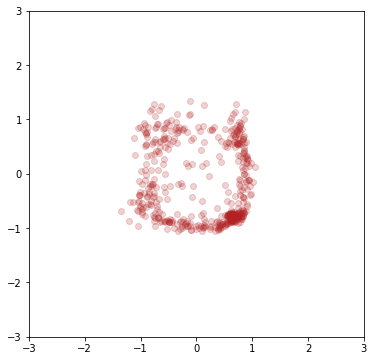

epoch 164
0.6866919994354248 0.7135822772979736


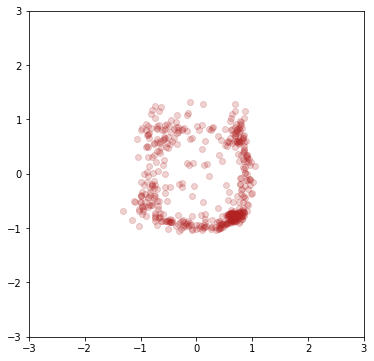

epoch 165
0.6867449879646301 0.7105145454406738


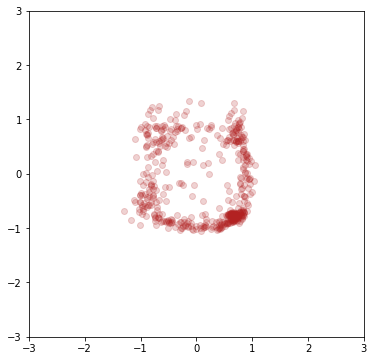

epoch 166
0.6837232708930969 0.7026911973953247


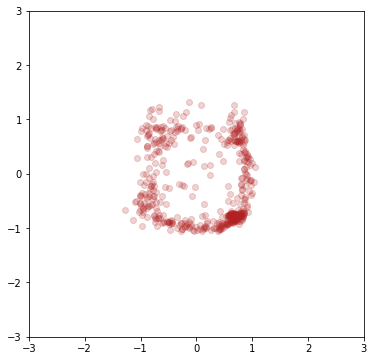

epoch 167
0.6862422227859497 0.6980688571929932


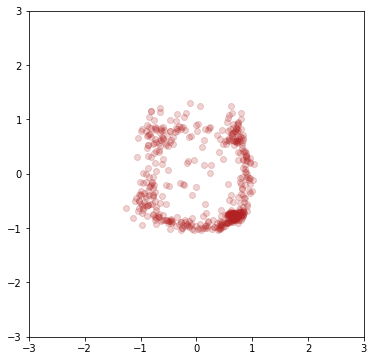

epoch 168
0.6877204179763794 0.7155149579048157


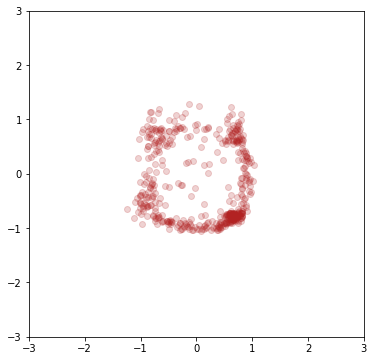

epoch 169
0.6870248317718506 0.7138441205024719


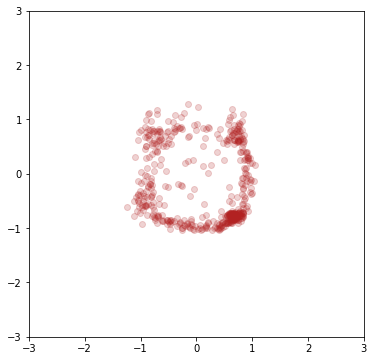

epoch 170
0.6871786713600159 0.7042085528373718


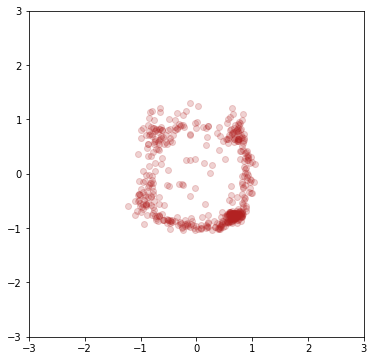

epoch 171
0.6838424801826477 0.7079753875732422


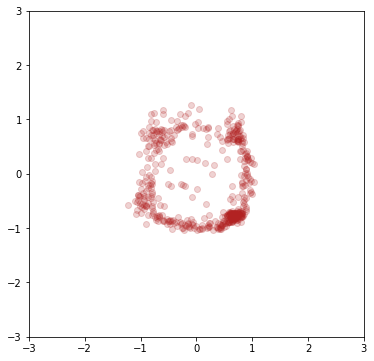

epoch 172
0.6911101341247559 0.713716447353363


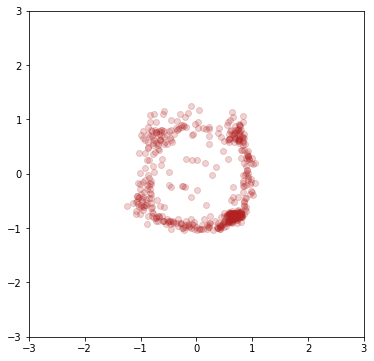

epoch 173
0.6853634715080261 0.703490138053894


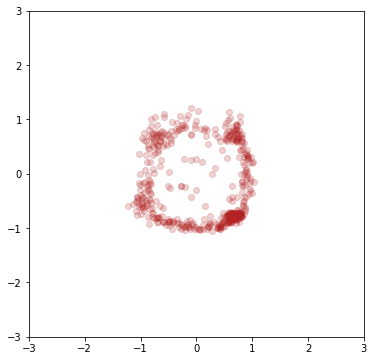

epoch 174
0.683739185333252 0.7072130441665649


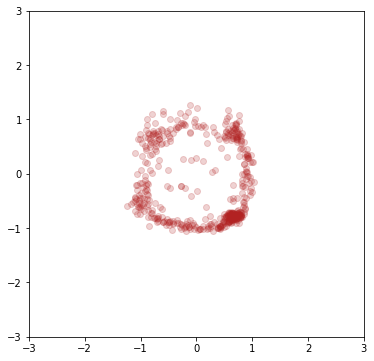

epoch 175
0.6874582171440125 0.7096484303474426


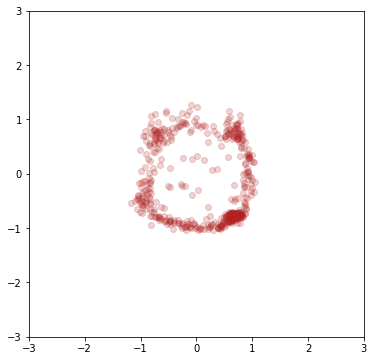

epoch 176
0.6874013543128967 0.7097086906433105


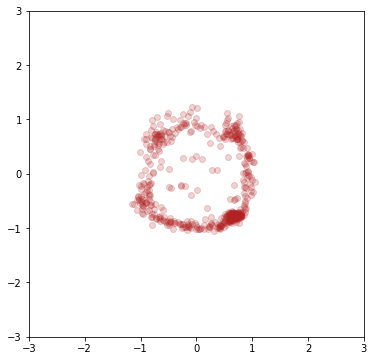

epoch 177
0.6888912320137024 0.7084214091300964


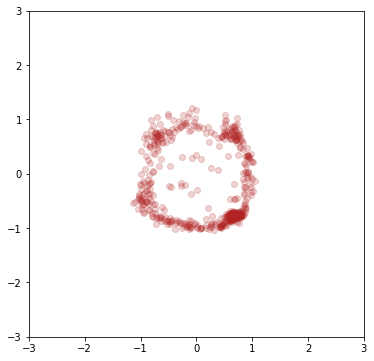

epoch 178
0.6868482828140259 0.7072840332984924


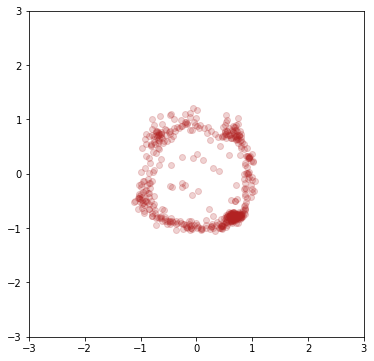

epoch 179
0.685616135597229 0.7167106866836548


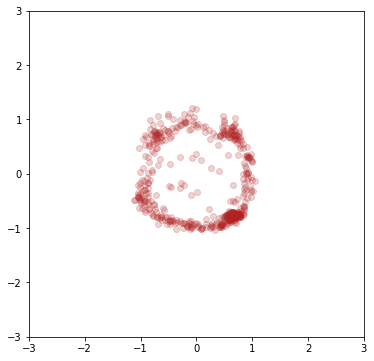

epoch 180
0.690742015838623 0.7096931338310242


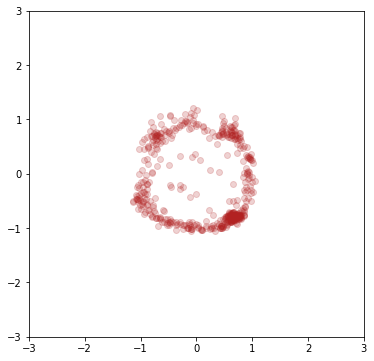

epoch 181
0.6916606426239014 0.7094537615776062


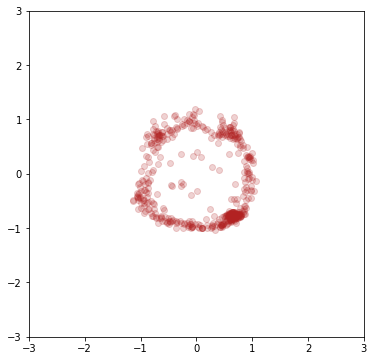

epoch 182
0.6881896257400513 0.7046849727630615


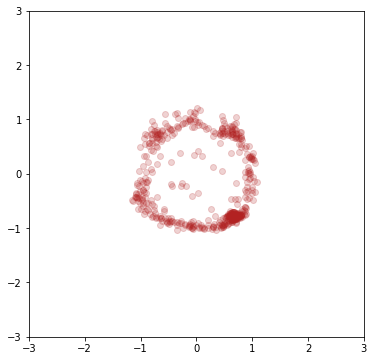

epoch 183
0.6862607598304749 0.7014533877372742


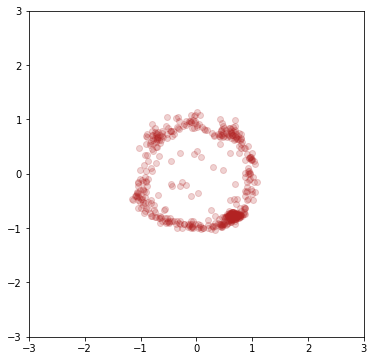

epoch 184
0.6883946061134338 0.7076686024665833


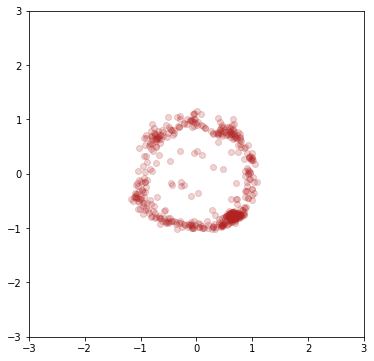

epoch 185
0.6835893392562866 0.7052076458930969


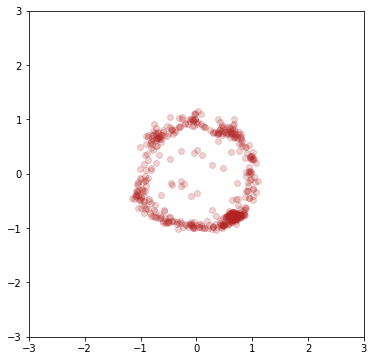

epoch 186
0.6869068145751953 0.7086239457130432


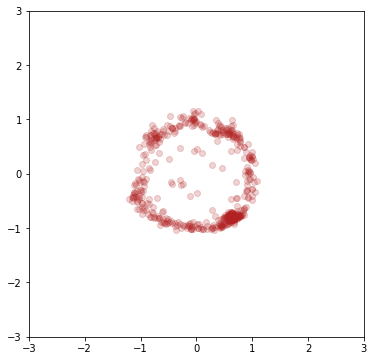

epoch 187
0.6860946416854858 0.7001773118972778


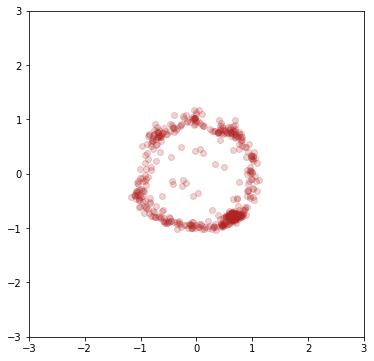

epoch 188
0.6848660111427307 0.7068505883216858


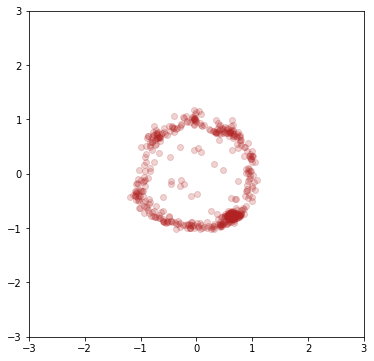

epoch 189
0.68564772605896 0.6988339424133301


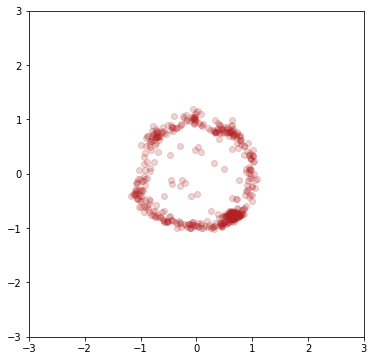

epoch 190
0.6869073510169983 0.7005211710929871


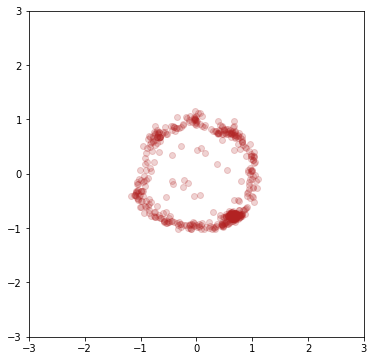

epoch 191
0.6896554827690125 0.712795078754425


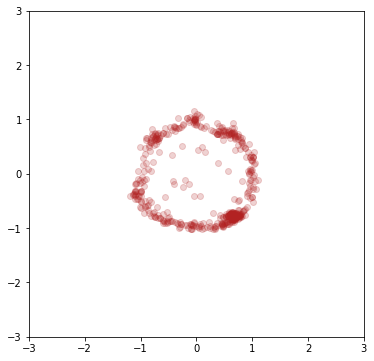

epoch 192
0.6850841045379639 0.7067375183105469


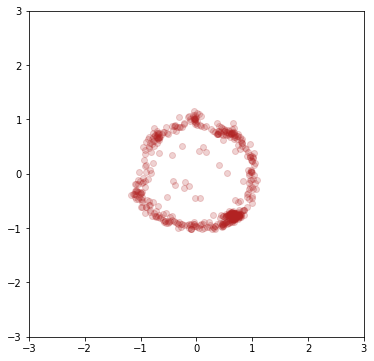

epoch 193
0.6840742230415344 0.7036107778549194


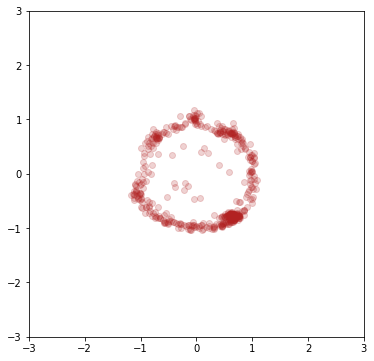

epoch 194
0.6878184676170349 0.6996543407440186


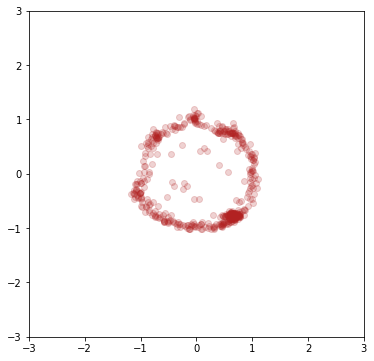

epoch 195
0.6870036125183105 0.707162082195282


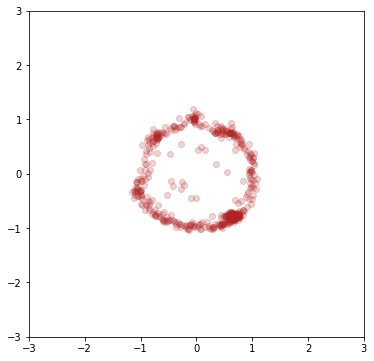

epoch 196
0.6859166026115417 0.7014006972312927


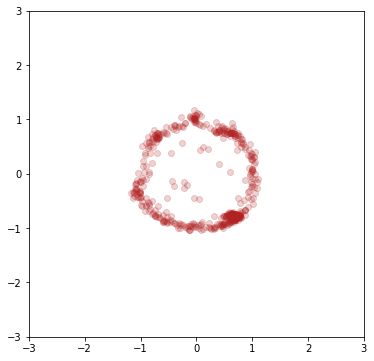

epoch 197
0.6863604187965393 0.7094027996063232


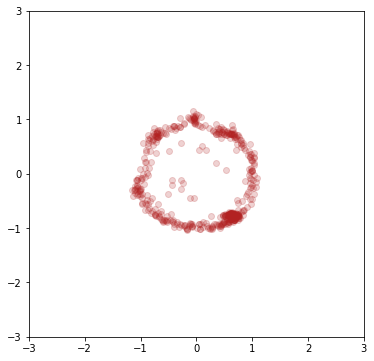

epoch 198
0.6899070143699646 0.7108026146888733


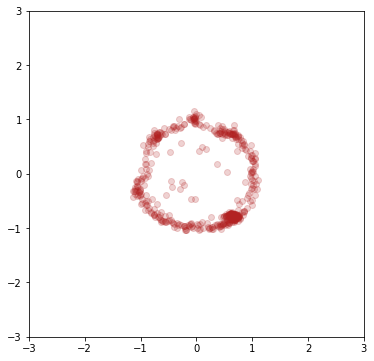

epoch 199
0.687021791934967 0.7049221992492676


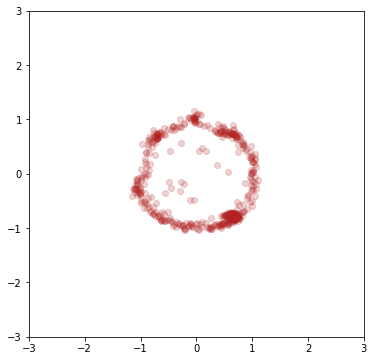

epoch 200
0.6863316297531128 0.700541615486145


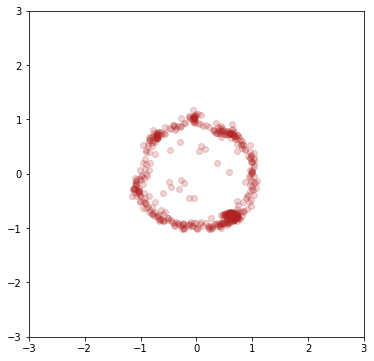

epoch 201
0.686836302280426 0.7024128437042236


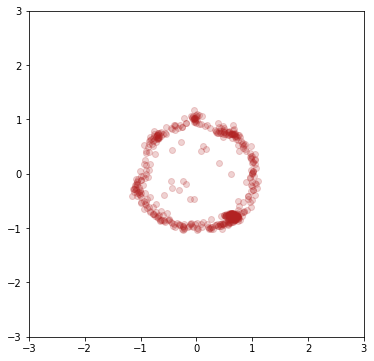

epoch 202
0.6864972114562988 0.704082190990448


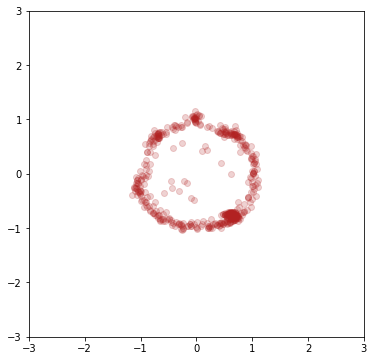

epoch 203
0.6871336102485657 0.6968710422515869


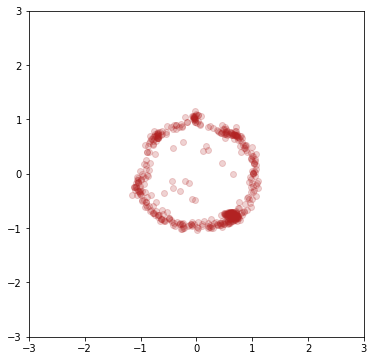

epoch 204
0.6871218681335449 0.705974280834198


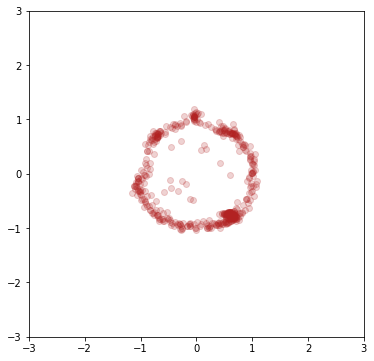

epoch 205
0.6899918913841248 0.7055310010910034


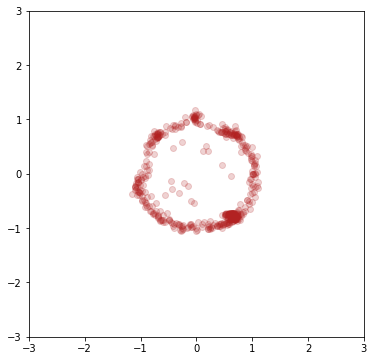

epoch 206
0.6872332692146301 0.7069320678710938


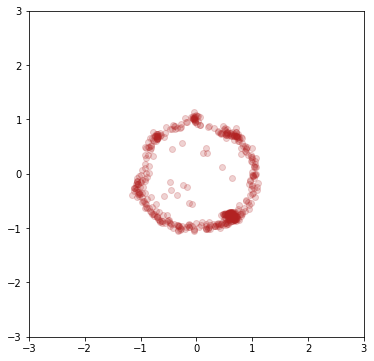

epoch 207
0.6889337301254272 0.7042694687843323


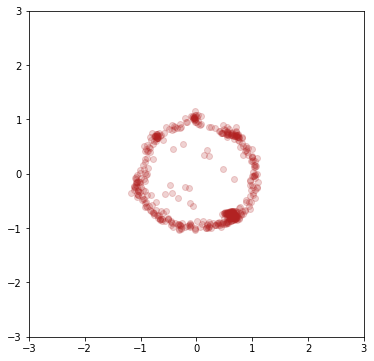

epoch 208
0.6866697669029236 0.7124224305152893


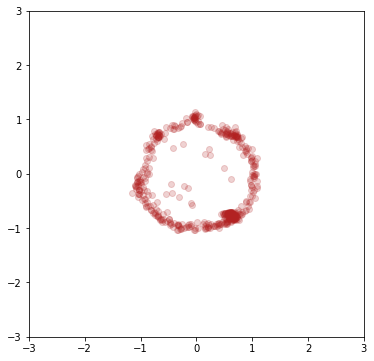

epoch 209
0.6877483129501343 0.7075762748718262


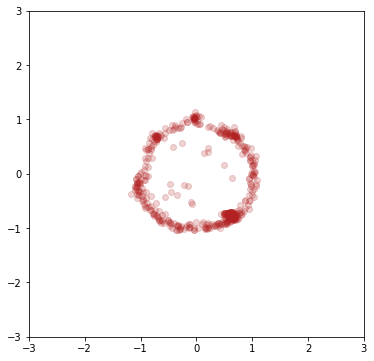

epoch 210
0.6891923546791077 0.7087190747261047


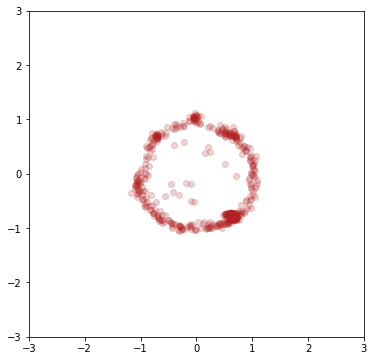

epoch 211
0.6863495111465454 0.7150917649269104


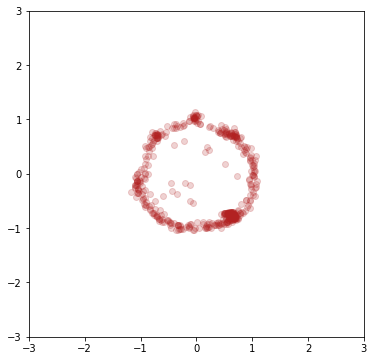

epoch 212
0.6858036518096924 0.7081044912338257


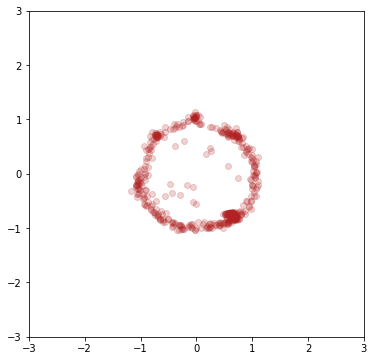

epoch 213
0.6891893148422241 0.7071902751922607


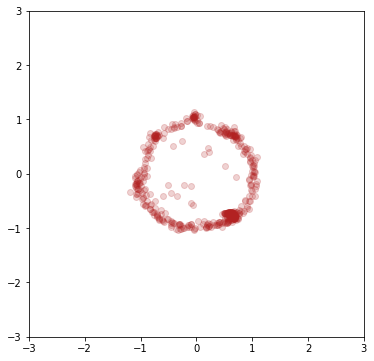

epoch 214
0.6858071684837341 0.6994239091873169


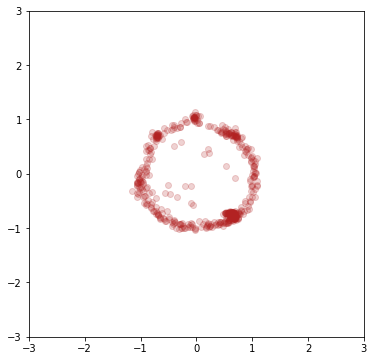

epoch 215
0.6862871050834656 0.6997027397155762


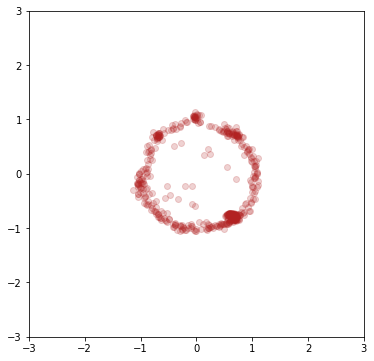

epoch 216
0.6890823245048523 0.7028146386146545


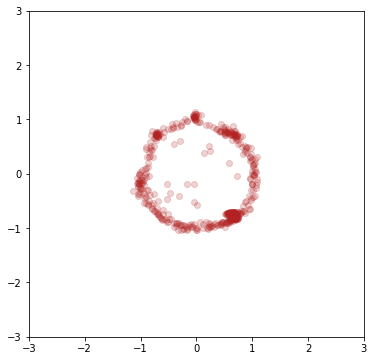

epoch 217
0.6887022256851196 0.7022108435630798


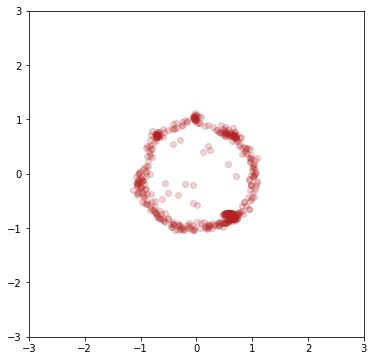

epoch 218
0.6875350475311279 0.7060312628746033


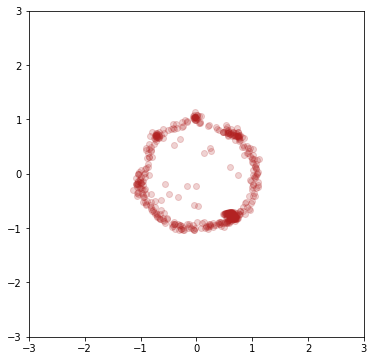

epoch 219
0.690786600112915 0.7052953243255615


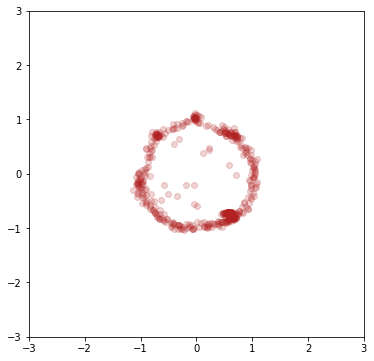

epoch 220
0.6885474324226379 0.709869384765625


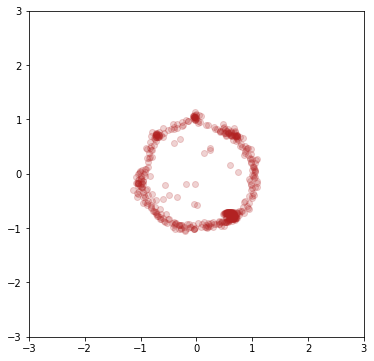

epoch 221
0.6886375546455383 0.7019252777099609


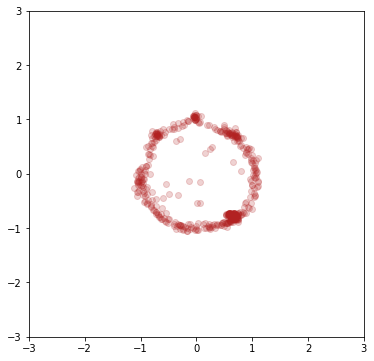

epoch 222
0.6866148114204407 0.7012434601783752


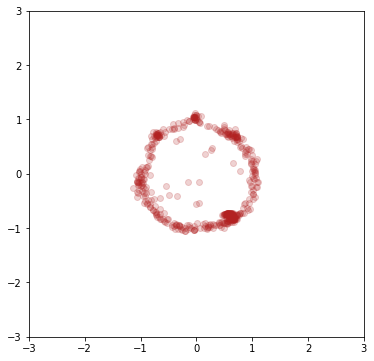

epoch 223
0.6913507580757141 0.7091476321220398


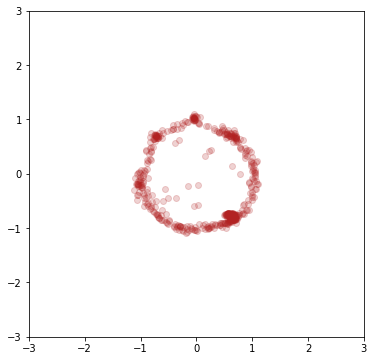

epoch 224
0.6865224242210388 0.7001997232437134


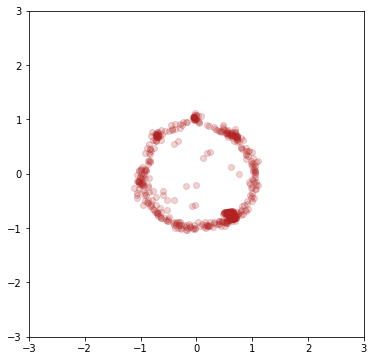

epoch 225
0.6835795044898987 0.7047528624534607


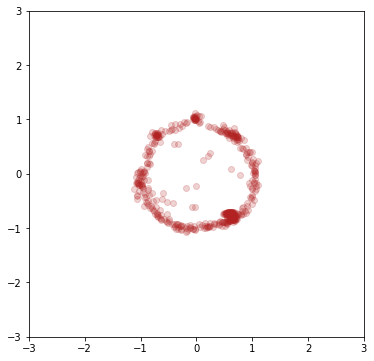

epoch 226
0.6905344128608704 0.7006625533103943


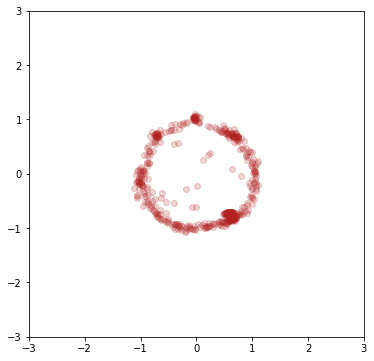

epoch 227
0.6851919293403625 0.7065770030021667


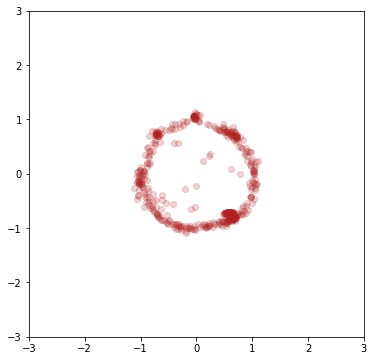

epoch 228
0.6862950325012207 0.704935610294342


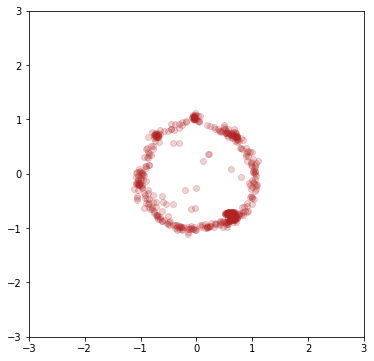

epoch 229
0.6921629905700684 0.7075154185295105


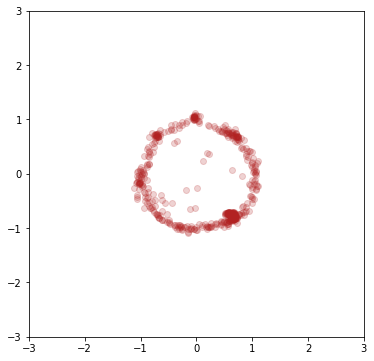

epoch 230
0.6875474452972412 0.6988881826400757


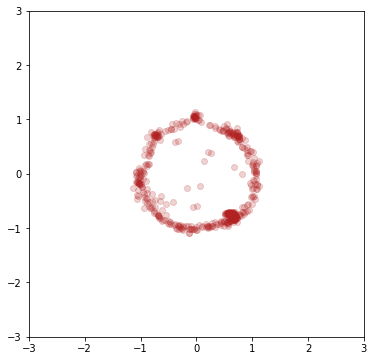

epoch 231
0.6867770552635193 0.7053889632225037


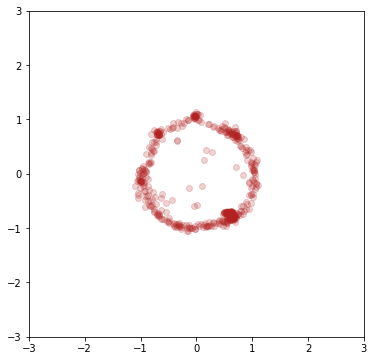

epoch 232
0.6894386410713196 0.7007499933242798


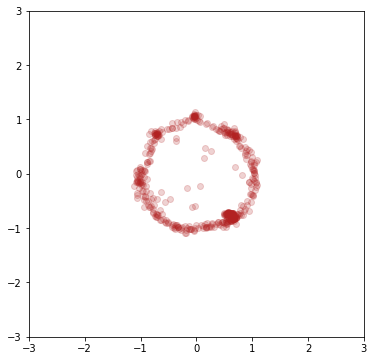

epoch 233
0.6869915127754211 0.7083123922348022


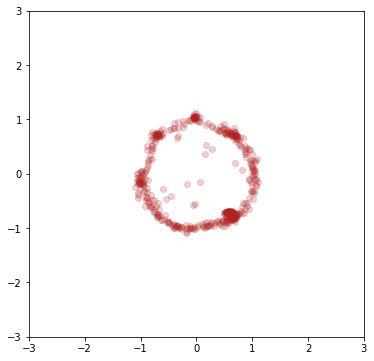

epoch 234
0.6900525093078613 0.705330491065979


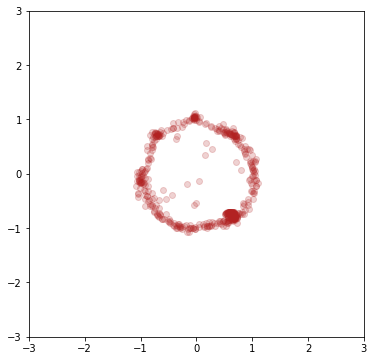

epoch 235
0.6906542778015137 0.7030284404754639


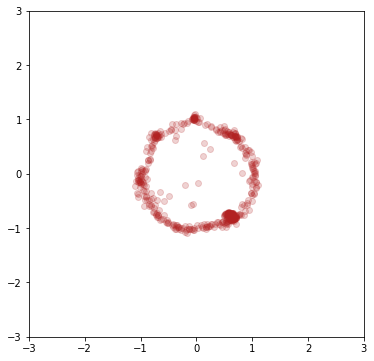

epoch 236
0.6914097666740417 0.7012141942977905


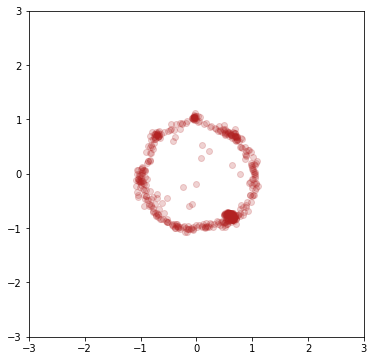

epoch 237
0.6867071390151978 0.7007224559783936


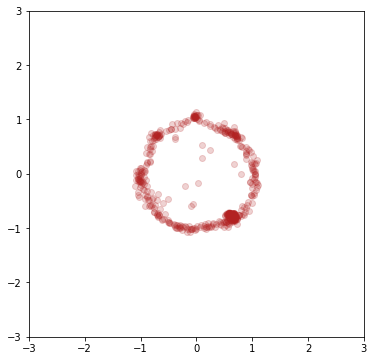

epoch 238
0.6888253688812256 0.7031370401382446


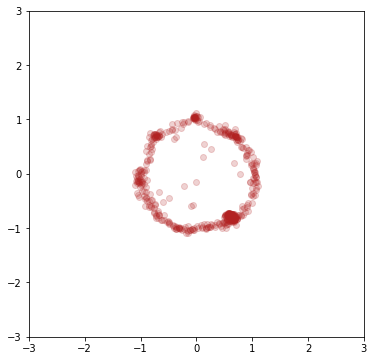

epoch 239
0.6882250905036926 0.6975626945495605


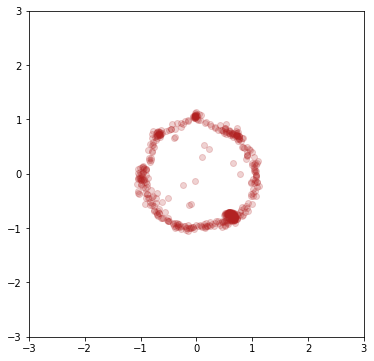

epoch 240
0.687694787979126 0.7028980255126953


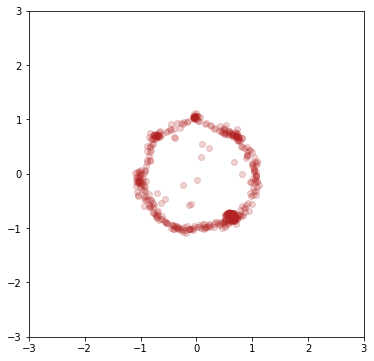

epoch 241
0.6899880766868591 0.7017965912818909


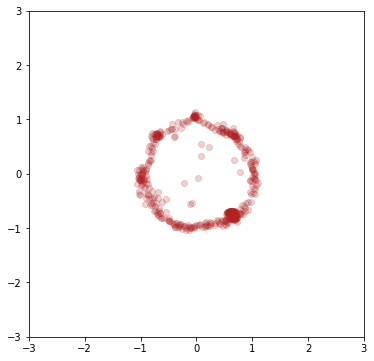

epoch 242
0.6885340809822083 0.7002210021018982


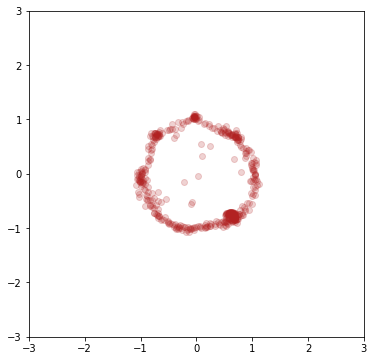

epoch 243
0.6915596723556519 0.7035336494445801


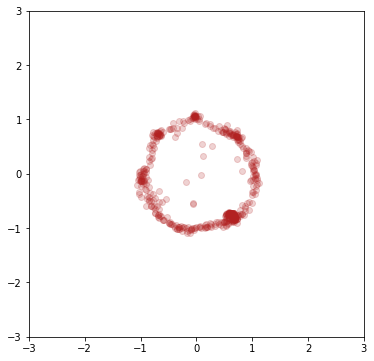

epoch 244
0.6869674921035767 0.7009158134460449


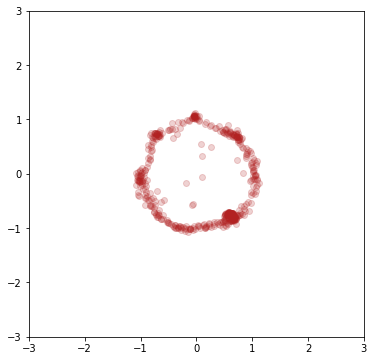

epoch 245
0.6893676519393921 0.7054487466812134


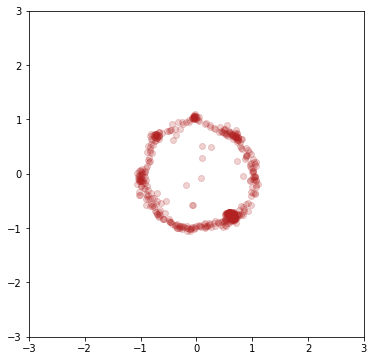

epoch 246
0.6888871192932129 0.7000603675842285


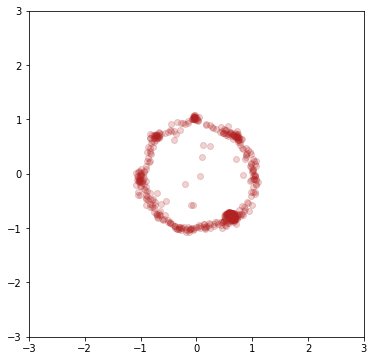

epoch 247
0.6888893842697144 0.7047173976898193


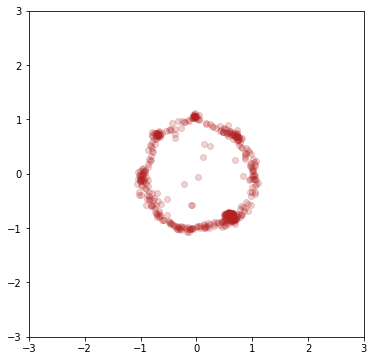

epoch 248
0.689677894115448 0.7015434503555298


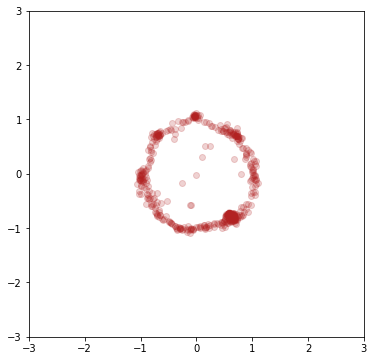

epoch 249
0.6885411143302917 0.7083078026771545


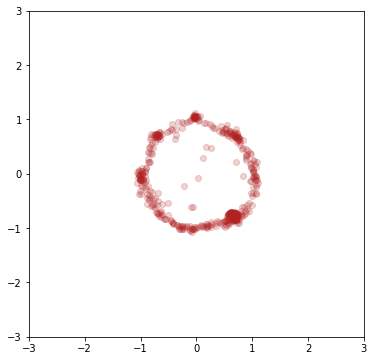

epoch 250
0.6876623630523682 0.7013062834739685


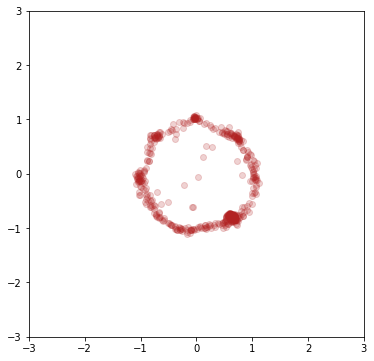

epoch 251
0.6868516802787781 0.6972892880439758


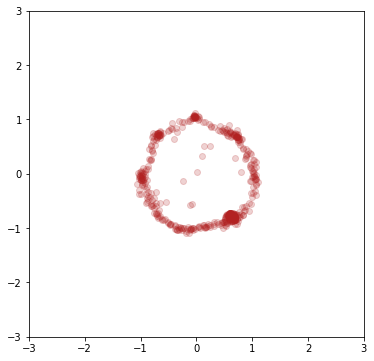

epoch 252
0.6893160939216614 0.7046139240264893


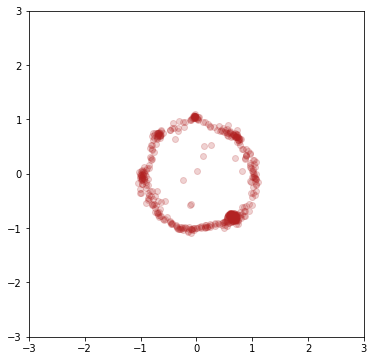

epoch 253
0.6900266408920288 0.7053946852684021


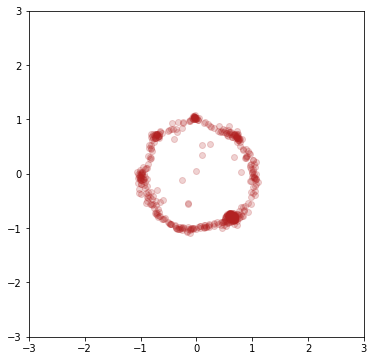

epoch 254
0.6850289106369019 0.7006282806396484


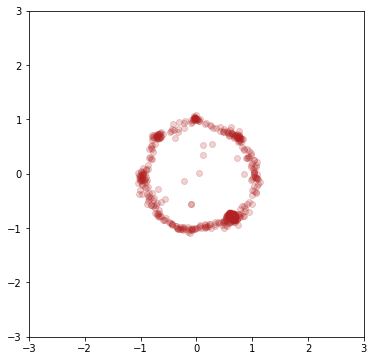

epoch 255
0.6839825510978699 0.7026672959327698


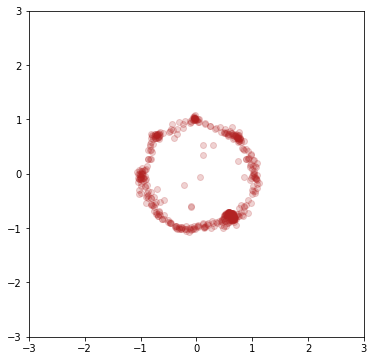

epoch 256
0.6845127940177917 0.7101290225982666


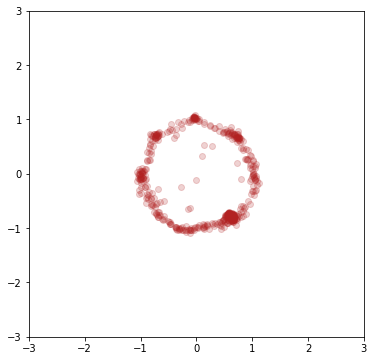

epoch 257
0.6887049674987793 0.7079126238822937


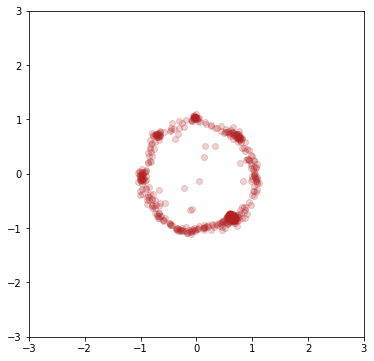

epoch 258
0.6929428577423096 0.712146520614624


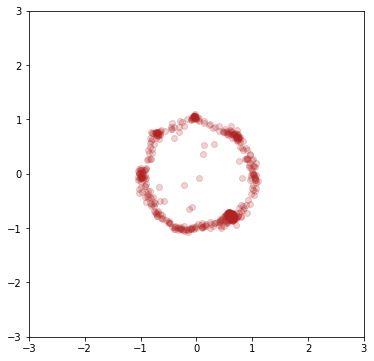

epoch 259
0.6895689368247986 0.7027137875556946


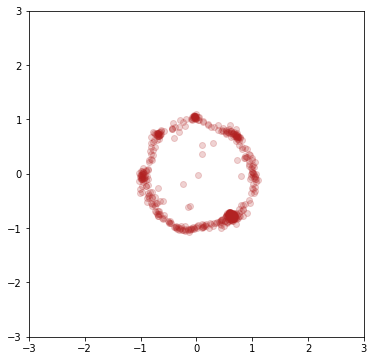

epoch 260
0.6892271637916565 0.7094144225120544


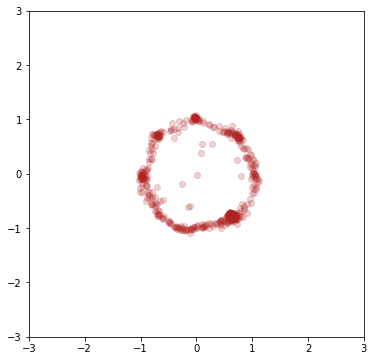

epoch 261
0.6842886209487915 0.6988293528556824


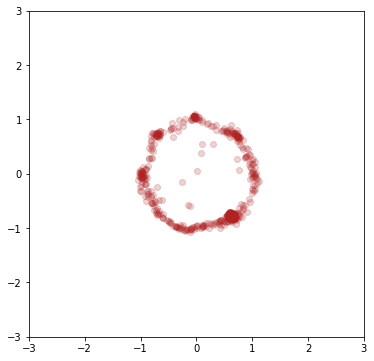

epoch 262
0.685681164264679 0.7090115547180176


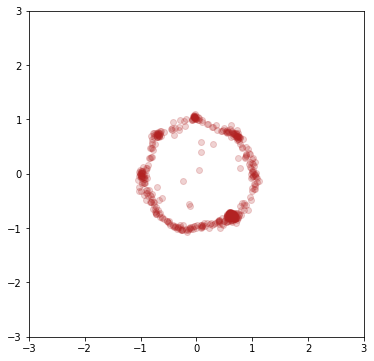

epoch 263
0.6845112442970276 0.7029291391372681


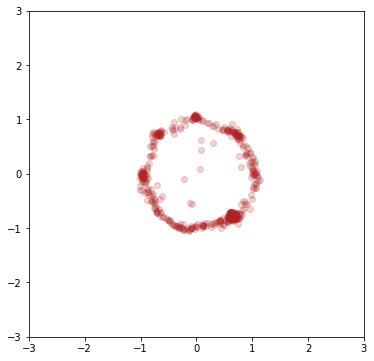

epoch 264
0.6867667436599731 0.704556405544281


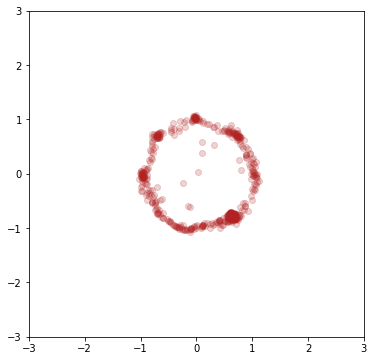

epoch 265
0.6873593330383301 0.7055042386054993


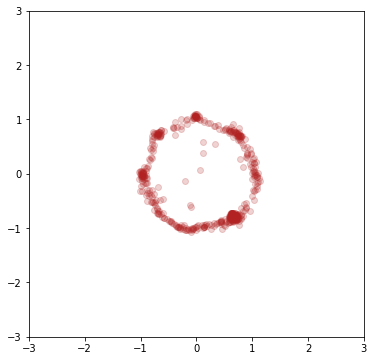

epoch 266
0.6912438869476318 0.7018731832504272


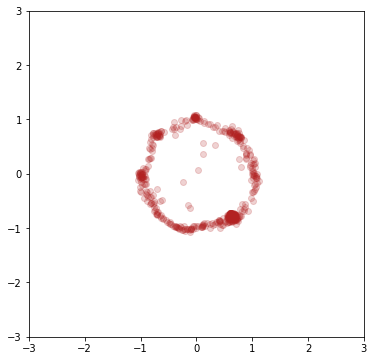

epoch 267
0.6833543181419373 0.7025851607322693


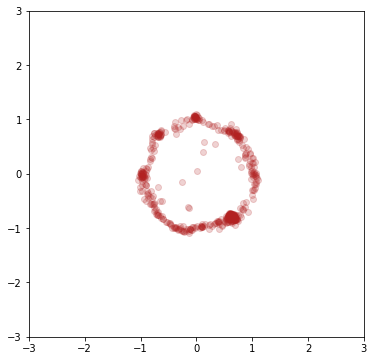

epoch 268
0.694388747215271 0.7070768475532532


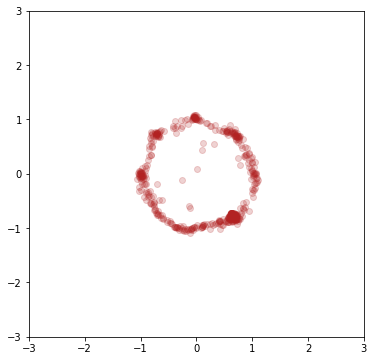

epoch 269
0.6879693865776062 0.7052749395370483


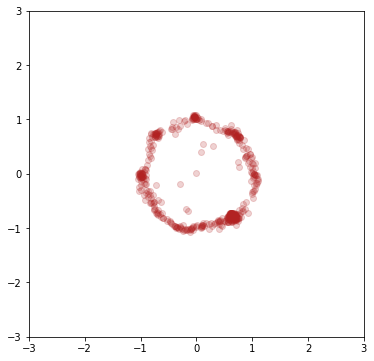

epoch 270
0.6878604292869568 0.7086783051490784


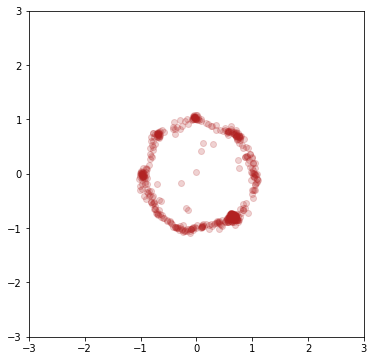

epoch 271
0.6869910359382629 0.7083801031112671


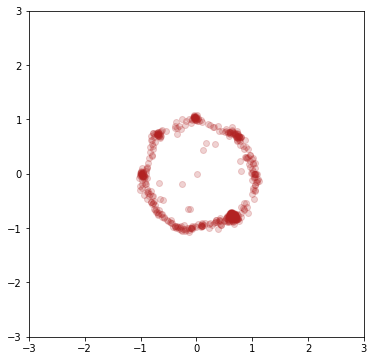

epoch 272
0.6899020671844482 0.6983917355537415


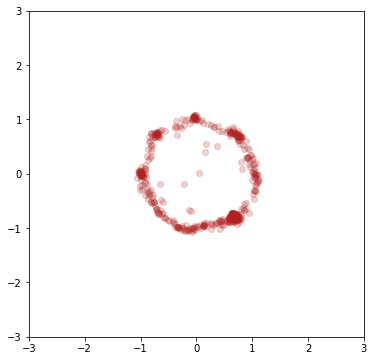

epoch 273
0.6902240514755249 0.7065432071685791


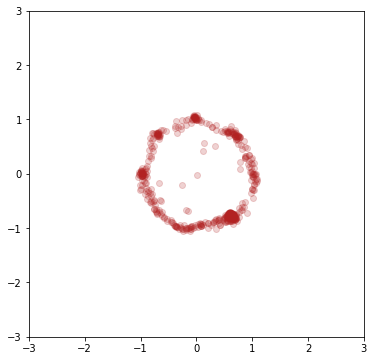

epoch 274
0.6897326111793518 0.7047040462493896


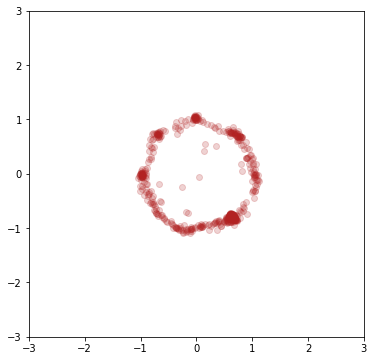

epoch 275
0.6919499039649963 0.7000381350517273


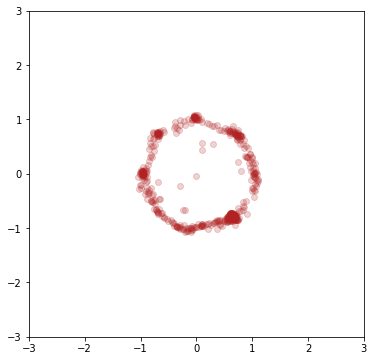

epoch 276
0.6907823085784912 0.7029168605804443


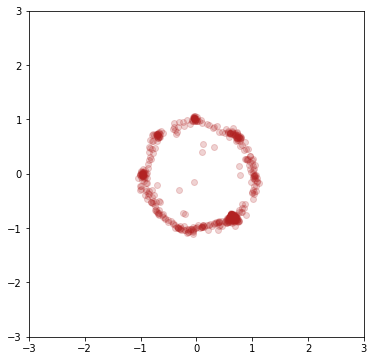

epoch 277
0.6904553174972534 0.6957064867019653


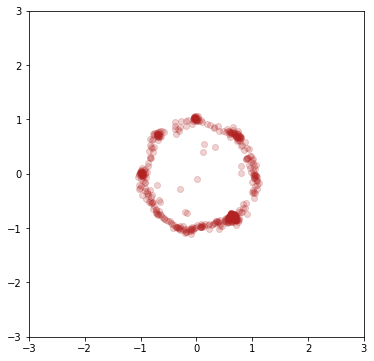

epoch 278
0.6868575811386108 0.7017498016357422


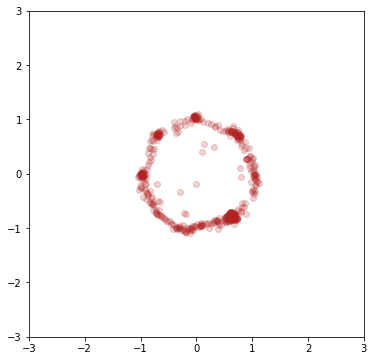

epoch 279
0.6891319155693054 0.7018901109695435


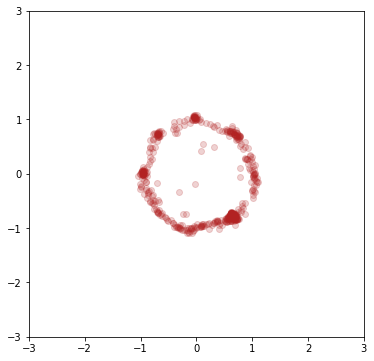

epoch 280
0.6871060729026794 0.7055187821388245


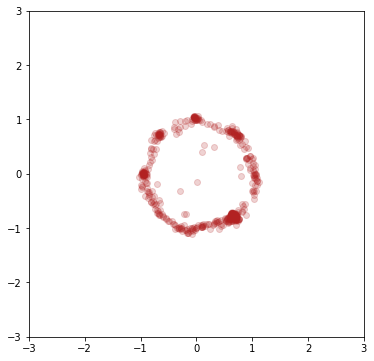

epoch 281
0.6897082328796387 0.7096162438392639


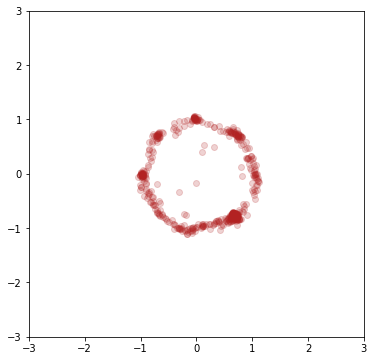

epoch 282
0.6915637254714966 0.7041049003601074


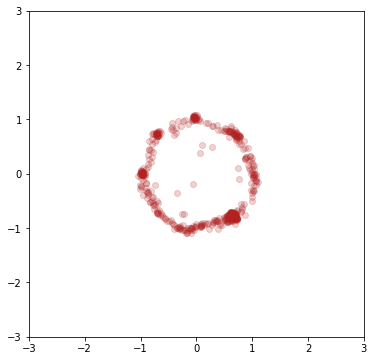

epoch 283
0.6887045502662659 0.7031166553497314


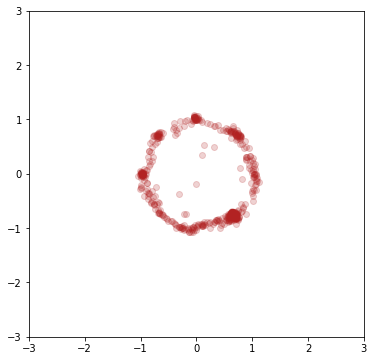

epoch 284
0.6882533431053162 0.7039467096328735


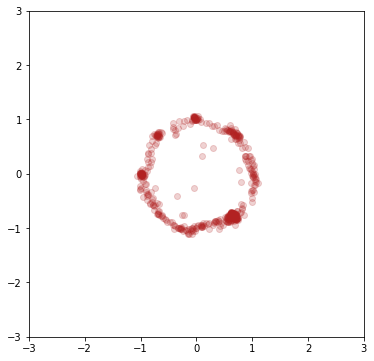

epoch 285
0.6882497668266296 0.6961784362792969


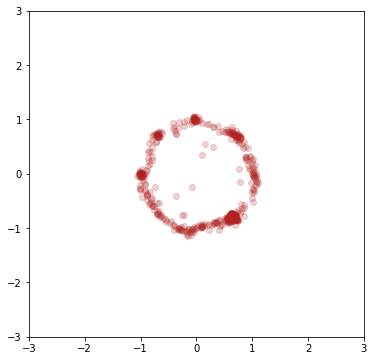

epoch 286
0.6922561526298523 0.7052680850028992


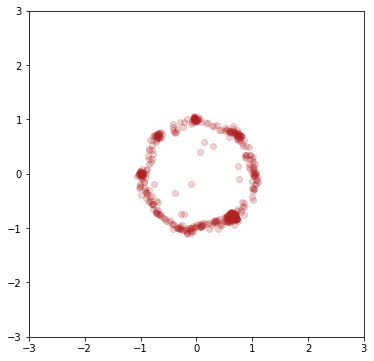

epoch 287
0.6941242218017578 0.7048448324203491


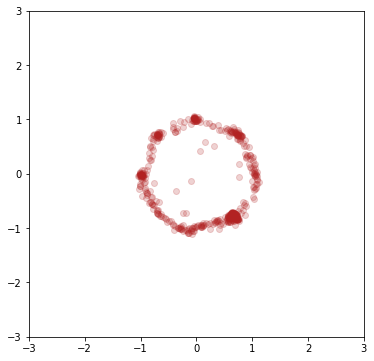

epoch 288
0.6901736259460449 0.701625645160675


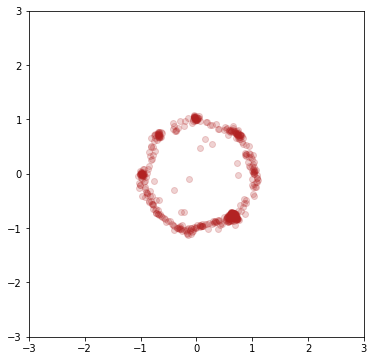

epoch 289
0.6918891072273254 0.702716588973999


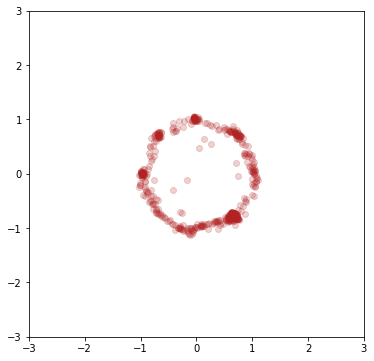

epoch 290
0.6883721947669983 0.698486328125


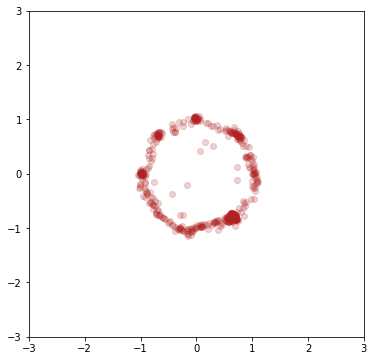

epoch 291
0.6909306049346924 0.7034730315208435


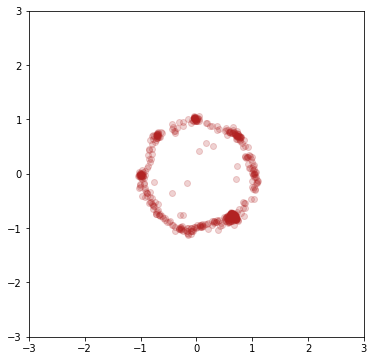

epoch 292
0.6904444694519043 0.7038230895996094


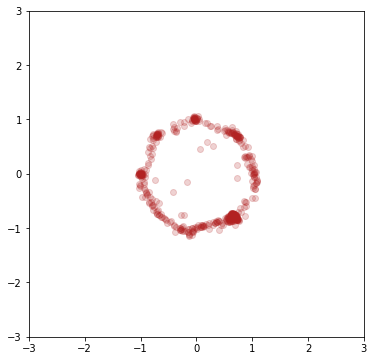

epoch 293
0.6912714242935181 0.7039069533348083


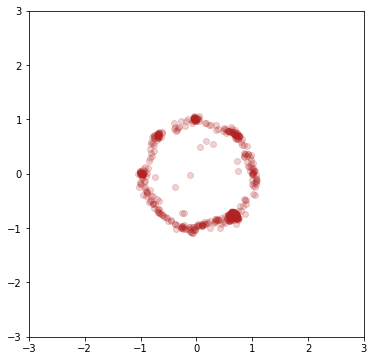

epoch 294
0.6885318756103516 0.7061973810195923


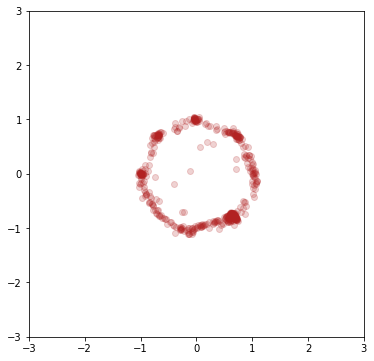

epoch 295
0.6864410638809204 0.7063486576080322


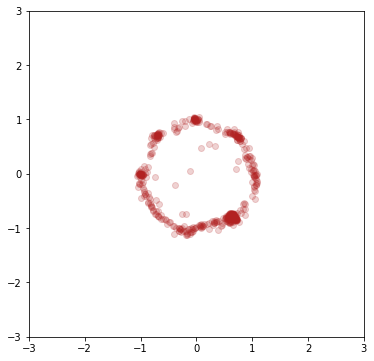

epoch 296
0.6892770528793335 0.7028658390045166


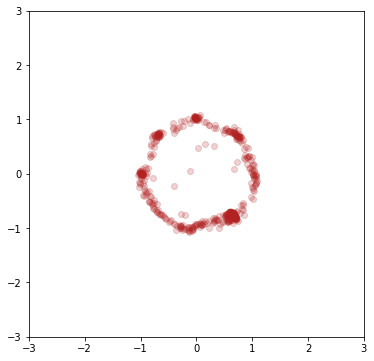

epoch 297
0.6907210350036621 0.7128748297691345


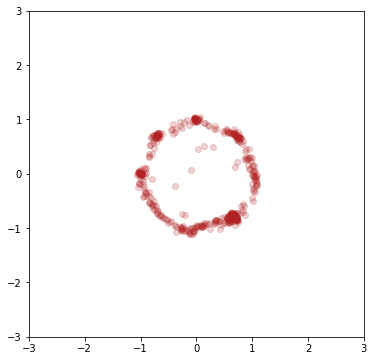

epoch 298
0.6923062205314636 0.7113590836524963


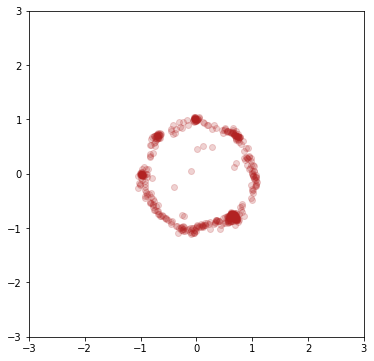

epoch 299
0.6918550133705139 0.6959447264671326


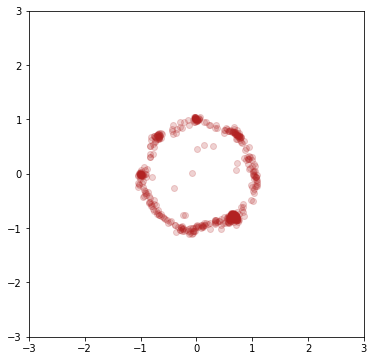

epoch 300
0.6888146996498108 0.7034979462623596


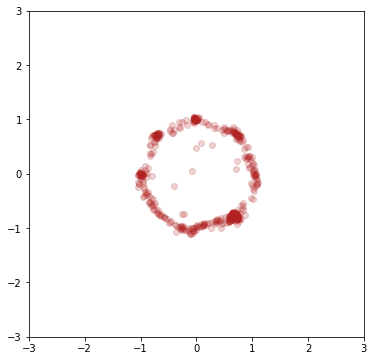

epoch 301
0.6915612816810608 0.7045088410377502


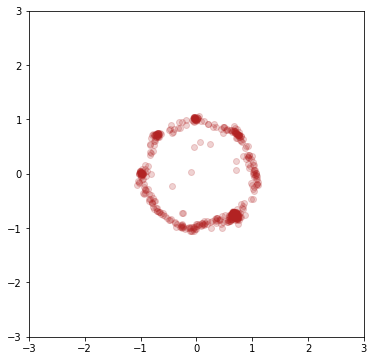

epoch 302
0.6896754503250122 0.7020787596702576


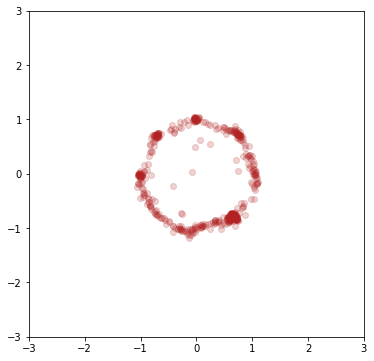

epoch 303
0.6907070279121399 0.7002125382423401


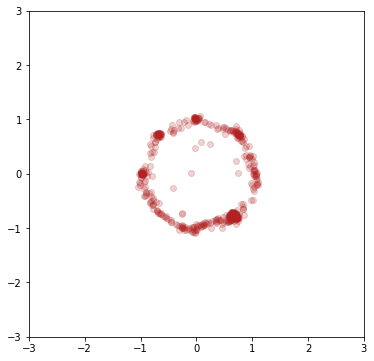

epoch 304
0.6928237676620483 0.7029221057891846


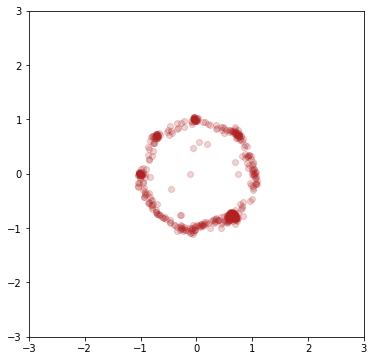

epoch 305
0.6883499622344971 0.7048235535621643


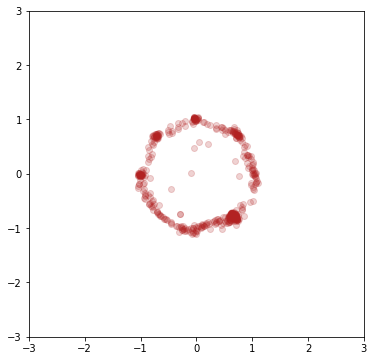

epoch 306
0.6896420121192932 0.701515793800354


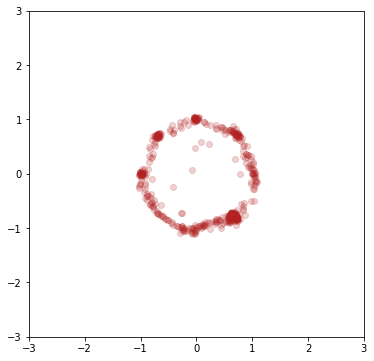

epoch 307
0.688412070274353 0.7037389278411865


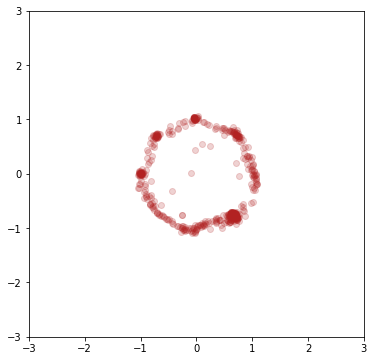

epoch 308
0.6904228329658508 0.7050259113311768


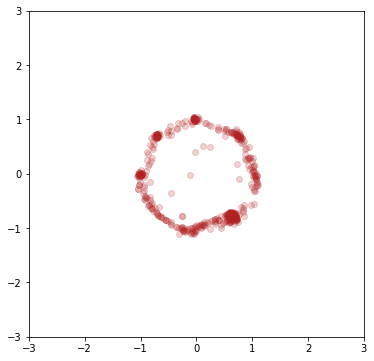

epoch 309
0.6905757188796997 0.701069712638855


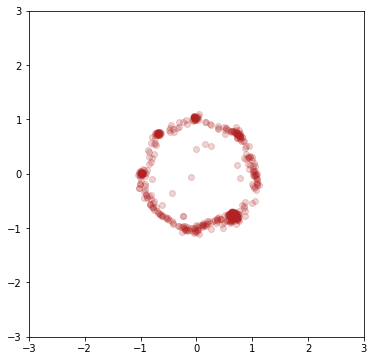

epoch 310
0.6901640295982361 0.6990298628807068


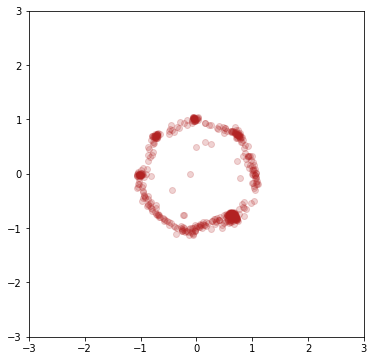

epoch 311
0.6916467547416687 0.7033016681671143


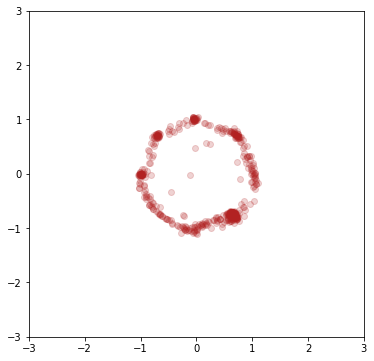

epoch 312
0.6904358863830566 0.7103010416030884


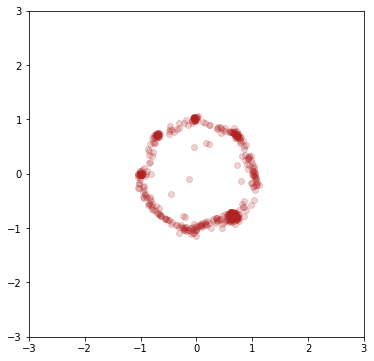

epoch 313
0.6924058794975281 0.7020878791809082


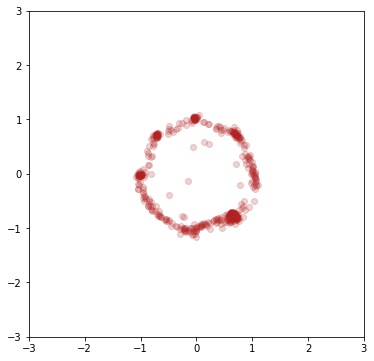

epoch 314
0.6903938055038452 0.7034681439399719


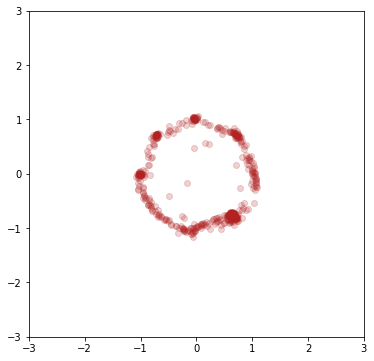

epoch 315
0.6902347803115845 0.7007307410240173


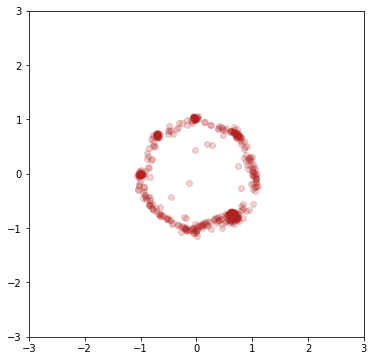

epoch 316
0.691206693649292 0.7004172801971436


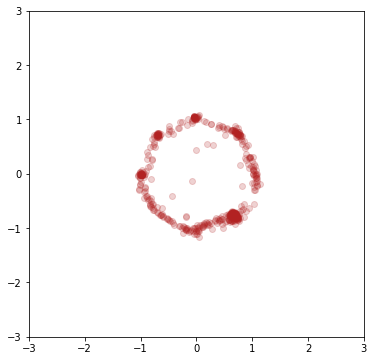

epoch 317
0.691933274269104 0.7037489414215088


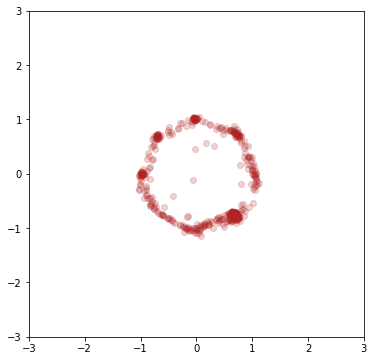

epoch 318
0.6895637512207031 0.6981756687164307


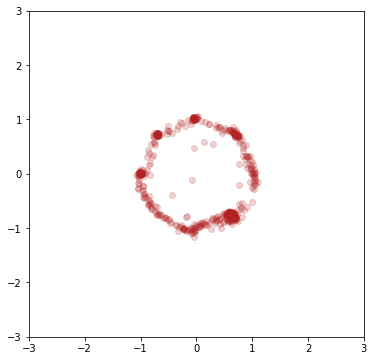

epoch 319
0.690165102481842 0.7085813283920288


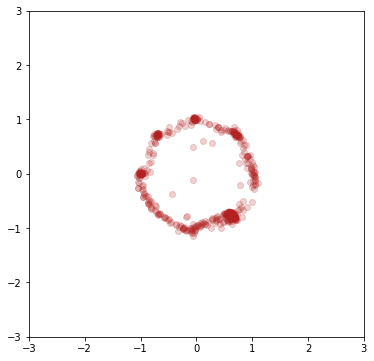

epoch 320
0.6884326934814453 0.704912543296814


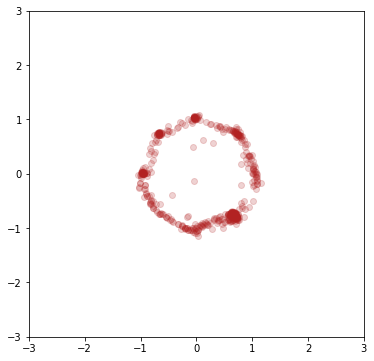

epoch 321
0.6902619004249573 0.7056208848953247


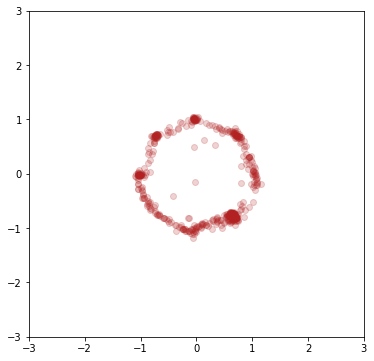

epoch 322
0.6866405010223389 0.7086347937583923


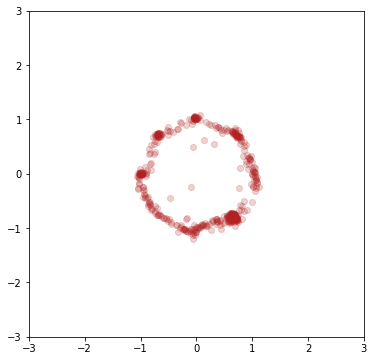

epoch 323
0.6881656646728516 0.7035099267959595


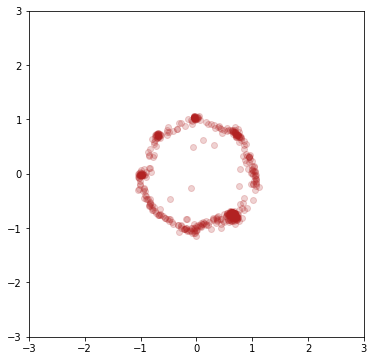

epoch 324
0.6929125785827637 0.701700747013092


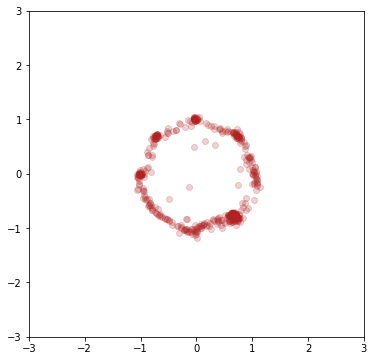

epoch 325
0.6916252374649048 0.7045701742172241


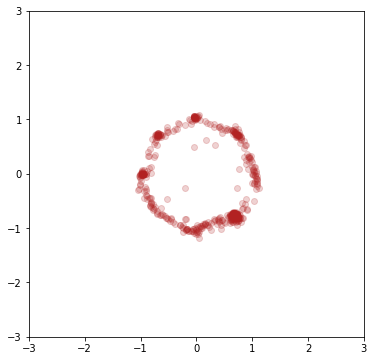

epoch 326
0.6914416551589966 0.7020429372787476


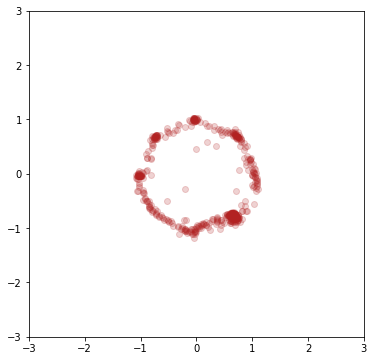

epoch 327
0.691158652305603 0.6956886053085327


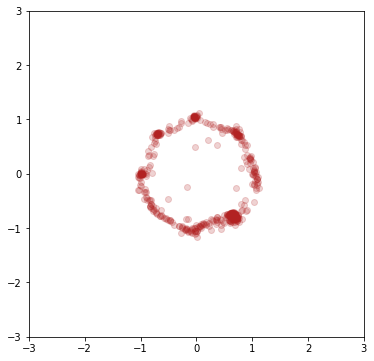

epoch 328
0.6862503886222839 0.7056724429130554


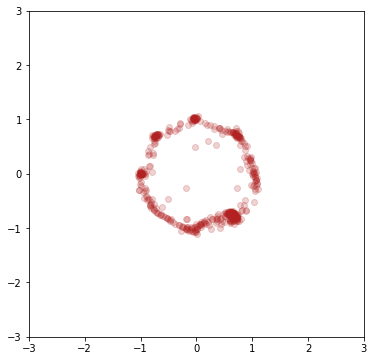

epoch 329
0.6885602474212646 0.702247142791748


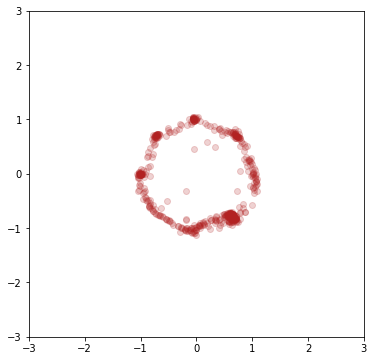

epoch 330
0.6898239254951477 0.6996486186981201


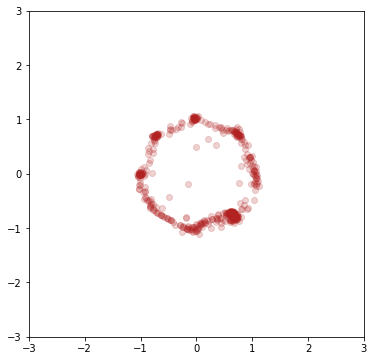

epoch 331
0.6895697116851807 0.7000375390052795


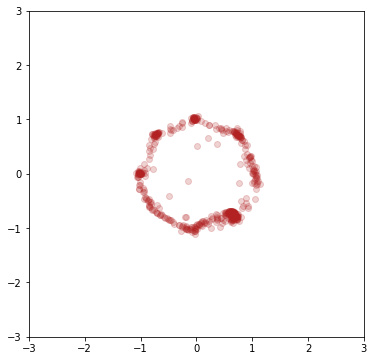

epoch 332
0.6904851794242859 0.7071083188056946


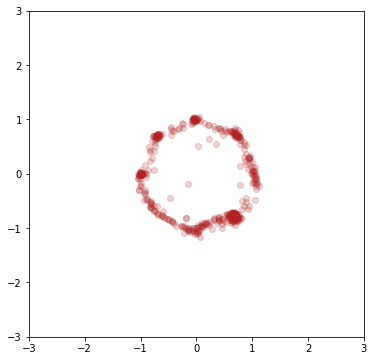

epoch 333
0.6884686946868896 0.7051367163658142


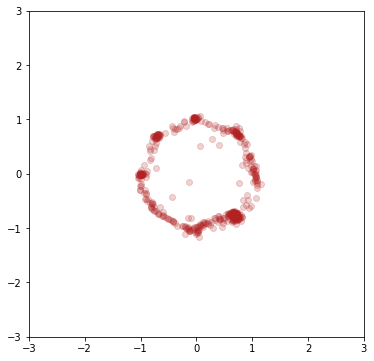

epoch 334
0.6884604096412659 0.7014234662055969


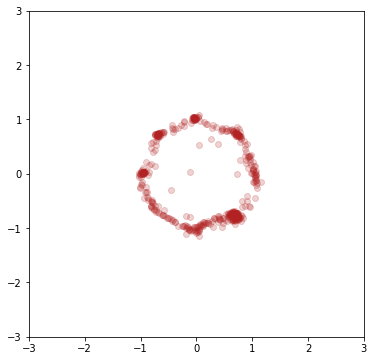

epoch 335
0.685702383518219 0.7084360718727112


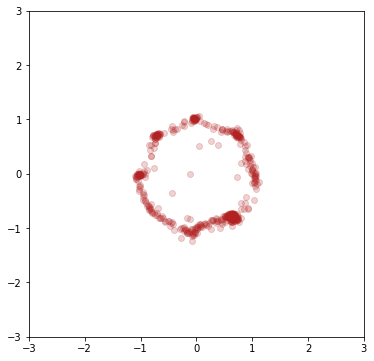

epoch 336
0.6885412335395813 0.705536425113678


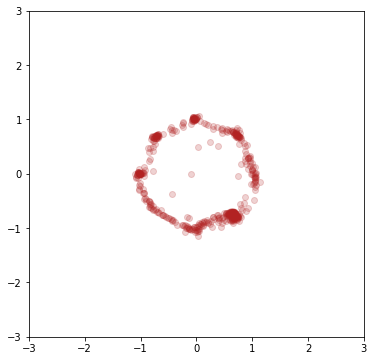

epoch 337
0.6920468807220459 0.6995294094085693


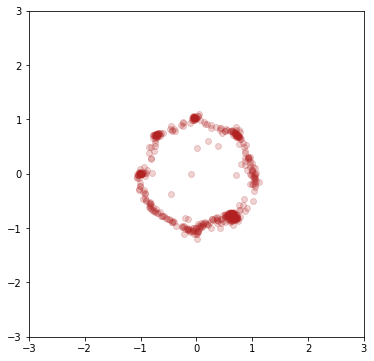

epoch 338
0.6868187785148621 0.700438380241394


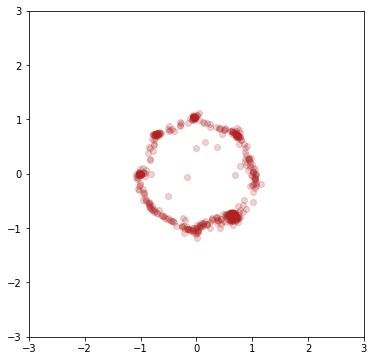

epoch 339
0.6876273155212402 0.7040403485298157


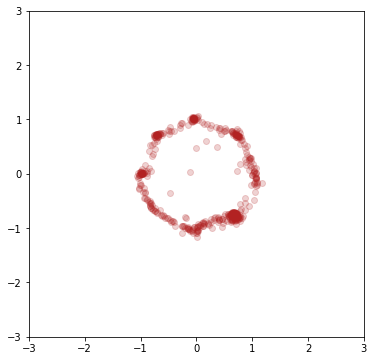

epoch 340
0.6888768076896667 0.700345516204834


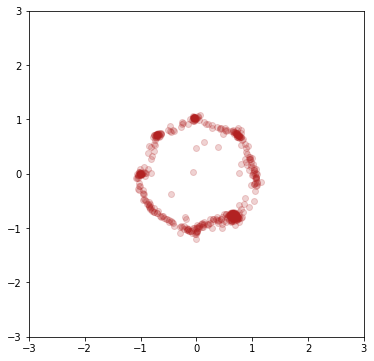

epoch 341
0.6860432624816895 0.7068946361541748


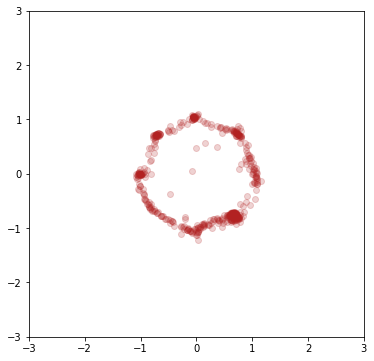

epoch 342
0.6871487498283386 0.7017629742622375


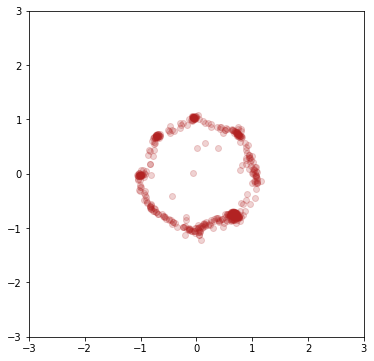

epoch 343
0.6878738403320312 0.7058067917823792


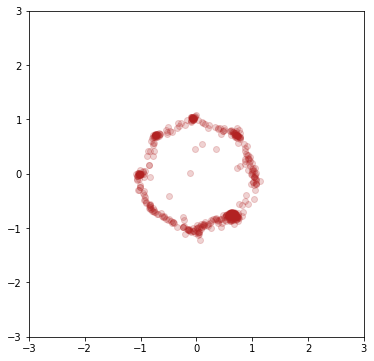

epoch 344
0.6869345903396606 0.7010321021080017


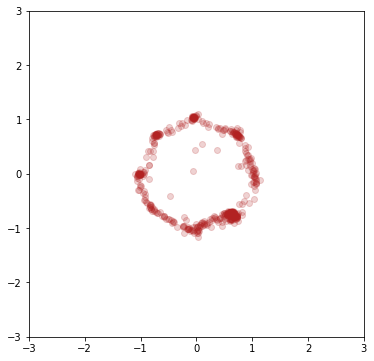

epoch 345
0.6932746767997742 0.7079818844795227


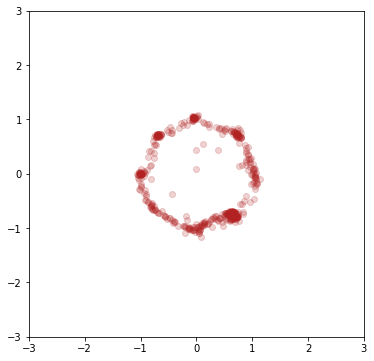

epoch 346
0.6863078474998474 0.7030397057533264


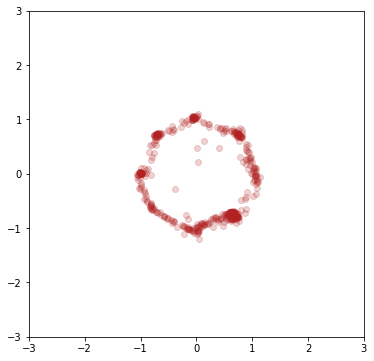

epoch 347
0.6873182654380798 0.7070060968399048


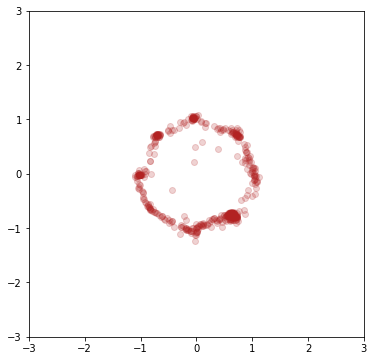

epoch 348
0.6930059790611267 0.7054271101951599


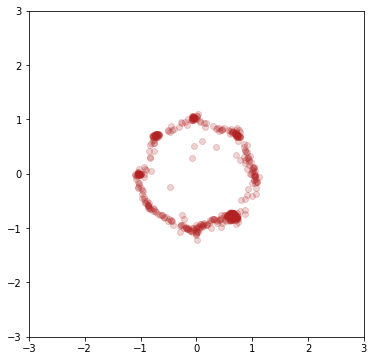

epoch 349
0.688535749912262 0.6994196176528931


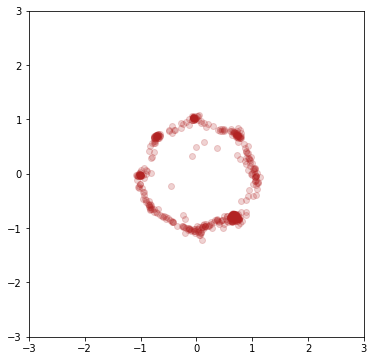

epoch 350
0.6916816234588623 0.7096855640411377


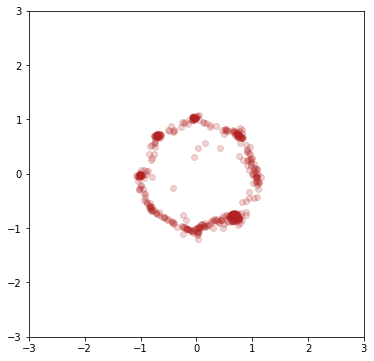

epoch 351
0.6873009204864502 0.6970770359039307


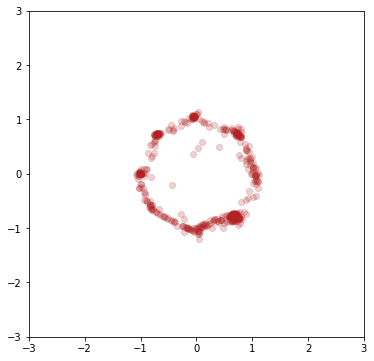

epoch 352
0.6867966651916504 0.7075467109680176


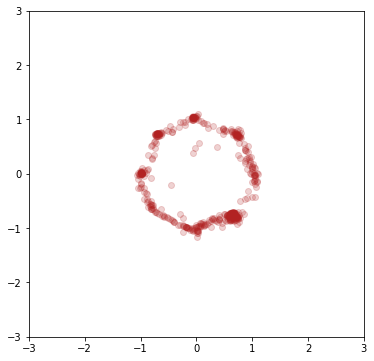

epoch 353
0.6890460848808289 0.710120677947998


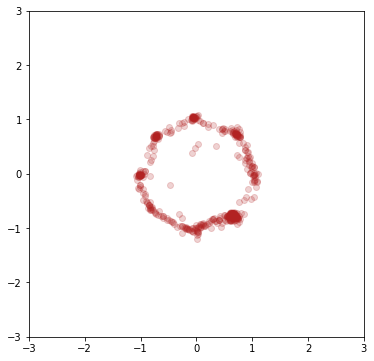

epoch 354
0.6884201169013977 0.7077462077140808


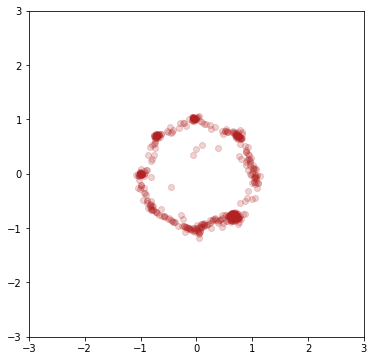

epoch 355
0.6909042596817017 0.7003434896469116


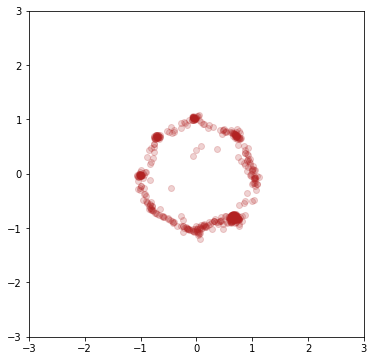

epoch 356
0.6865179538726807 0.7075285911560059


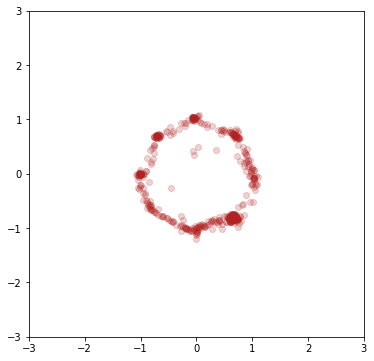

epoch 357
0.6880857944488525 0.7038388252258301


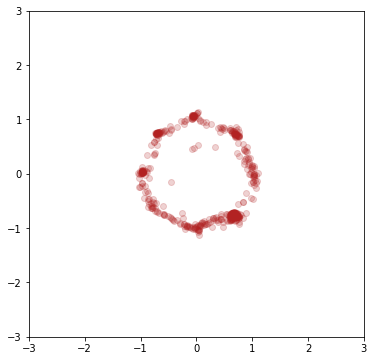

epoch 358
0.6920964121818542 0.708591639995575


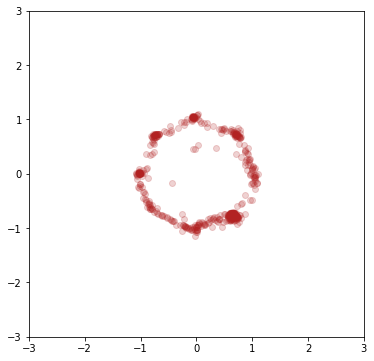

epoch 359
0.6919607520103455 0.704288125038147


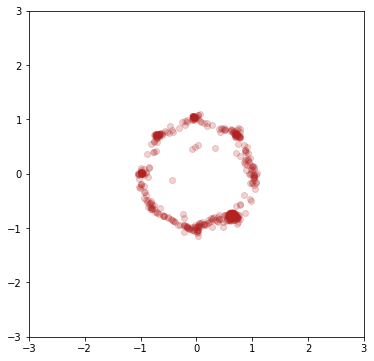

epoch 360
0.6912973523139954 0.706490695476532


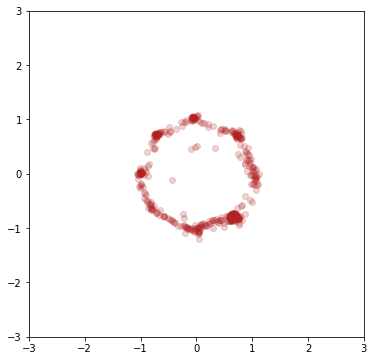

epoch 361
0.6907382011413574 0.7097190618515015


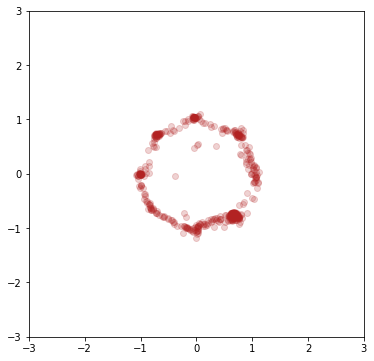

epoch 362
0.6819687485694885 0.7043198943138123


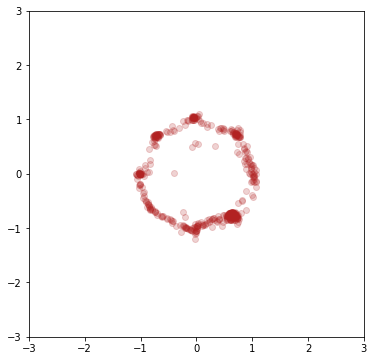

epoch 363
0.6903209686279297 0.7044669985771179


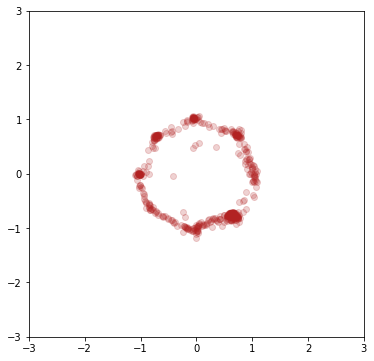

epoch 364
0.6911839246749878 0.700528085231781


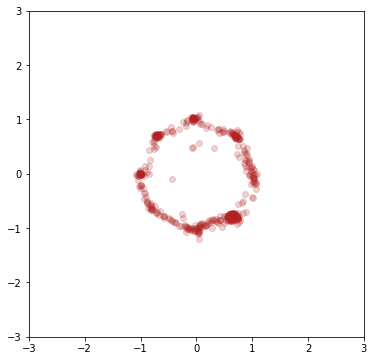

epoch 365
0.6851391792297363 0.7020426392555237


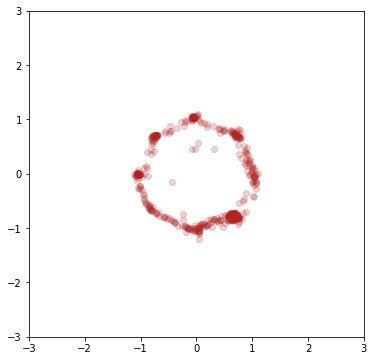

epoch 366
0.6903572082519531 0.707072377204895


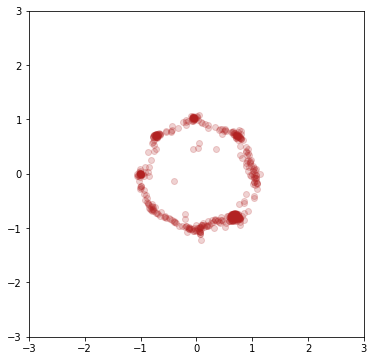

epoch 367
0.692209780216217 0.7031399607658386


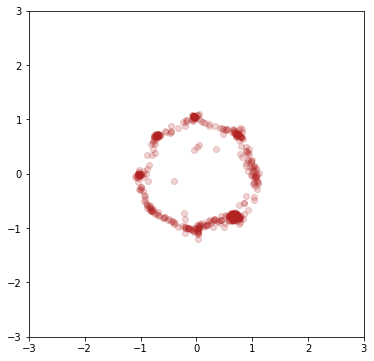

epoch 368
0.6883792877197266 0.7011391520500183


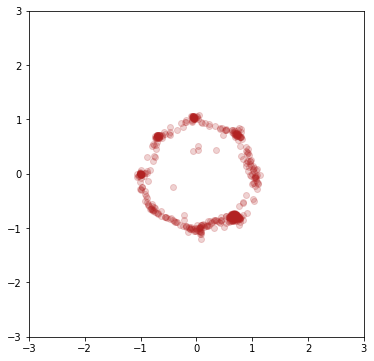

epoch 369
0.6881762742996216 0.7037334442138672


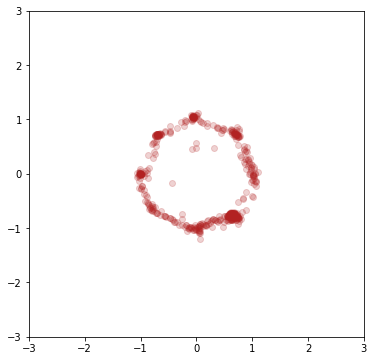

epoch 370
0.6910574436187744 0.7039400339126587


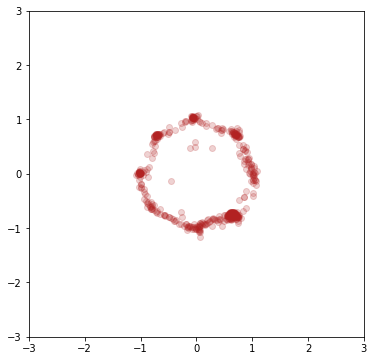

epoch 371
0.691338062286377 0.6934396624565125


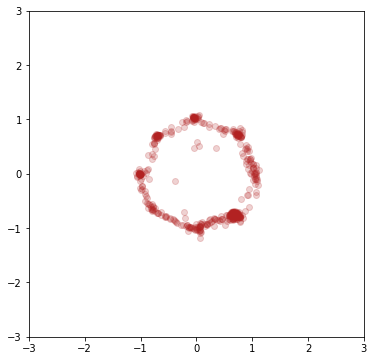

epoch 372
0.6894079446792603 0.7045081257820129


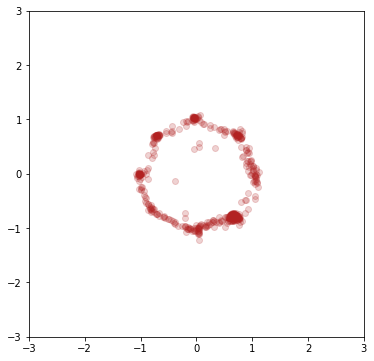

epoch 373
0.690212070941925 0.7033669352531433


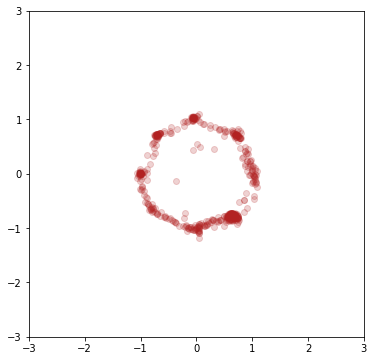

epoch 374
0.6893101334571838 0.7027084231376648


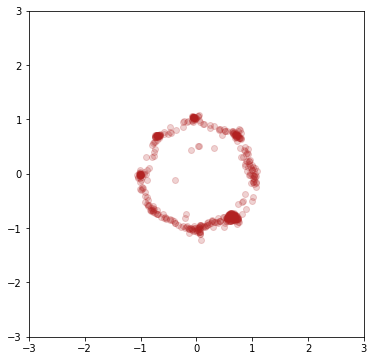

epoch 375
0.6928843855857849 0.7071084380149841


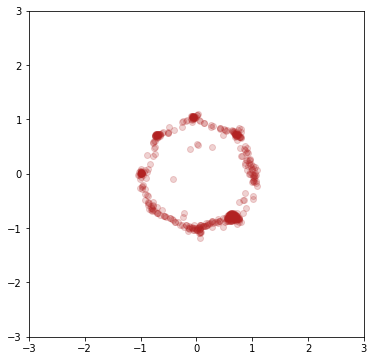

epoch 376
0.6927644610404968 0.7015683054924011


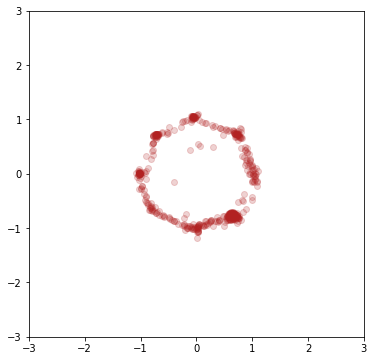

epoch 377
0.6898574233055115 0.7047303915023804


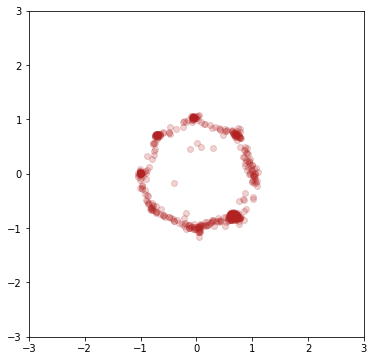

epoch 378
0.6901929974555969 0.705751359462738


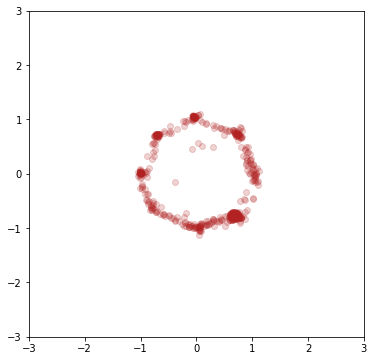

epoch 379
0.6919856071472168 0.7068252563476562


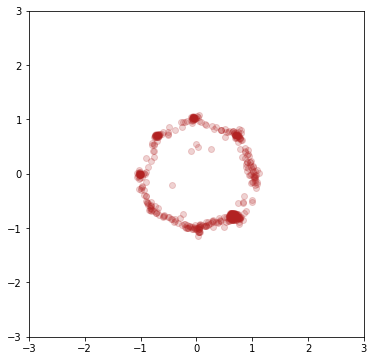

epoch 380
0.6886064410209656 0.7078385949134827


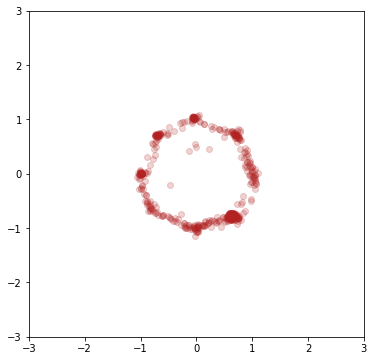

epoch 381
0.6918935179710388 0.7006700038909912


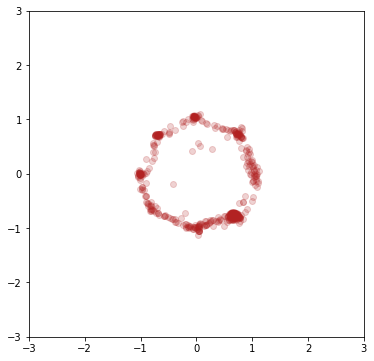

epoch 382
0.6913124322891235 0.7119341492652893


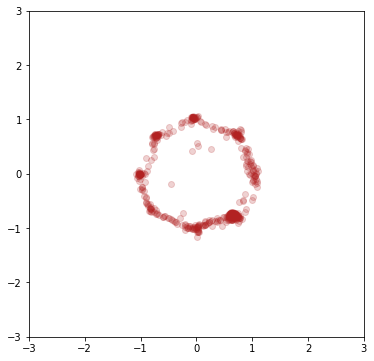

epoch 383
0.689209520816803 0.7010005712509155


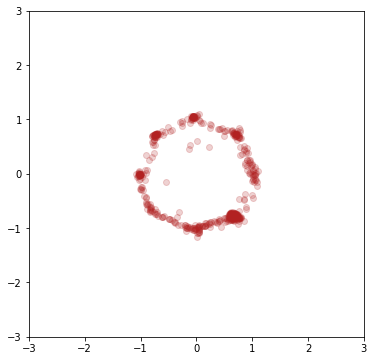

epoch 384
0.6898251175880432 0.7032784819602966


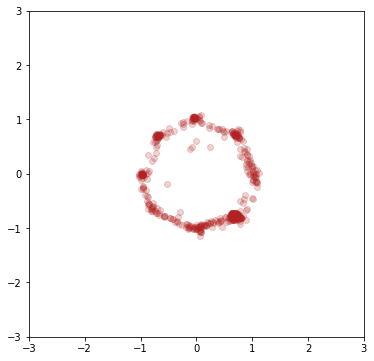

epoch 385
0.6872009038925171 0.7070514559745789


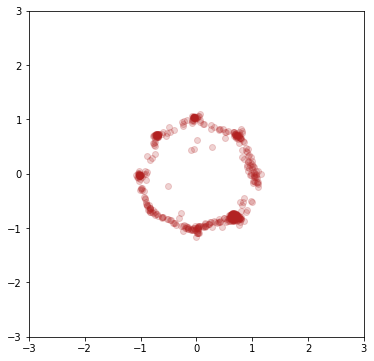

epoch 386
0.6883768439292908 0.7039611339569092


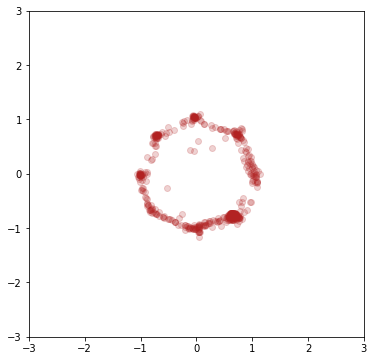

epoch 387
0.6906538605690002 0.7082666158676147


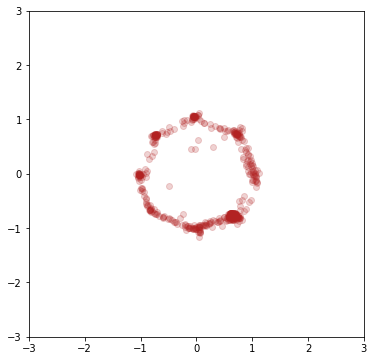

epoch 388
0.6913599967956543 0.7046316266059875


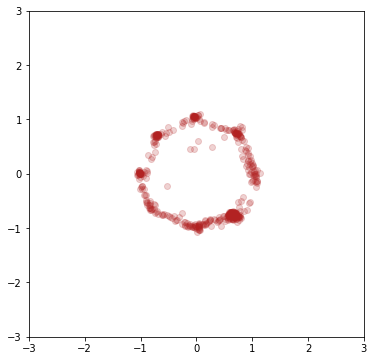

epoch 389
0.691149115562439 0.7031408548355103


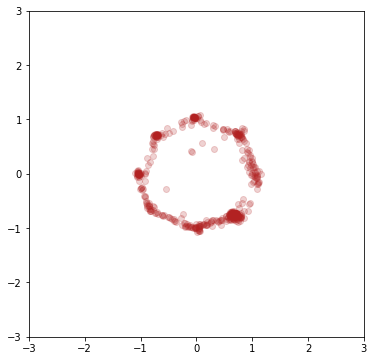

epoch 390
0.690919816493988 0.7079495191574097


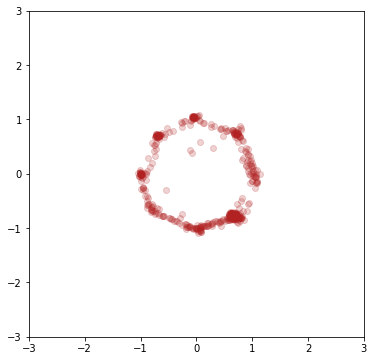

epoch 391
0.6942058801651001 0.7094064354896545


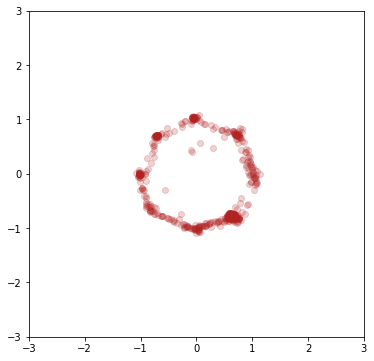

epoch 392
0.6941961646080017 0.7030950784683228


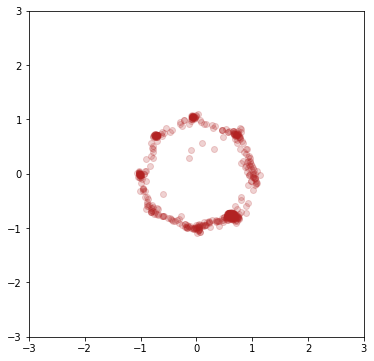

epoch 393
0.6898505687713623 0.7068607807159424


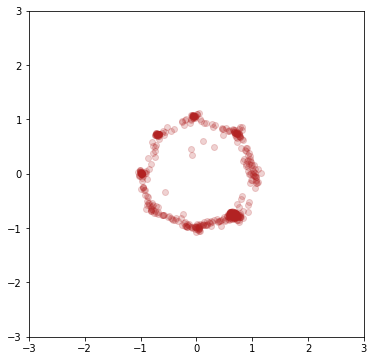

epoch 394
0.6879066228866577 0.7085182666778564


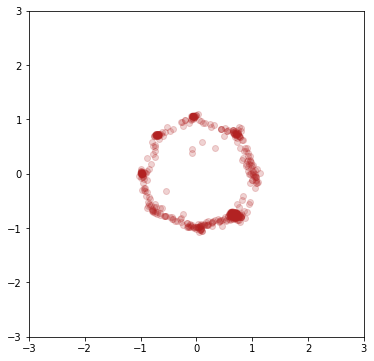

epoch 395
0.6926599740982056 0.7038725018501282


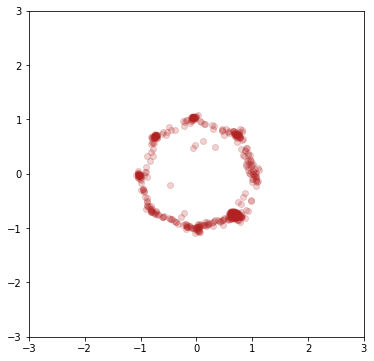

epoch 396
0.6879847645759583 0.7087953090667725


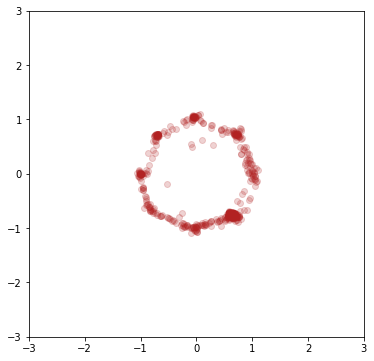

epoch 397
0.6947107911109924 0.708035409450531


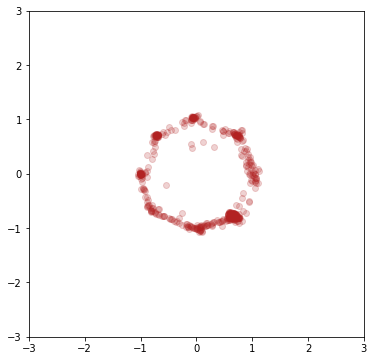

epoch 398
0.6915403604507446 0.7104586958885193


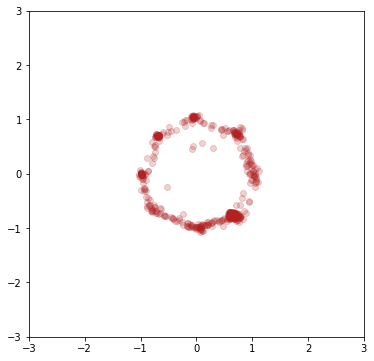

epoch 399
0.6876746416091919 0.7044718861579895


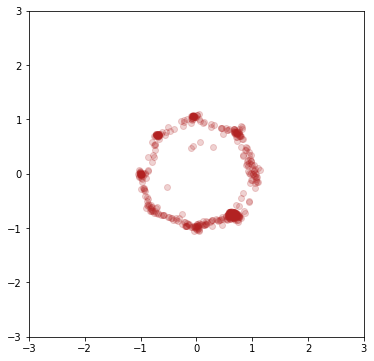

epoch 400
0.6890580058097839 0.7023460865020752


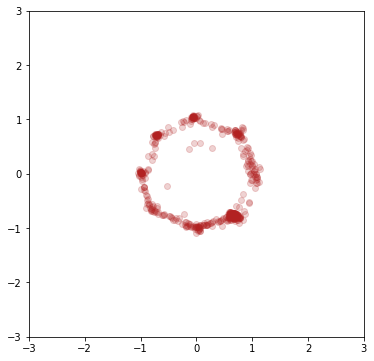

epoch 401
0.6914628744125366 0.7013672590255737


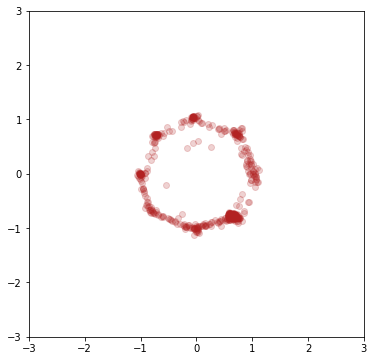

epoch 402
0.6893940567970276 0.7050027251243591


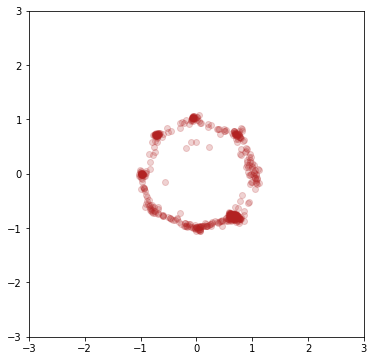

epoch 403
0.6941865682601929 0.7018923759460449


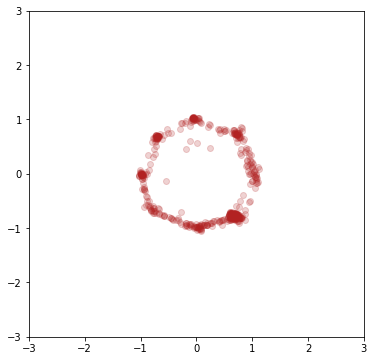

epoch 404
0.6901959180831909 0.7107824683189392


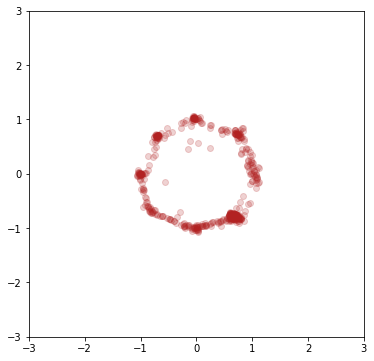

epoch 405
0.6871724128723145 0.6993514895439148


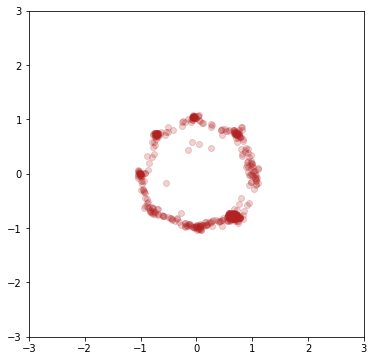

epoch 406
0.6902356743812561 0.7057591080665588


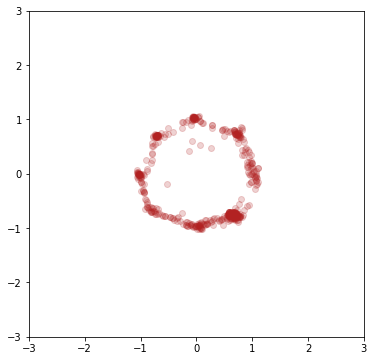

epoch 407
0.6900108456611633 0.7017577886581421


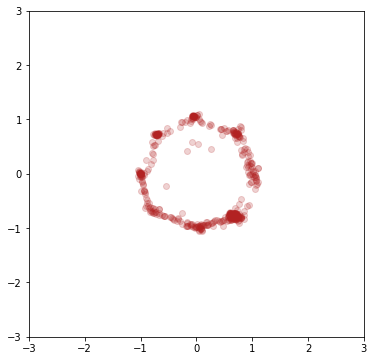

epoch 408
0.6884526014328003 0.7067785859107971


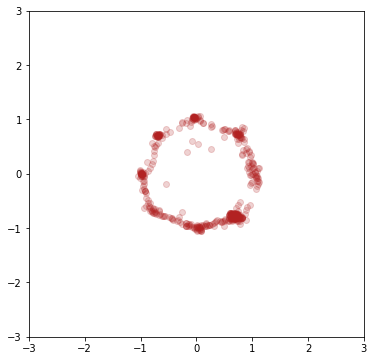

epoch 409
0.6896272301673889 0.6993176341056824


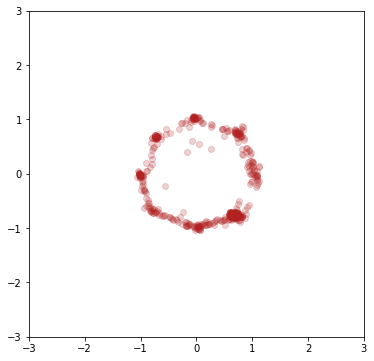

epoch 410
0.6862697005271912 0.7053769826889038


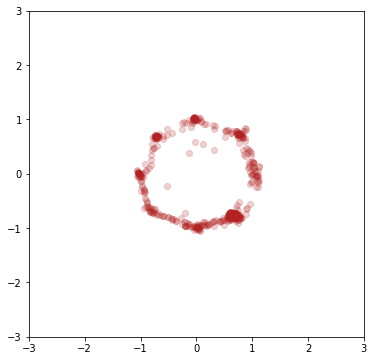

epoch 411
0.6930713653564453 0.7057340741157532


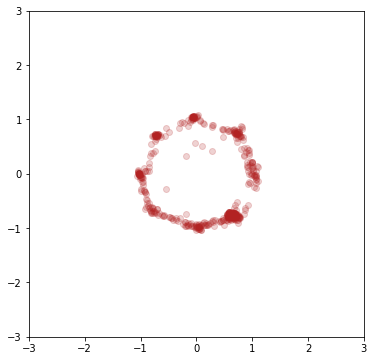

epoch 412
0.6867277026176453 0.7058658003807068


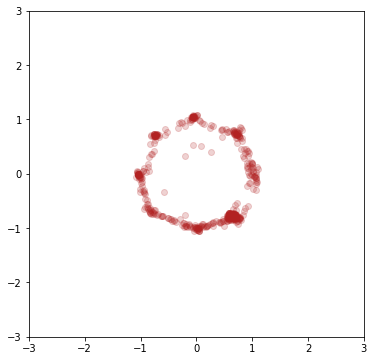

epoch 413
0.6910996437072754 0.6987385749816895


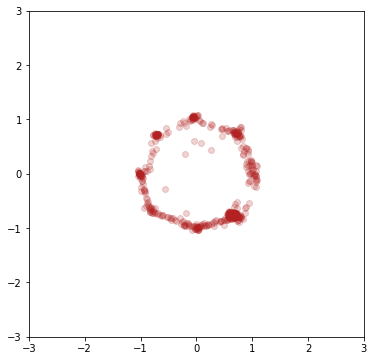

epoch 414
0.6906599402427673 0.7074246406555176


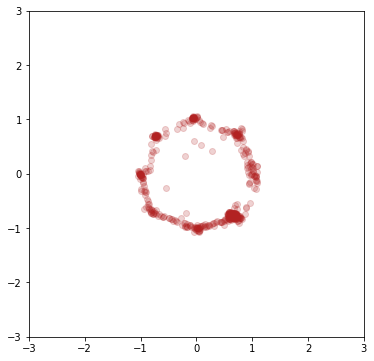

epoch 415
0.6923732161521912 0.709208071231842


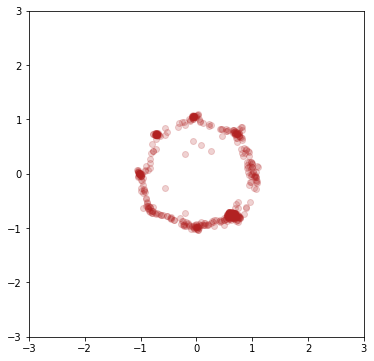

epoch 416
0.6893212199211121 0.7001913189888


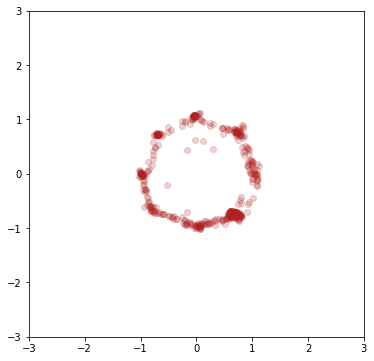

epoch 417
0.6907329559326172 0.7091020345687866


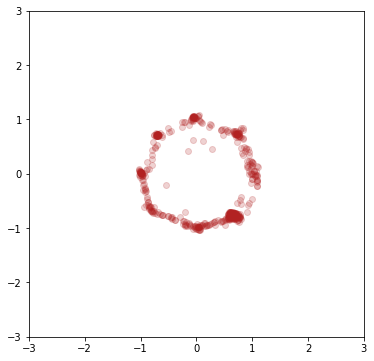

epoch 418
0.6896417737007141 0.7041457295417786


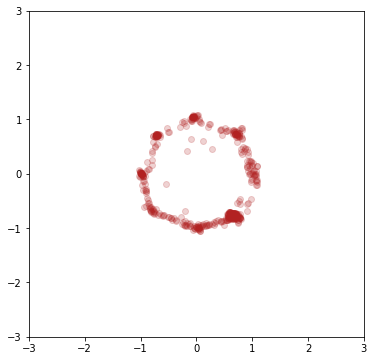

epoch 419
0.6892931461334229 0.7023510932922363


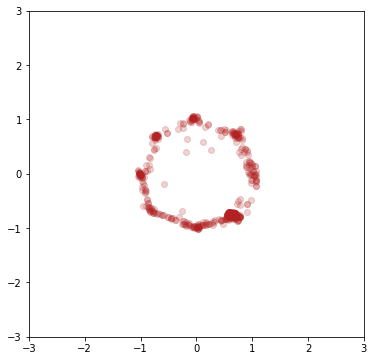

epoch 420
0.6921343803405762 0.705148458480835


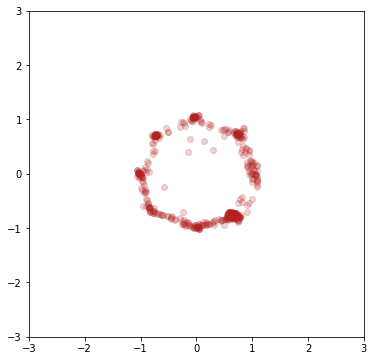

epoch 421
0.6909541487693787 0.7079536318778992


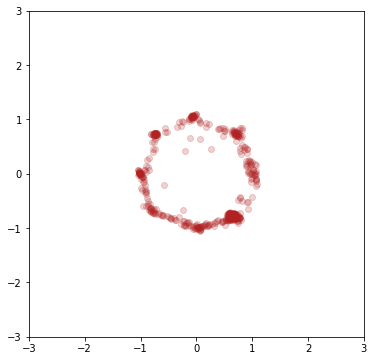

epoch 422
0.6924678087234497 0.7042350769042969


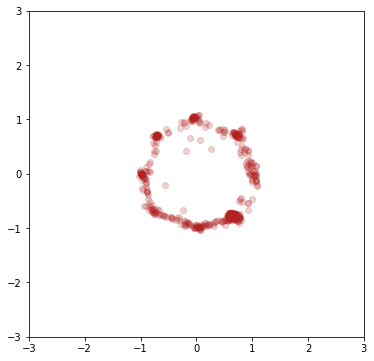

epoch 423
0.6892333030700684 0.6994219422340393


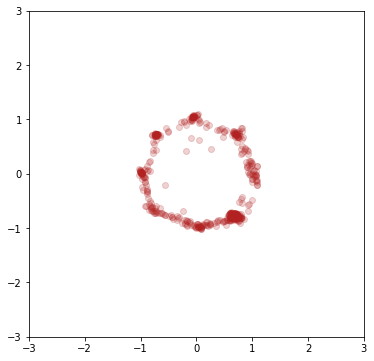

epoch 424
0.6901780962944031 0.7086973786354065


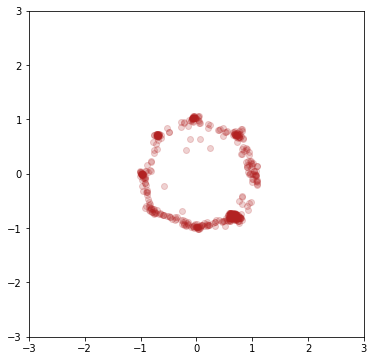

epoch 425
0.6917135715484619 0.7084716558456421


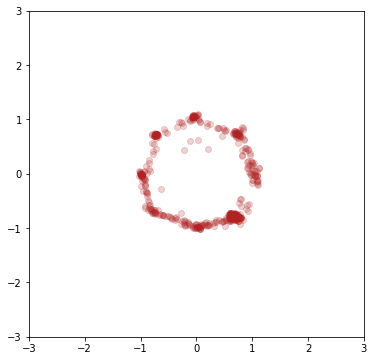

epoch 426
0.6927366852760315 0.7080514430999756


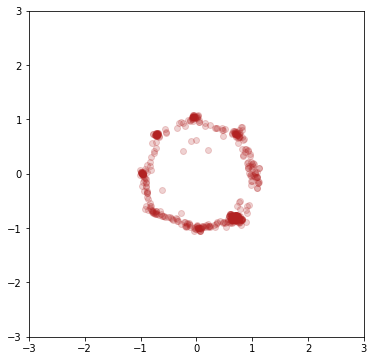

epoch 427
0.6919989585876465 0.705167829990387


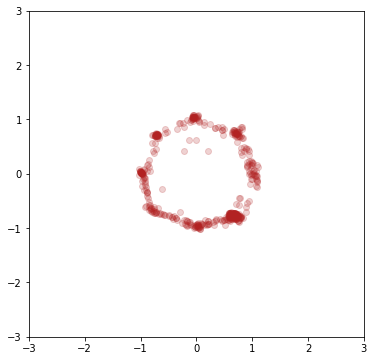

epoch 428
0.6901025176048279 0.706707239151001


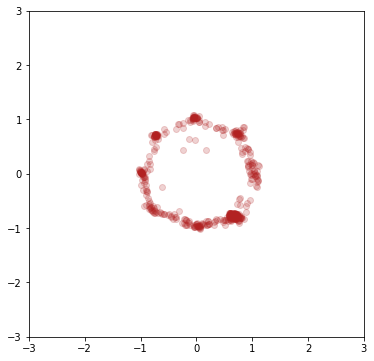

epoch 429
0.6866912841796875 0.7060922980308533


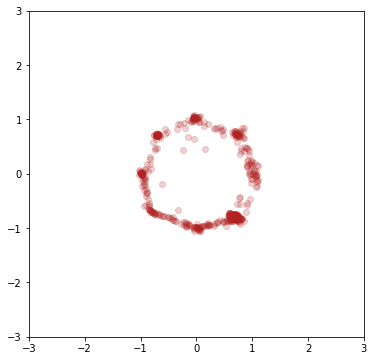

epoch 430
0.688059389591217 0.7079933881759644


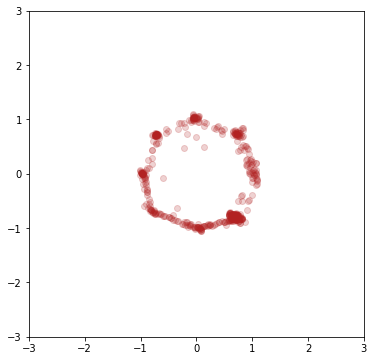

epoch 431
0.6907169818878174 0.703828752040863


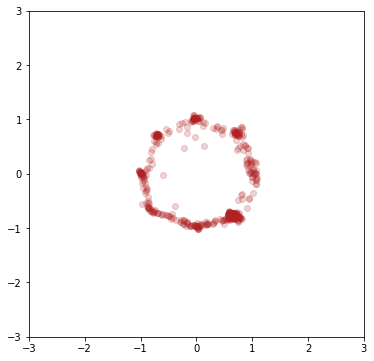

epoch 432
0.6906542181968689 0.7013200521469116


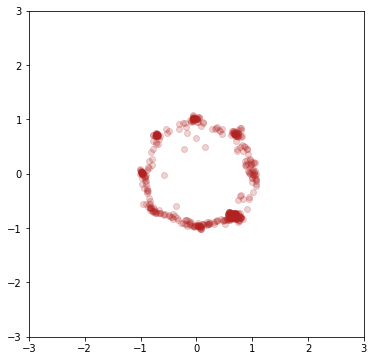

epoch 433
0.6899223923683167 0.6981372237205505


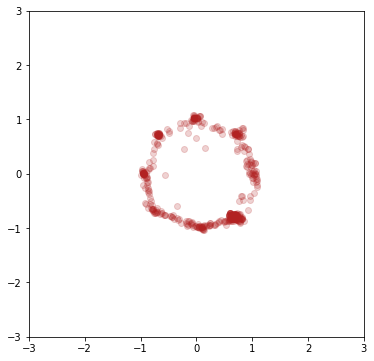

epoch 434
0.6880618333816528 0.7066231369972229


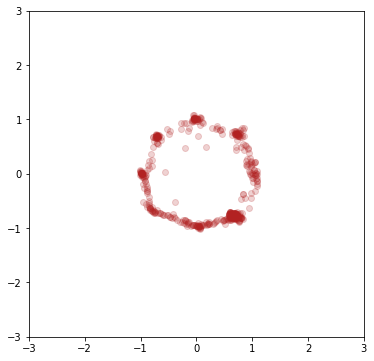

epoch 435
0.691470742225647 0.7011334300041199


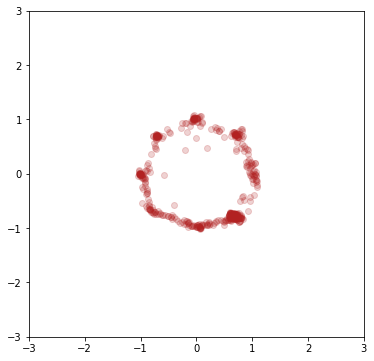

epoch 436
0.6914053559303284 0.7088060975074768


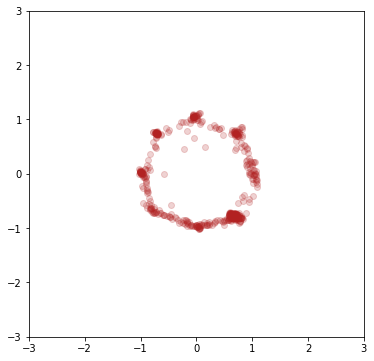

epoch 437
0.6882029175758362 0.706726610660553


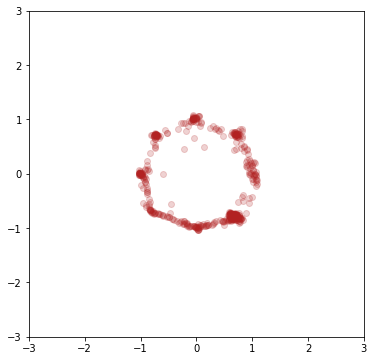

epoch 438
0.69435715675354 0.7055719494819641


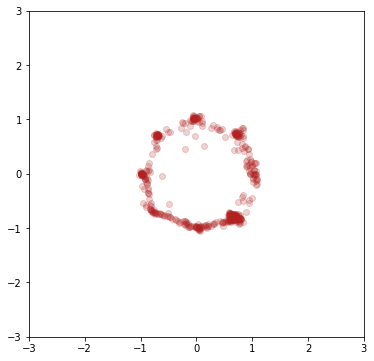

epoch 439
0.6941449642181396 0.7083877325057983


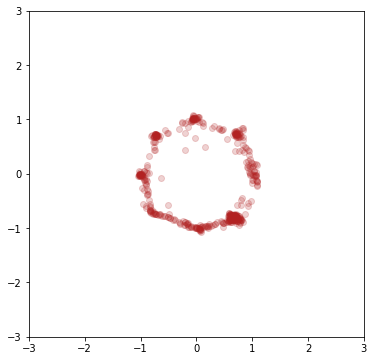

epoch 440
0.685534656047821 0.7045828104019165


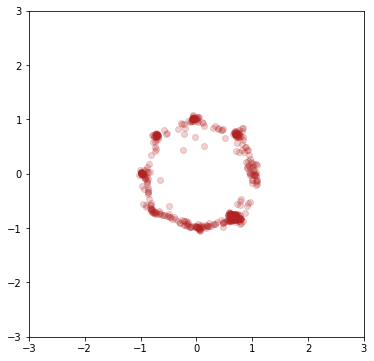

epoch 441
0.688947856426239 0.7053903937339783


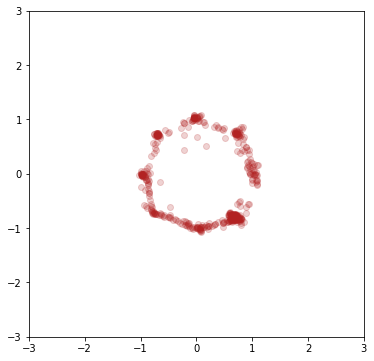

epoch 442
0.6914598345756531 0.7009326815605164


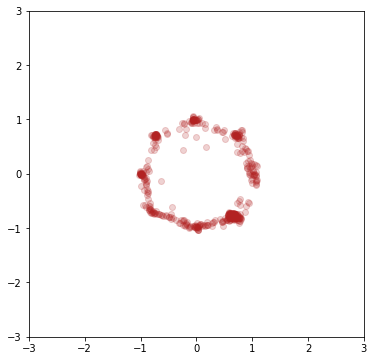

epoch 443
0.6872165203094482 0.7045266628265381


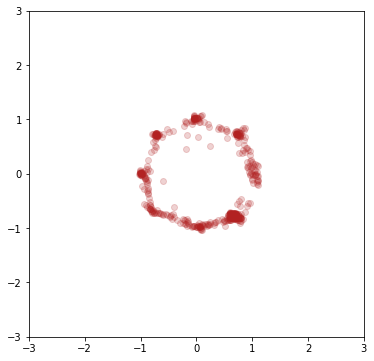

epoch 444
0.6910510063171387 0.7014774084091187


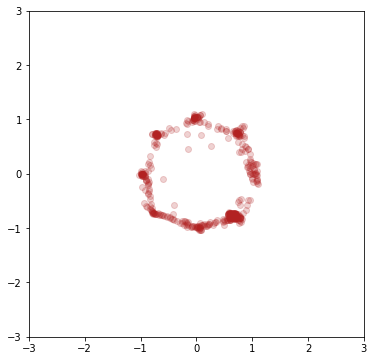

epoch 445
0.69078528881073 0.7112625241279602


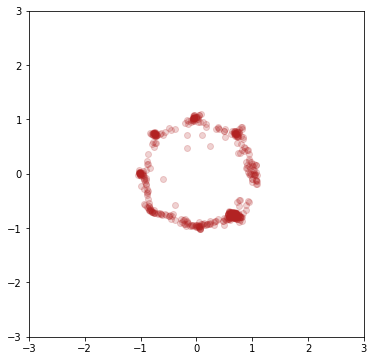

epoch 446
0.6891735196113586 0.7063838243484497


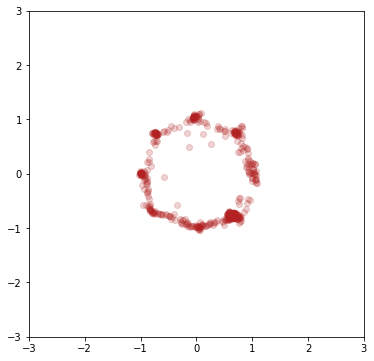

epoch 447
0.6919184923171997 0.7082908749580383


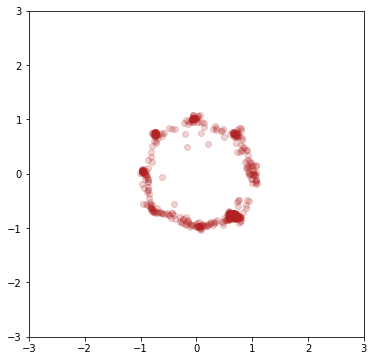

epoch 448
0.6919061541557312 0.7043545246124268


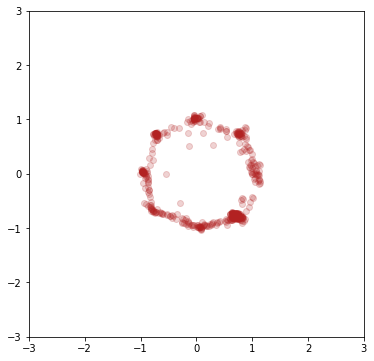

epoch 449
0.6916301250457764 0.7056410908699036


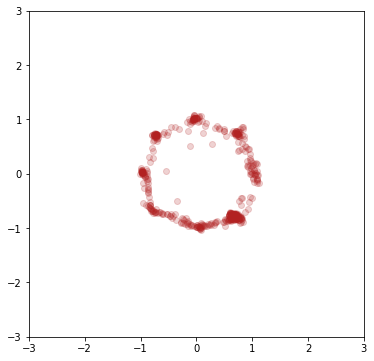

epoch 450
0.6921171545982361 0.7006672620773315


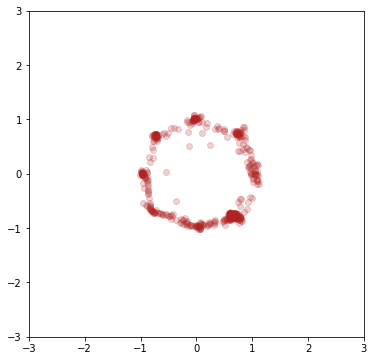

epoch 451
0.6882891654968262 0.7014307975769043


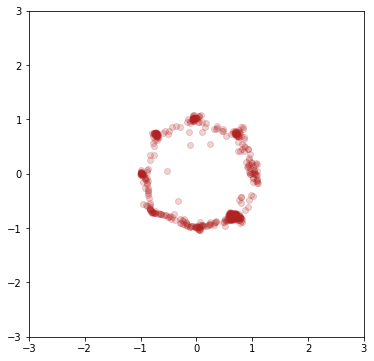

epoch 452
0.6912496089935303 0.6991919875144958


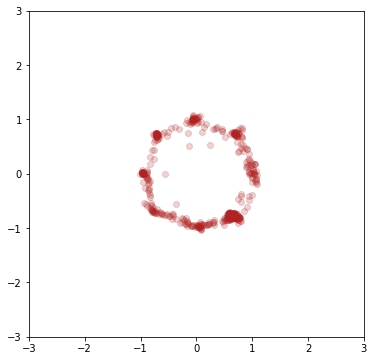

epoch 453
0.6930168271064758 0.6981808543205261


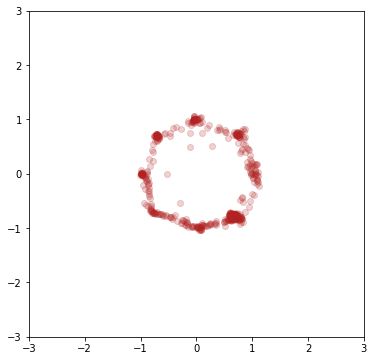

epoch 454
0.6882877945899963 0.7021846175193787


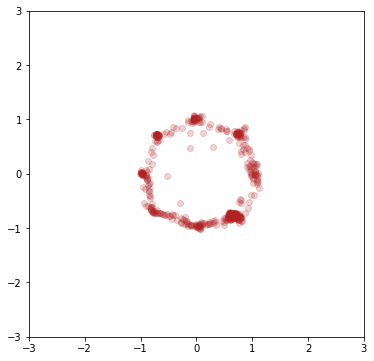

epoch 455
0.6900476217269897 0.7038780450820923


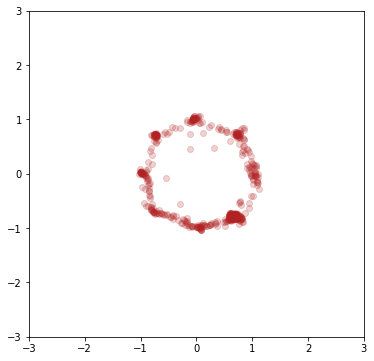

epoch 456
0.68946373462677 0.7020813822746277


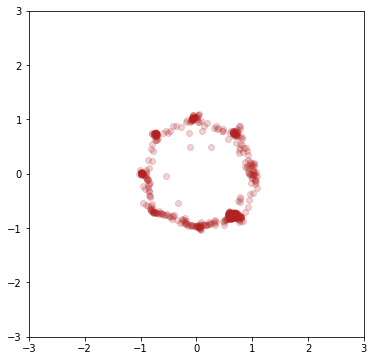

epoch 457
0.6938014030456543 0.6967800855636597


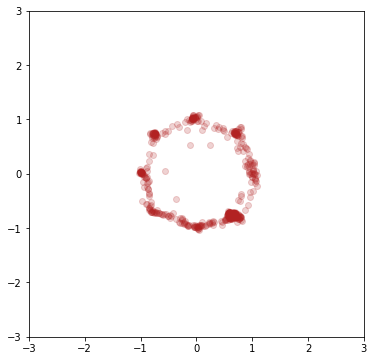

epoch 458
0.6921448707580566 0.7006715536117554


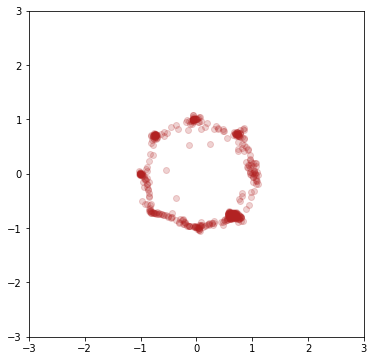

epoch 459
0.6893705725669861 0.7083280682563782


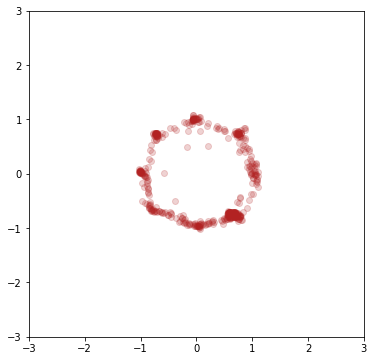

epoch 460
0.6903068423271179 0.7016163468360901


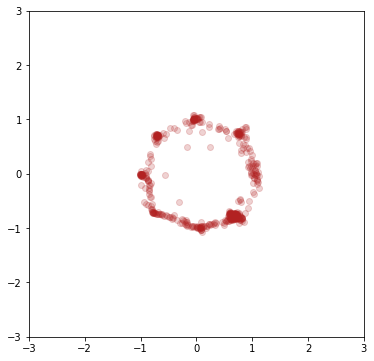

epoch 461
0.688504159450531 0.7028171420097351


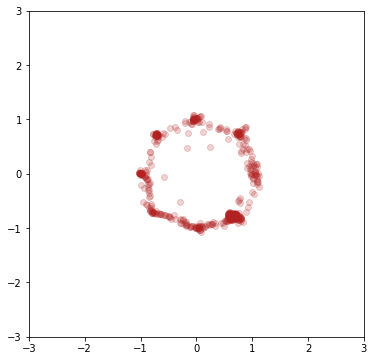

epoch 462
0.6891751885414124 0.7081729173660278


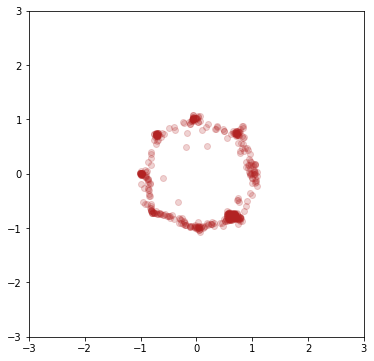

epoch 463
0.6912953853607178 0.7028931975364685


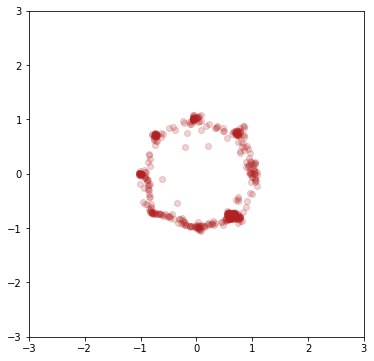

epoch 464
0.6858201622962952 0.7066570520401001


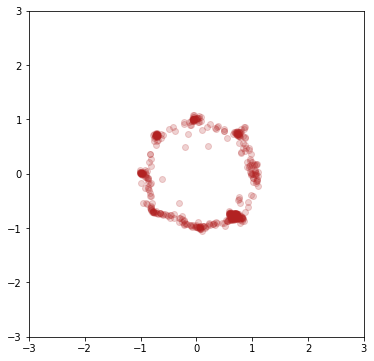

epoch 465
0.6904205083847046 0.7066699266433716


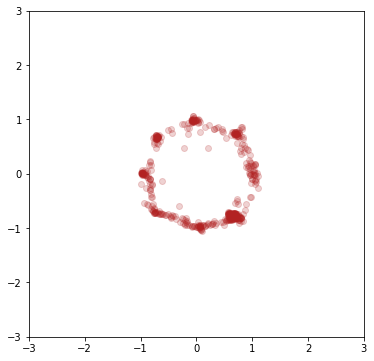

epoch 466
0.6907095313072205 0.7054650187492371


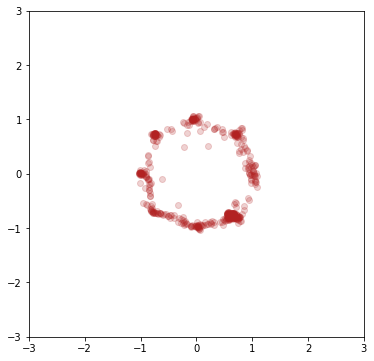

epoch 467
0.6922694444656372 0.6994564533233643


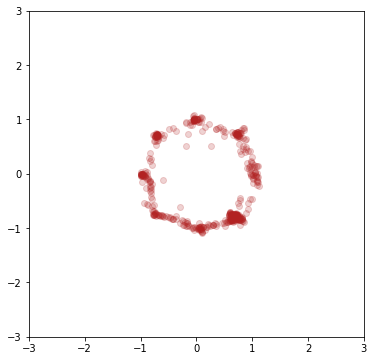

epoch 468
0.6946827173233032 0.707568347454071


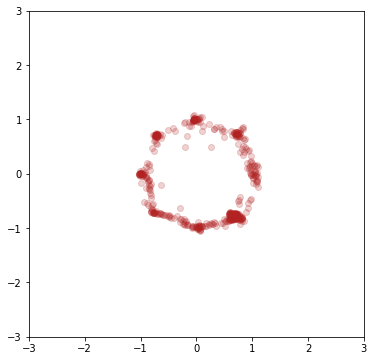

epoch 469
0.6909351944923401 0.7010165452957153


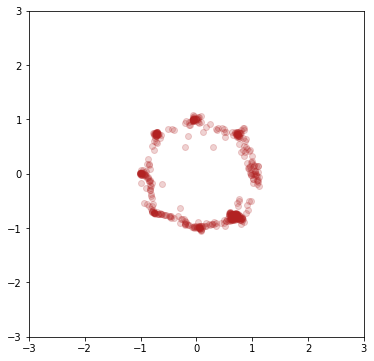

epoch 470
0.688027024269104 0.7074728608131409


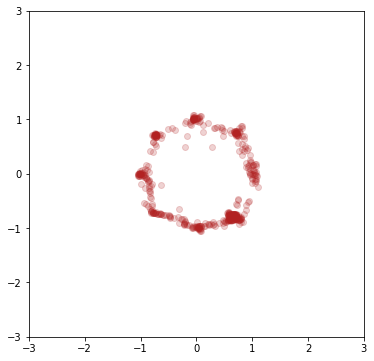

epoch 471
0.6916563510894775 0.7042754292488098


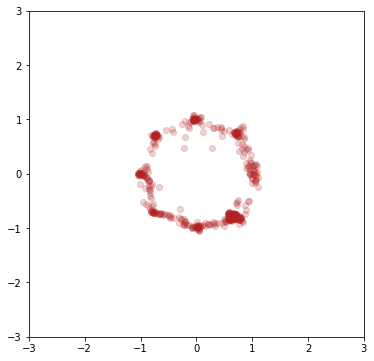

epoch 472
0.6914168000221252 0.70598304271698


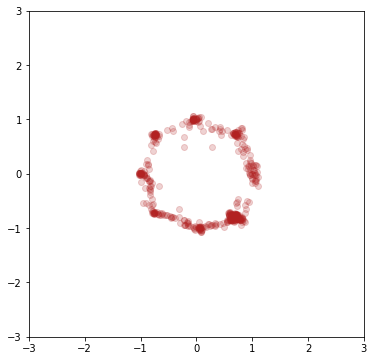

epoch 473
0.6904022097587585 0.6975100636482239


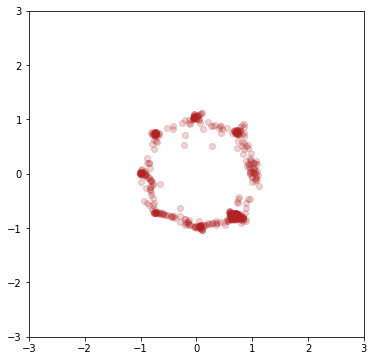

epoch 474
0.6889609694480896 0.6986178755760193


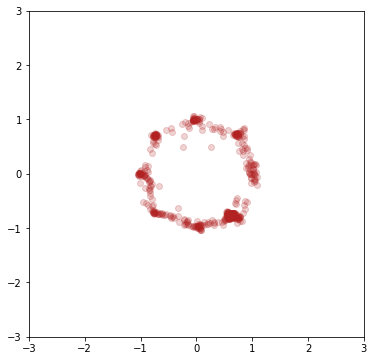

epoch 475
0.6901154518127441 0.7038662433624268


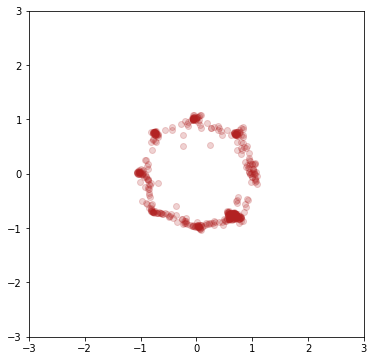

epoch 476
0.6883010864257812 0.7112261056900024


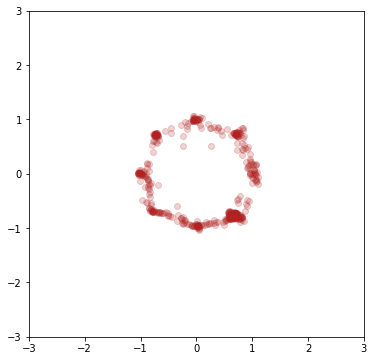

epoch 477
0.6910564303398132 0.7040745615959167


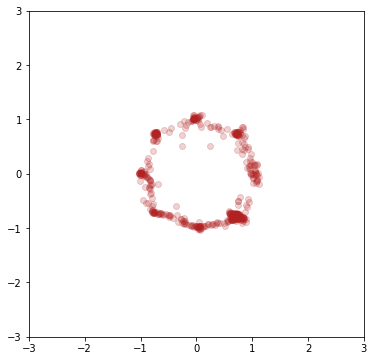

epoch 478
0.6952002048492432 0.7067052721977234


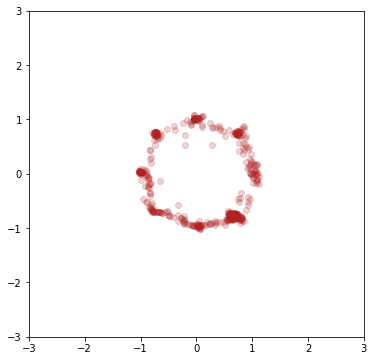

epoch 479
0.6895157098770142 0.7052666544914246


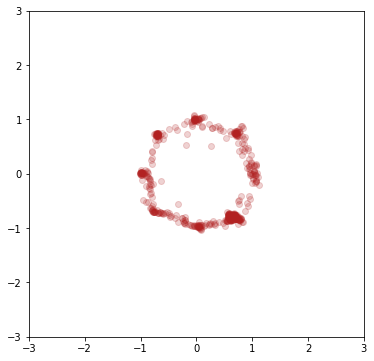

epoch 480
0.6892235279083252 0.7016452550888062


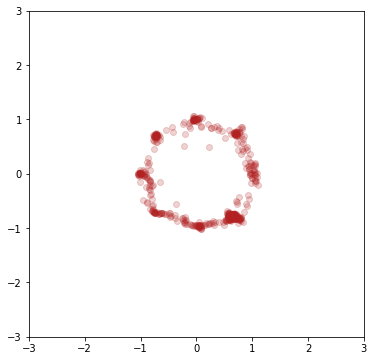

epoch 481
0.689809262752533 0.6955379247665405


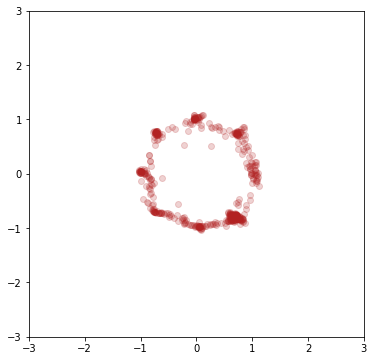

epoch 482
0.6927996873855591 0.705686628818512


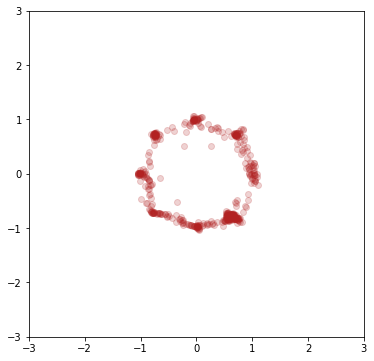

epoch 483
0.6881980299949646 0.702004075050354


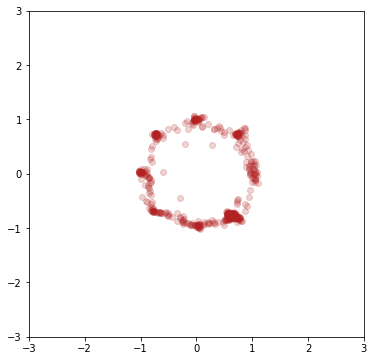

epoch 484
0.6894645094871521 0.706311047077179


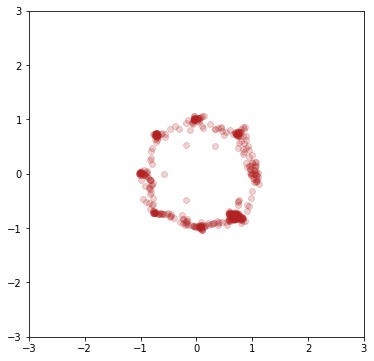

epoch 485
0.6895250678062439 0.7040576338768005


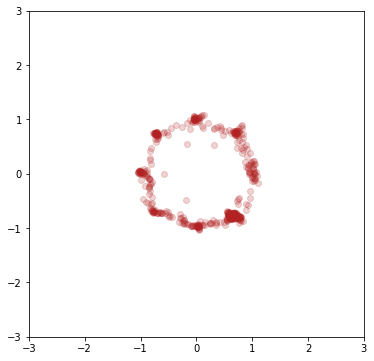

epoch 486
0.6908828616142273 0.7115054130554199


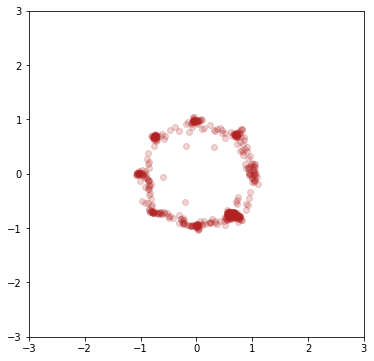

epoch 487
0.6882815361022949 0.701639711856842


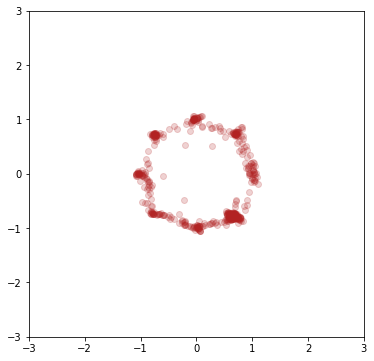

epoch 488
0.6893088817596436 0.7053097486495972


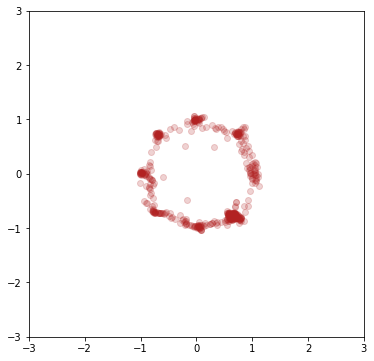

epoch 489
0.6879903674125671 0.6915068030357361


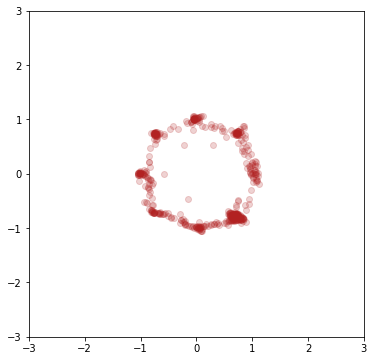

epoch 490
0.6898484826087952 0.6988367438316345


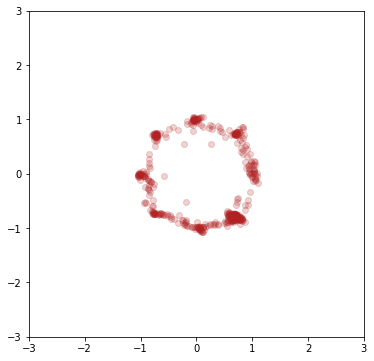

epoch 491
0.6887856125831604 0.7049280405044556


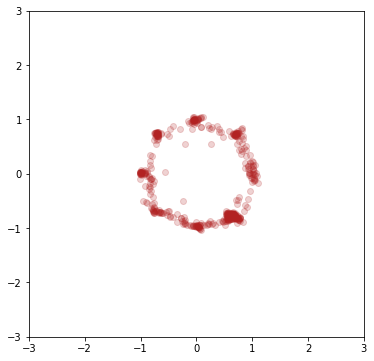

epoch 492
0.6925517320632935 0.7005023956298828


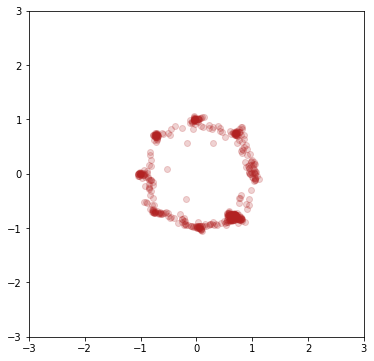

epoch 493
0.691580057144165 0.7052644491195679


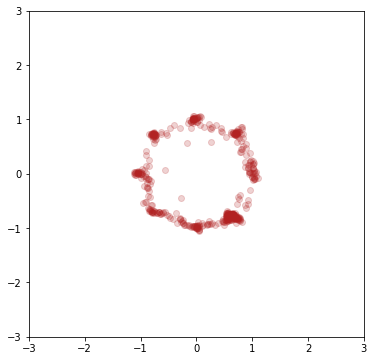

epoch 494
0.6896536350250244 0.703606128692627


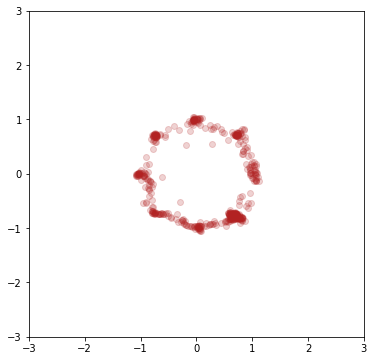

epoch 495
0.6930201649665833 0.6986342668533325


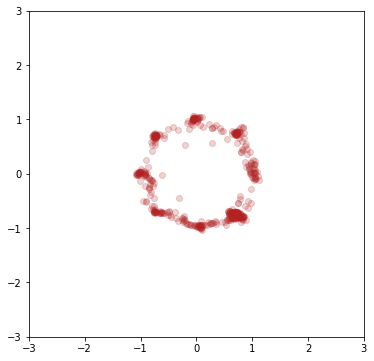

epoch 496
0.6888384222984314 0.7038480639457703


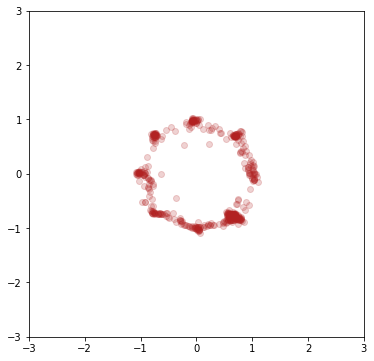

epoch 497
0.6916528940200806 0.7042443156242371


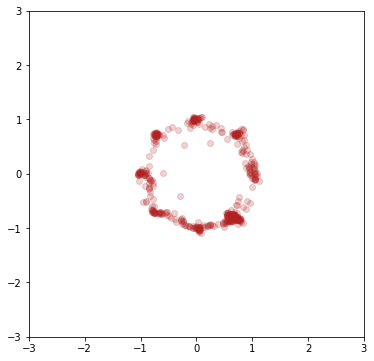

epoch 498
0.6914149522781372 0.6955087184906006


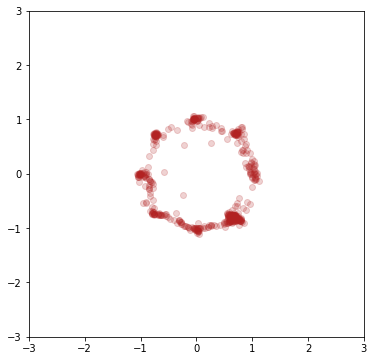

epoch 499
0.6900672912597656 0.6985092163085938


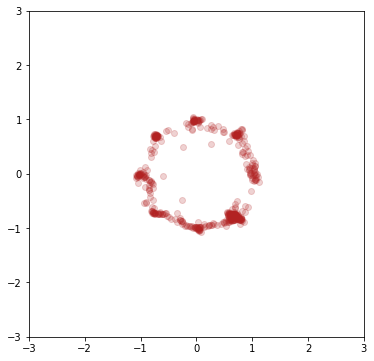

epoch 500
0.6923927068710327 0.7053053379058838


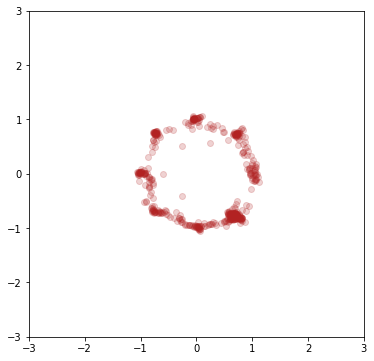

epoch 501
0.6904732584953308 0.7015181183815002


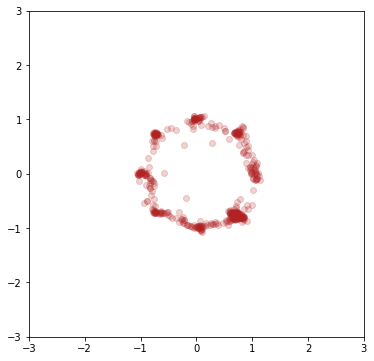

epoch 502
0.6922300457954407 0.7069541811943054


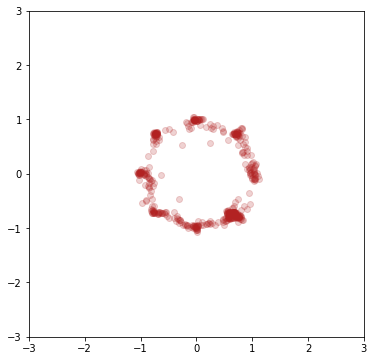

epoch 503
0.6915361285209656 0.7100010514259338


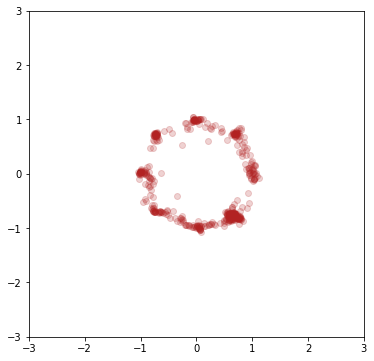

epoch 504
0.6944484114646912 0.7004339694976807


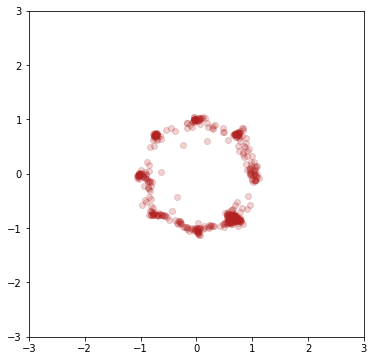

epoch 505
0.6915841102600098 0.7064220905303955


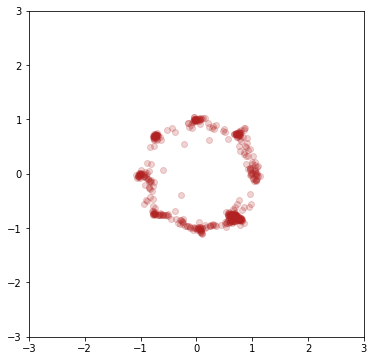

epoch 506
0.6916564702987671 0.7068798542022705


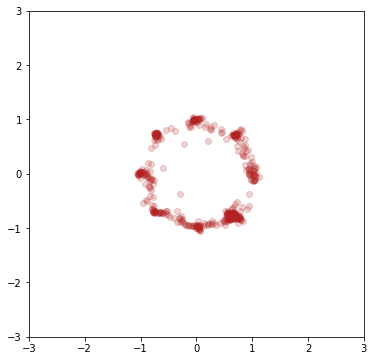

epoch 507
0.6943997740745544 0.7035666704177856


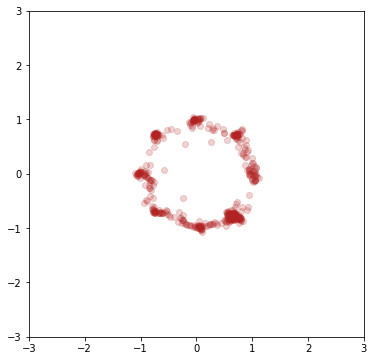

epoch 508
0.688188910484314 0.705680787563324


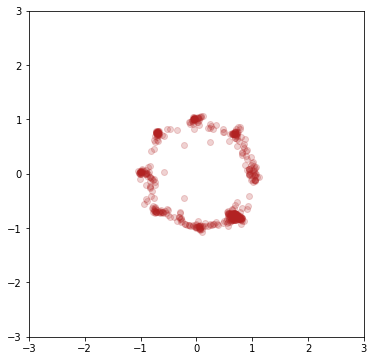

epoch 509
0.6929630041122437 0.7054445147514343


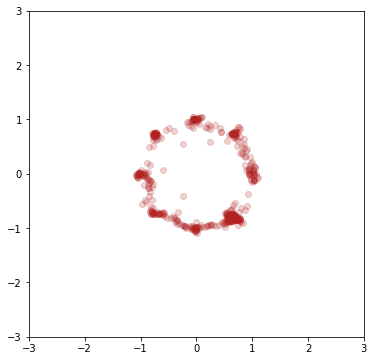

epoch 510
0.6935213208198547 0.7021205425262451


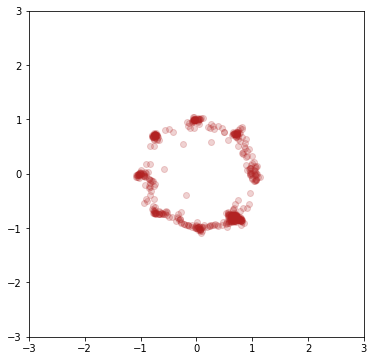

epoch 511
0.6937658786773682 0.7019779682159424


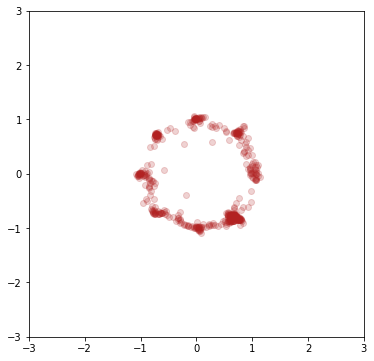

epoch 512
0.6909569501876831 0.7150709629058838


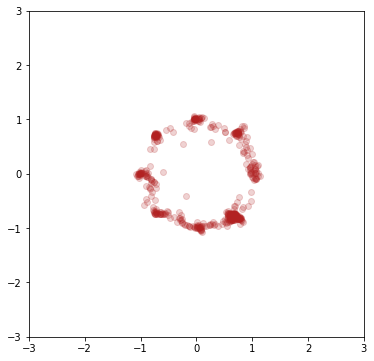

epoch 513
0.690327525138855 0.704026460647583


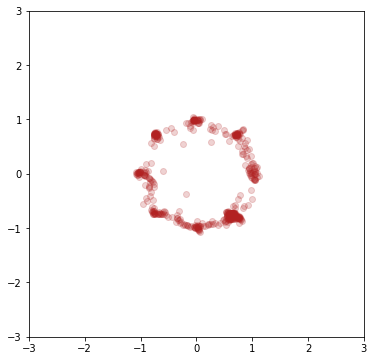

epoch 514
0.6891748309135437 0.7077991962432861


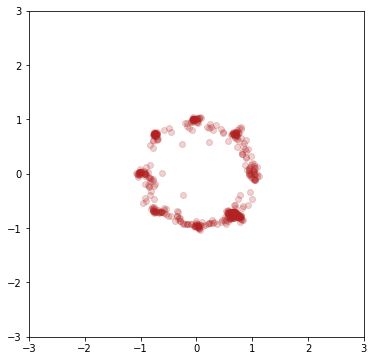

epoch 515
0.6909594535827637 0.7011561393737793


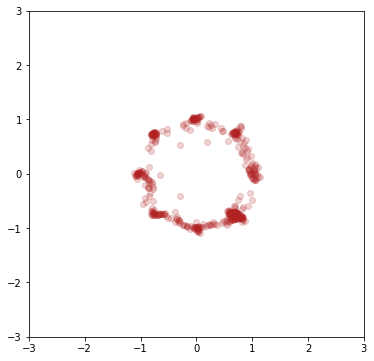

epoch 516
0.6935400366783142 0.6967082023620605


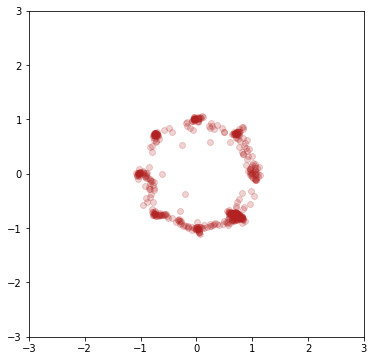

epoch 517
0.6901438236236572 0.7023652791976929


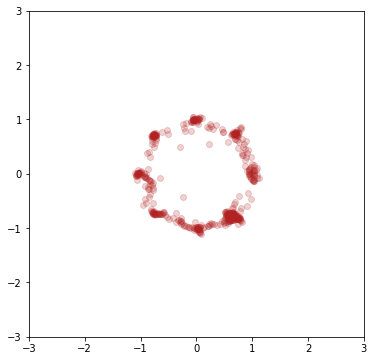

epoch 518
0.6908929347991943 0.7011480927467346


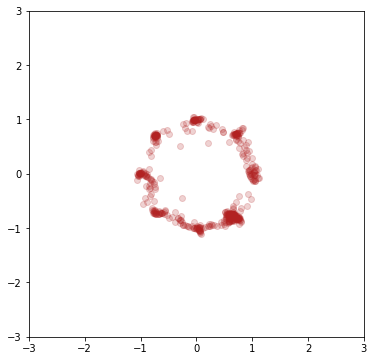

epoch 519
0.6920718550682068 0.7027023434638977


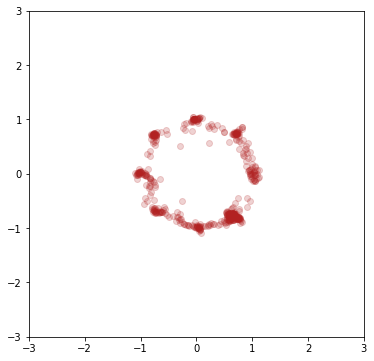

epoch 520
0.6916195154190063 0.705870509147644


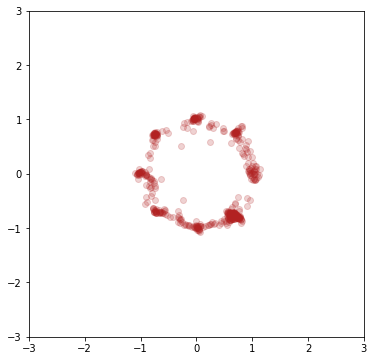

epoch 521
0.6917831301689148 0.7050206661224365


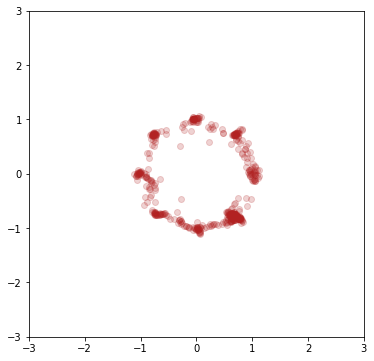

epoch 522
0.6889970898628235 0.7080748677253723


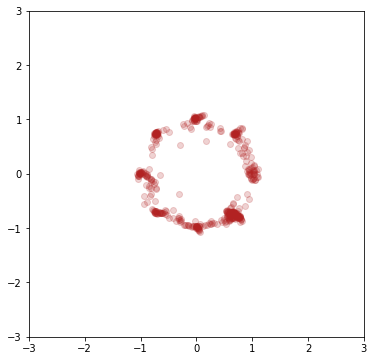

epoch 523
0.6927140951156616 0.7007953524589539


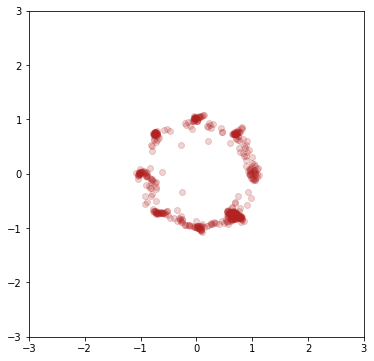

epoch 524
0.6923680305480957 0.7084516882896423


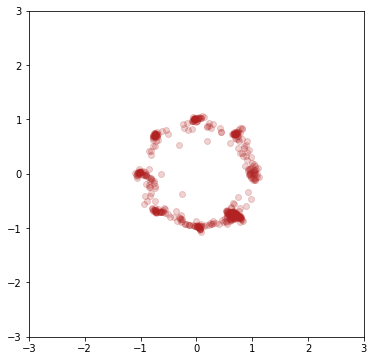

epoch 525
0.6869180202484131 0.7094272375106812


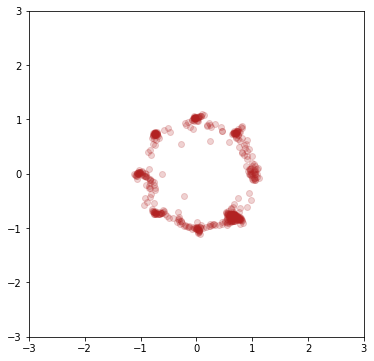

epoch 526
0.686707615852356 0.7106992602348328


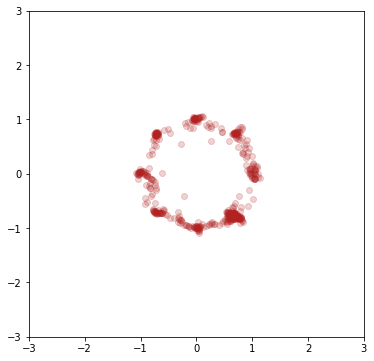

epoch 527
0.6906976103782654 0.7091634273529053


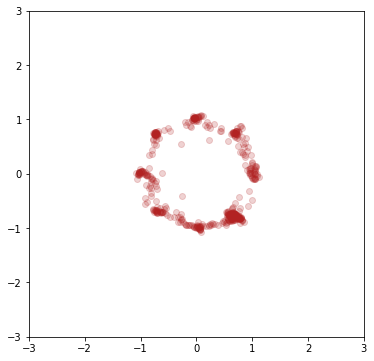

epoch 528
0.6879504323005676 0.7014175653457642


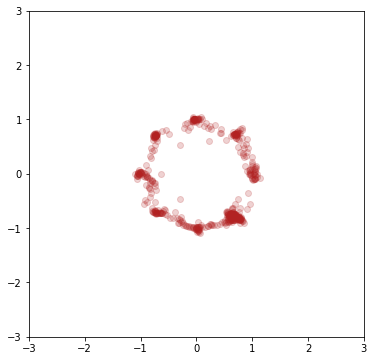

epoch 529
0.6931563019752502 0.7071747779846191


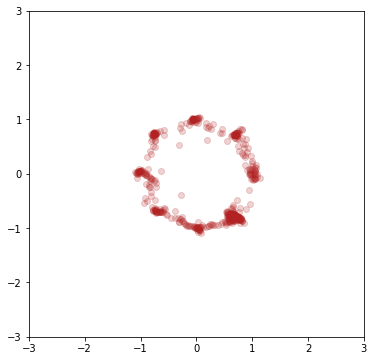

epoch 530
0.6891125440597534 0.7025461792945862


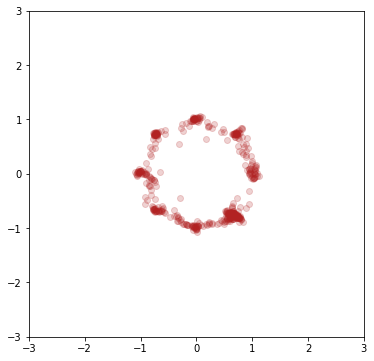

epoch 531
0.6919586062431335 0.6983901858329773


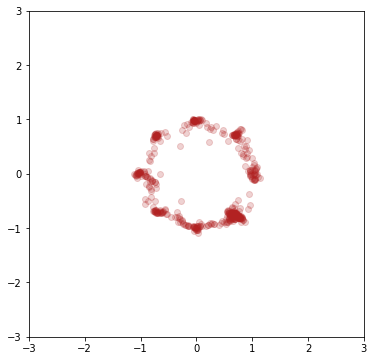

epoch 532
0.6901038885116577 0.7061691880226135


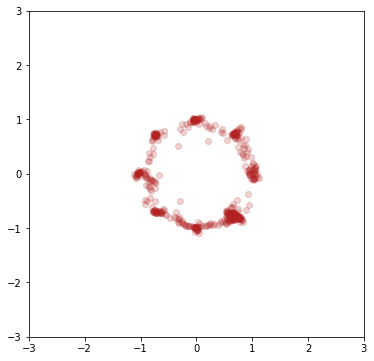

epoch 533
0.6886223554611206 0.712629497051239


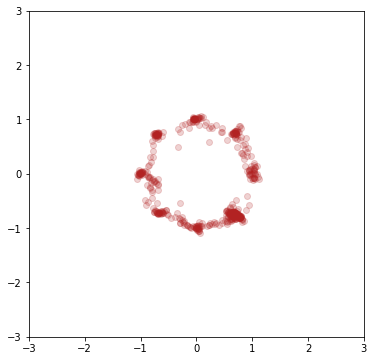

epoch 534
0.6917130947113037 0.7058767676353455


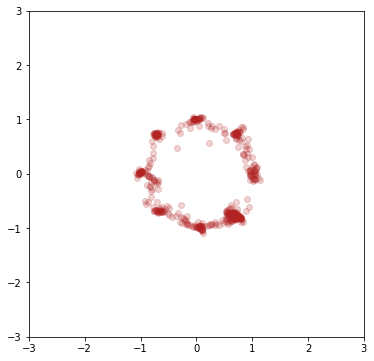

epoch 535
0.6919898390769958 0.7059095501899719


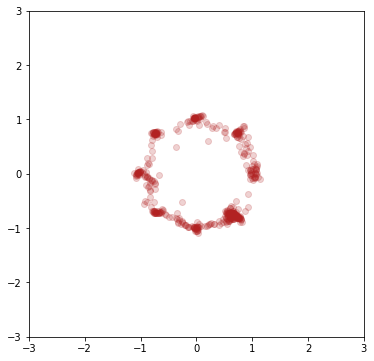

epoch 536
0.6970250606536865 0.7004600763320923


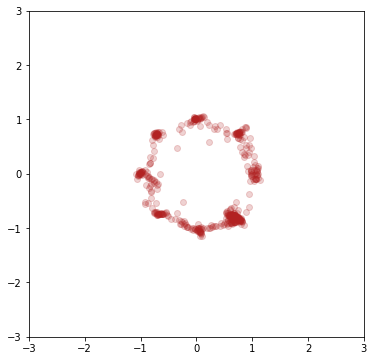

epoch 537
0.6921981573104858 0.7022127509117126


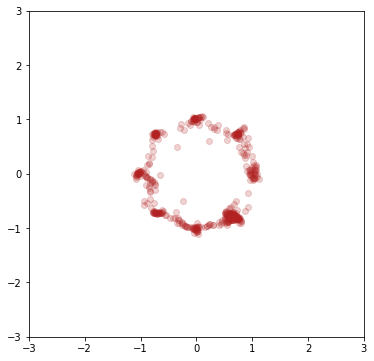

epoch 538
0.6877912878990173 0.6996305584907532


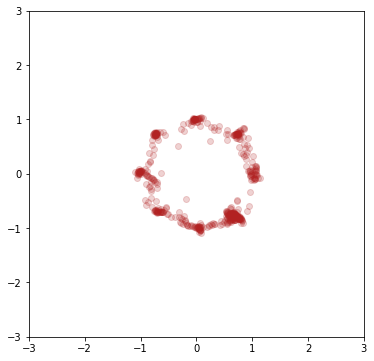

epoch 539
0.6939222812652588 0.7004984021186829


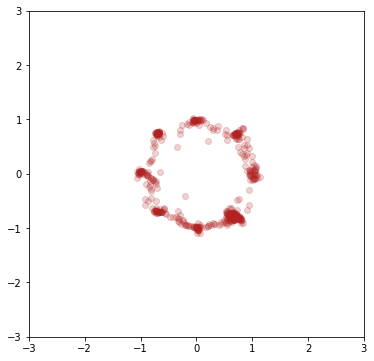

epoch 540
0.6914215683937073 0.7077726125717163


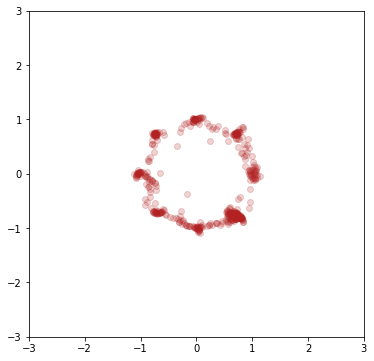

epoch 541
0.6946732401847839 0.7063358426094055


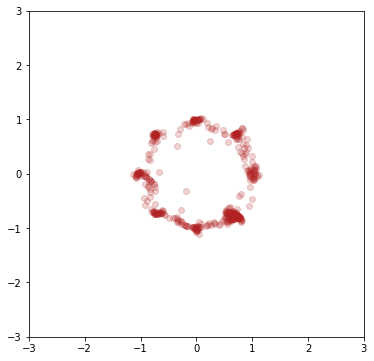

epoch 542
0.6939128041267395 0.7047958374023438


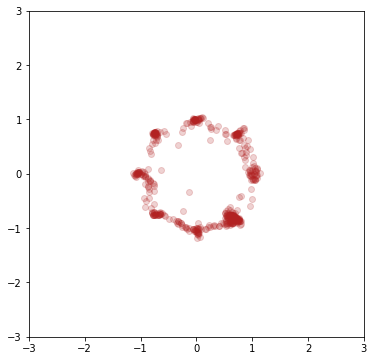

epoch 543
0.6942390203475952 0.6965429782867432


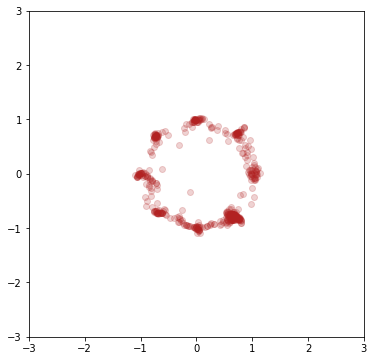

epoch 544
0.6918071508407593 0.7021723389625549


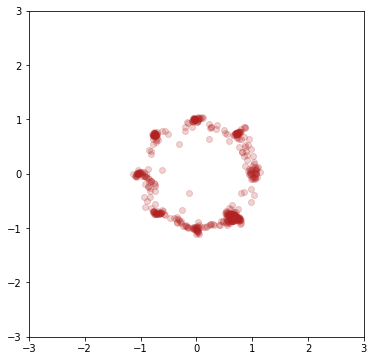

epoch 545
0.6902117729187012 0.7029094099998474


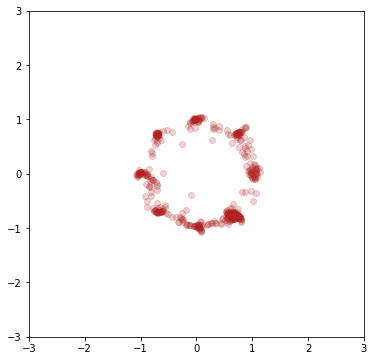

epoch 546
0.6945666670799255 0.7101331949234009


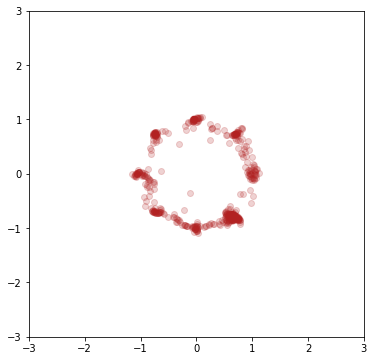

epoch 547
0.6894778609275818 0.704866349697113


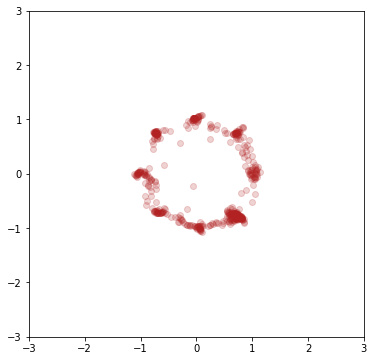

epoch 548
0.6937656998634338 0.710935115814209


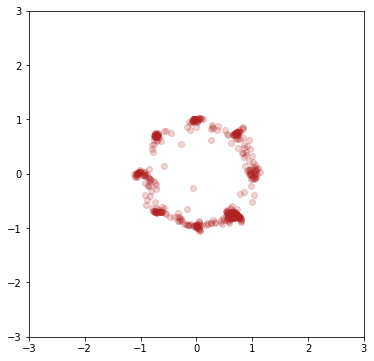

epoch 549
0.6907033324241638 0.7046685814857483


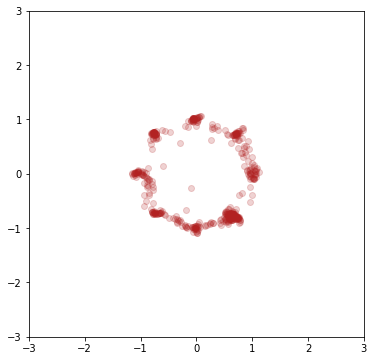

epoch 550
0.6902263760566711 0.7011308073997498


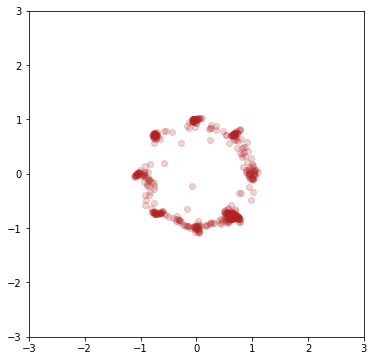

epoch 551
0.6909177303314209 0.7035258412361145


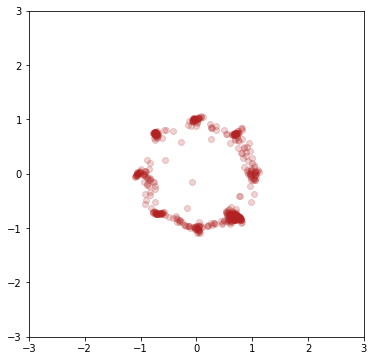

epoch 552
0.6940761804580688 0.7069562673568726


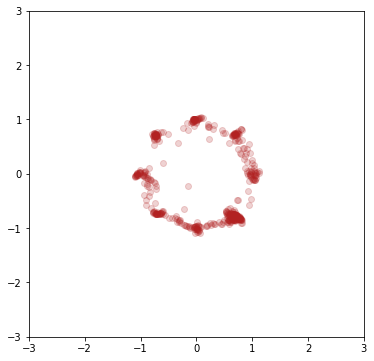

epoch 553
0.6894612312316895 0.7018448710441589


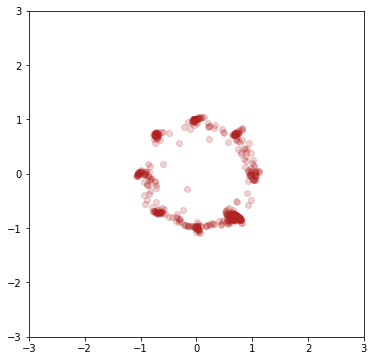

epoch 554
0.6896848082542419 0.7047649621963501


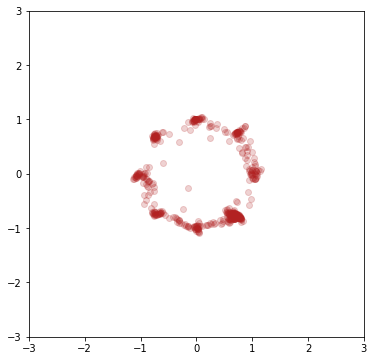

epoch 555
0.6907974481582642 0.7084991931915283


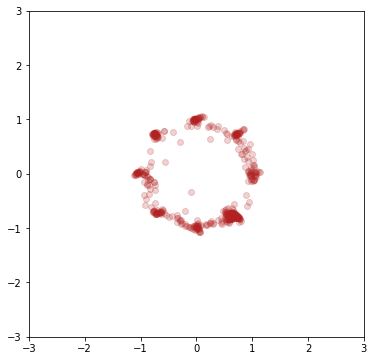

epoch 556
0.6947686672210693 0.7029892206192017


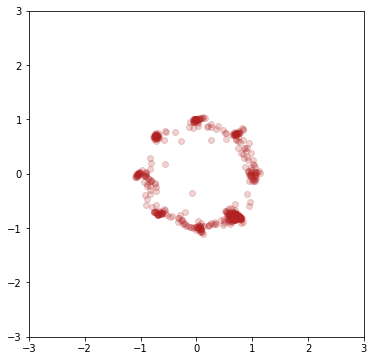

epoch 557
0.6931112408638 0.6974155306816101


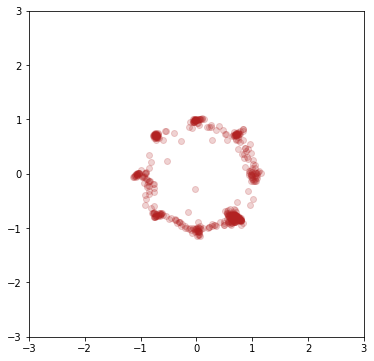

epoch 558
0.6919117569923401 0.7047767639160156


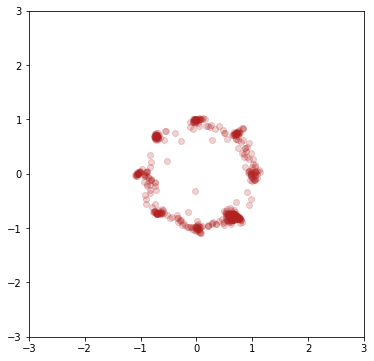

epoch 559
0.6938236951828003 0.7029841542243958


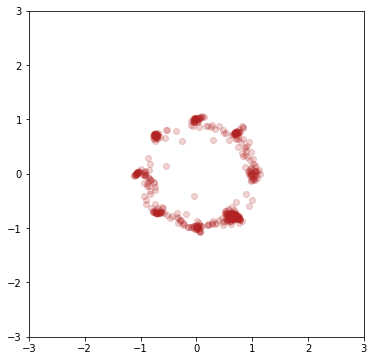

epoch 560
0.6919400691986084 0.7109729647636414


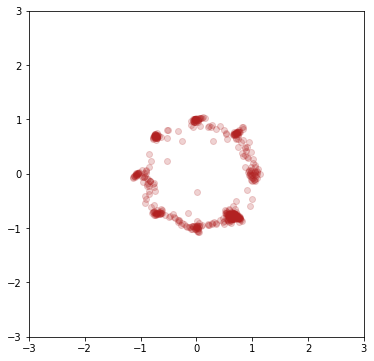

epoch 561
0.6939430832862854 0.7027640342712402


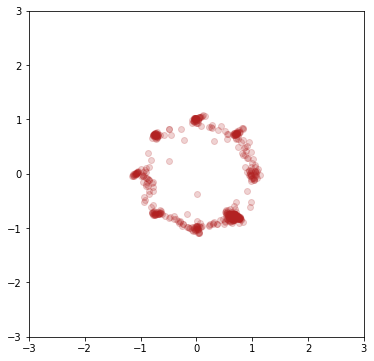

epoch 562
0.6908025145530701 0.7030523419380188


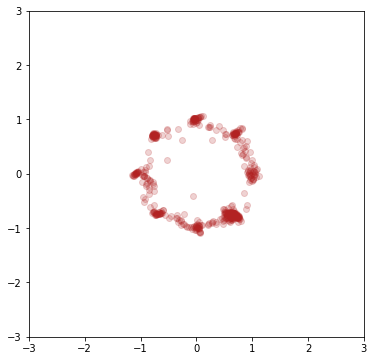

epoch 563
0.6919293403625488 0.7027347683906555


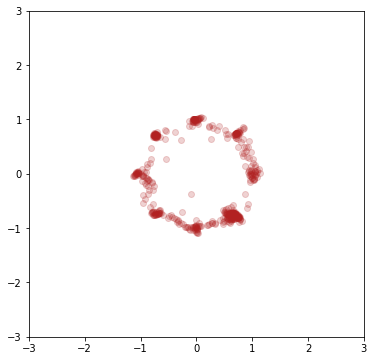

epoch 564
0.6945410370826721 0.7033778429031372


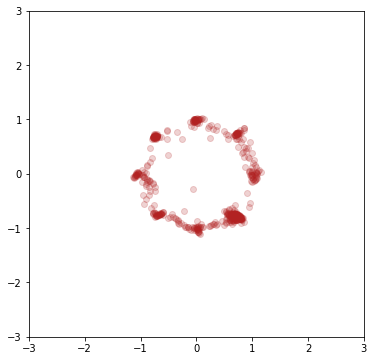

epoch 565
0.6925967335700989 0.7004440426826477


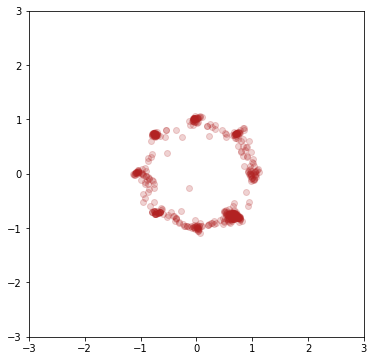

epoch 566
0.6921937465667725 0.7079420685768127


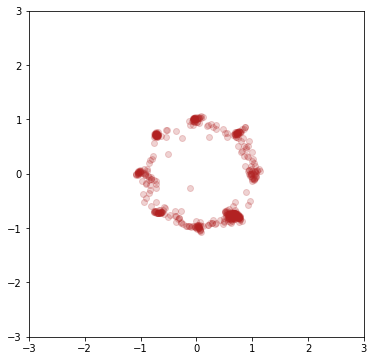

epoch 567
0.6929768323898315 0.7066304087638855


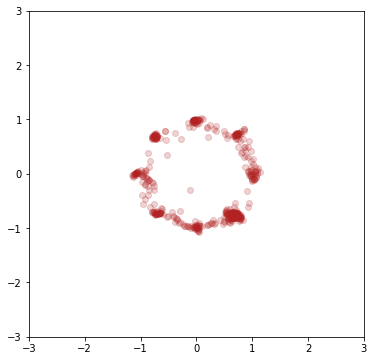

epoch 568
0.6938591003417969 0.7049713134765625


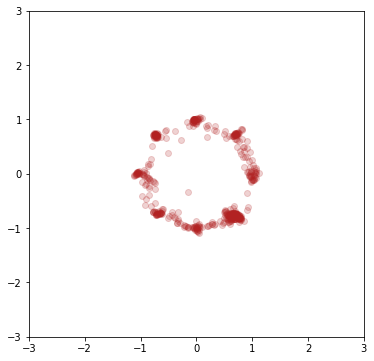

epoch 569
0.6954631209373474 0.6973767280578613


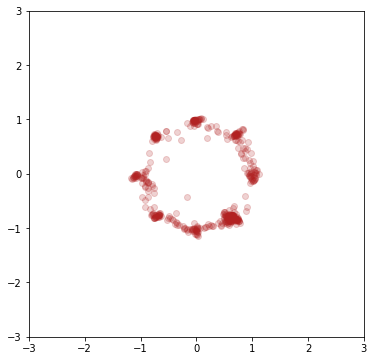

epoch 570
0.6898054480552673 0.7056174278259277


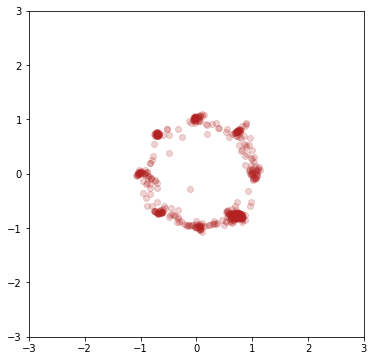

epoch 571
0.6921617984771729 0.7088268399238586


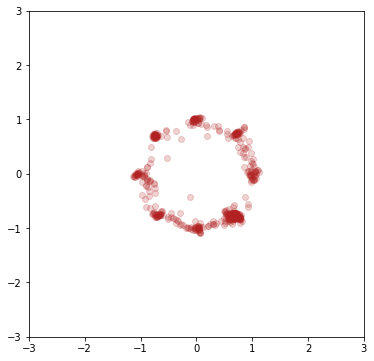

epoch 572
0.6896124482154846 0.7063735723495483


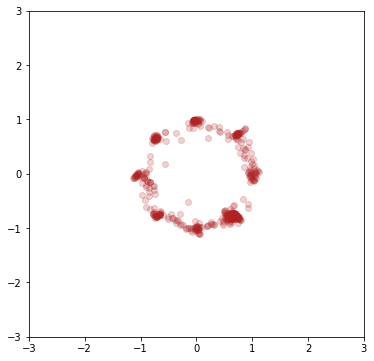

epoch 573
0.6896051168441772 0.69916832447052


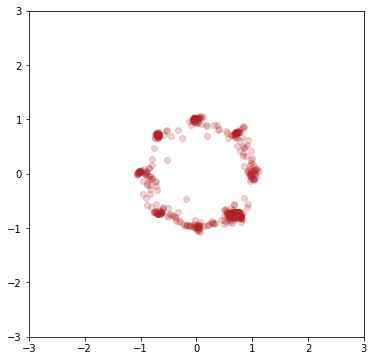

epoch 574
0.6903315186500549 0.7111939191818237


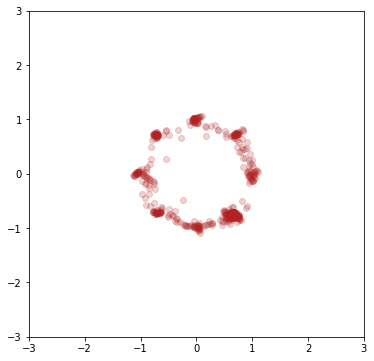

epoch 575
0.691927969455719 0.7081947922706604


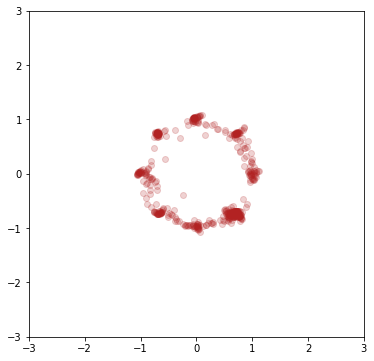

epoch 576
0.6948634386062622 0.7035185098648071


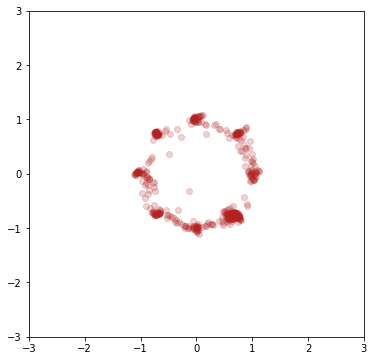

epoch 577
0.6907936334609985 0.7022680640220642


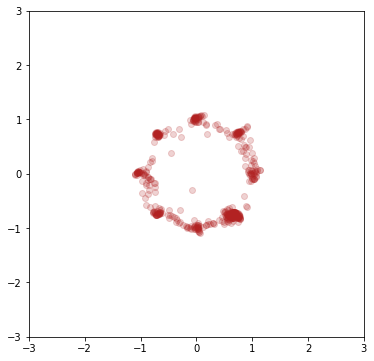

epoch 578
0.6947009563446045 0.7011963129043579


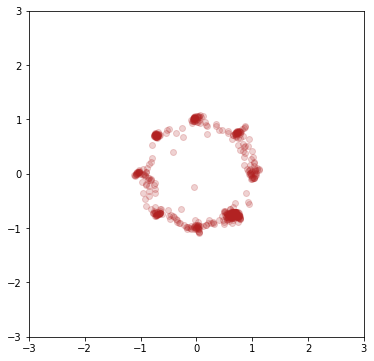

epoch 579
0.6943598389625549 0.703249990940094


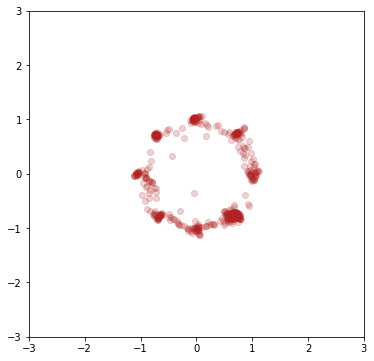

epoch 580
0.6929700374603271 0.7081966996192932


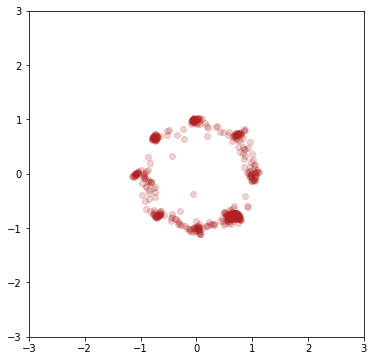

epoch 581
0.6911365985870361 0.706007719039917


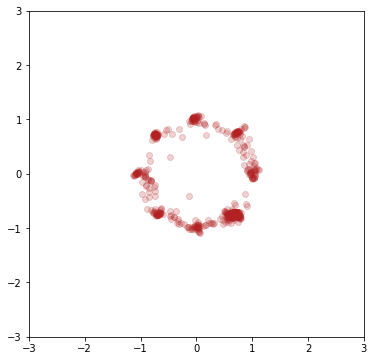

epoch 582
0.6935806274414062 0.7088593244552612


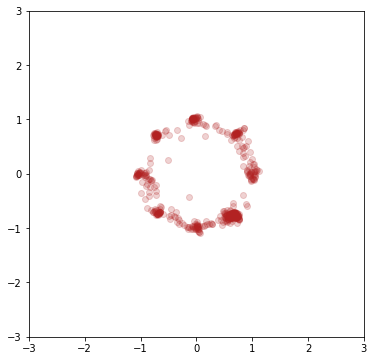

epoch 583
0.6896896958351135 0.7051713466644287


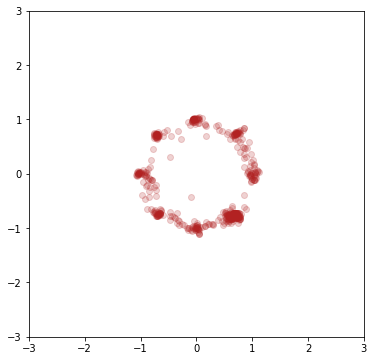

epoch 584
0.6918664574623108 0.7031348943710327


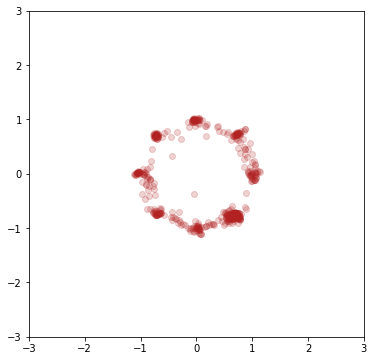

epoch 585
0.6938179135322571 0.7022119164466858


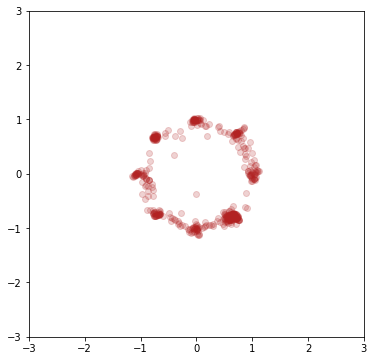

epoch 586
0.6921389102935791 0.7010481953620911


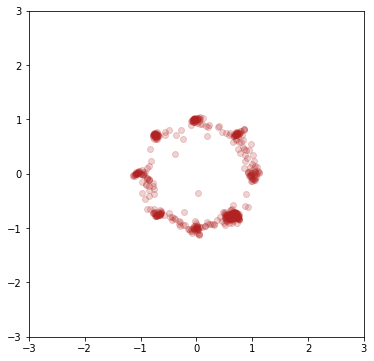

epoch 587
0.6930410861968994 0.7062475681304932


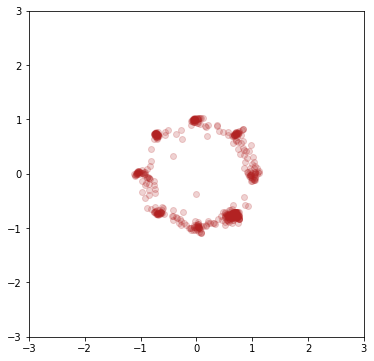

epoch 588
0.6910658478736877 0.6968298554420471


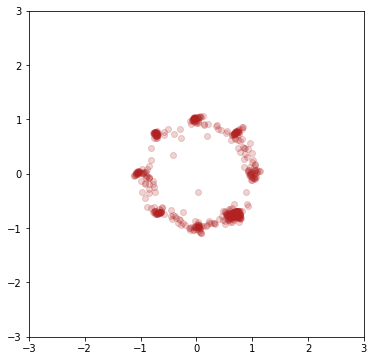

epoch 589
0.6898437738418579 0.7052547931671143


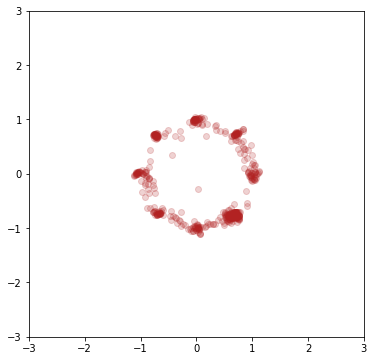

epoch 590
0.6923650503158569 0.7085149884223938


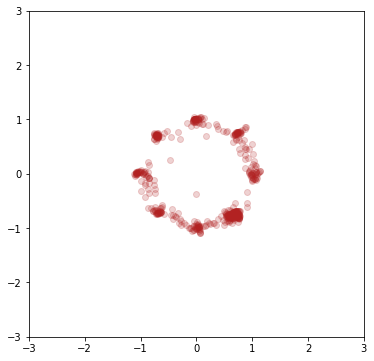

epoch 591
0.6905087232589722 0.7027963995933533


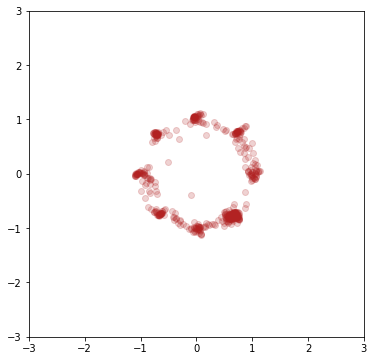

epoch 592
0.6889469623565674 0.7021350264549255


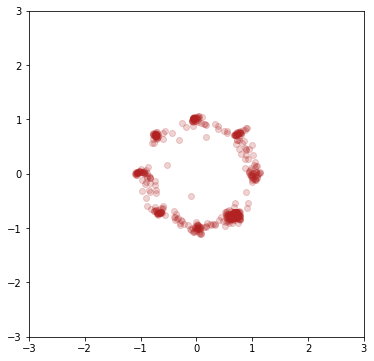

epoch 593
0.6920124888420105 0.7039964199066162


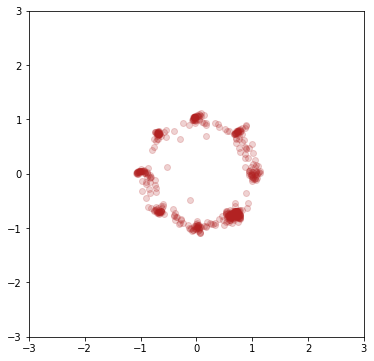

epoch 594
0.6958218216896057 0.7077825665473938


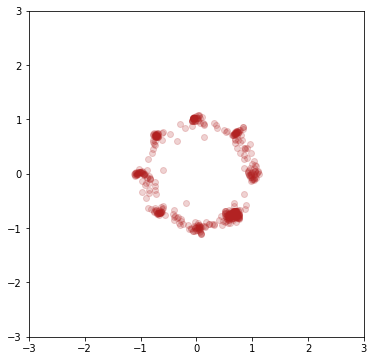

epoch 595
0.693280041217804 0.6981050372123718


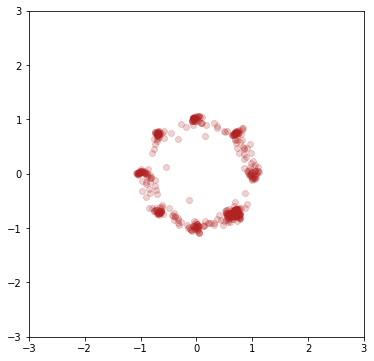

epoch 596
0.6939272284507751 0.7043164968490601


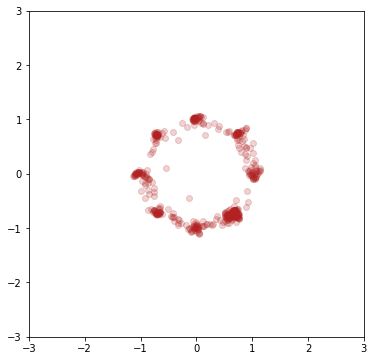

epoch 597
0.6921934485435486 0.7059206366539001


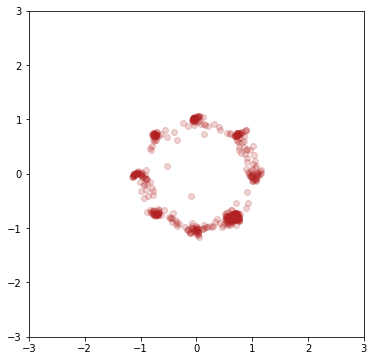

epoch 598
0.6925439238548279 0.7071207165718079


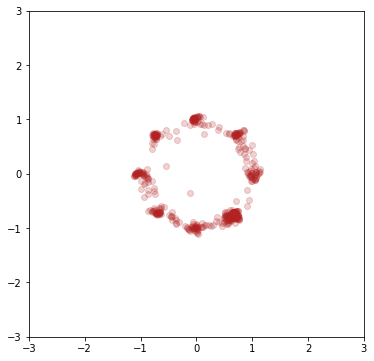

epoch 599
0.6885772943496704 0.7085683941841125


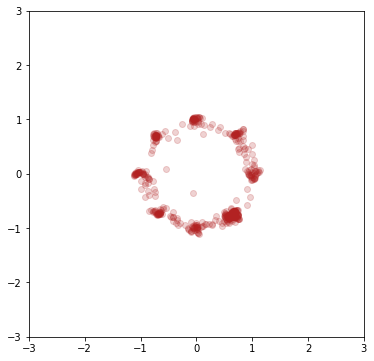

epoch 600
0.6921994090080261 0.6999179124832153


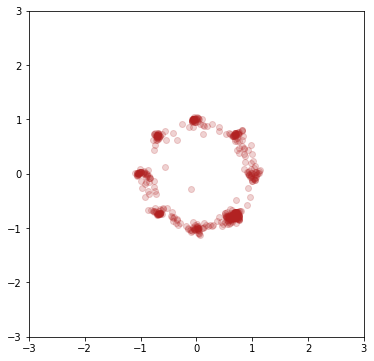

epoch 601
0.691903293132782 0.706834077835083


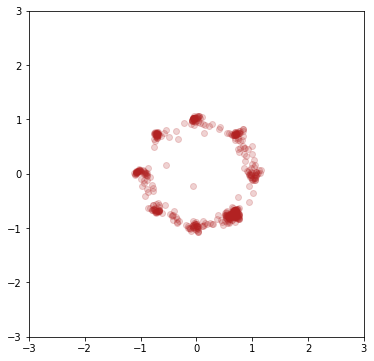

epoch 602
0.696291983127594 0.7020223140716553


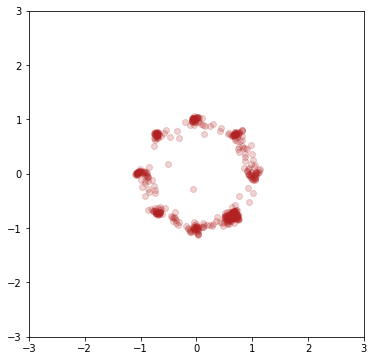

epoch 603
0.6963379383087158 0.7080867290496826


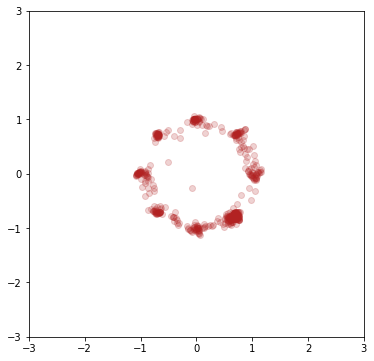

epoch 604
0.693449079990387 0.7110050320625305


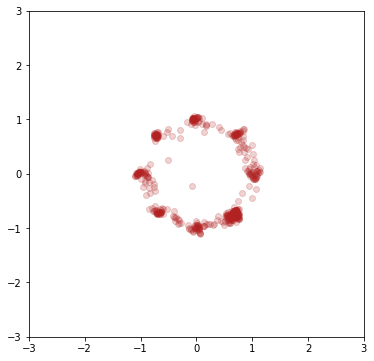

epoch 605
0.689994215965271 0.7062303423881531


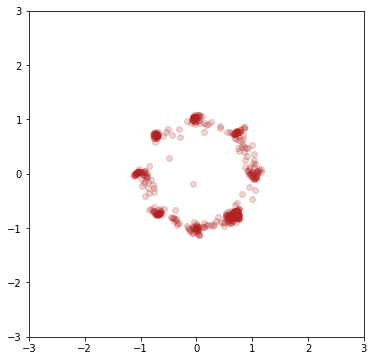

epoch 606
0.6955203413963318 0.7012760639190674


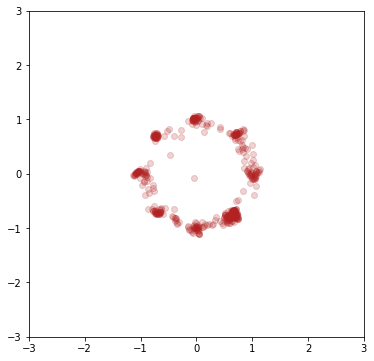

epoch 607
0.6915947794914246 0.7109410166740417


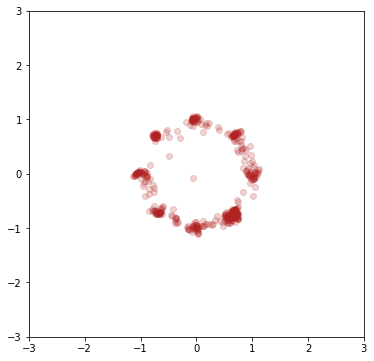

epoch 608
0.6922850012779236 0.7037546634674072


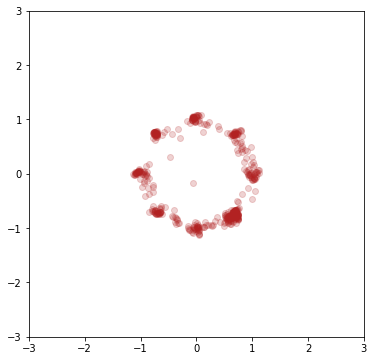

epoch 609
0.6945912837982178 0.706217348575592


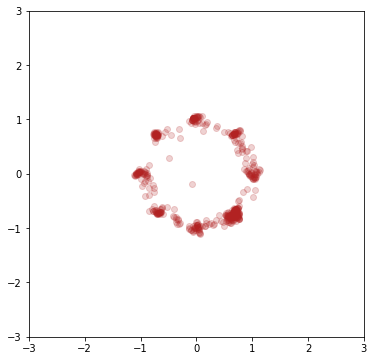

epoch 610
0.6884910464286804 0.6995958089828491


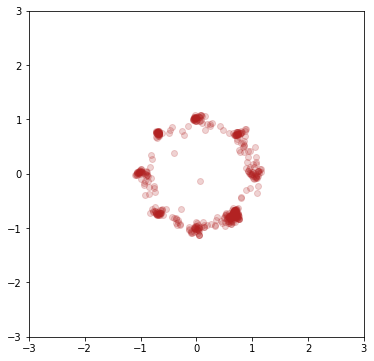

epoch 611
0.6936029195785522 0.7034898400306702


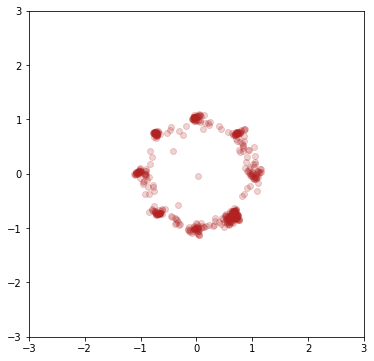

epoch 612
0.6940544843673706 0.7033013105392456


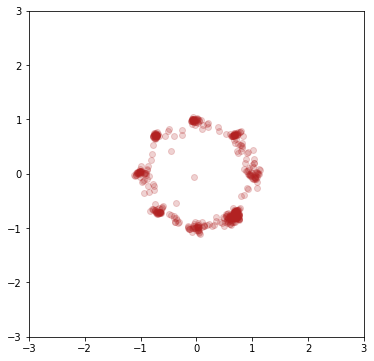

epoch 613
0.691188633441925 0.7073301076889038


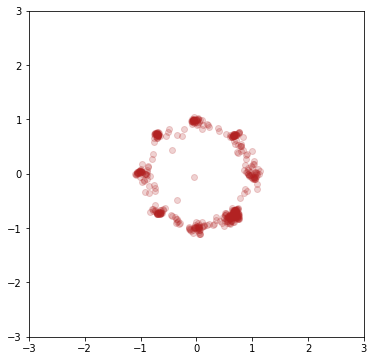

epoch 614
0.6911645531654358 0.7025249004364014


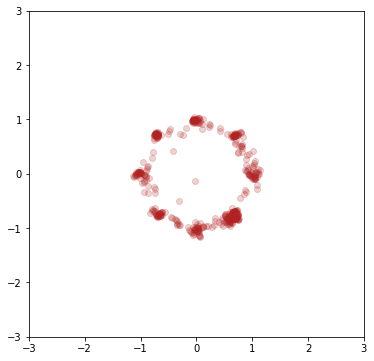

epoch 615
0.6945518255233765 0.700157642364502


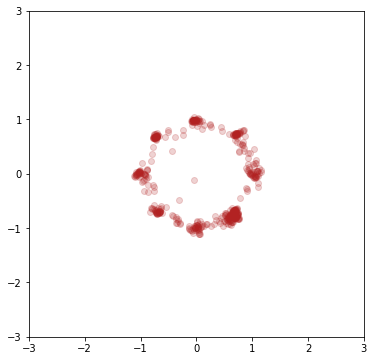

epoch 616
0.6942446827888489 0.707918643951416


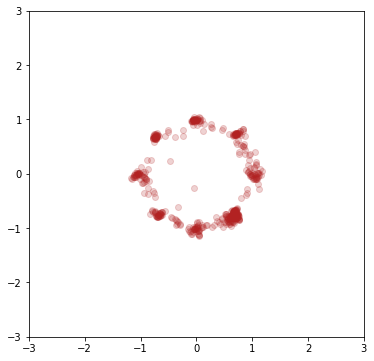

epoch 617
0.6930656433105469 0.7023167610168457


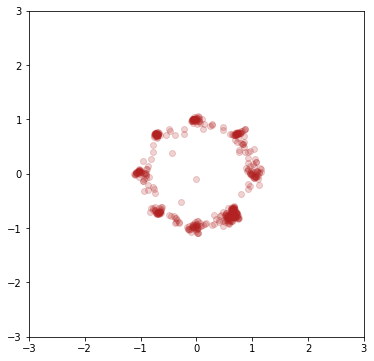

epoch 618
0.6927030086517334 0.7064064145088196


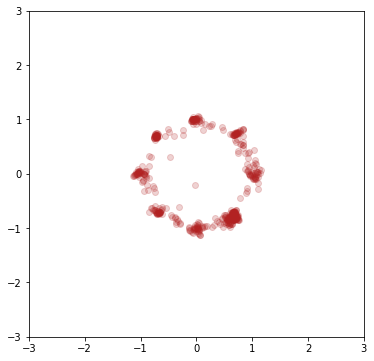

epoch 619
0.6950756907463074 0.705807626247406


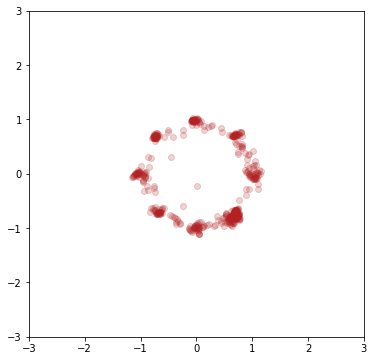

epoch 620
0.6922490000724792 0.705157458782196


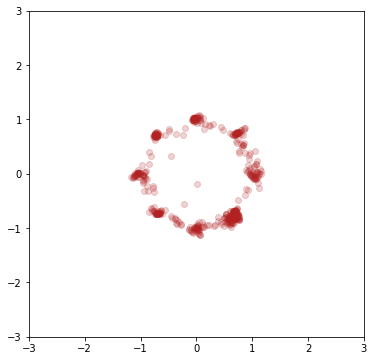

epoch 621
0.6926637291908264 0.7014779448509216


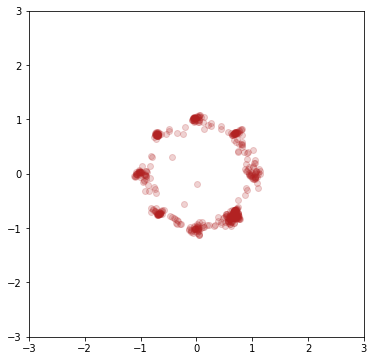

epoch 622
0.6936867237091064 0.7062097191810608


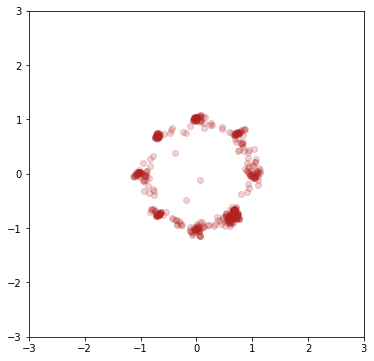

epoch 623
0.6898237466812134 0.704376220703125


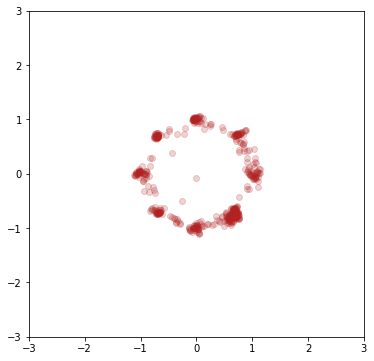

epoch 624
0.6903201341629028 0.7047029137611389


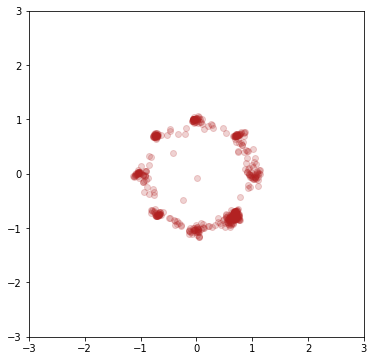

epoch 625
0.6959102153778076 0.7029455304145813


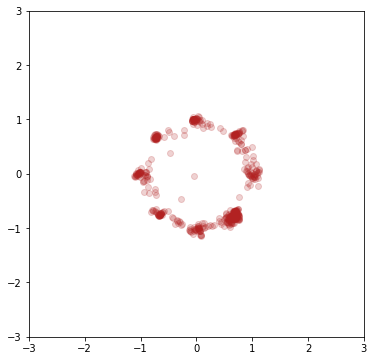

epoch 626
0.6942190527915955 0.6989031434059143


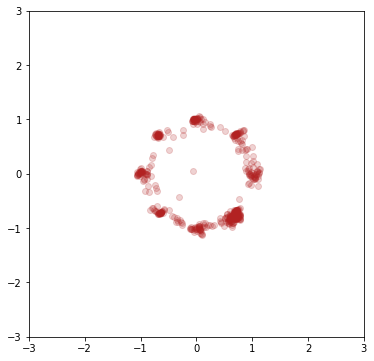

epoch 627
0.6935021877288818 0.7037419080734253


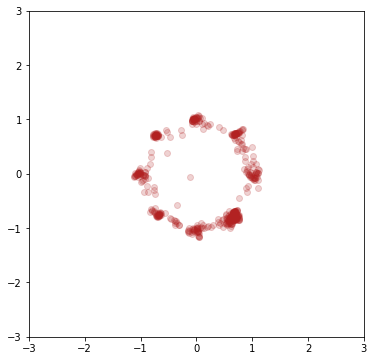

epoch 628
0.69266676902771 0.7066732048988342


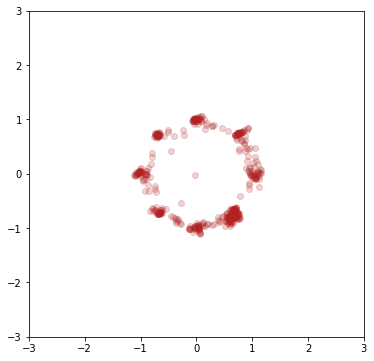

epoch 629
0.6901260614395142 0.6971858739852905


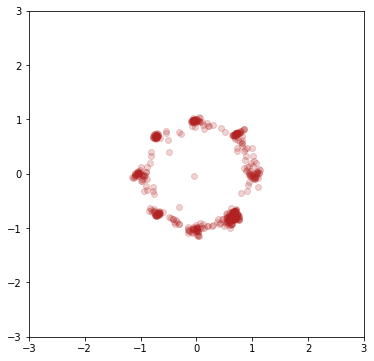

epoch 630
0.6925685405731201 0.7104700207710266


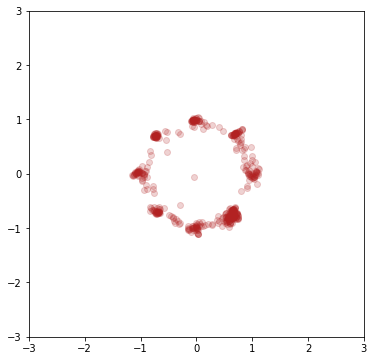

epoch 631
0.693490207195282 0.7025262713432312


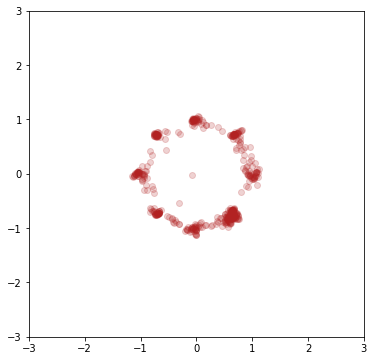

epoch 632
0.6924745440483093 0.6992099285125732


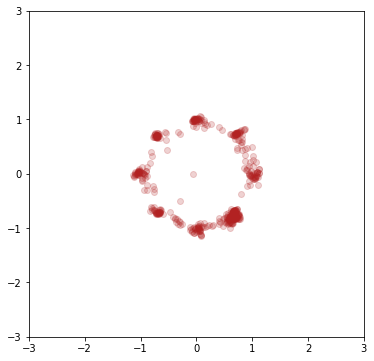

epoch 633
0.6923332214355469 0.7003535628318787


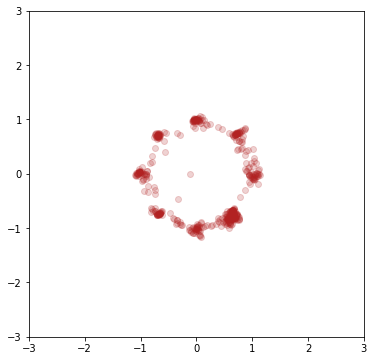

epoch 634
0.6937457323074341 0.7053440809249878


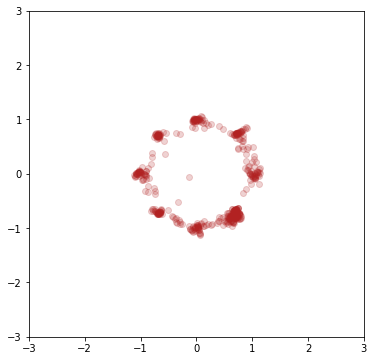

epoch 635
0.6917123198509216 0.7007977366447449


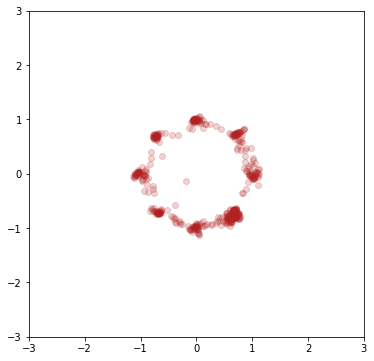

epoch 636
0.6922979950904846 0.7052685618400574


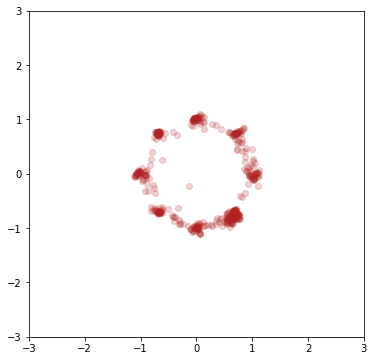

epoch 637
0.690158486366272 0.7013336420059204


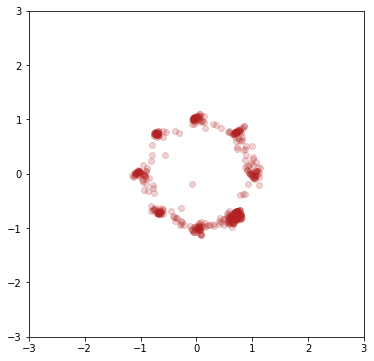

epoch 638
0.6939960718154907 0.6996124386787415


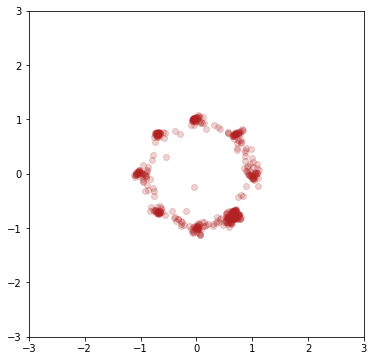

epoch 639
0.6911684274673462 0.7119486927986145


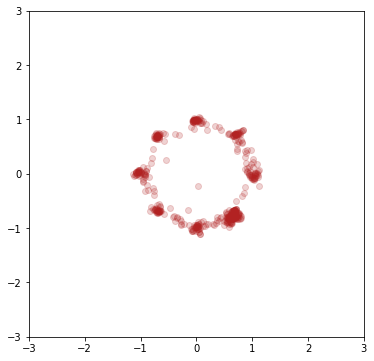

epoch 640
0.6940881609916687 0.7002824544906616


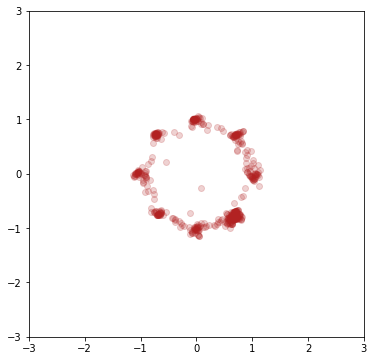

epoch 641
0.6915527582168579 0.704377293586731


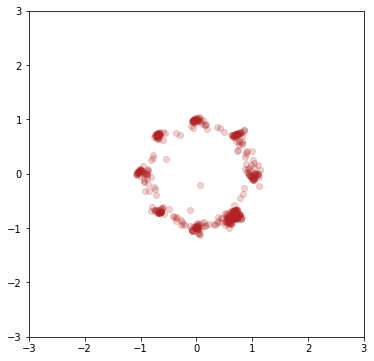

epoch 642
0.6933293342590332 0.7051524519920349


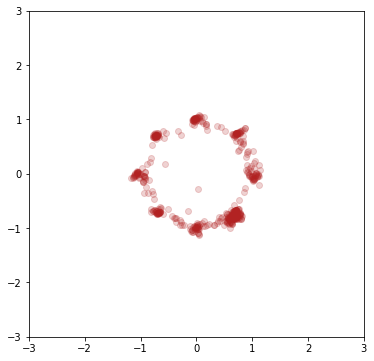

epoch 643
0.6946442127227783 0.6998988389968872


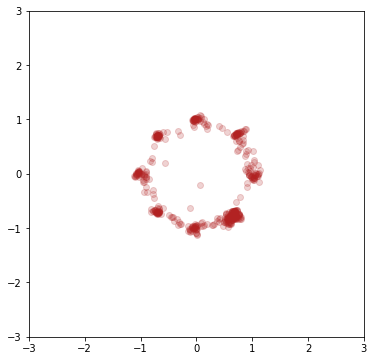

epoch 644
0.6950604319572449 0.7067670226097107


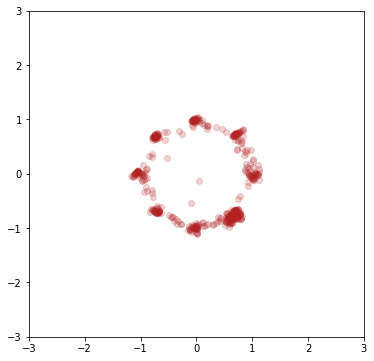

epoch 645
0.692338228225708 0.7018545269966125


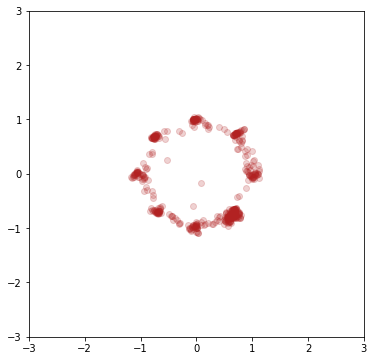

epoch 646
0.6938897967338562 0.7016730308532715


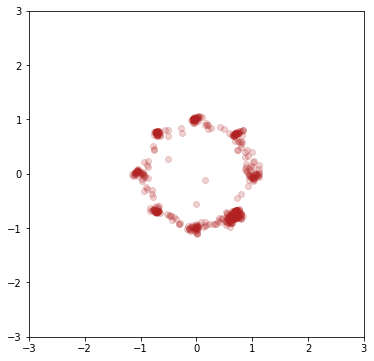

epoch 647
0.6936018466949463 0.7027590870857239


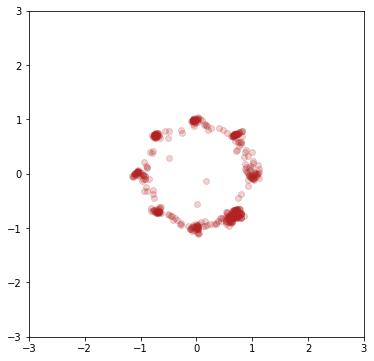

epoch 648
0.6930043697357178 0.7069711089134216


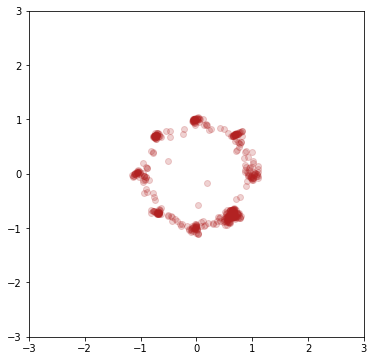

epoch 649
0.6923321485519409 0.6982728838920593


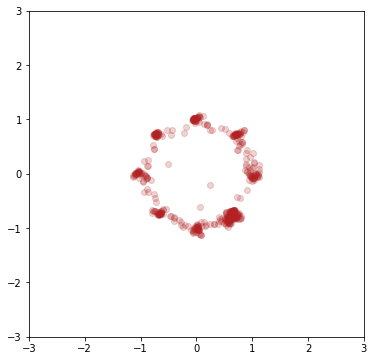

epoch 650
0.6937902569770813 0.7031587958335876


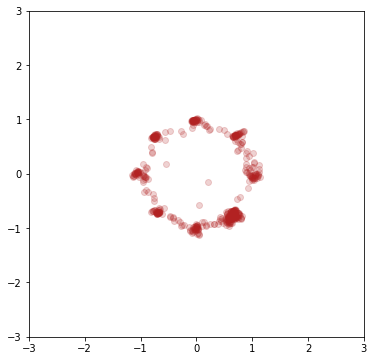

epoch 651
0.6911813616752625 0.7020544409751892


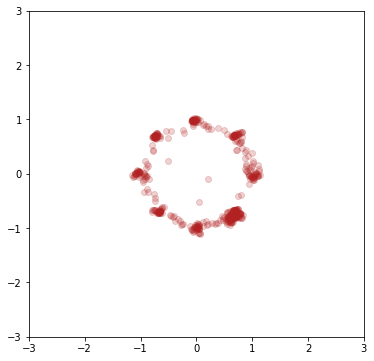

epoch 652
0.6882086396217346 0.7001309394836426


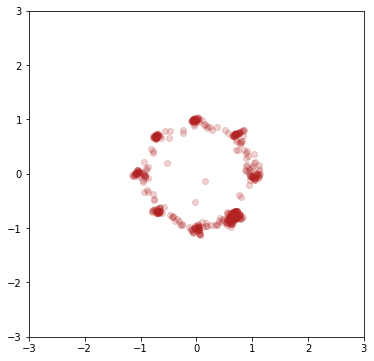

epoch 653
0.6928619146347046 0.708339512348175


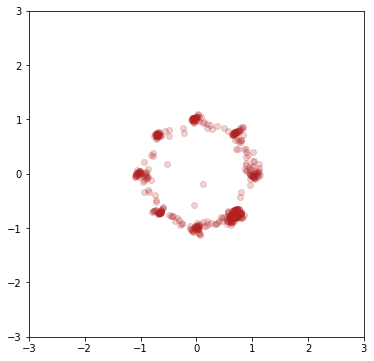

epoch 654
0.6922169327735901 0.7013236284255981


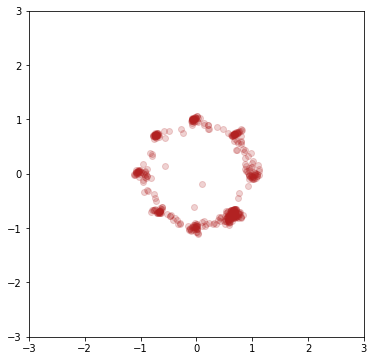

epoch 655
0.6938337087631226 0.7080090045928955


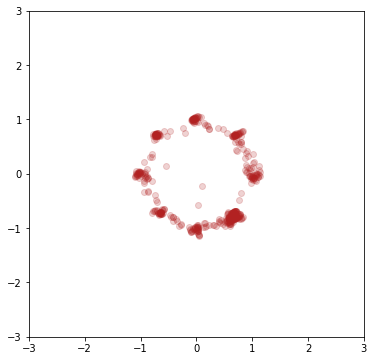

epoch 656
0.6957055926322937 0.7102506756782532


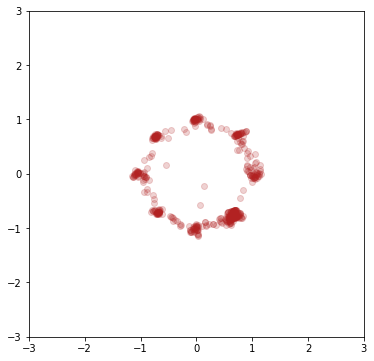

epoch 657
0.6918483972549438 0.7033094763755798


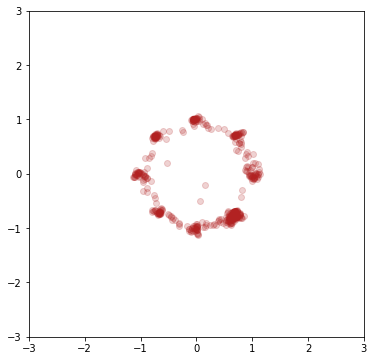

epoch 658
0.6885053515434265 0.7011412978172302


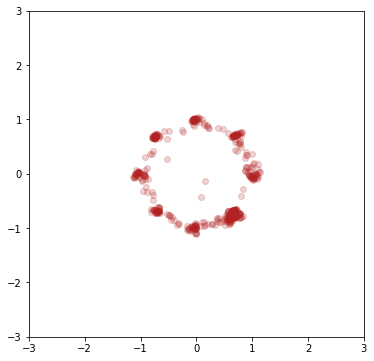

epoch 659
0.6913929581642151 0.7010648250579834


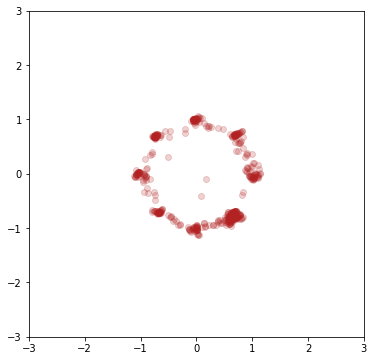

epoch 660
0.6909199357032776 0.7035836577415466


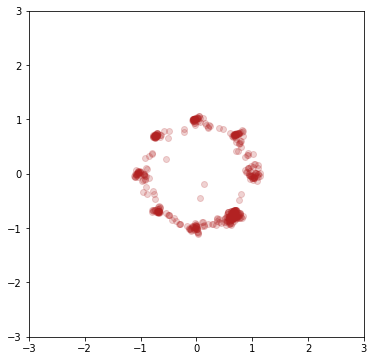

epoch 661
0.695509135723114 0.6994831562042236


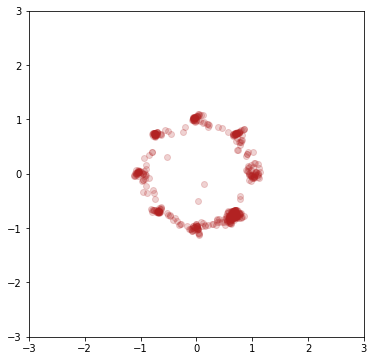

epoch 662
0.6941753625869751 0.7032616138458252


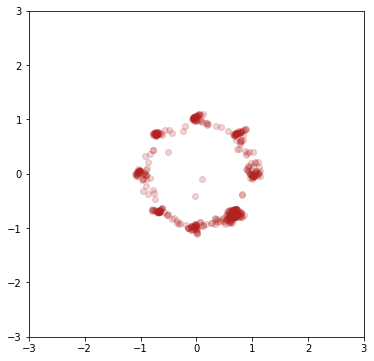

epoch 663
0.6911746263504028 0.7042173743247986


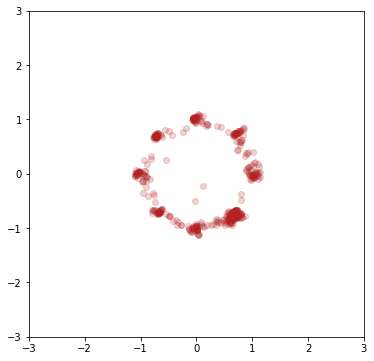

epoch 664
0.6946315765380859 0.7021228075027466


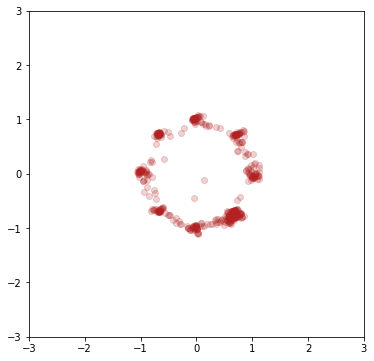

epoch 665
0.6916234493255615 0.7017666697502136


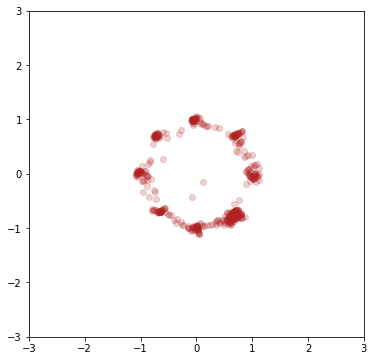

epoch 666
0.6905775666236877 0.6978485584259033


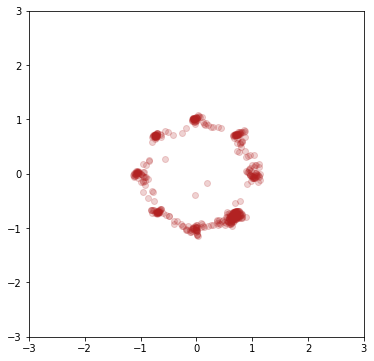

epoch 667
0.6920016407966614 0.7082985043525696


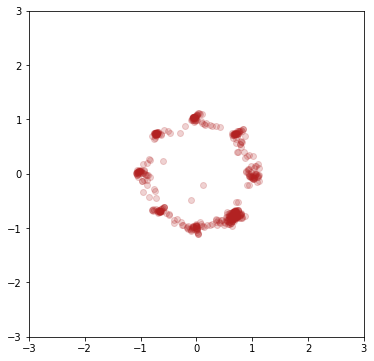

epoch 668
0.6912642121315002 0.6960122585296631


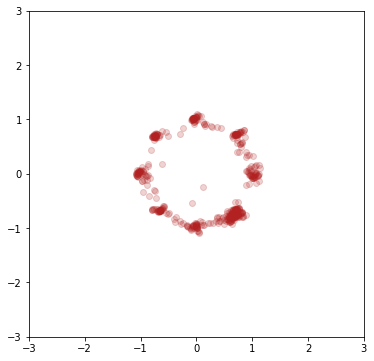

epoch 669
0.6974958181381226 0.7020198106765747


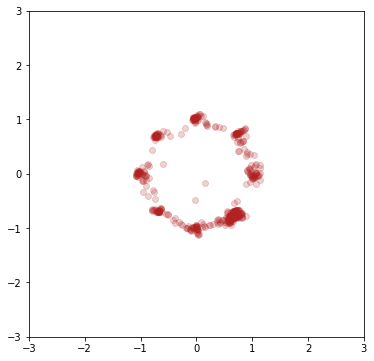

epoch 670
0.6881787776947021 0.7059983611106873


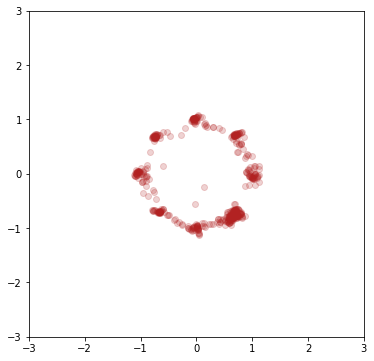

epoch 671
0.689734935760498 0.7004633545875549


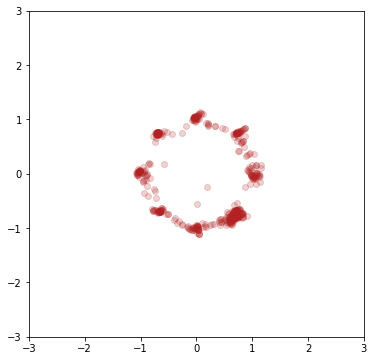

epoch 672
0.6955447196960449 0.7092118263244629


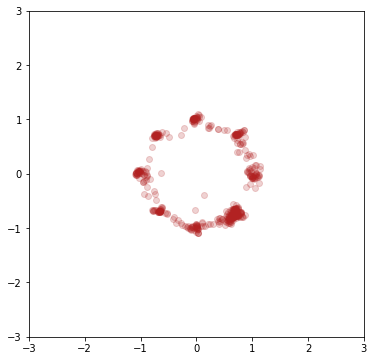

epoch 673
0.6938983798027039 0.7032871842384338


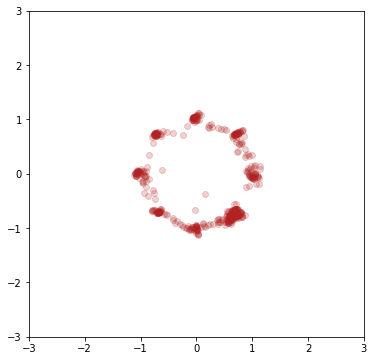

epoch 674
0.6928670406341553 0.7073835730552673


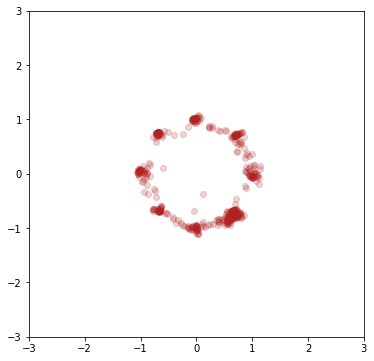

epoch 675
0.6947367787361145 0.7011417150497437


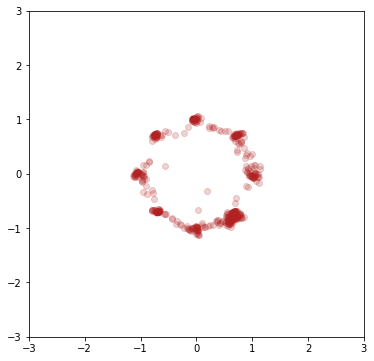

epoch 676
0.6898440718650818 0.7037532925605774


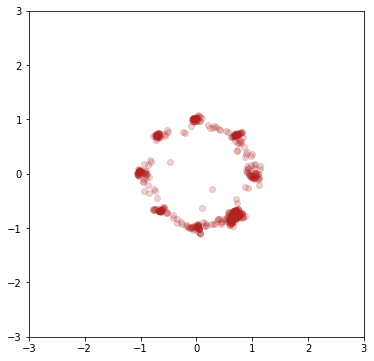

epoch 677
0.6939528584480286 0.7105957269668579


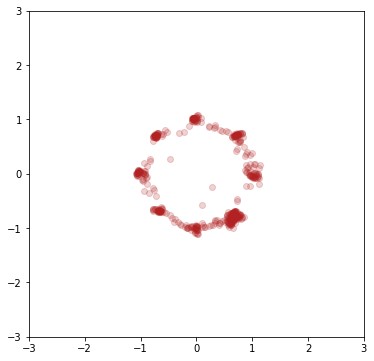

epoch 678
0.6927688717842102 0.7066799998283386


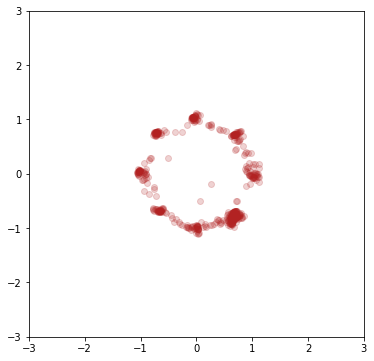

epoch 679
0.6956541538238525 0.701649010181427


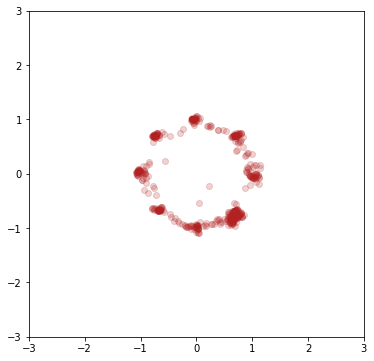

epoch 680
0.6939680576324463 0.7072960734367371


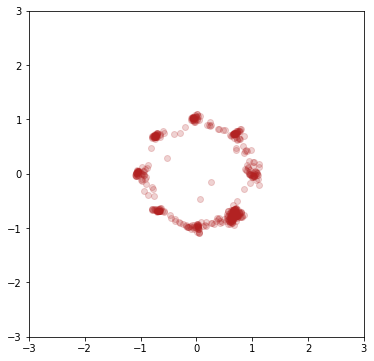

epoch 681
0.6940737962722778 0.698616623878479


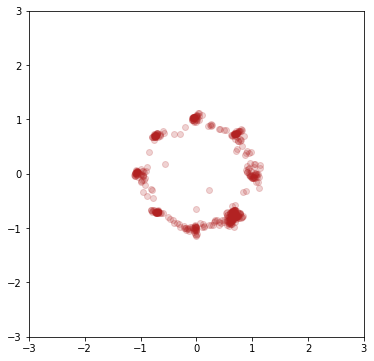

epoch 682
0.6921364665031433 0.7047107219696045


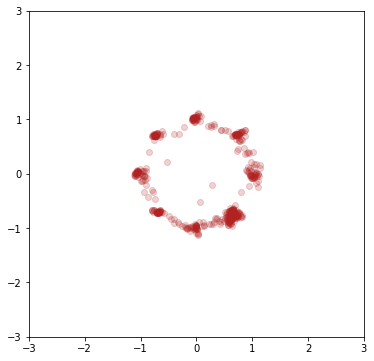

epoch 683
0.6924384236335754 0.6994835138320923


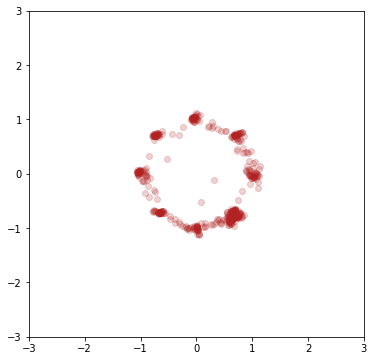

epoch 684
0.6912357807159424 0.7037017941474915


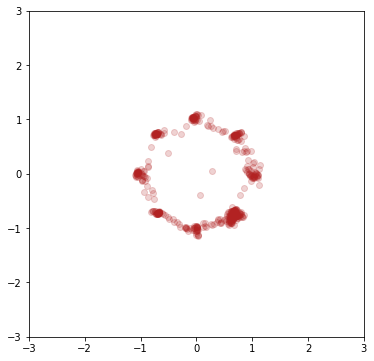

epoch 685
0.6932891607284546 0.7089675664901733


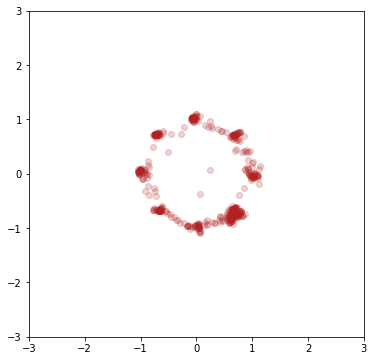

epoch 686
0.694155752658844 0.7059589624404907


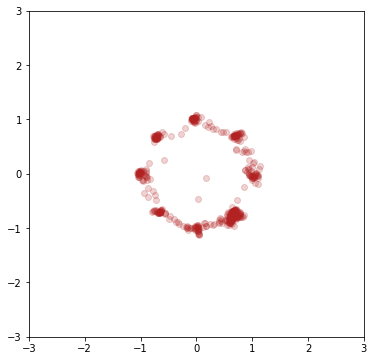

epoch 687
0.6974305510520935 0.7046735882759094


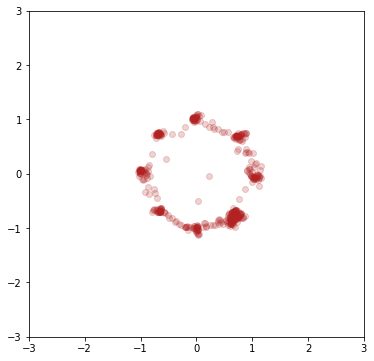

epoch 688
0.6915403604507446 0.7072242498397827


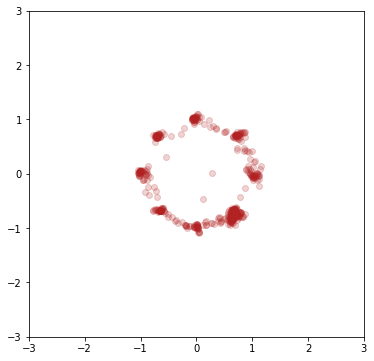

epoch 689
0.6924677491188049 0.7035195827484131


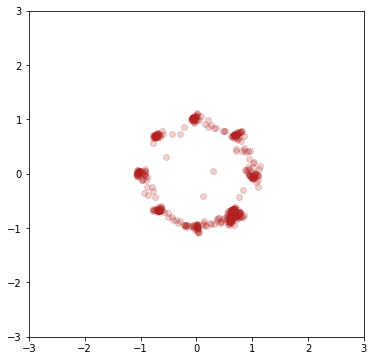

epoch 690
0.692668616771698 0.7045007348060608


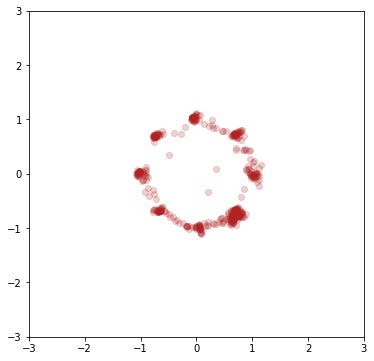

epoch 691
0.6941294074058533 0.7054521441459656


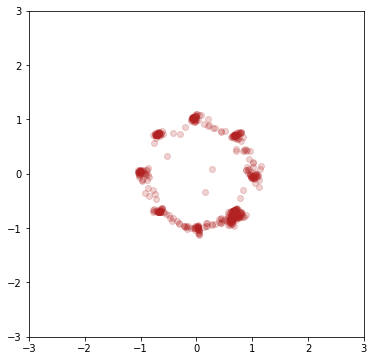

epoch 692
0.6897897124290466 0.6996787786483765


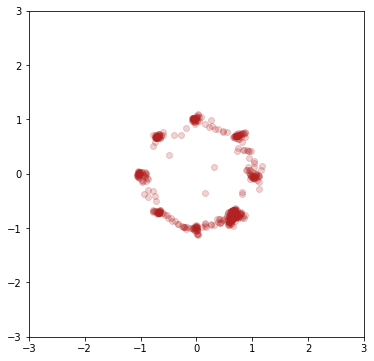

epoch 693
0.6921640038490295 0.701302170753479


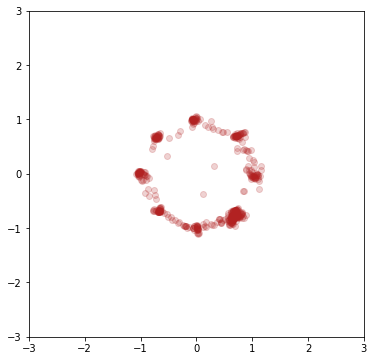

epoch 694
0.6916323900222778 0.6968709826469421


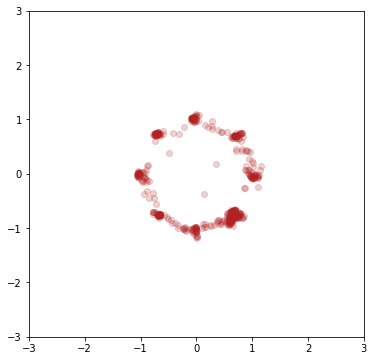

epoch 695
0.6914781332015991 0.7046042680740356


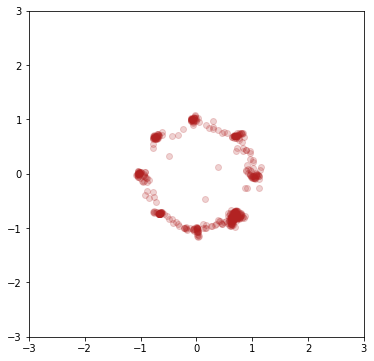

epoch 696
0.6932754516601562 0.7000654339790344


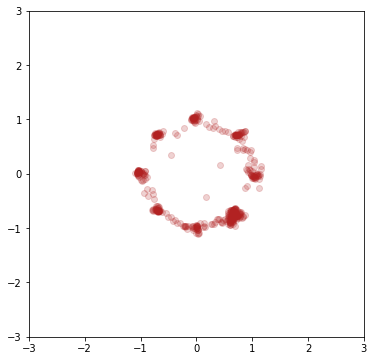

epoch 697
0.6975719928741455 0.7046995759010315


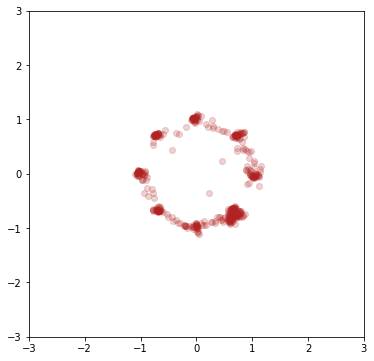

epoch 698
0.6942973136901855 0.7030644416809082


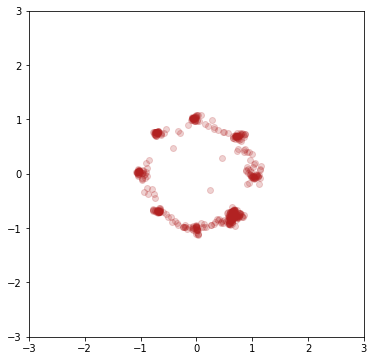

epoch 699
0.6946049332618713 0.7003976702690125


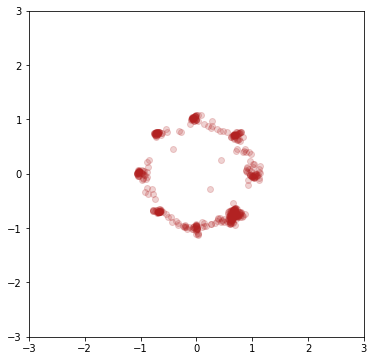

epoch 700
0.6921743750572205 0.7074497938156128


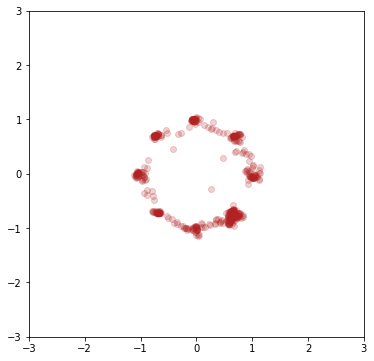

epoch 701
0.6905812621116638 0.7025903463363647


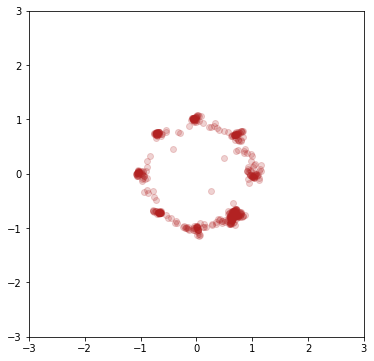

epoch 702
0.6932196021080017 0.7064159512519836


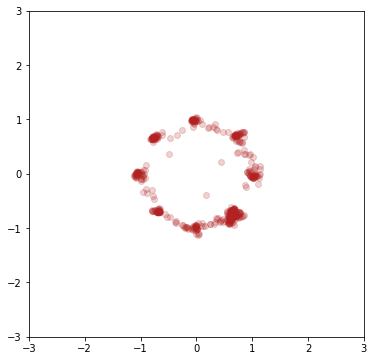

epoch 703
0.693815290927887 0.7030465602874756


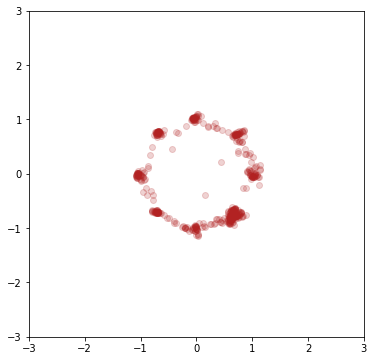

epoch 704
0.6936825513839722 0.7017384171485901


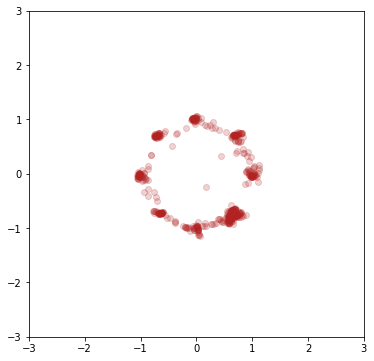

epoch 705
0.6933856010437012 0.6989219784736633


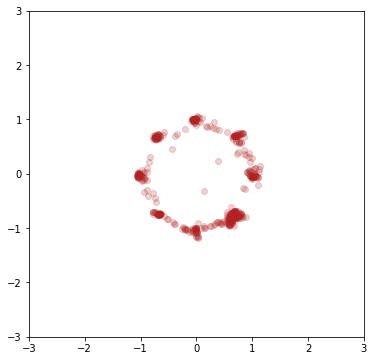

epoch 706
0.6928530931472778 0.7034457921981812


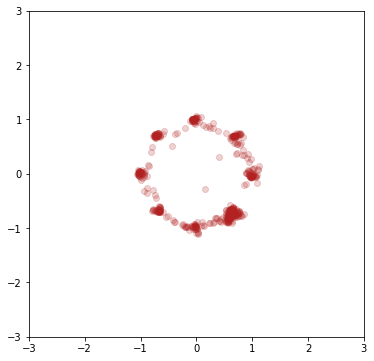

epoch 707
0.6950718760490417 0.699293851852417


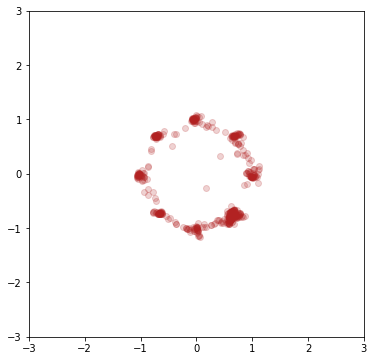

epoch 708
0.6894403696060181 0.7048175930976868


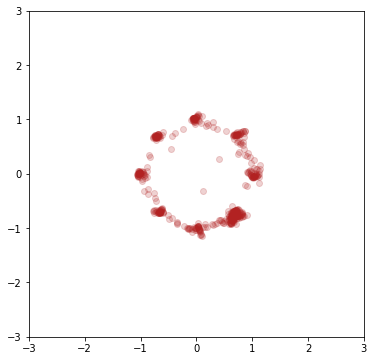

epoch 709
0.6941937804222107 0.7058053016662598


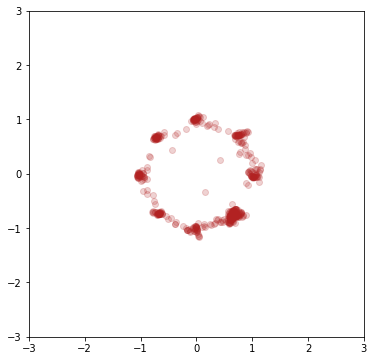

epoch 710
0.6932031512260437 0.7078544497489929


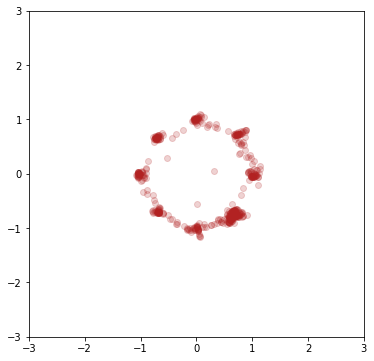

epoch 711
0.6932248473167419 0.6999875903129578


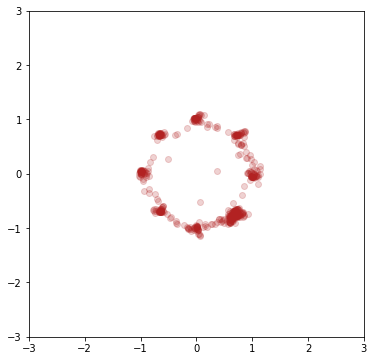

epoch 712
0.6945056319236755 0.7019432783126831


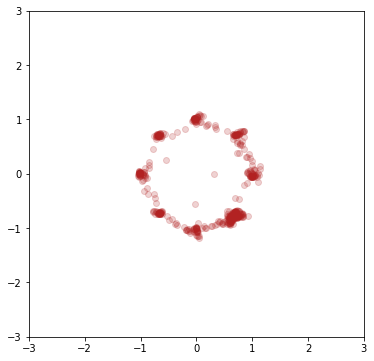

epoch 713
0.6960849165916443 0.7018370032310486


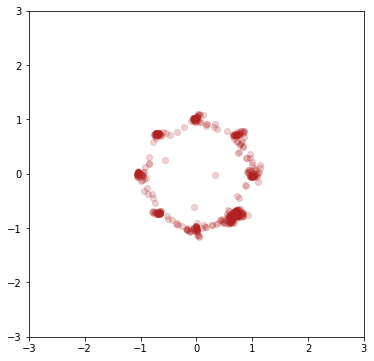

epoch 714
0.6947605609893799 0.7021980285644531


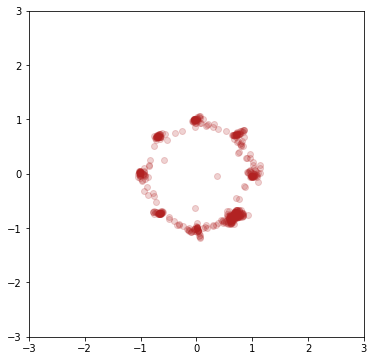

epoch 715
0.6925370097160339 0.7047256231307983


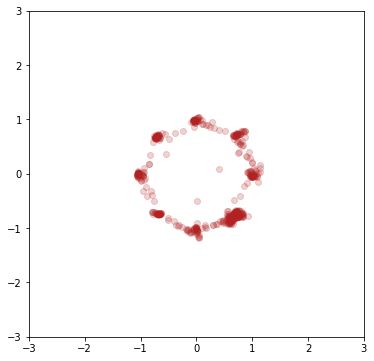

epoch 716
0.6926983594894409 0.7048324346542358


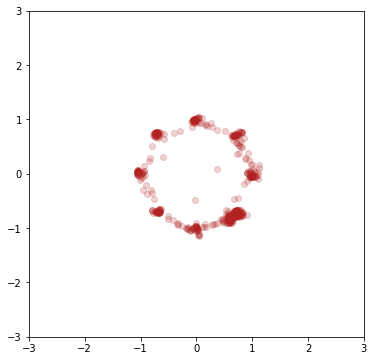

epoch 717
0.6920013427734375 0.7113747596740723


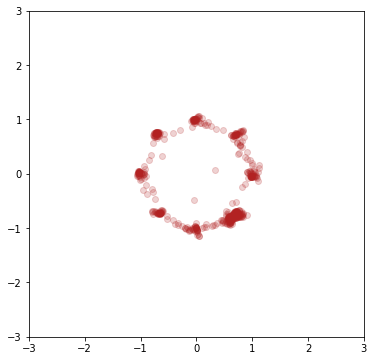

epoch 718
0.69435715675354 0.7038647532463074


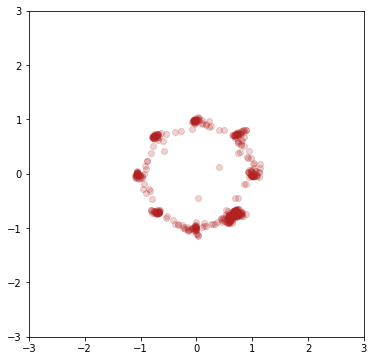

epoch 719
0.6918261647224426 0.7018555998802185


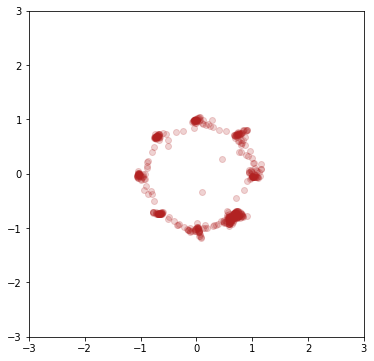

epoch 720
0.693694531917572 0.7009799480438232


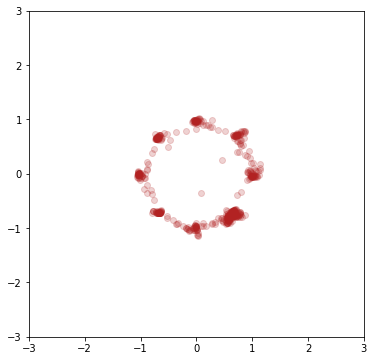

epoch 721
0.6931280493736267 0.7113644480705261


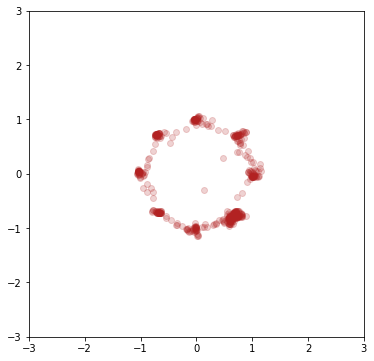

epoch 722
0.6919068694114685 0.7032236456871033


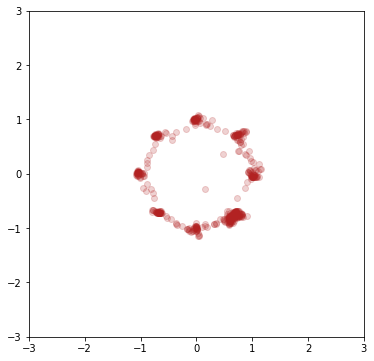

epoch 723
0.6924949884414673 0.7139906287193298


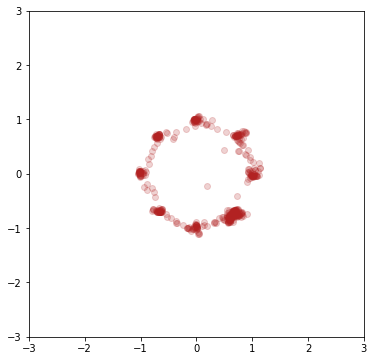

epoch 724
0.6912002563476562 0.7060235738754272


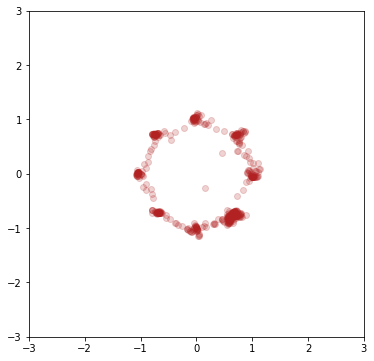

epoch 725
0.6928731799125671 0.7014606595039368


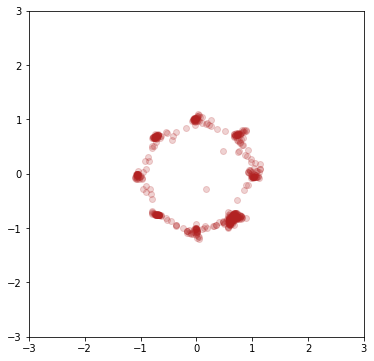

epoch 726
0.6926635503768921 0.6997673511505127


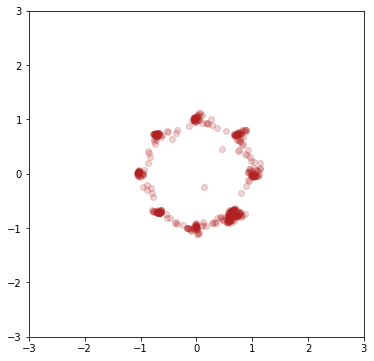

epoch 727
0.694298505783081 0.7077182531356812


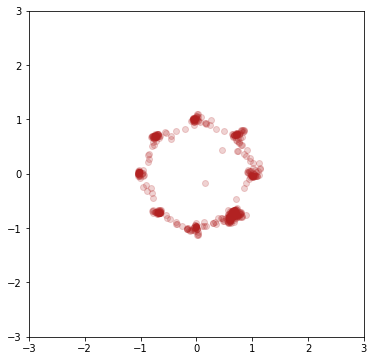

epoch 728
0.6934670209884644 0.7037928700447083


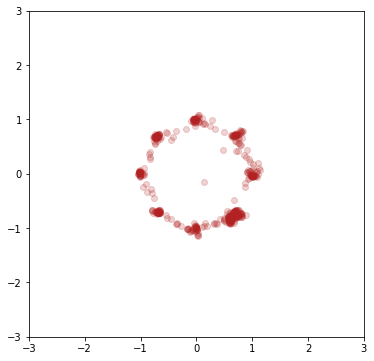

epoch 729
0.6940515041351318 0.7005160450935364


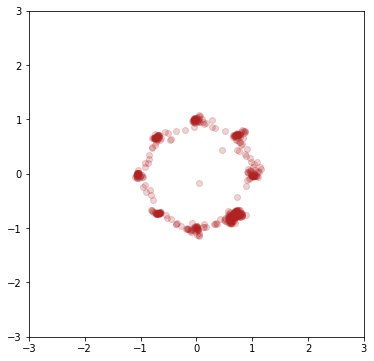

epoch 730
0.6922351121902466 0.701229989528656


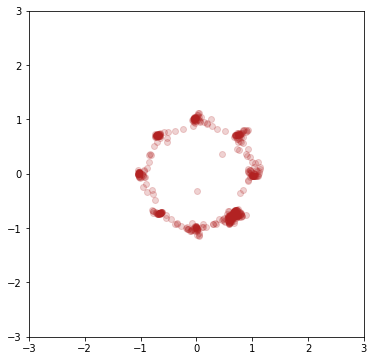

epoch 731
0.6944153308868408 0.709679126739502


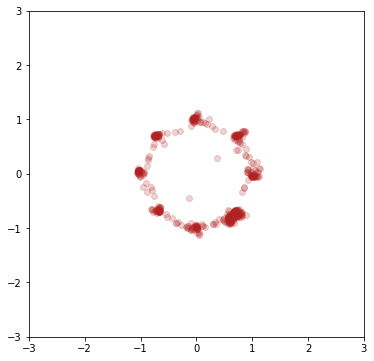

epoch 732
0.6954293847084045 0.7057603597640991


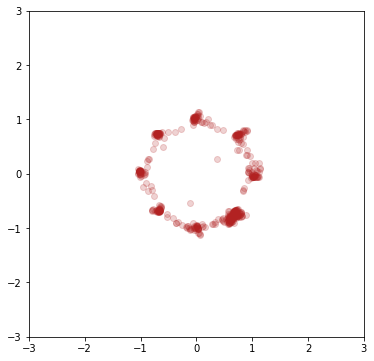

epoch 733
0.6958259344100952 0.707073450088501


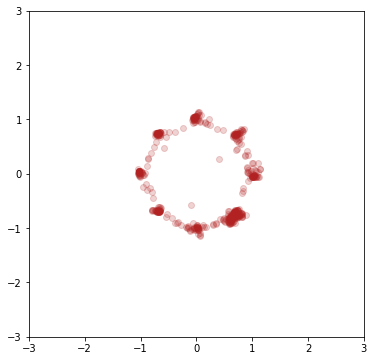

epoch 734
0.6955520510673523 0.7048652172088623


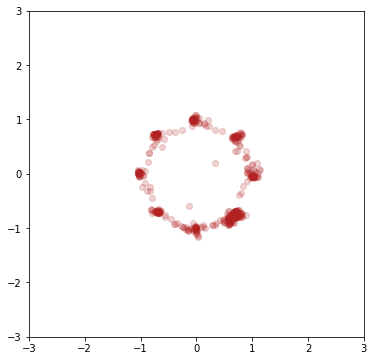

epoch 735
0.6993553042411804 0.7023808360099792


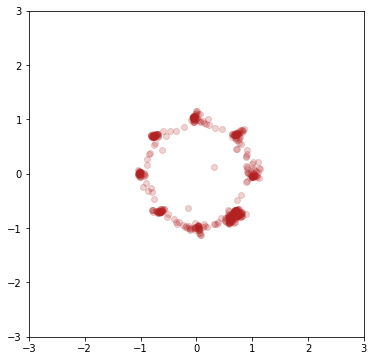

epoch 736
0.6931459307670593 0.7067013382911682


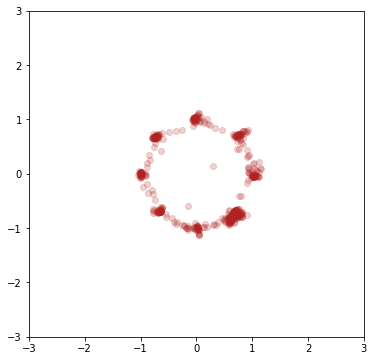

epoch 737
0.6899457573890686 0.6973443627357483


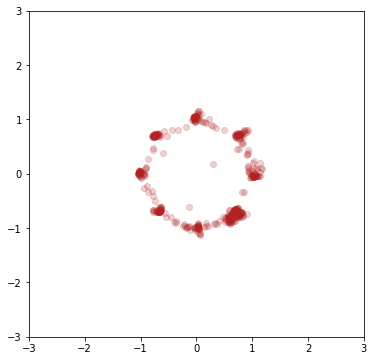

epoch 738
0.6932158470153809 0.7088218927383423


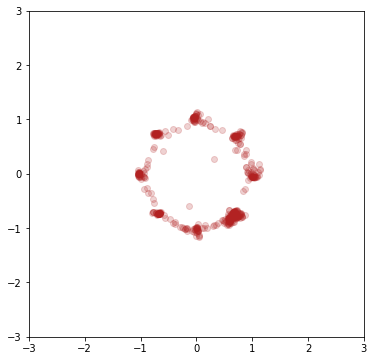

epoch 739
0.6945575475692749 0.7046686410903931


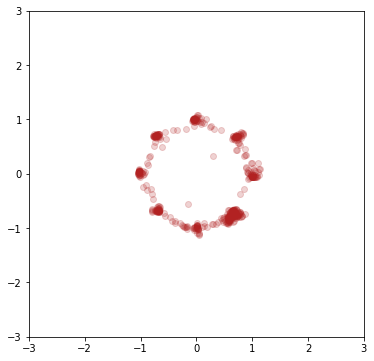

epoch 740
0.6913571953773499 0.7029380798339844


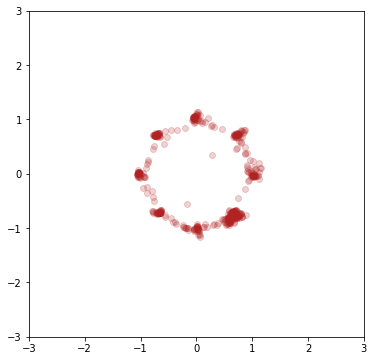

epoch 741
0.6944789290428162 0.7078160047531128


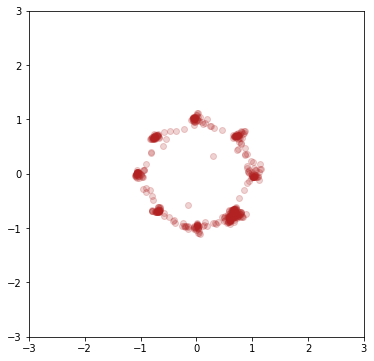

epoch 742
0.6937282085418701 0.7063941359519958


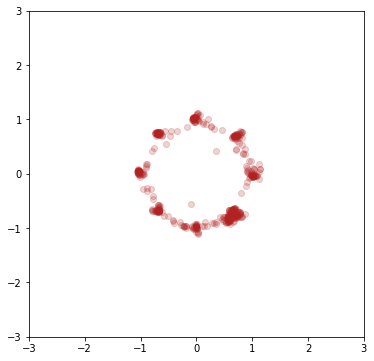

epoch 743
0.6954386830329895 0.7002572417259216


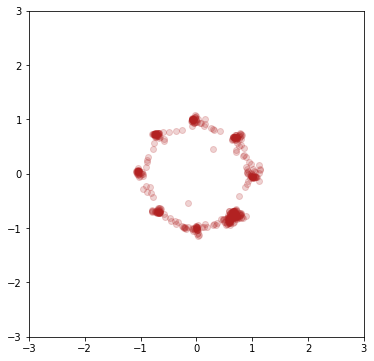

epoch 744
0.6930196285247803 0.7044494152069092


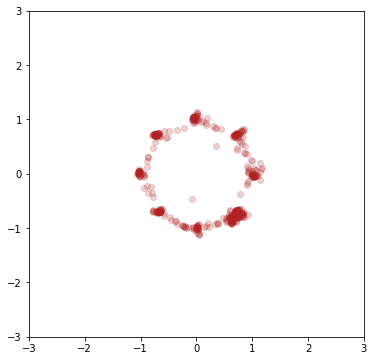

epoch 745
0.6924443244934082 0.7027179002761841


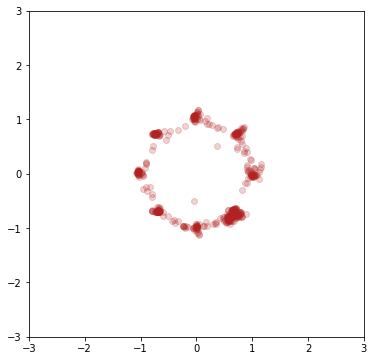

epoch 746
0.6927266120910645 0.7002242803573608


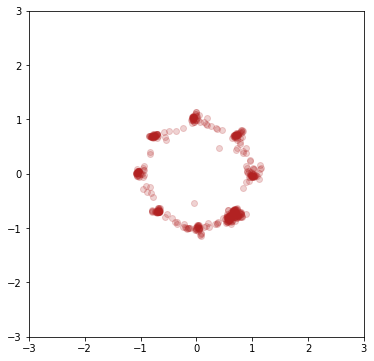

epoch 747
0.697156548500061 0.7084881663322449


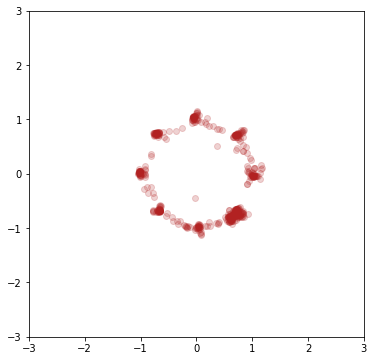

epoch 748
0.6908290982246399 0.7041566371917725


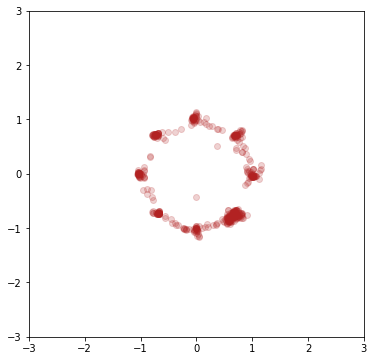

epoch 749
0.6948829889297485 0.7034519910812378


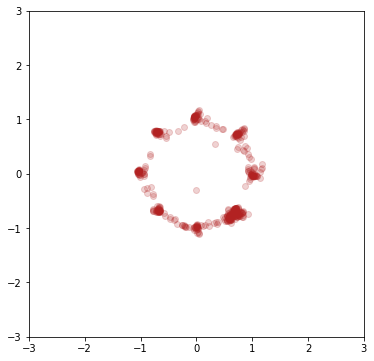

epoch 750
0.6939422488212585 0.704758882522583


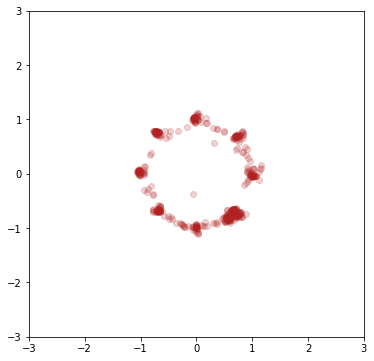

epoch 751
0.693674623966217 0.7005364894866943


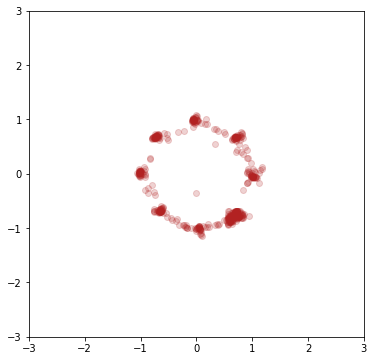

epoch 752
0.6941817402839661 0.7035763263702393


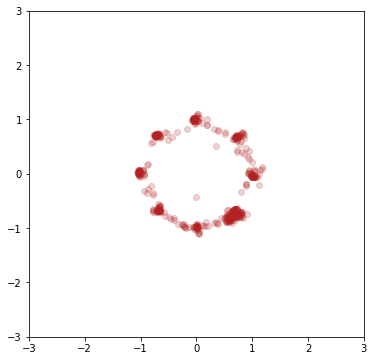

epoch 753
0.6943560838699341 0.7037872076034546


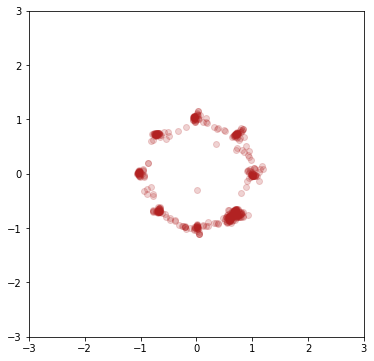

epoch 754
0.6954225301742554 0.7072713375091553


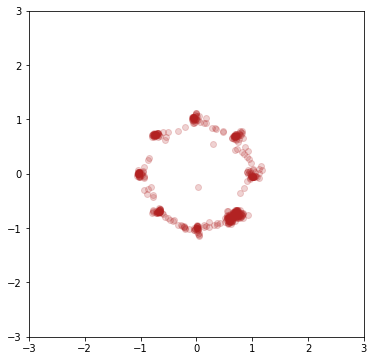

epoch 755
0.6968514919281006 0.7068625688552856


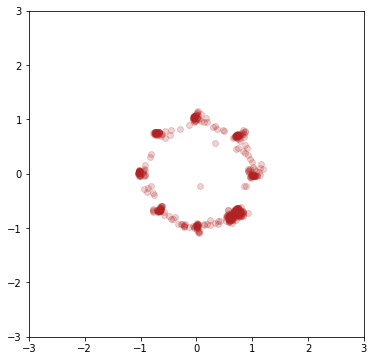

epoch 756
0.6948904395103455 0.7023617625236511


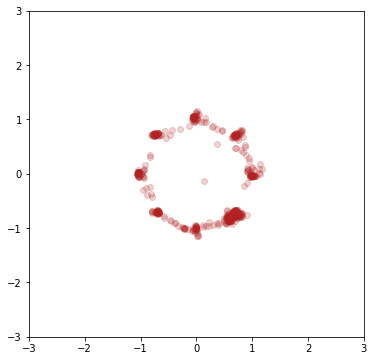

epoch 757
0.6914560198783875 0.7001686692237854


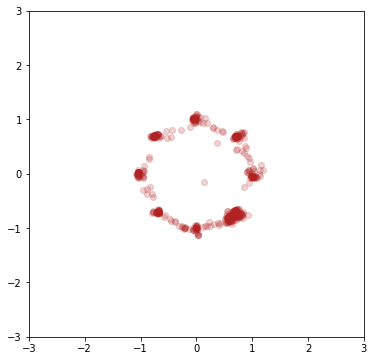

epoch 758
0.6953367590904236 0.7018983364105225


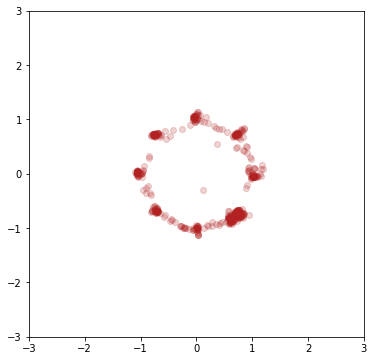

epoch 759
0.6934726238250732 0.7044910192489624


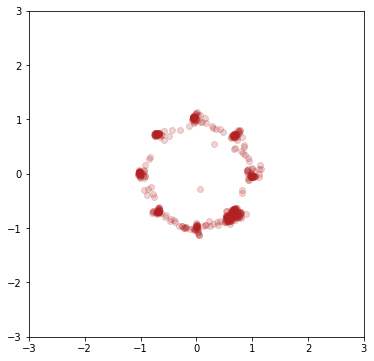

epoch 760
0.6936130523681641 0.7054548859596252


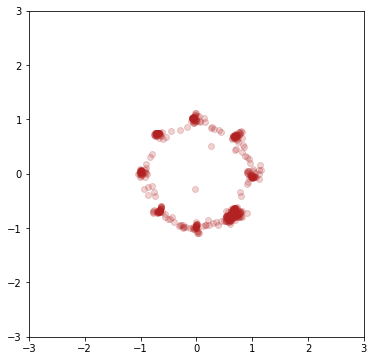

epoch 761
0.6922723650932312 0.7048445343971252


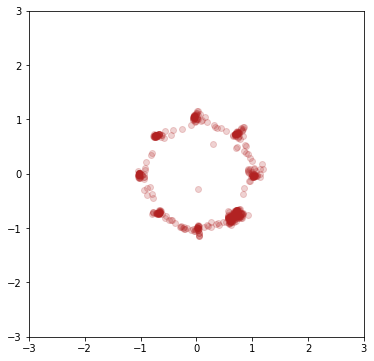

epoch 762
0.692415177822113 0.700792670249939


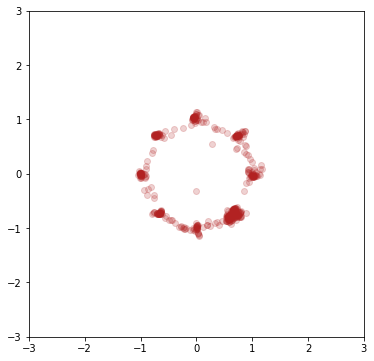

epoch 763
0.696377694606781 0.7038892507553101


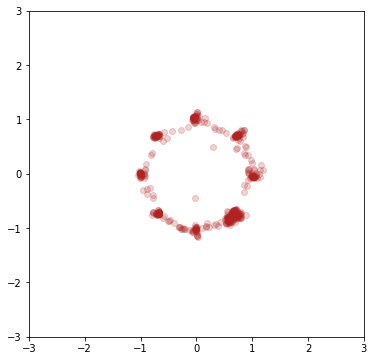

epoch 764
0.6926878094673157 0.6988430619239807


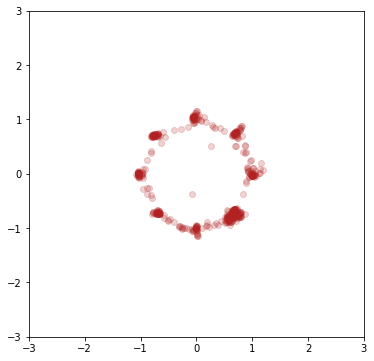

epoch 765
0.6930409073829651 0.7000618577003479


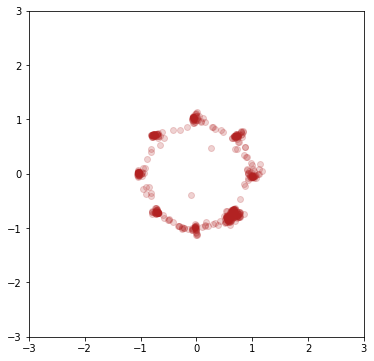

epoch 766
0.6931087970733643 0.7011114358901978


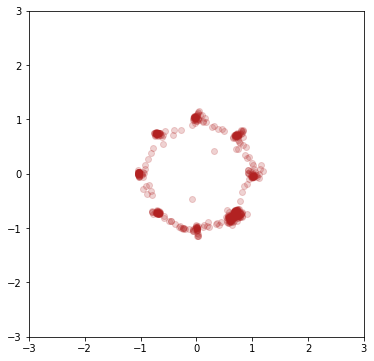

epoch 767
0.6937510967254639 0.7038547992706299


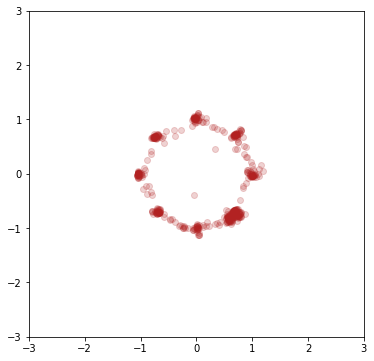

epoch 768
0.6955925822257996 0.7034898996353149


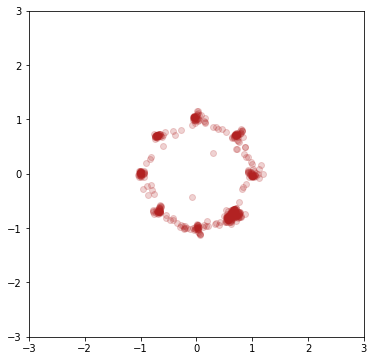

epoch 769
0.6922938823699951 0.6973833441734314


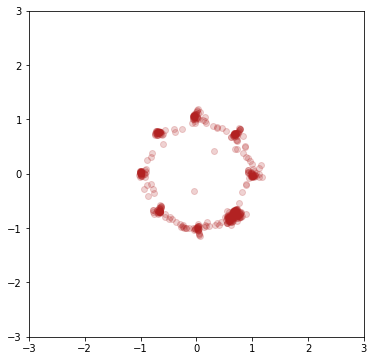

epoch 770
0.6966604590415955 0.7032612562179565


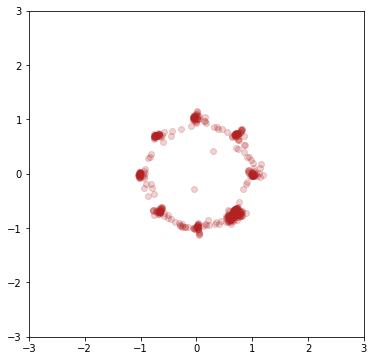

epoch 771
0.6934108138084412 0.7064998149871826


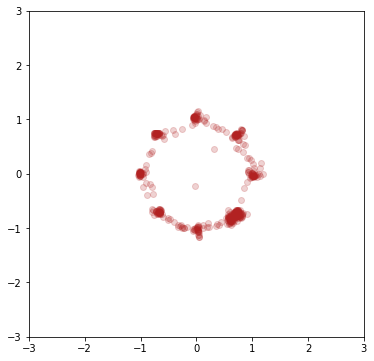

epoch 772
0.6935822367668152 0.7023637294769287


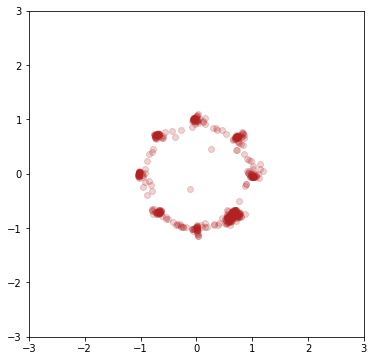

epoch 773
0.6930608153343201 0.7033295631408691


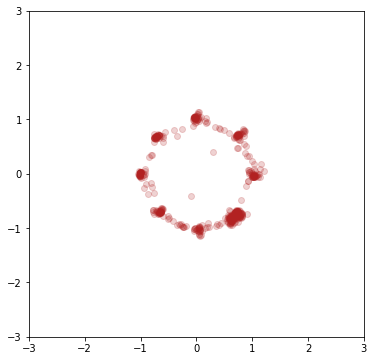

epoch 774
0.6925860643386841 0.7042415142059326


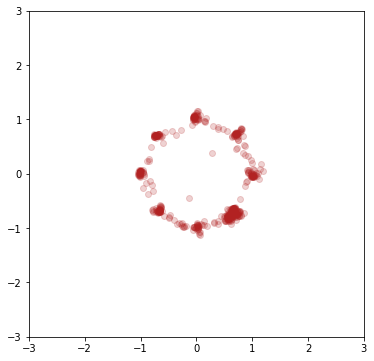

epoch 775
0.6929673552513123 0.7011448740959167


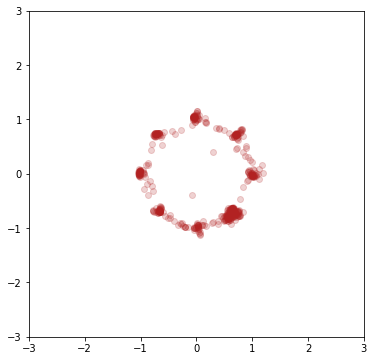

epoch 776
0.6955020427703857 0.7047004699707031


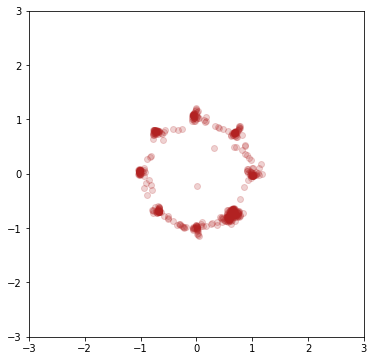

epoch 777
0.690575122833252 0.7017958164215088


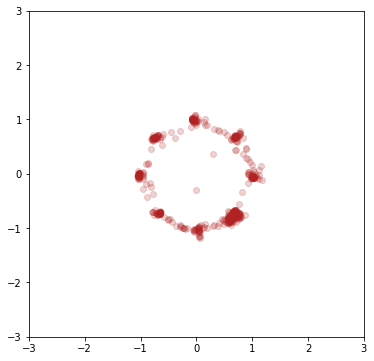

epoch 778
0.6946104168891907 0.7031184434890747


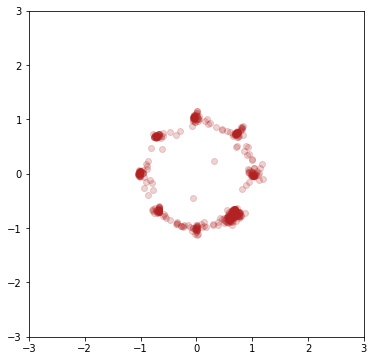

epoch 779
0.6946963667869568 0.7074482440948486


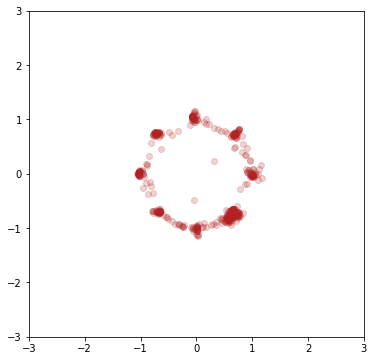

epoch 780
0.691826581954956 0.7025196552276611


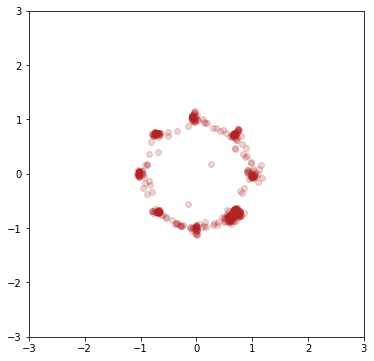

epoch 781
0.6963040232658386 0.7007726430892944


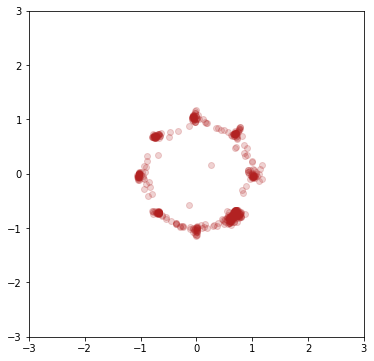

epoch 782
0.6953837871551514 0.7012953162193298


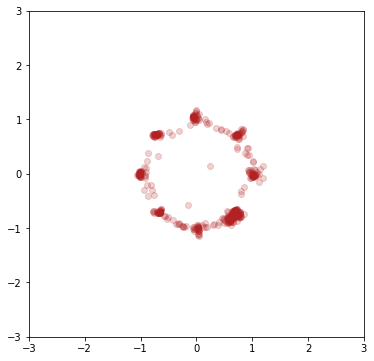

epoch 783
0.6929182410240173 0.7022498250007629


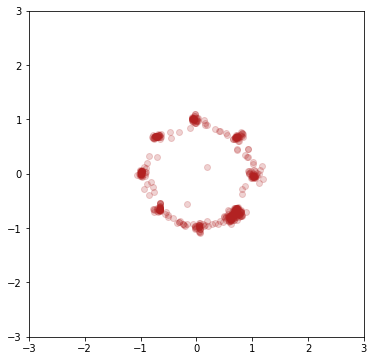

epoch 784
0.6911590099334717 0.7037623524665833


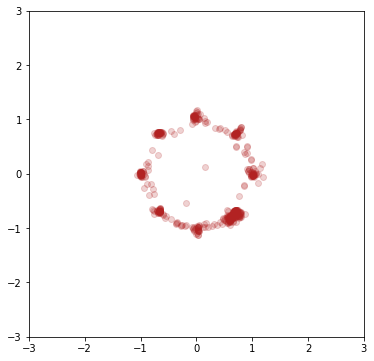

epoch 785
0.6935498118400574 0.7076698541641235


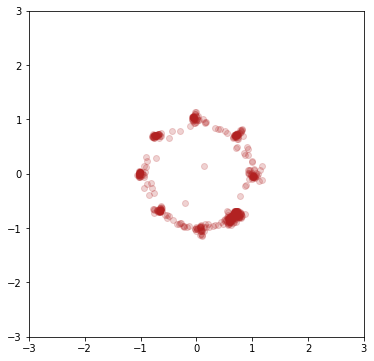

epoch 786
0.6957124471664429 0.708651602268219


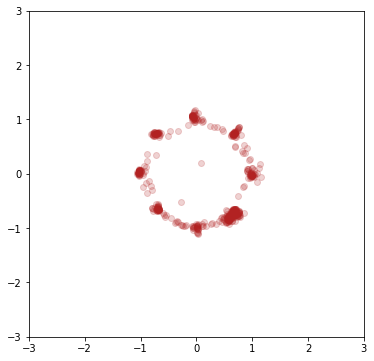

epoch 787
0.6931759119033813 0.7027106285095215


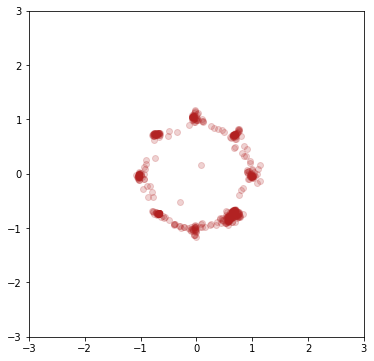

epoch 788
0.6918972730636597 0.7025642395019531


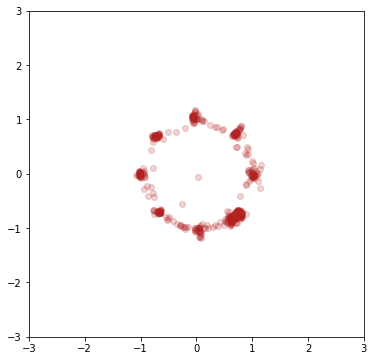

epoch 789
0.6882190108299255 0.6968110799789429


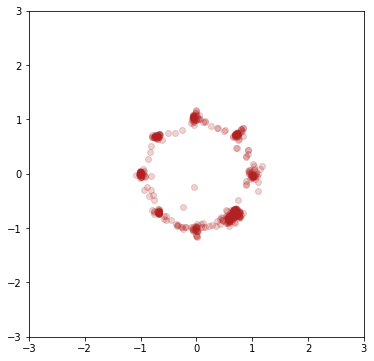

epoch 790
0.6933273077011108 0.6921395659446716


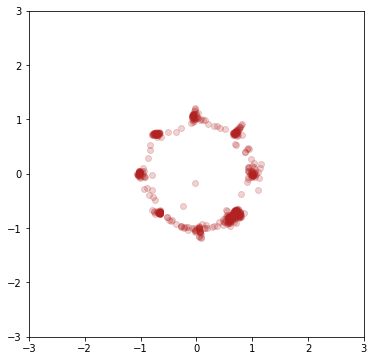

epoch 791
0.6946065425872803 0.6959791779518127


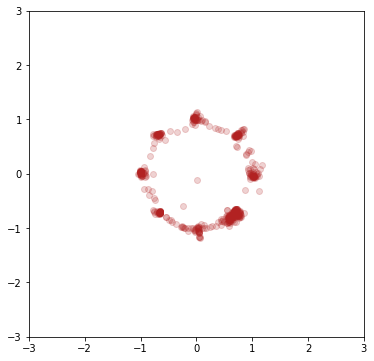

epoch 792
0.6947696805000305 0.7043077349662781


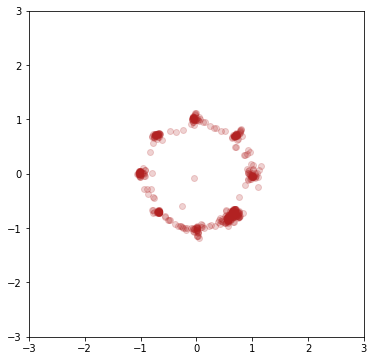

epoch 793
0.6926939487457275 0.701917290687561


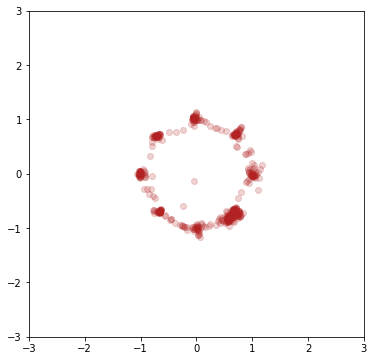

epoch 794
0.6949403285980225 0.7025808691978455


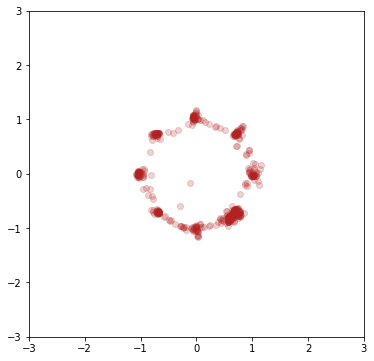

epoch 795
0.6935583353042603 0.7001329064369202


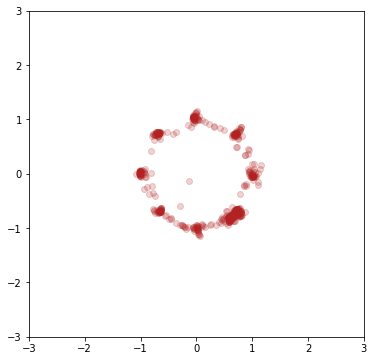

epoch 796
0.6970294713973999 0.7021338939666748


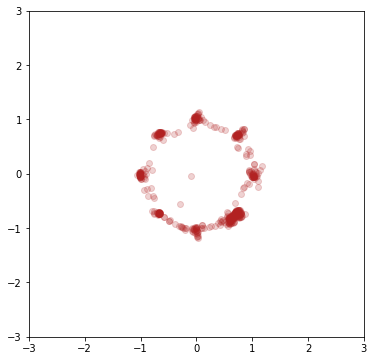

epoch 797
0.694607138633728 0.704774796962738


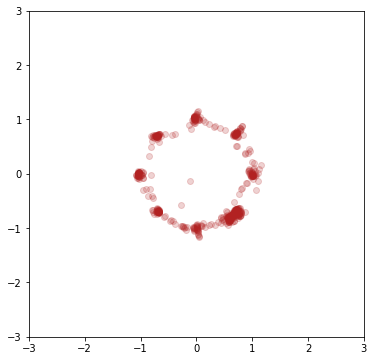

epoch 798
0.6971468925476074 0.6967682838439941


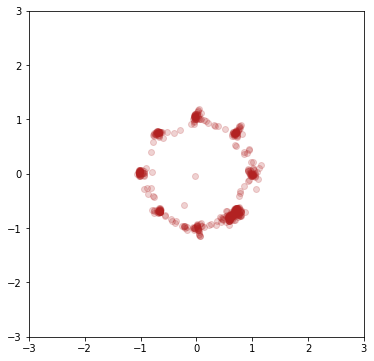

epoch 799
0.6923484206199646 0.7024100422859192


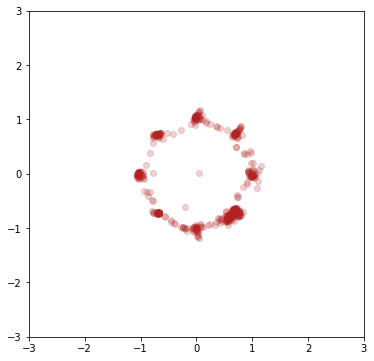

epoch 800
0.6918504238128662 0.6994807720184326


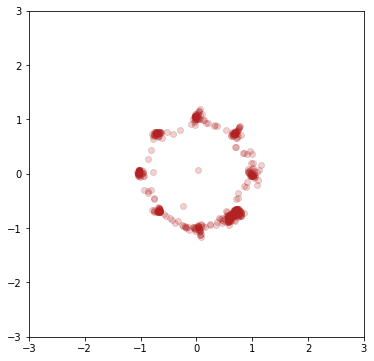

epoch 801
0.6949095129966736 0.698456883430481


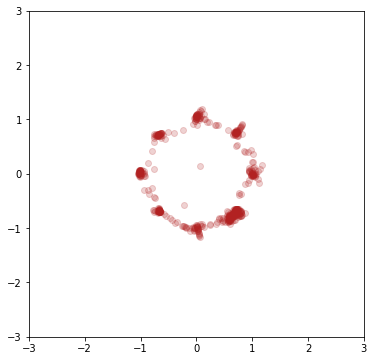

epoch 802
0.693385899066925 0.7020261883735657


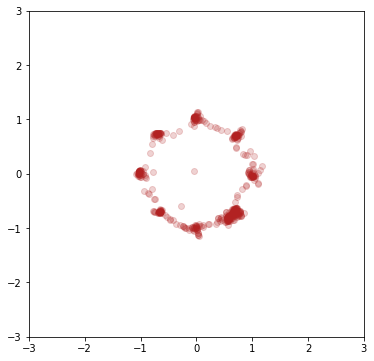

epoch 803
0.6933262348175049 0.704180896282196


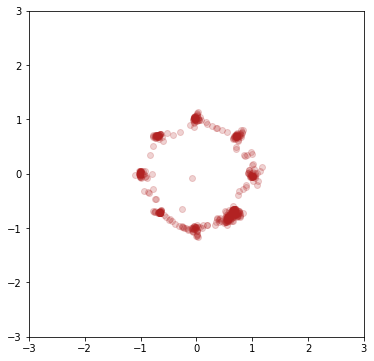

epoch 804
0.6950684189796448 0.7023080587387085


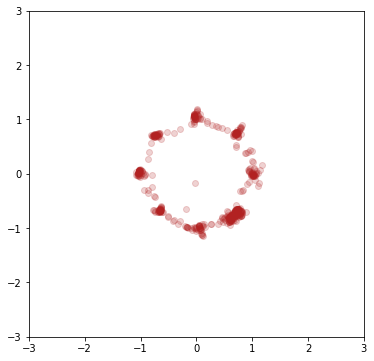

epoch 805
0.6936033368110657 0.6981827020645142


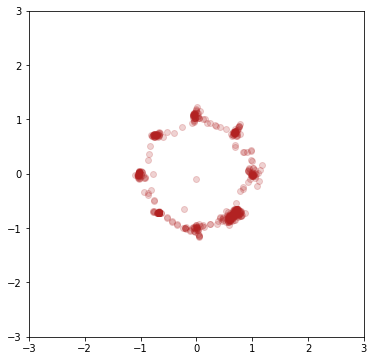

epoch 806
0.6928605437278748 0.7033242583274841


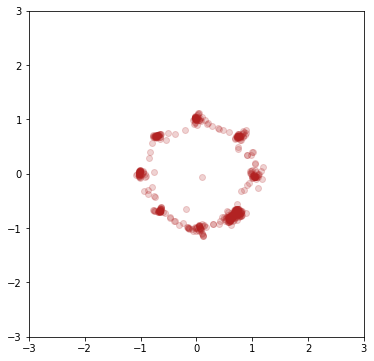

epoch 807
0.6940951347351074 0.7053543329238892


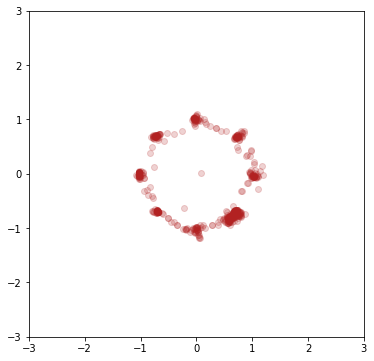

epoch 808
0.6935360431671143 0.7042726278305054


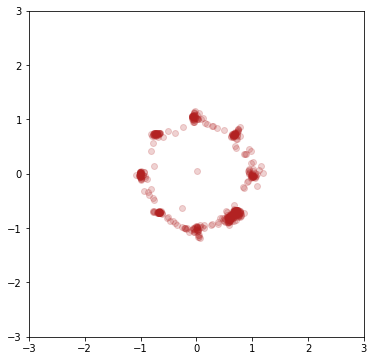

epoch 809
0.6929628849029541 0.7000596523284912


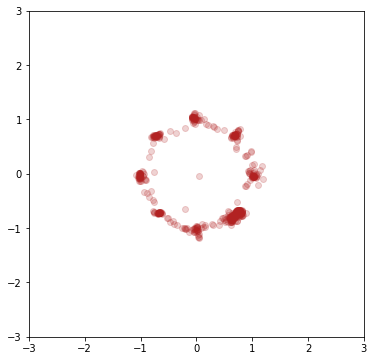

epoch 810
0.6941813826560974 0.7046452164649963


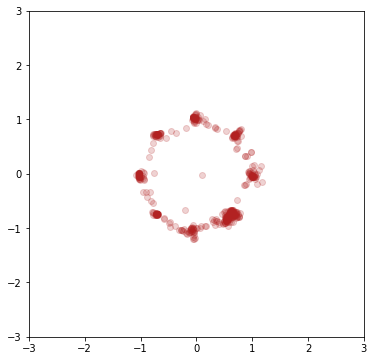

epoch 811
0.6965885758399963 0.7029464840888977


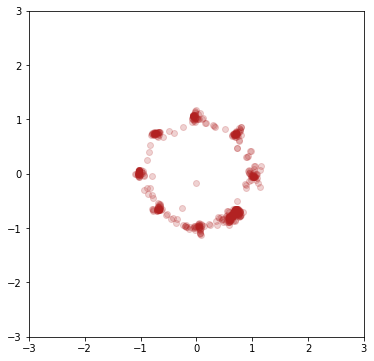

epoch 812
0.693382978439331 0.6983041167259216


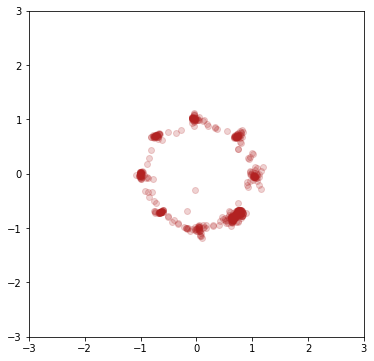

epoch 813
0.6936305165290833 0.7035202980041504


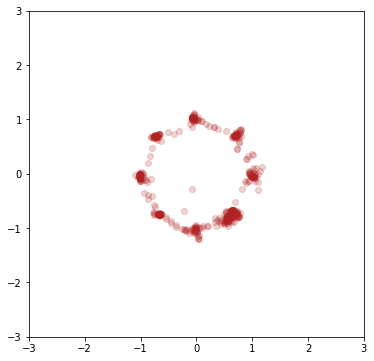

epoch 814
0.6944934725761414 0.7038537859916687


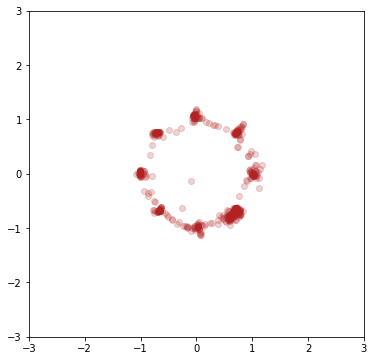

epoch 815
0.6965287923812866 0.6990301609039307


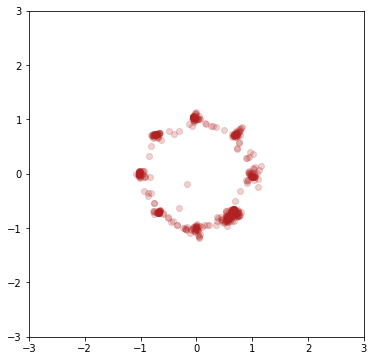

epoch 816
0.6960613131523132 0.6987483501434326


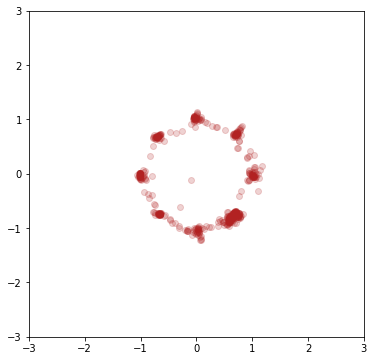

epoch 817
0.6921541690826416 0.698442280292511


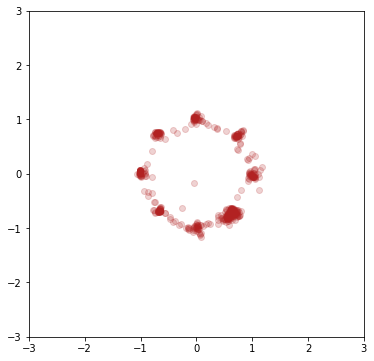

epoch 818
0.6917105317115784 0.7051020860671997


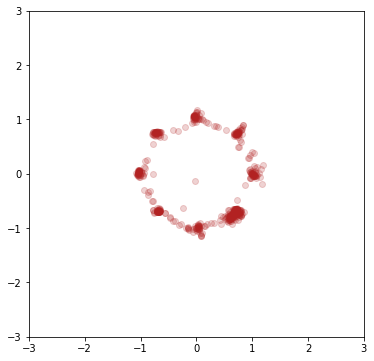

epoch 819
0.6937912106513977 0.7016189694404602


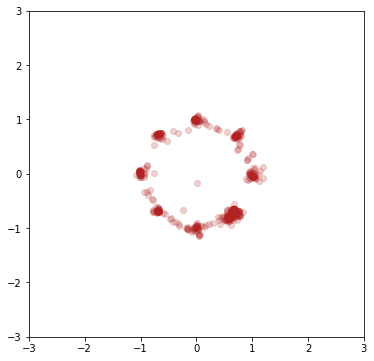

epoch 820
0.6947550773620605 0.706190824508667


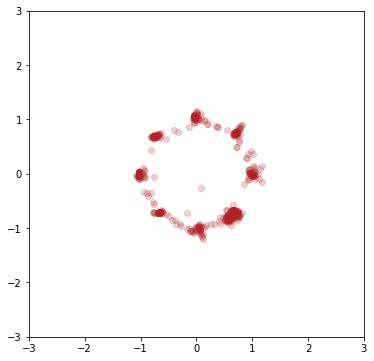

epoch 821
0.6959170699119568 0.7017058730125427


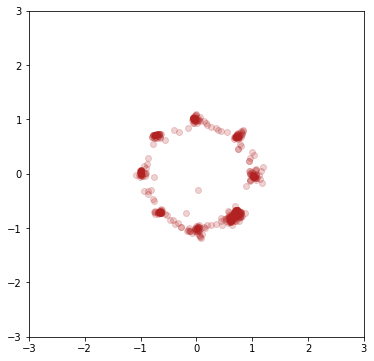

epoch 822
0.6940443515777588 0.7045685648918152


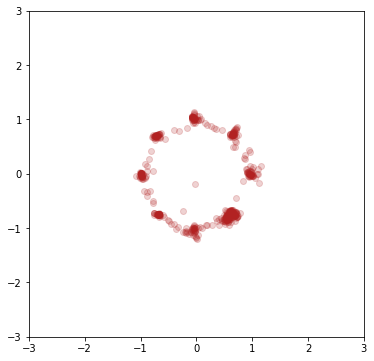

epoch 823
0.690976083278656 0.7023570537567139


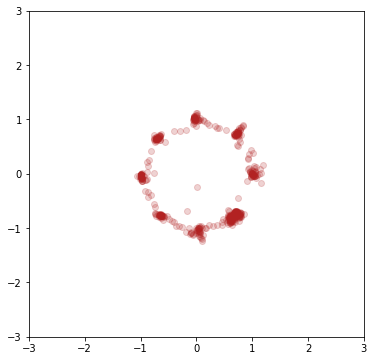

epoch 824
0.6940727233886719 0.7025198340415955


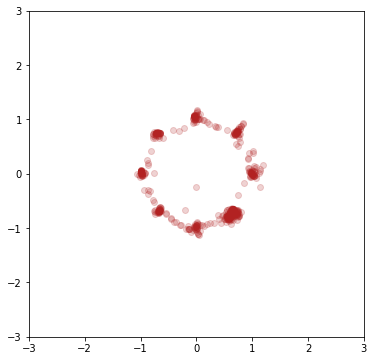

epoch 825
0.6900801062583923 0.7066048979759216


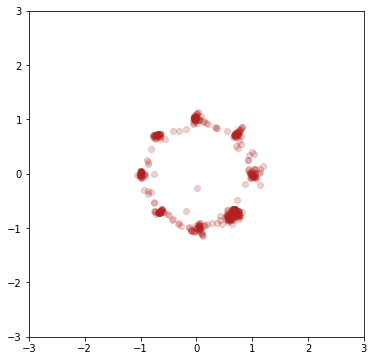

epoch 826
0.6950178742408752 0.702311635017395


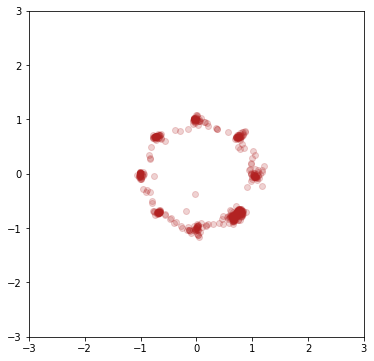

epoch 827
0.6937142014503479 0.7038836479187012


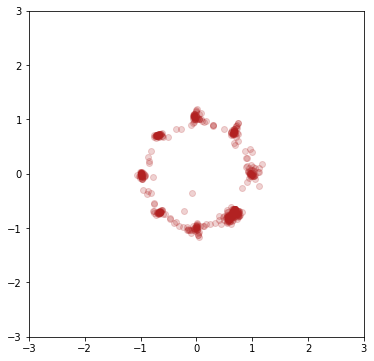

epoch 828
0.6949819922447205 0.7004711031913757


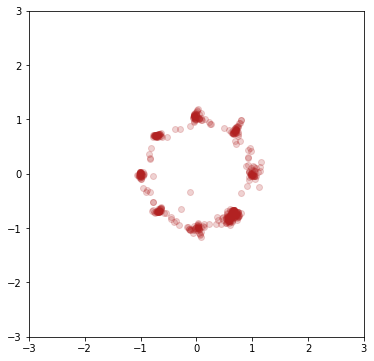

epoch 829
0.6948399543762207 0.7011620998382568


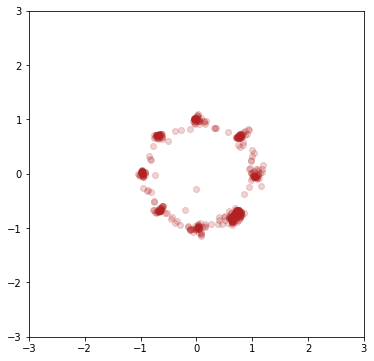

epoch 830
0.691953718662262 0.7027566432952881


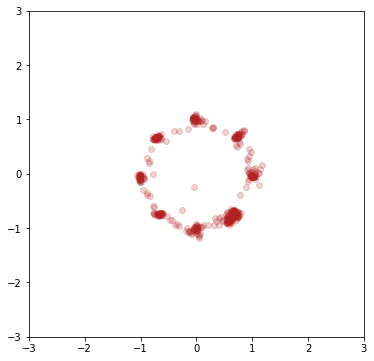

epoch 831
0.6901302933692932 0.7027573585510254


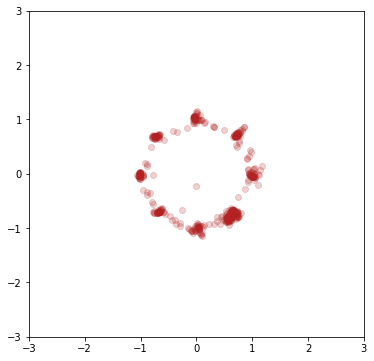

epoch 832
0.6953966021537781 0.7061960101127625


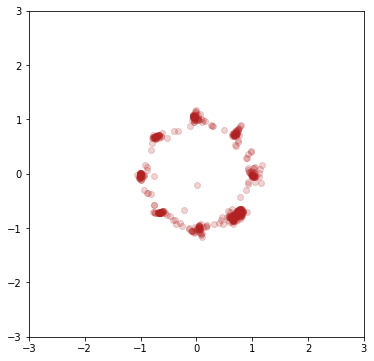

epoch 833
0.6921373605728149 0.6989105343818665


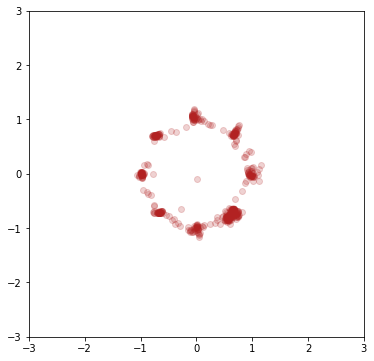

epoch 834
0.6904023885726929 0.7078068256378174


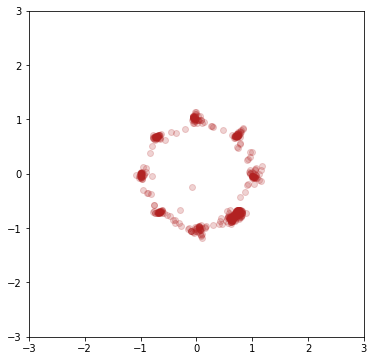

epoch 835
0.6944547891616821 0.7019909024238586


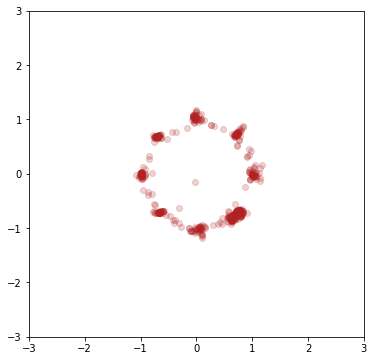

epoch 836
0.6940120458602905 0.6996647715568542


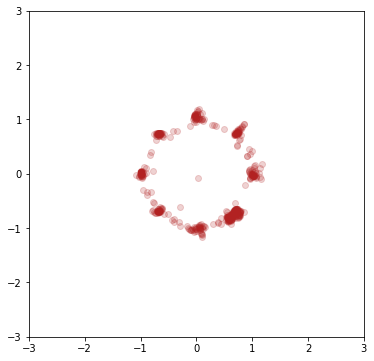

epoch 837
0.6912402510643005 0.6977216601371765


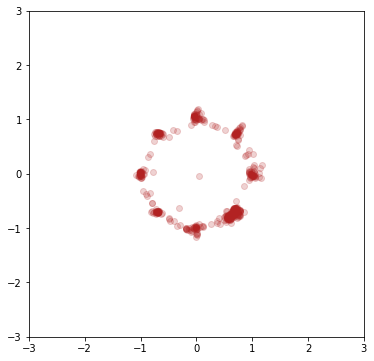

epoch 838
0.6929891705513 0.7049325704574585


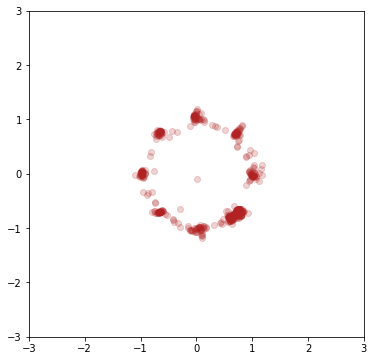

epoch 839
0.6931220889091492 0.7020527720451355


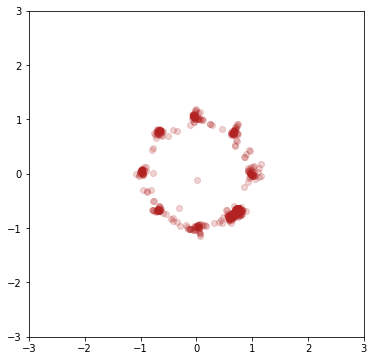

epoch 840
0.6950459480285645 0.7016993165016174


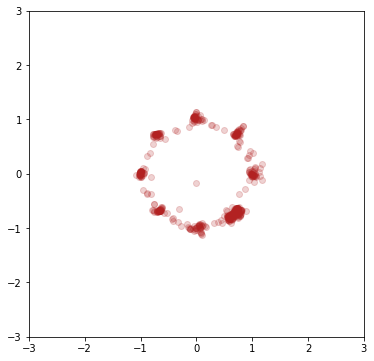

epoch 841
0.6927230358123779 0.7015809416770935


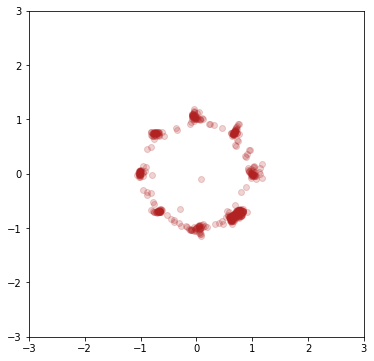

epoch 842
0.6934869289398193 0.7032217383384705


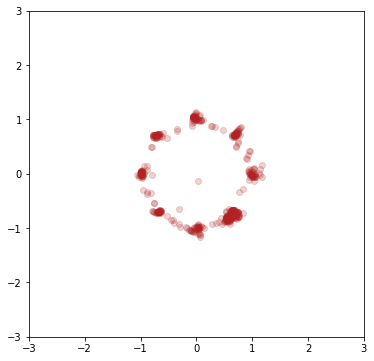

epoch 843
0.6928704977035522 0.7016528248786926


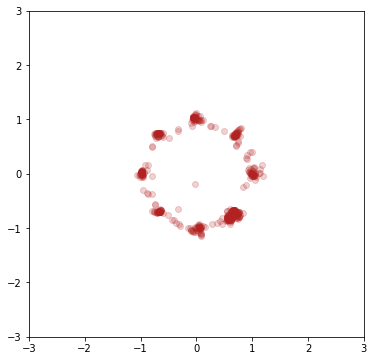

epoch 844
0.693413257598877 0.7018792629241943


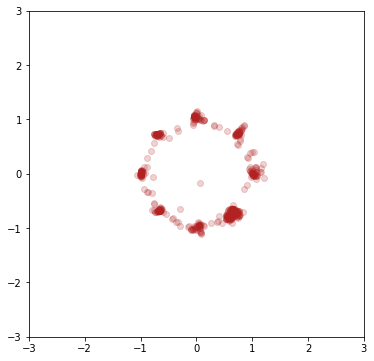

epoch 845
0.6959475874900818 0.6974847912788391


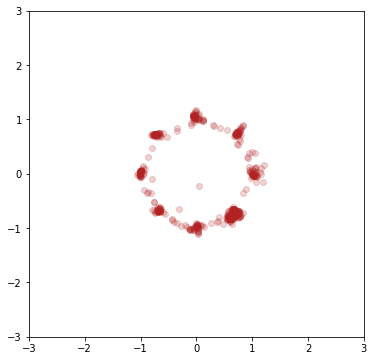

epoch 846
0.6938228011131287 0.7007789611816406


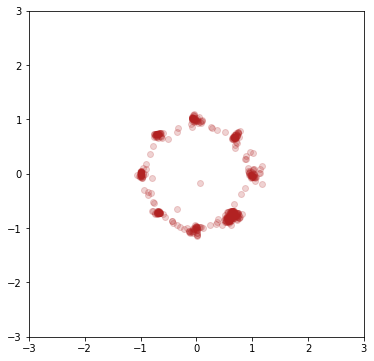

epoch 847
0.6939566135406494 0.7040336728096008


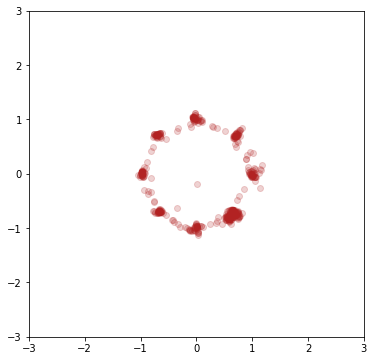

epoch 848
0.6922479867935181 0.7003166675567627


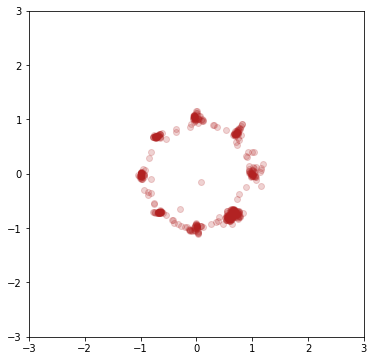

epoch 849
0.6967422366142273 0.7045431733131409


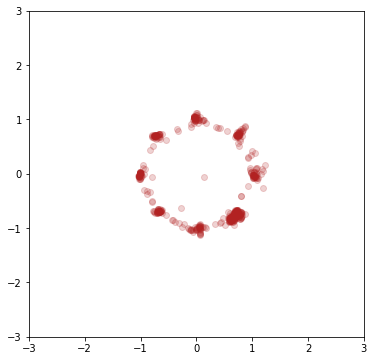

epoch 850
0.6930866241455078 0.705672025680542


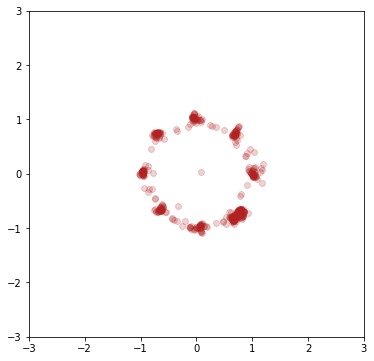

epoch 851
0.6938818097114563 0.7039917707443237


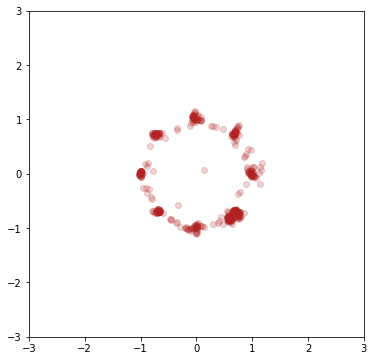

epoch 852
0.6953716278076172 0.703835666179657


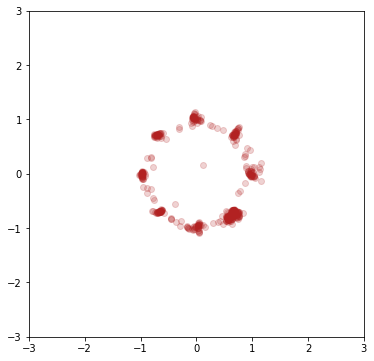

epoch 853
0.6939729452133179 0.7071941494941711


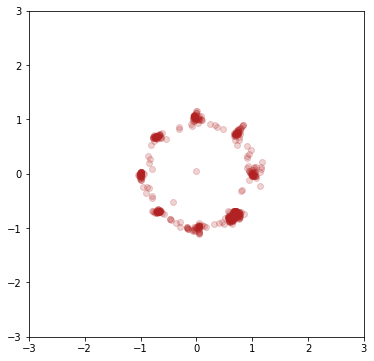

epoch 854
0.6922086477279663 0.7086430191993713


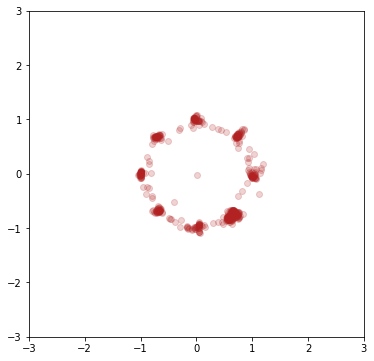

epoch 855
0.6933307647705078 0.7008607387542725


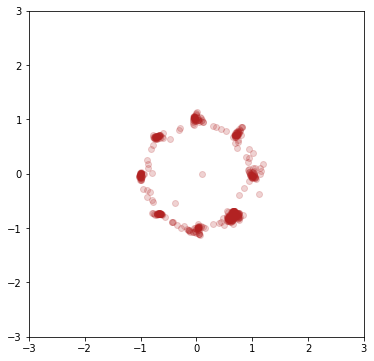

epoch 856
0.6962844729423523 0.7000491619110107


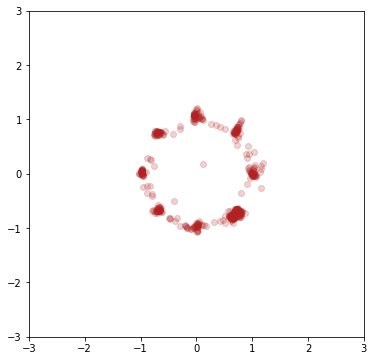

epoch 857
0.6938292980194092 0.7008347511291504


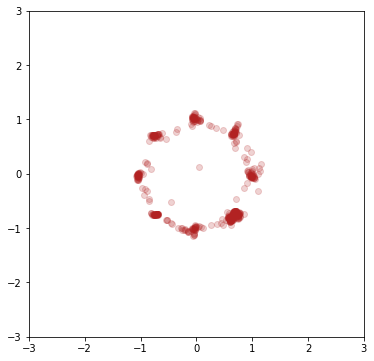

epoch 858
0.6930620670318604 0.7060551643371582


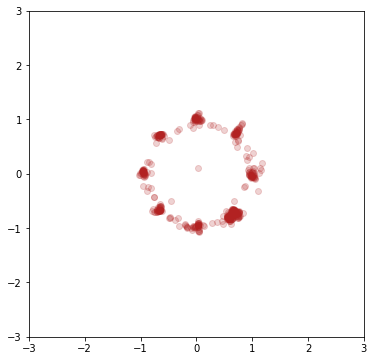

epoch 859
0.6928998827934265 0.699969470500946


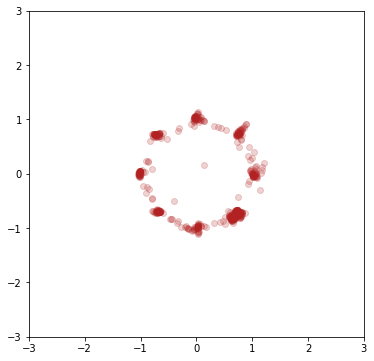

epoch 860
0.697874128818512 0.6969276666641235


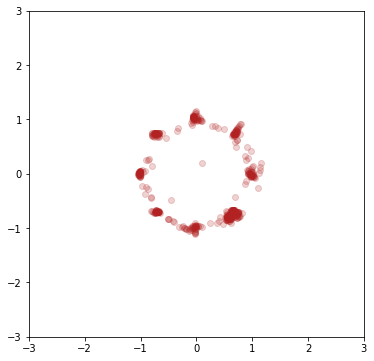

epoch 861
0.6961491107940674 0.7029569745063782


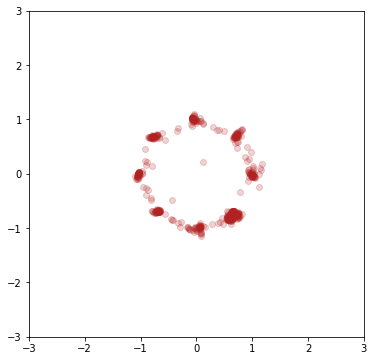

epoch 862
0.6955602169036865 0.7033711075782776


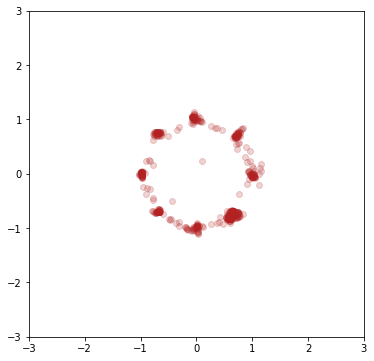

epoch 863
0.6970119476318359 0.7020561099052429


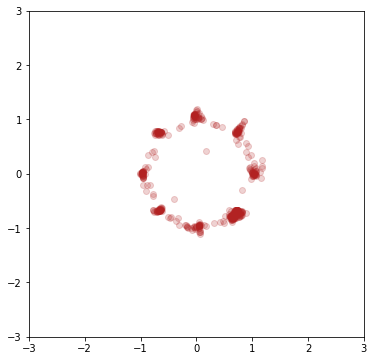

epoch 864
0.6953623294830322 0.6961365342140198


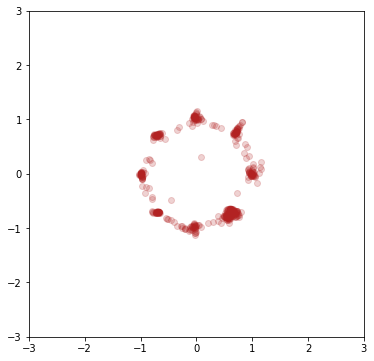

epoch 865
0.6930307149887085 0.7075650095939636


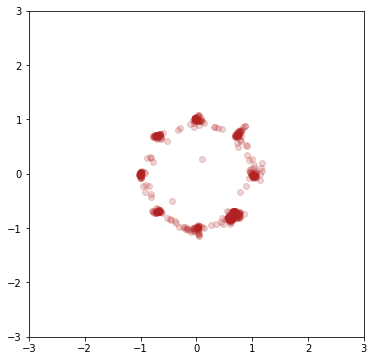

epoch 866
0.6948625445365906 0.7003127336502075


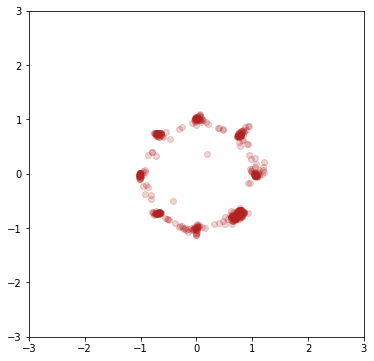

epoch 867
0.6951009631156921 0.7047623991966248


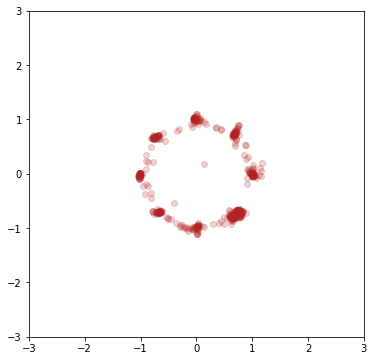

epoch 868
0.6922102570533752 0.7079652547836304


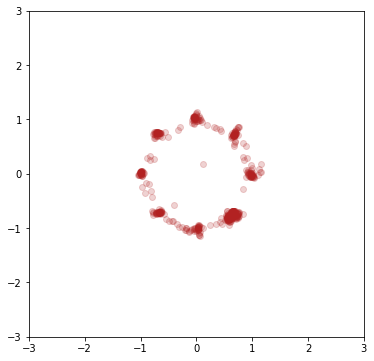

epoch 869
0.6949729323387146 0.705374002456665


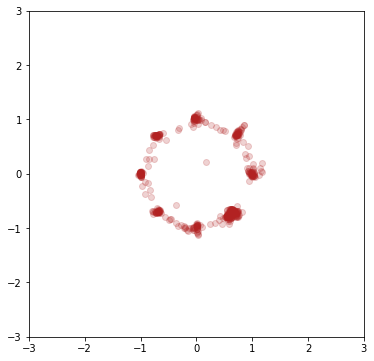

epoch 870
0.695345401763916 0.7037931680679321


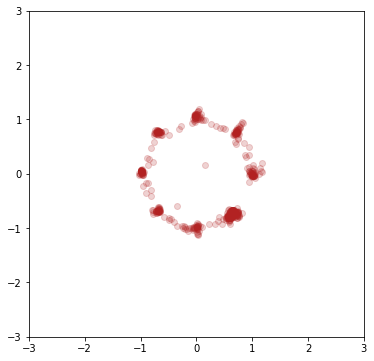

epoch 871
0.6948997378349304 0.7078002691268921


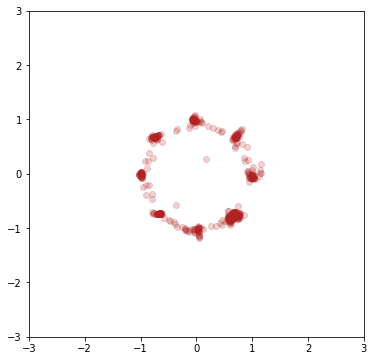

epoch 872
0.6928476691246033 0.6979997754096985


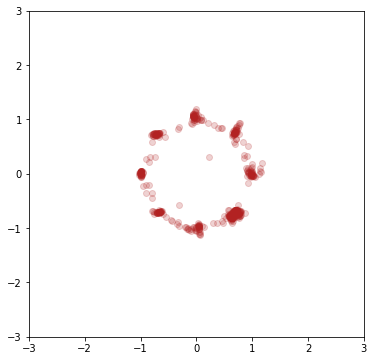

epoch 873
0.6926564574241638 0.7019767165184021


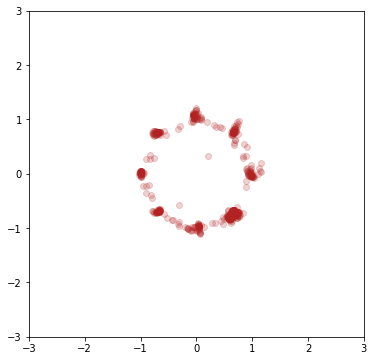

epoch 874
0.6920037865638733 0.6990824937820435


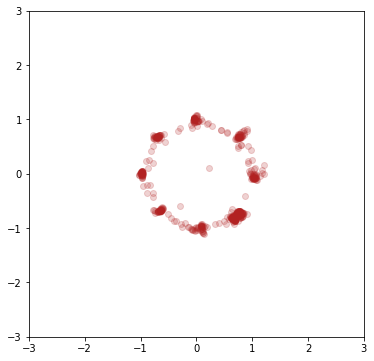

epoch 875
0.6950245499610901 0.695118248462677


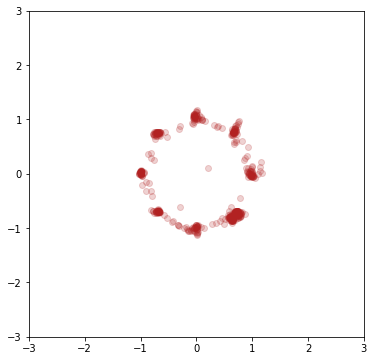

epoch 876
0.6928920745849609 0.7054295539855957


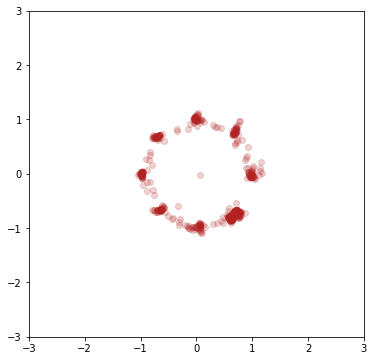

epoch 877
0.6917351484298706 0.7014527916908264


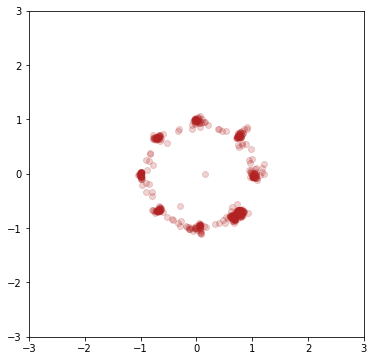

epoch 878
0.6914825439453125 0.7001418471336365


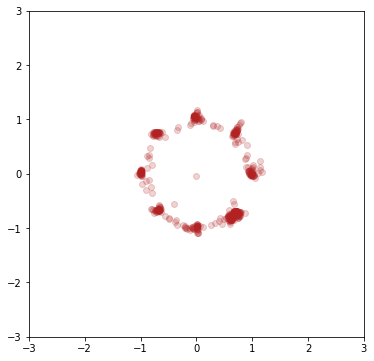

epoch 879
0.6897040009498596 0.7035099267959595


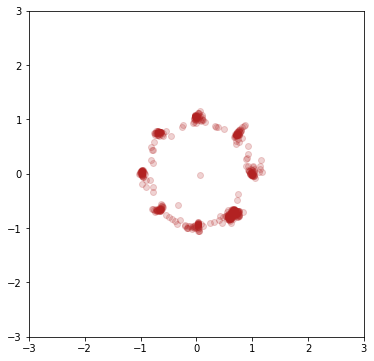

epoch 880
0.6946144104003906 0.7102066278457642


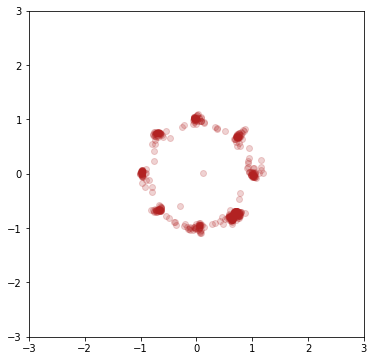

epoch 881
0.6962974667549133 0.702443540096283


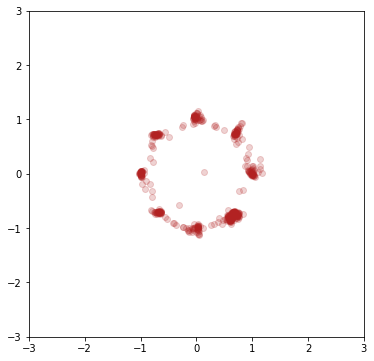

epoch 882
0.6935439109802246 0.7007004022598267


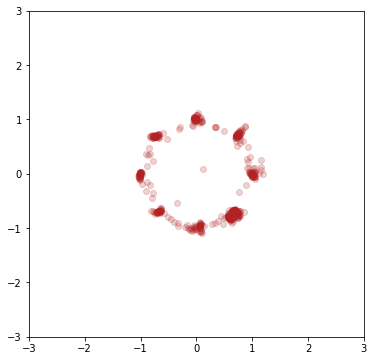

epoch 883
0.6926829814910889 0.7002583146095276


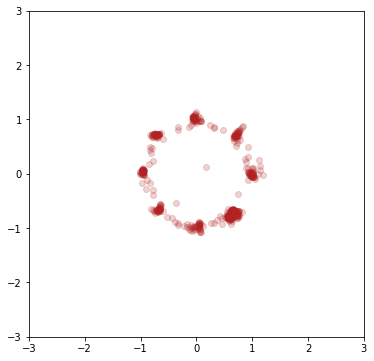

epoch 884
0.6946331262588501 0.7022015452384949


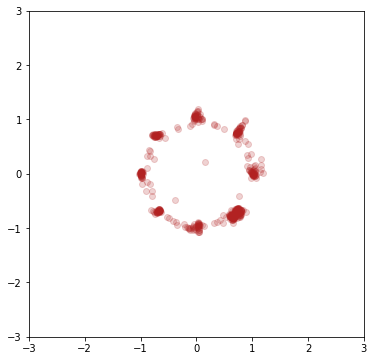

epoch 885
0.6902070045471191 0.7018165588378906


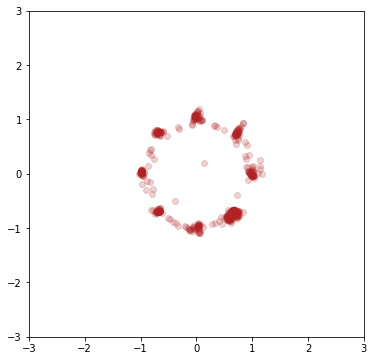

epoch 886
0.6950975060462952 0.705960214138031


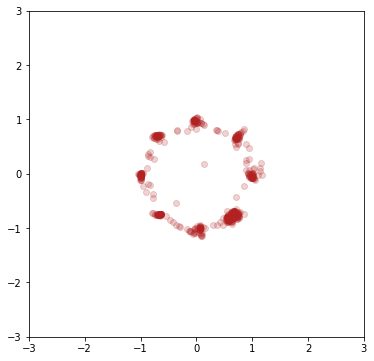

epoch 887
0.6902468204498291 0.7016830444335938


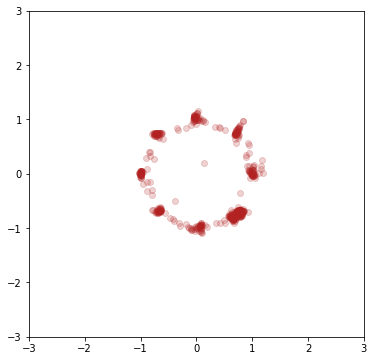

epoch 888
0.6906992197036743 0.7019952535629272


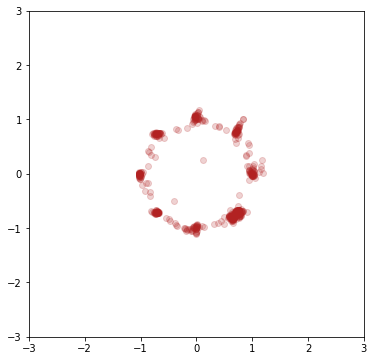

epoch 889
0.6932953000068665 0.7028201818466187


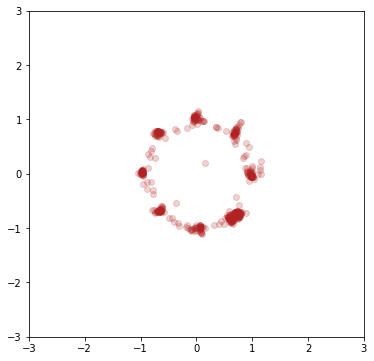

epoch 890
0.6897561550140381 0.7027133703231812


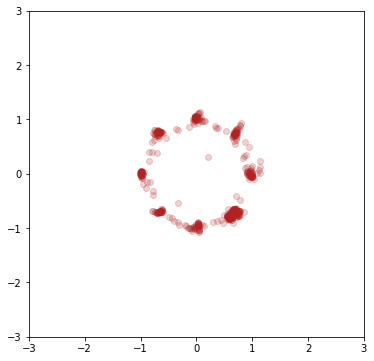

epoch 891
0.6929994225502014 0.7010727524757385


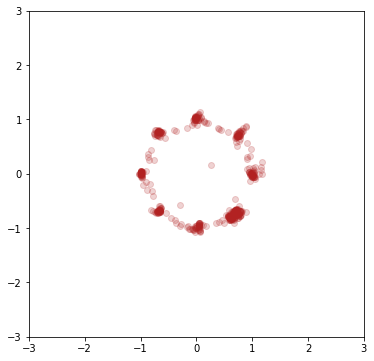

epoch 892
0.693844199180603 0.6972238421440125


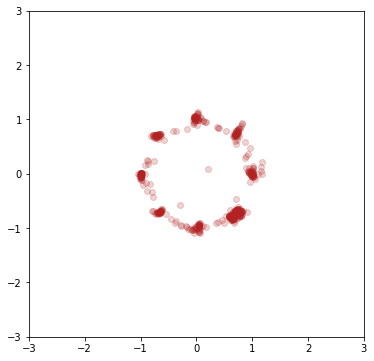

epoch 893
0.696226954460144 0.7062254548072815


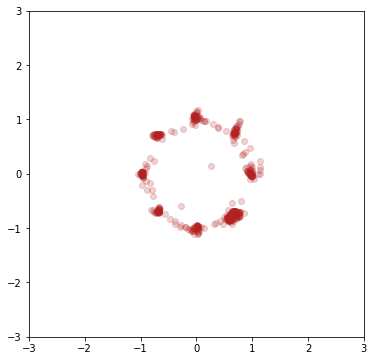

epoch 894
0.6940751671791077 0.7057746648788452


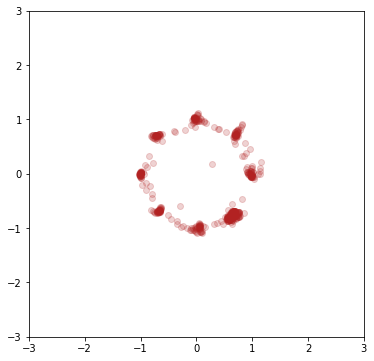

epoch 895
0.6926498413085938 0.7053781747817993


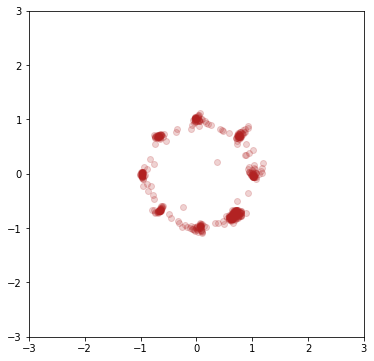

epoch 896
0.693440318107605 0.701769232749939


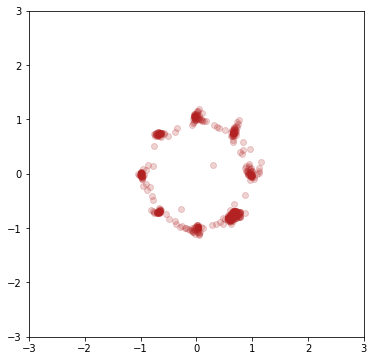

epoch 897
0.6938501000404358 0.7046257257461548


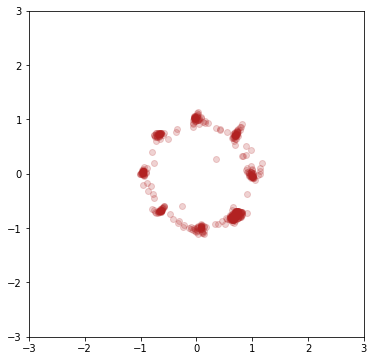

epoch 898
0.6944378614425659 0.7021536827087402


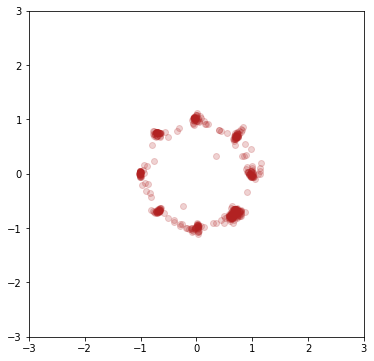

epoch 899
0.6949228644371033 0.7060081362724304


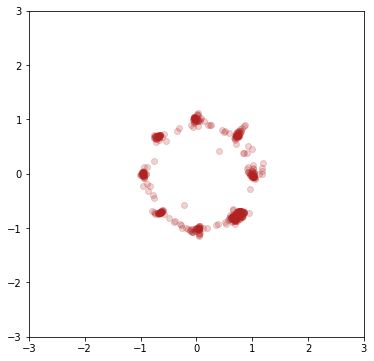

epoch 900
0.6960065960884094 0.7052273750305176


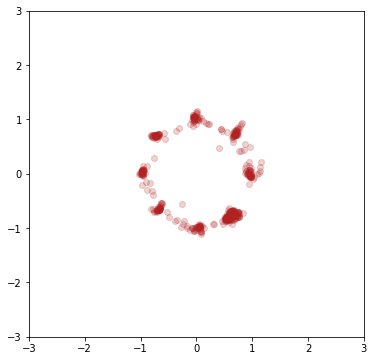

epoch 901
0.69321608543396 0.7050129175186157


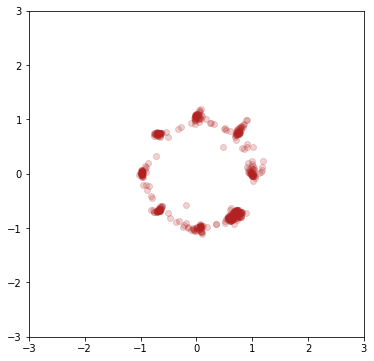

epoch 902
0.6943792700767517 0.7091009616851807


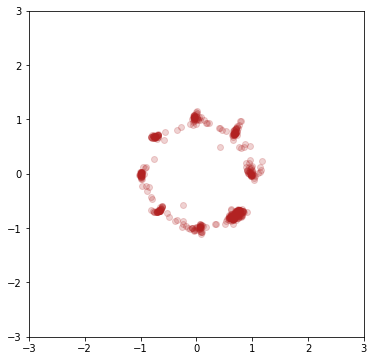

epoch 903
0.698681116104126 0.703458845615387


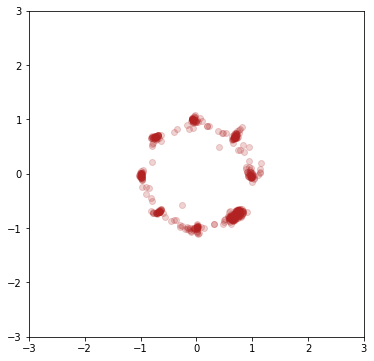

epoch 904
0.6963579654693604 0.7012082934379578


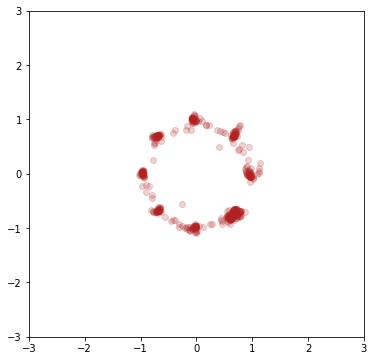

epoch 905
0.6949179172515869 0.7027726769447327


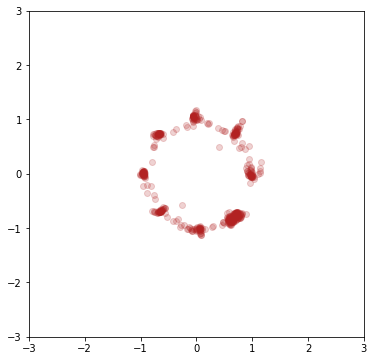

epoch 906
0.6950626969337463 0.7069035172462463


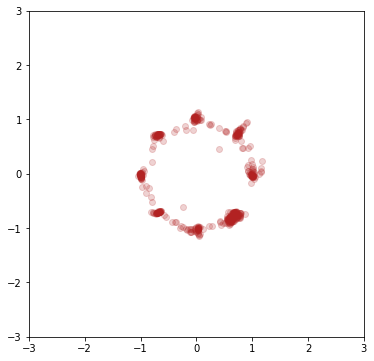

epoch 907
0.6939729452133179 0.7012798190116882


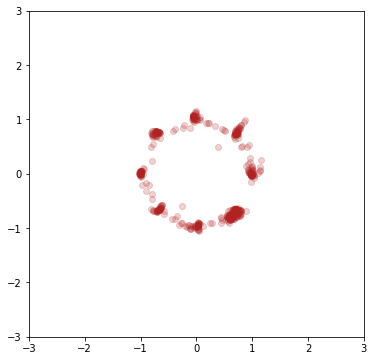

epoch 908
0.693859875202179 0.7087053060531616


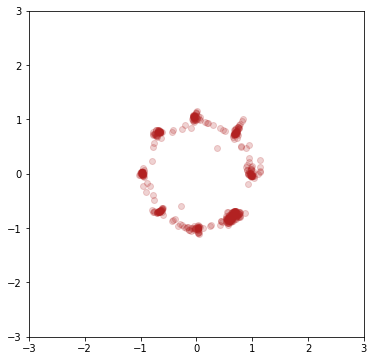

epoch 909
0.6924372911453247 0.7062819600105286


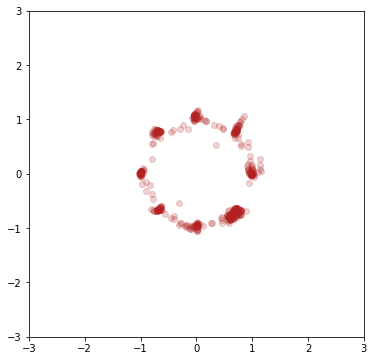

epoch 910
0.6943234801292419 0.6989532709121704


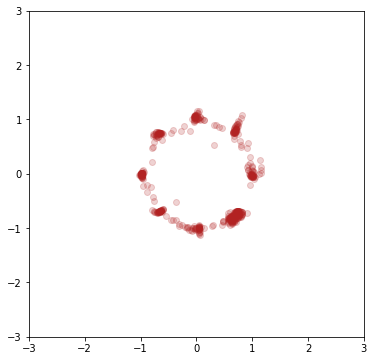

epoch 911
0.6946185231208801 0.7000314593315125


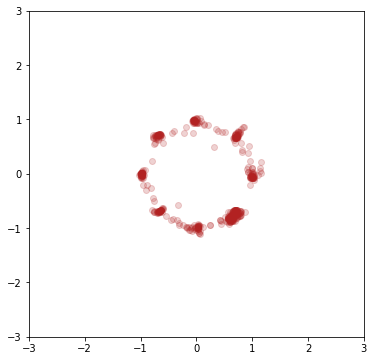

epoch 912
0.6931480169296265 0.7015424370765686


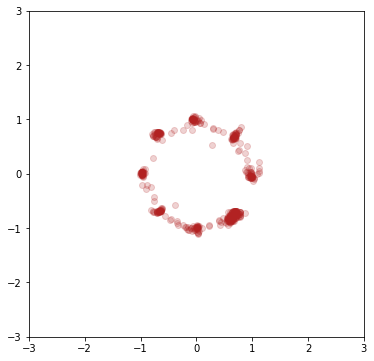

epoch 913
0.6917346119880676 0.7043115496635437


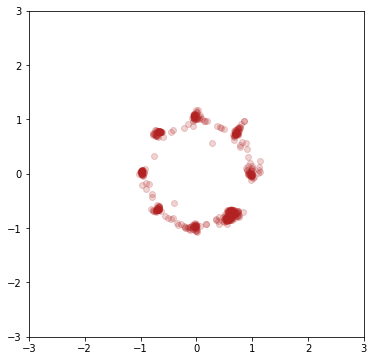

epoch 914
0.6983067989349365 0.699444591999054


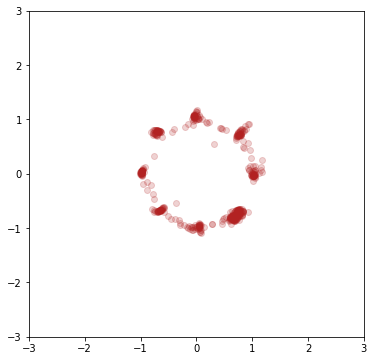

epoch 915
0.6922709941864014 0.7104718089103699


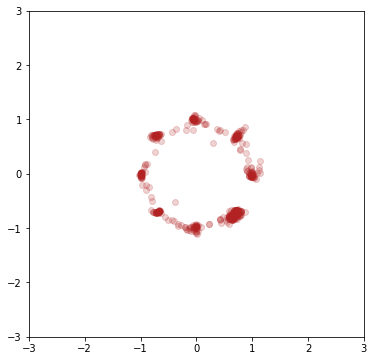

epoch 916
0.6932240128517151 0.7020614743232727


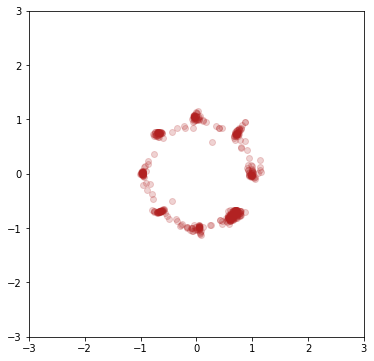

epoch 917
0.6964662671089172 0.698862612247467


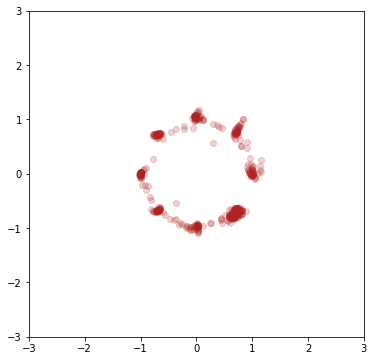

epoch 918
0.6950622797012329 0.7055283188819885


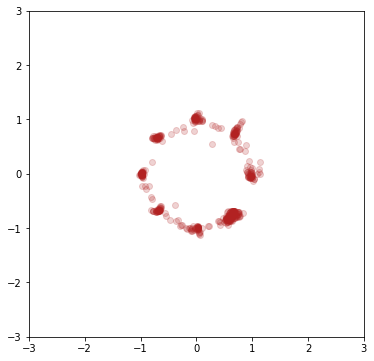

epoch 919
0.6951689124107361 0.6995378136634827


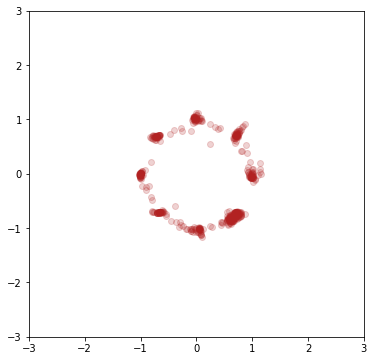

epoch 920
0.6939411759376526 0.7071408033370972


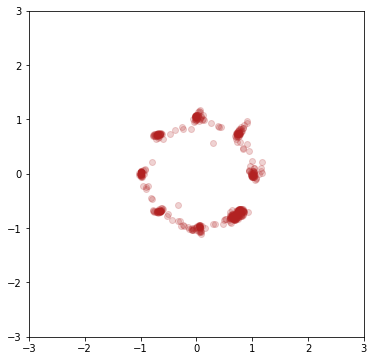

epoch 921
0.6953298449516296 0.7052892446517944


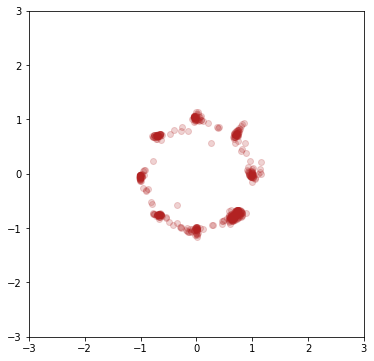

epoch 922
0.6933283805847168 0.7032026648521423


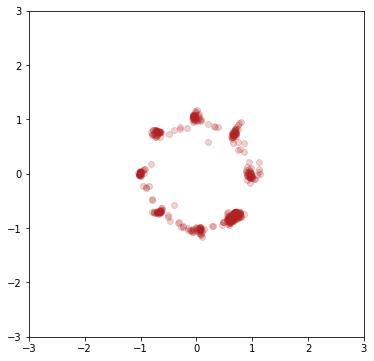

epoch 923
0.6941239833831787 0.7034199237823486


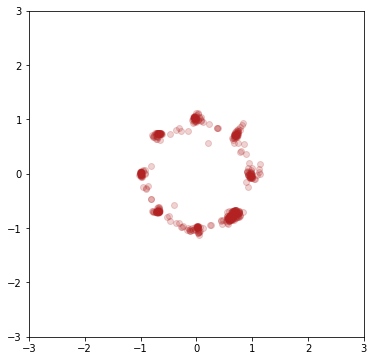

epoch 924
0.6949964761734009 0.7003334164619446


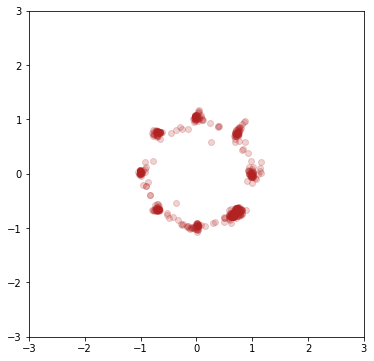

epoch 925
0.6916171908378601 0.7043967247009277


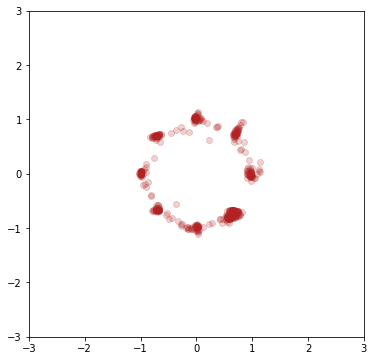

epoch 926
0.6977699995040894 0.7065343260765076


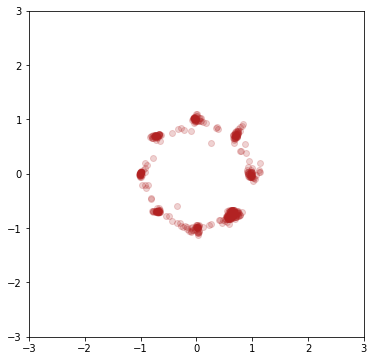

epoch 927
0.6948493719100952 0.7033669352531433


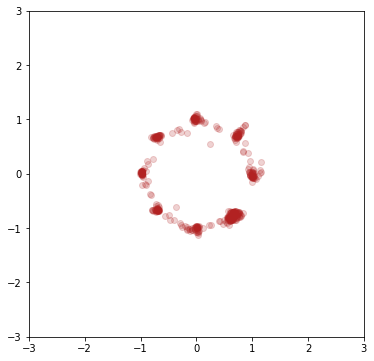

epoch 928
0.695492684841156 0.6999589800834656


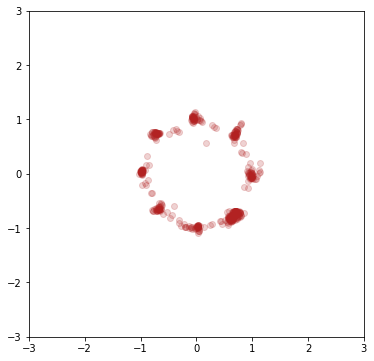

epoch 929
0.6954812407493591 0.7010742425918579


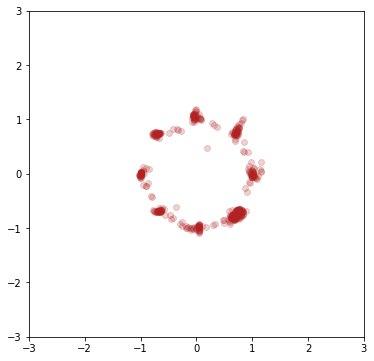

epoch 930
0.6932832598686218 0.7045765519142151


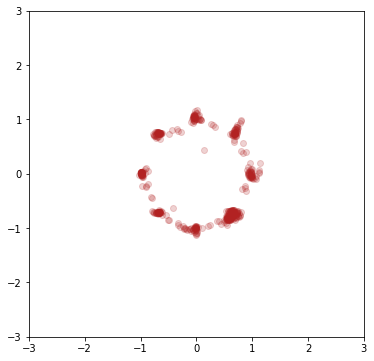

epoch 931
0.6936651468276978 0.707207202911377


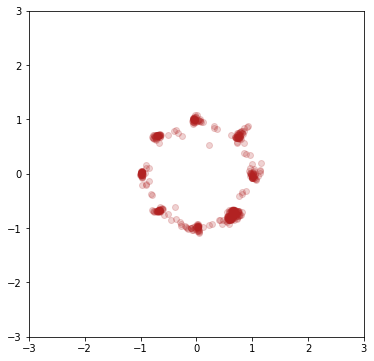

epoch 932
0.6915819048881531 0.6988828778266907


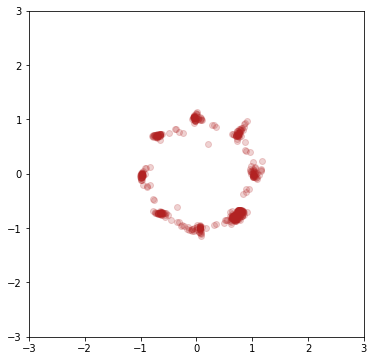

epoch 933
0.6953166127204895 0.7039620876312256


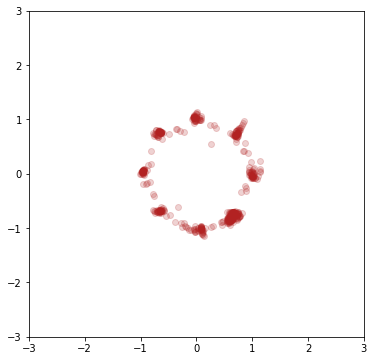

epoch 934
0.6953210234642029 0.7020173668861389


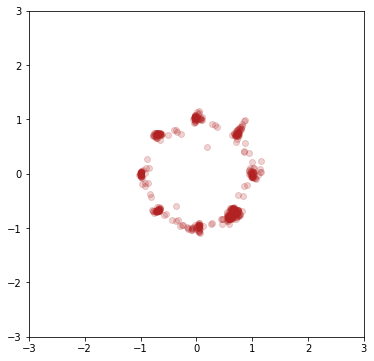

epoch 935
0.6930433511734009 0.7036137580871582


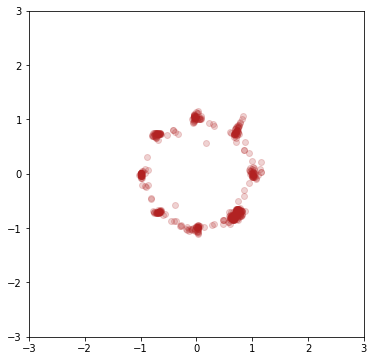

epoch 936
0.6963396668434143 0.7034698724746704


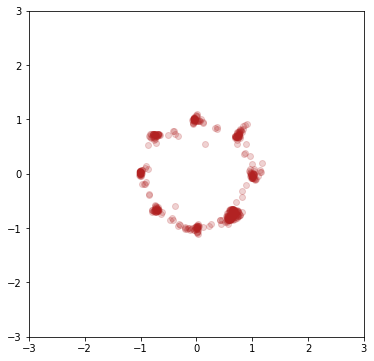

epoch 937
0.6963784098625183 0.7071818709373474


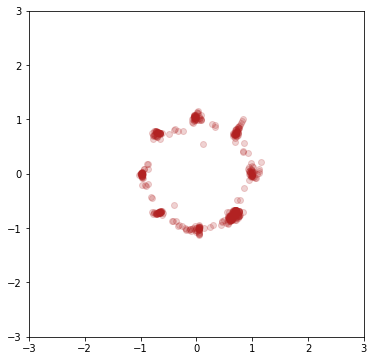

epoch 938
0.6943777203559875 0.7079615592956543


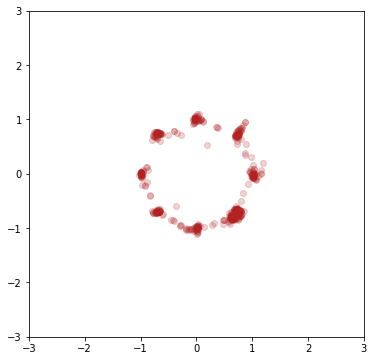

epoch 939
0.6919523477554321 0.6956355571746826


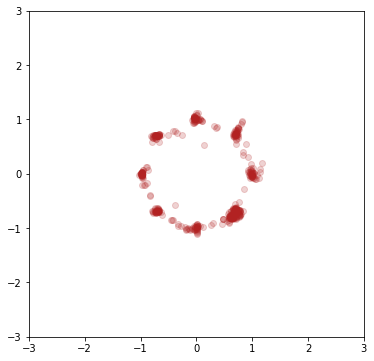

epoch 940
0.6940614581108093 0.699751615524292


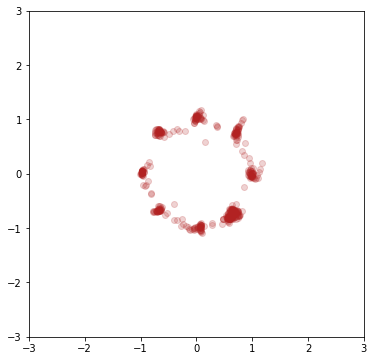

epoch 941
0.6956710815429688 0.7045753002166748


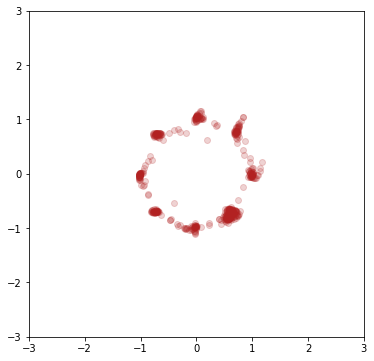

epoch 942
0.6935523748397827 0.708881139755249


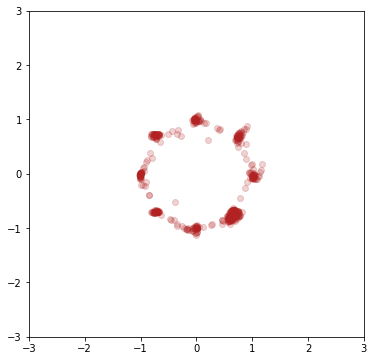

epoch 943
0.6936885118484497 0.7020582556724548


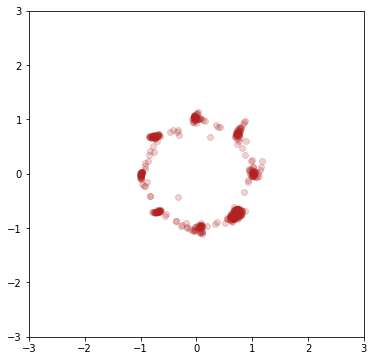

epoch 944
0.6961604952812195 0.70455002784729


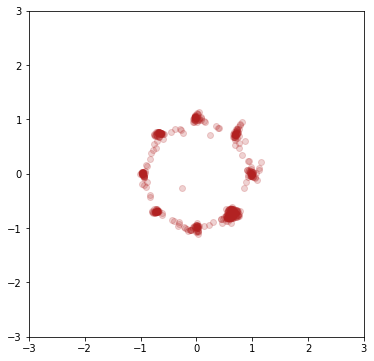

epoch 945
0.6933688521385193 0.7063712477684021


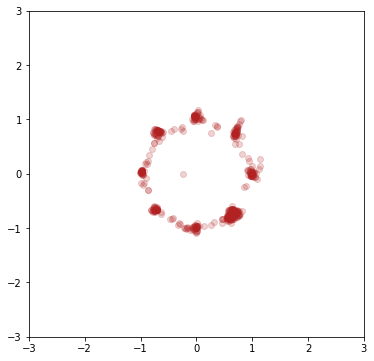

epoch 946
0.6932389736175537 0.6986078023910522


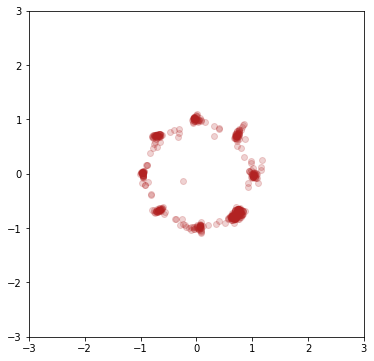

epoch 947
0.6933941841125488 0.7068081498146057


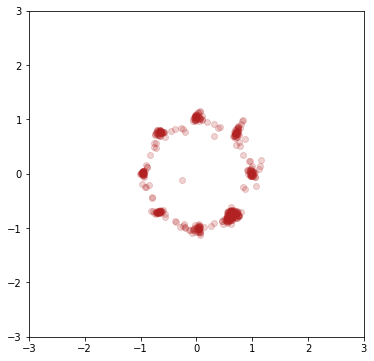

epoch 948
0.6930305361747742 0.702176570892334


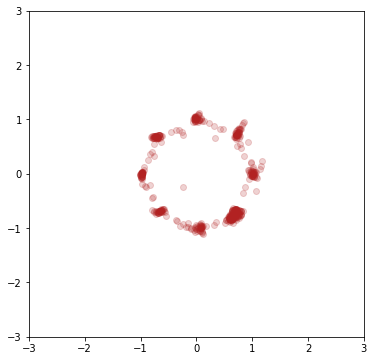

epoch 949
0.6919406056404114 0.6999943256378174


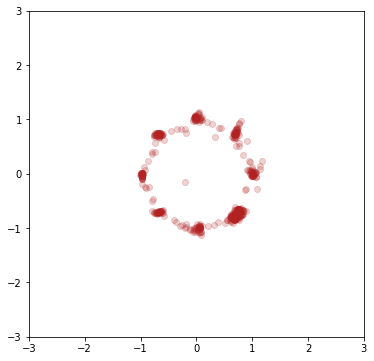

epoch 950
0.6950140595436096 0.7007784843444824


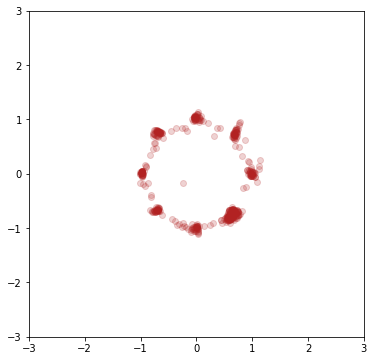

epoch 951
0.6935561895370483 0.6995745301246643


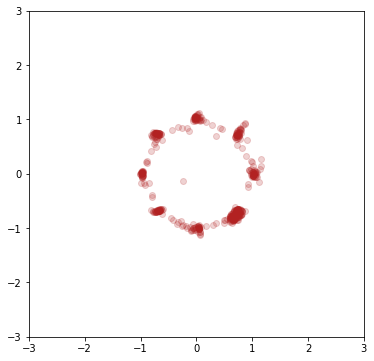

epoch 952
0.6912660002708435 0.699842631816864


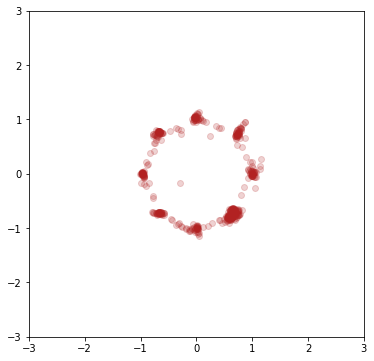

epoch 953
0.694917619228363 0.694581925868988


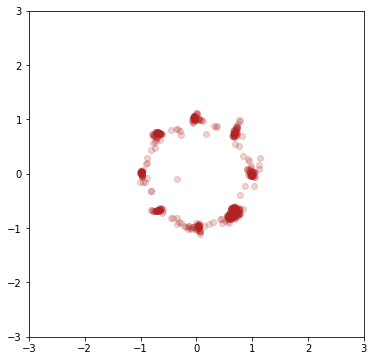

epoch 954
0.6984708905220032 0.7008309364318848


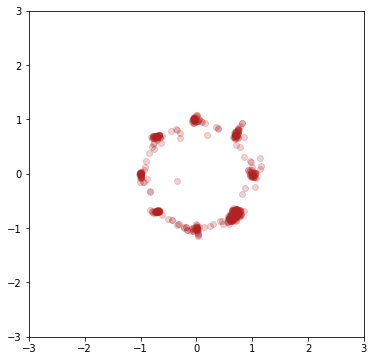

epoch 955
0.692223072052002 0.7081437706947327


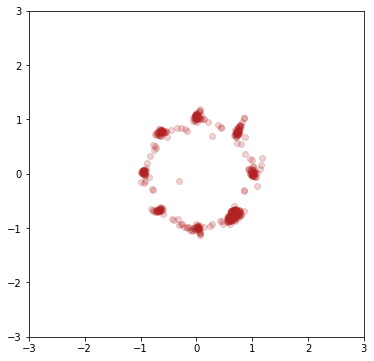

epoch 956
0.6938133835792542 0.706838846206665


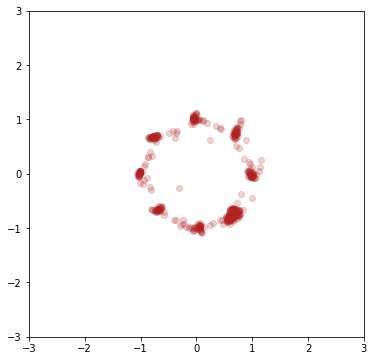

epoch 957
0.6958895325660706 0.7006782293319702


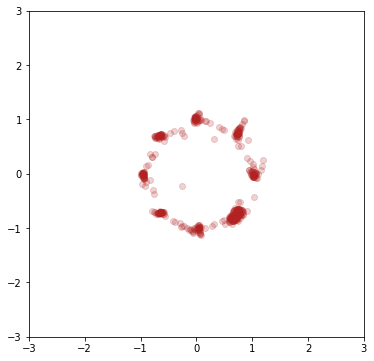

epoch 958
0.6922969222068787 0.6978966593742371


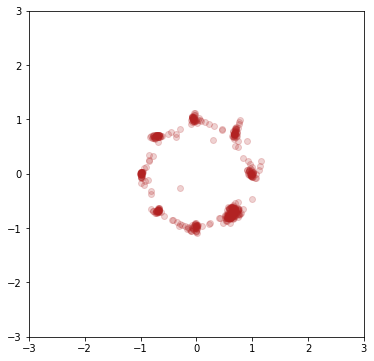

epoch 959
0.696698009967804 0.6996332406997681


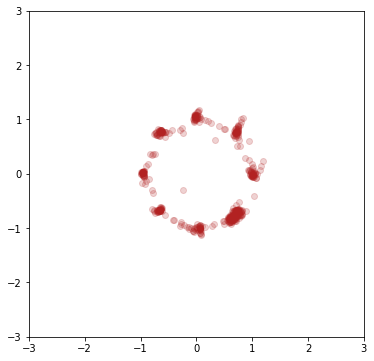

epoch 960
0.6967858076095581 0.6989160180091858


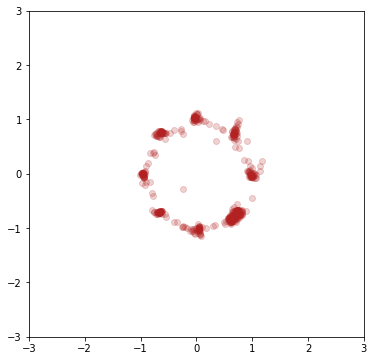

epoch 961
0.6961948275566101 0.7042279839515686


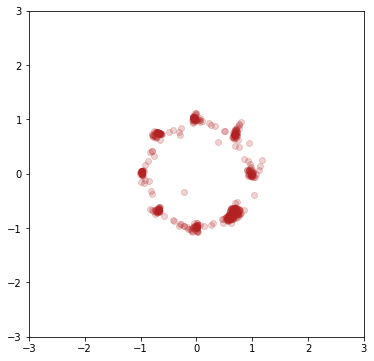

epoch 962
0.695037305355072 0.702084481716156


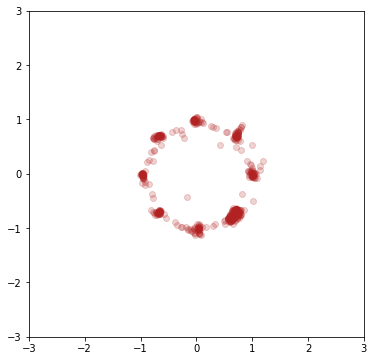

epoch 963
0.6939576864242554 0.6966938972473145


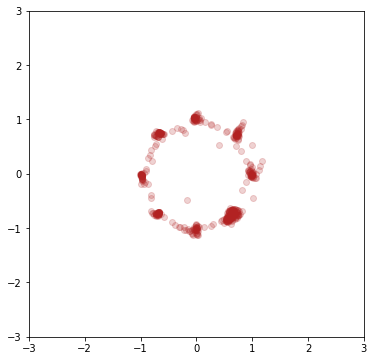

epoch 964
0.6996189951896667 0.7043784856796265


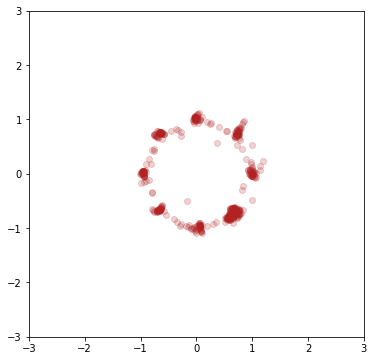

epoch 965
0.6944370269775391 0.7037081122398376


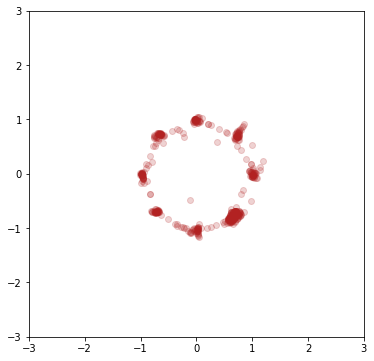

epoch 966
0.6960306763648987 0.7053497433662415


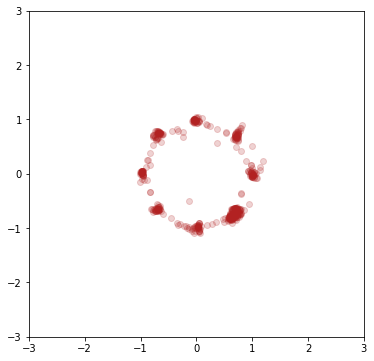

epoch 967
0.6910169720649719 0.7053089141845703


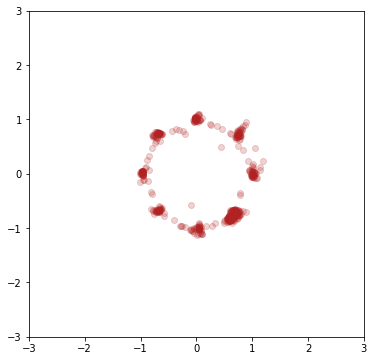

epoch 968
0.6927086114883423 0.7053225636482239


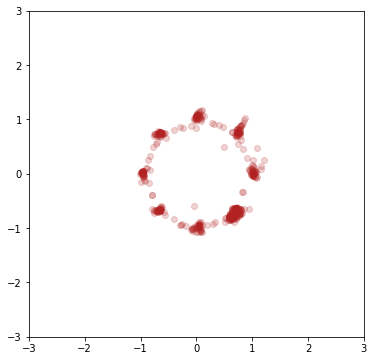

epoch 969
0.6938960552215576 0.6956338286399841


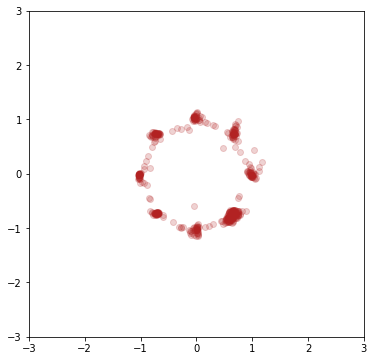

epoch 970
0.6938846111297607 0.6991291642189026


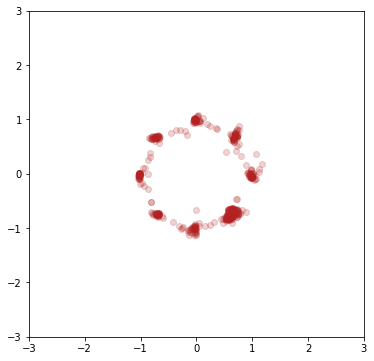

epoch 971
0.6956965923309326 0.7011102437973022


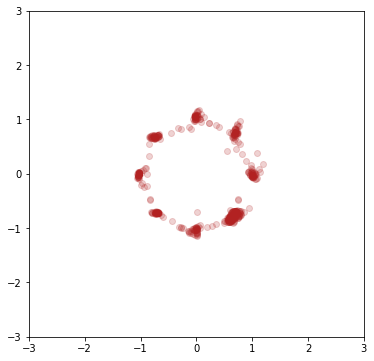

epoch 972
0.6933571696281433 0.7025195360183716


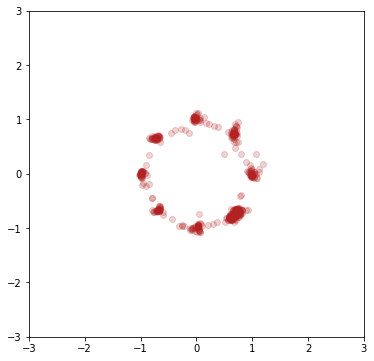

epoch 973
0.6945015788078308 0.7029826641082764


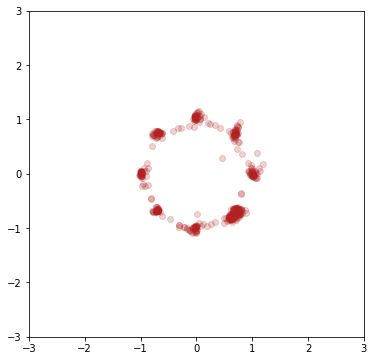

epoch 974
0.6951826214790344 0.7009861469268799


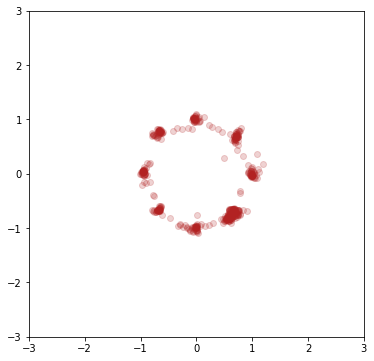

epoch 975
0.6931204199790955 0.7008272409439087


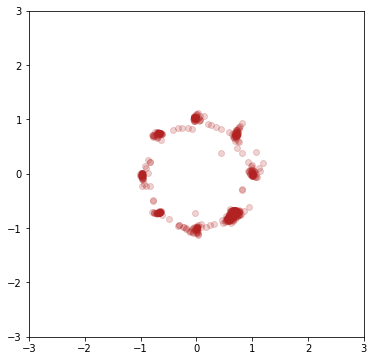

epoch 976
0.6948828101158142 0.7014144659042358


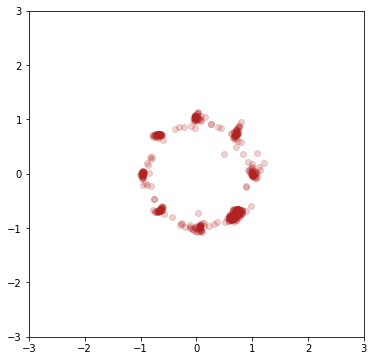

epoch 977
0.6938114762306213 0.7026059031486511


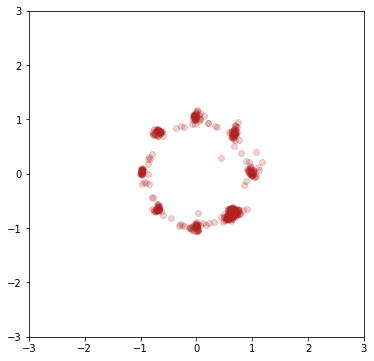

epoch 978
0.6971569657325745 0.6992055773735046


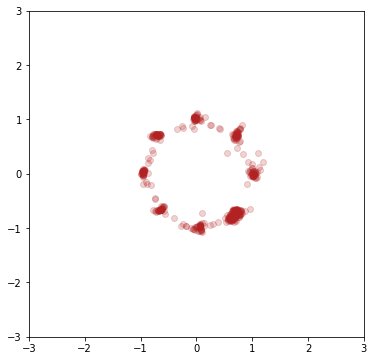

epoch 979
0.693443238735199 0.7075405120849609


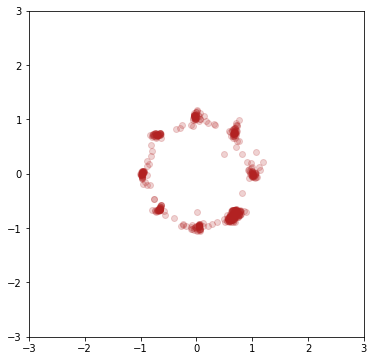

epoch 980
0.6940141320228577 0.7073411345481873


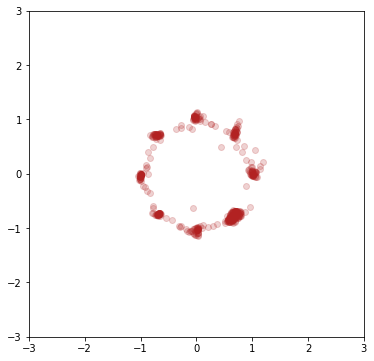

epoch 981
0.6895468235015869 0.7032281756401062


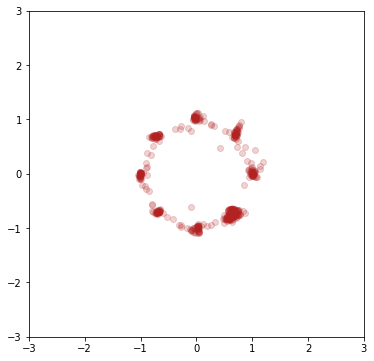

epoch 982
0.6966118812561035 0.7015764117240906


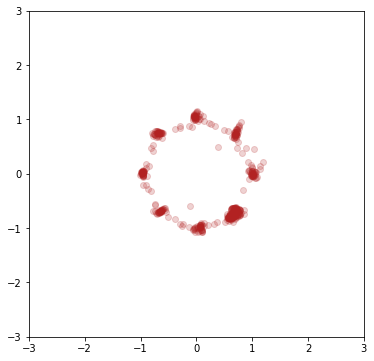

epoch 983
0.6923953294754028 0.7023613452911377


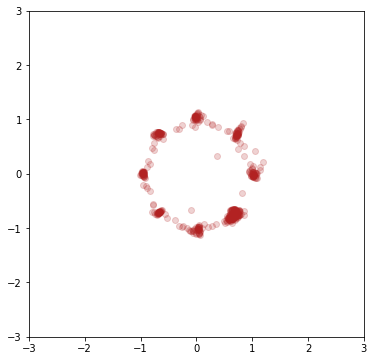

epoch 984
0.6930160522460938 0.7032660841941833


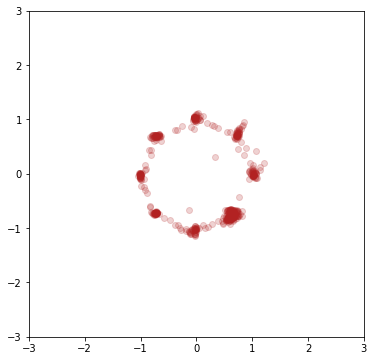

epoch 985
0.6931814551353455 0.701586902141571


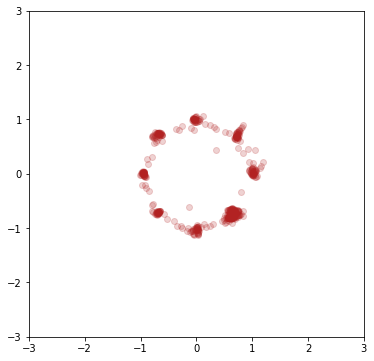

epoch 986
0.6966683864593506 0.7006274461746216


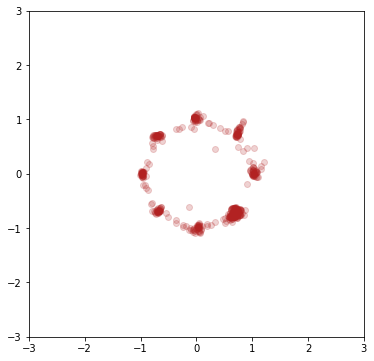

epoch 987
0.6950432062149048 0.6992394924163818


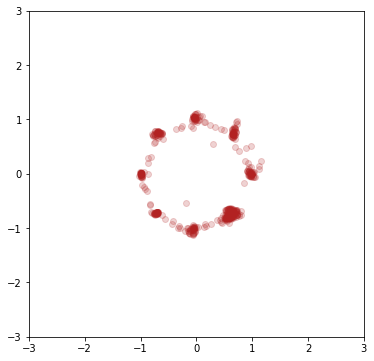

epoch 988
0.6935572624206543 0.70282381772995


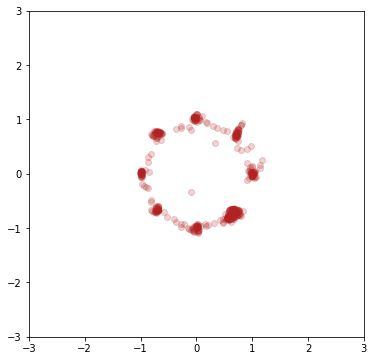

epoch 989
0.6938564777374268 0.6995776295661926


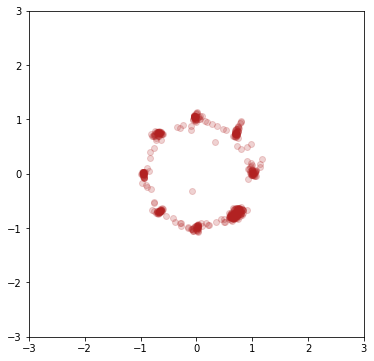

epoch 990
0.6943831443786621 0.7011348605155945


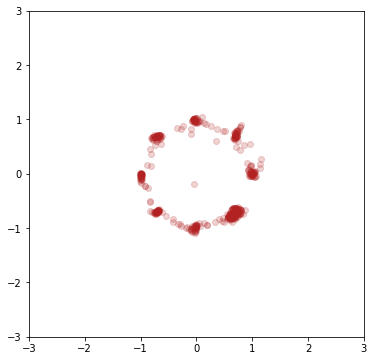

epoch 991
0.6932384967803955 0.7051263451576233


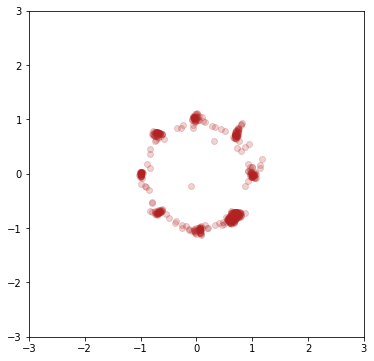

epoch 992
0.6948928833007812 0.7020710706710815


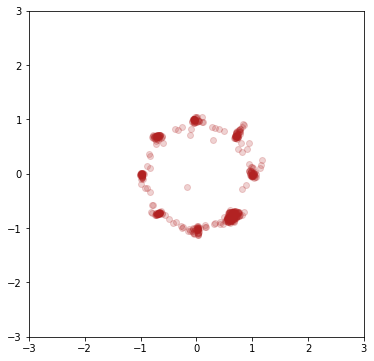

epoch 993
0.6910583972930908 0.698512852191925


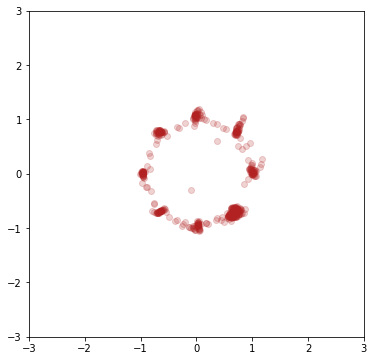

epoch 994
0.6939329504966736 0.700480043888092


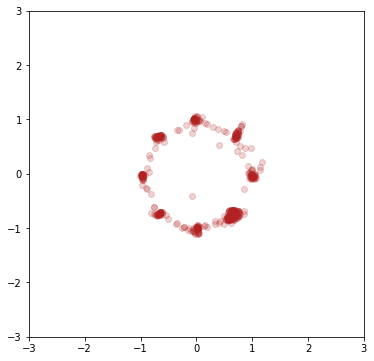

epoch 995
0.6938359141349792 0.7017886638641357


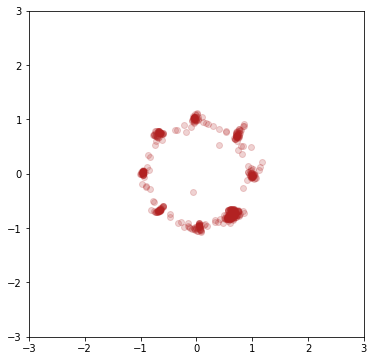

epoch 996
0.6963728070259094 0.7009534239768982


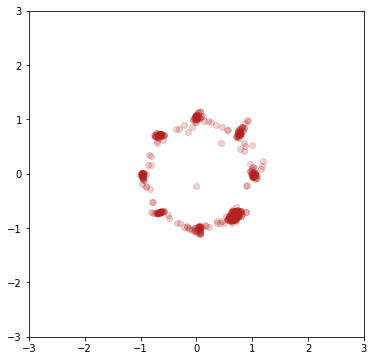

epoch 997
0.6936715841293335 0.7071922421455383


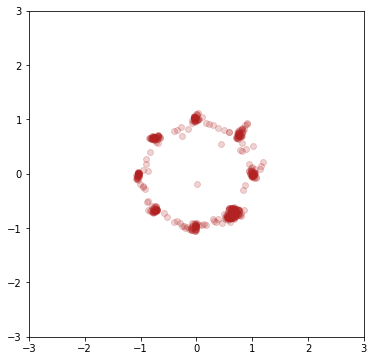

epoch 998
0.6966314911842346 0.7023767232894897


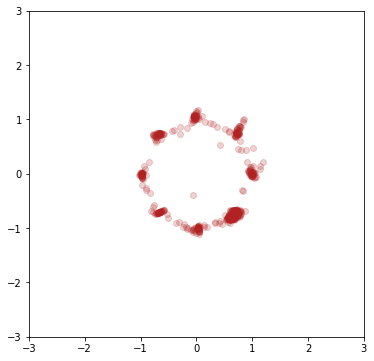

epoch 999
0.6934601068496704 0.7005388140678406


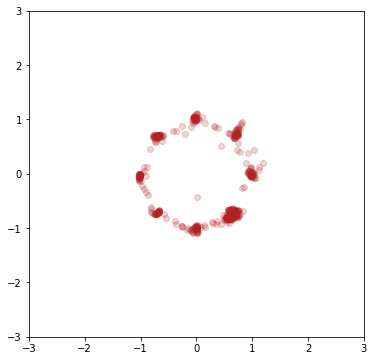

In [ ]:
train(x_train, n_epochs=1000, n_batch=200)

## 学習結果の確認

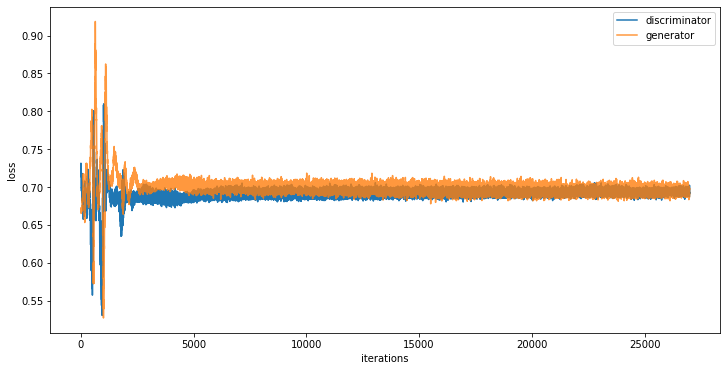

In [ ]:
plt.figure(figsize=(12,6))
plt.plot(d_history, label='discriminator')
plt.plot(g_history, label='generator', alpha=0.8)
plt.legend()
plt.xlabel('iterations')
plt.ylabel('loss')
plt.show()

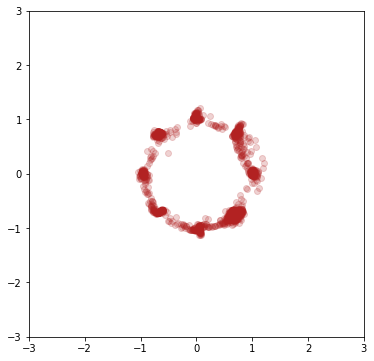

In [ ]:
z_test =  np.random.randn(2000*latent_dim)
z_test = z_test.reshape((2000, latent_dim))

x_test = generator.predict(z_test)

plt.figure(figsize=(6,6))
plt.scatter(x_test[:,0], x_test[:,1], c='firebrick', alpha=0.2)
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.show()

## 考査した問題点
初期は不安定にDとGが揺れますが、早め安定的に収束へ向かっているように見受けられます。

単純にlossを基づいて、モデルの訓練結果を判断できないと思います。
生成された画像は綺麗かどうかも確認必要です。

### モード崩壊
意味：モード崩壊が生じると、すべてのサンプルが一か所に集まり、大量なサンプルが類似してしまい、生成画像の多様性が失うということです。

epochesは600以降、生成された画像はあまり変わらないです。入力された画像と類似した画像ばかりを生成してしまう。

### 勾配消失問題
epochsは3000以降、lossは殆ど変わらないです。
学習が進まず学習不足になる問題だと思います